# Init results

In [11]:
#%%capture
%load_ext autoreload
%autoreload 2
%matplotlib notebook

import os
import cortex
import numpy as np
import matplotlib.pyplot as pl
from matplotlib import cm
import sys
import yaml
import time
from collections import defaultdict as dd
from scipy.stats import sem, ks_2samp
import seaborn as sns
import pandas as pds
import dill
from skimage import filters

opj = os.path.join

sys.path.append("..")

from prfpy.stimulus import PRFStimulus2D
from prfpy.model import Iso2DGaussianModel, CSS_Iso2DGaussianModel, Norm_Iso2DGaussianModel, DoG_Iso2DGaussianModel
from prfpy.fit import Iso2DGaussianFitter, Norm_Iso2DGaussianFitter, DoG_Iso2DGaussianFitter, CSS_Iso2DGaussianFitter

from utils.preproc_utils import *
from utils.postproc_utils import *
from utils.visualize_results import visualize_results

from IPython.core.display import display, HTML

sound_file = '/Users/marcoaqil/Downloads/filling-your-inbox.mp3'

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [12]:
#results object
current_results = results()
                        

## Combine & Process results

In [ ]:
current_results.combine_results(results_folder='/Volumes/Crucial X8/PRFMapping/PRFMapping-Deriv-hires/prfpy/FS7_results/separate_conds_noCV/ZSC', 
                    timecourse_folder='/Volumes/Crucial X8/PRFMapping/PRFMapping-Deriv-hires/prfpy/FS7_results/timecourses/',
                               calculate_CCrsq=False,
                               calculate_noise_ceiling=False)

In [ ]:
current_results.combine_results(results_folder='/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/prfpy/TC', 
                    timecourse_folder='/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/timecourses',
                               calculate_CCrsq=False,
                               calculate_noise_ceiling=False)

In [ ]:
current_results.combine_results(results_folder='/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/prfpy/999999_tc', 
                            timecourse_folder='/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/timecourses',
                               calculate_CCrsq=False,
                               calculate_noise_ceiling=False)

In [ ]:
current_results.combine_results(results_folder='/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/prfpy/crossvalidated_tc', 
                            timecourse_folder='/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/timecourses',
                               calculate_CCrsq=False,
                               calculate_noise_ceiling=True,
                               screenshot_paths = ['/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/HCP_data/7T_RETBAR_small.hdf5'])

In [ ]:
current_results.combine_results(results_folder='/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/prfpy/TC_nocv', 
                            timecourse_folder='/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/timecourses',
                               calculate_CCrsq=False,
                               calculate_noise_ceiling=False)

In [ ]:
current_results.combine_results(results_folder='/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/prfpy/TC_nocv', 
                            timecourse_folder='/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/timecourses',
                               calculate_CCrsq=False,
                               calculate_noise_ceiling=False)

In [ ]:
current_results.combine_results(results_folder='/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/prfpy/allconds_nocv', 
                            timecourse_folder='/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/timecourses',
                               calculate_CCrsq=False,
                               calculate_noise_ceiling=False)

In [38]:
current_results.combine_results(results_folder='/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/prfpy/hrf_fit', 
                                timecourse_folder='/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/timecourses',
                               calculate_CCrsq=False,
                               calculate_noise_ceiling=False)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 146/146 [00:09<00:00, 15.89it/s]


In [39]:
current_results.process_results(current_results.main_dict,
                                compute_suppression_index = False,
                                return_norm_profiles = False)

  0%|                                                                                                                                               | 0/4 [00:00<?, ?it/s]

  0%|                                                                                                                                              | 0/49 [00:00<?, ?it/s]/Users/marcoaqil/prfpy_tools/test/../utils/postproc_utils.py:508: RuntimeWarning: divide by zero encountered in true_divide
  prf = params[...,3] * np.exp(-0.5*x[...,np.newaxis]**2 / params[...,2]**2)
/Users/marcoaqil/prfpy_tools/test/../utils/postproc_utils.py:379: RuntimeWarning: invalid value encountered in true_divide
  processed_results['Size ratio (sigma_2/sigma_1)'][k2][mask] = v2[:,6]/v2[:,2]
/Users/marcoaqil/prfpy_tools/test/../utils/postproc_utils.py:382: RuntimeWarning: invalid value encountered in true_divide
  processed_results['Ratio (B/D)'][k2][mask] = v2[:,7]/v2[:,8]
/Users/marcoaqil/prfpy_tools/test/../utils/postproc_utils.py:383: Ru

 61%|█████████████████████████████████████████████████████████████████████████████████▍                                                   | 30/49 [08:37<05:32, 17.50s/it]

 63%|████████████████████████████████████████████████████████████████████████████████████▏                                                | 31/49 [08:54<05:13, 17.42s/it]

 65%|██████████████████████████████████████████████████████████████████████████████████████▊                                              | 32/49 [09:12<04:57, 17.48s/it]

 67%|█████████████████████████████████████████████████████████████████████████████████████████▌                                           | 33/49 [09:30<04:42, 17.68s/it]

 69%|████████████████████████████████████████████████████████████████████████████████████████████▎                                        | 34/49 [09:47<04:22, 17.53s/it]

 71%|███████████████████████████████████████████████████████████████████████████████████████████████                                      | 

 43%|█████████████████████████████████████████████████████████                                                                            | 21/49 [05:47<07:48, 16.72s/it]

 45%|███████████████████████████████████████████████████████████▋                                                                         | 22/49 [06:04<07:31, 16.74s/it]

 47%|██████████████████████████████████████████████████████████████▍                                                                      | 23/49 [06:21<07:15, 16.73s/it]

 49%|█████████████████████████████████████████████████████████████████▏                                                                   | 24/49 [06:38<06:58, 16.74s/it]

 51%|███████████████████████████████████████████████████████████████████▊                                                                 | 25/49 [06:54<06:41, 16.72s/it]

 53%|██████████████████████████████████████████████████████████████████████▌                                                              | 

# Init visualize results

In [13]:
vis_res = visualize_results(current_results)

## Fix HCP MSMall ordering (run once on HCP data)

In [41]:
#fix HCP ordering
if 'HCP' in vis_res.main_dict:
    hcp_atlas_mask_path = ['/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/HCP_data/atlas/L.atlasroi.59k_fs_LR.shape.gii',
                          '/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/HCP_data/atlas/R.atlasroi.59k_fs_LR.shape.gii']
    vis_res.fix_hcp_ordering(vis_res.main_dict['HCP'], hcp_atlas_mask_path)

## Load previous visualize_result.main_dict

In [14]:
#rsqwm have rsq-weighted means over subjects on fsaverage
#maindict_ #allall, allruns_sepcond_rsqwm, 5050CV, allruns_sepcond_zsc, HCP_181subjects_rsqwm, HCP_999999, 99mean181, 99split20, HCP_cv (tcfit), HCP_tc_nocv
#HCP_allruns_allconds_78sj #HCP_hrffit
with open('/Volumes/Crucial X8/maindict_HCP_hrffit.pickle', 'rb') as handle:
    vis_res.main_dict=dill.load(handle)

## Save current visualize_result.main_dict

In [62]:
with open('/Volumes/Crucial X8/maindict_HCP_hrffit.pickle', 'wb') as handle:
     dill.dump(vis_res.main_dict, handle)

Stopping server


## Load/Save rois (run always)

In [15]:
#this function parses or imports labaled ROIs for all subjects (run always)
#set to list of ROI names to output indices of rois for roi-only fitting. empty list for no output
output_rois = []#['custom.OccPole', 'custom.V1','custom.V2','custom.V3','custom.hV4','custom.VO',
                      #'custom.V3AB','custom.LO','custom.TO','custom.IPS','custom.FO']
    
#import flatmaps from freesurfer, if created, and import freesurfer custom rois to pycortex overlays.svg (need pre-imported flatmaps for this)
import_flatmaps = False

output_rois_path = '/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP' #/Volumes/Crucial X8/PRFMapping/PRFMapping-Deriv-hires
#freesurfer directory
fs_dir = '/Volumes/Crucial X8/PRFMapping/PRFMapping-Deriv-hires/freesurfer'

#HCP atlas path (without .{hemi}.gii)
hcp_atlas_path = '/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/HCP_data/atlas/Q1-Q6_RelatedParcellation210.CorticalAreas_dil_Colors.59k_fs_LR.dlabel' 

vis_res.define_rois_and_flatmaps(fs_dir, output_rois_path, import_flatmaps, output_rois, hcp_atlas_path)
    

Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HC

## Project to fsaverage

In [43]:
#projecting results to fsaverage surface
vis_res.project_to_fsaverage(models = ['Norm_abcd'], #'Noise Ceiling (RSq)'],
                             parameters = ['hrf_1','hrf_2','x_pos', 'y_pos','Norm Param. B','Norm Param. D','Size (sigma_1)','Size (sigma_2)','Amplitude', 'Surround Amplitude','Size (fwhmax)','Surround Size (fwatmin)'],# 'Noise Ceiling'],#[
                             space_names = 'HCP',
                             analysis_names = 'all', 
                             subject_ids = 'all',#['HCP_cvrsq'],#['725751','100610','765864','109123','158136']
                             hcp_atlas_mask_path = ['/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/HCP_data/atlas/L.atlasroi.59k_fs_LR.shape.gii',
                                                    '/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/HCP_data/atlas/R.atlasroi.59k_fs_LR.shape.gii'],
                             hcp_cii_file_path = '/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/HCP_data/100610/MNINonLinear/Results/tfMRI_RETBAR1_7T_AP/tfMRI_RETBAR1_7T_AP_Atlas_1.6mm_MSMAll_hp2000_clean.dtseries.nii',
                             hcp_old_sphere = '/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/HCP_data/atlas/resample_fsaverage/fs_LR-deformed_to-fsaverage.?.sphere.59k_fs_LR.surf.gii',
                             hcp_new_sphere = '/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/HCP_data/atlas/resample_fsaverage/fsaverage_std_sphere.?.164k_fsavg_?.surf.gii',
                             hcp_old_area = '/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/HCP_data/atlas/resample_fsaverage/fs_LR.?.midthickness_va_avg.59k_fs_LR.shape.gii',
                             hcp_new_area = '/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/HCP_data/atlas/resample_fsaverage/fsaverage.?.midthickness_va_avg.164k_fsavg_?.shape.gii',
                             hcp_temp_folder = '/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/temp_files')


 55%|█████████████████████████████████████████████████████████████████████████▎                                                           | 27/49 [03:34<03:04,  8.37s/it]

False
False
HCP fit-task-BAR_fit-runs-all 145834


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 57%|████████████████████████████████████████████████████████████████████████████                                                         | 28/49 [03:42<02:51,  8.18s/it]

False
False
HCP fit-task-BAR_fit-runs-all 146129


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 59%|██████████████████████████████████████████████████████████████████████████████▋                                                      | 29/49 [03:49<02:40,  8.04s/it]

False
False
HCP fit-task-BAR_fit-runs-all 146735


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 61%|█████████████████████████████████████████████████████████████████████████████████▍                                                   | 30/49 [03:57<02:31,  8.00s/it]

False
False
HCP fit-task-BAR_fit-runs-all 146937


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 63%|████████████████████████████████████████████████████████████████████████████████████▏                                                | 31/49 [04:05<02:24,  8.05s/it]

False
False
HCP fit-task-BAR_fit-runs-all 148133


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 65%|██████████████████████████████████████████████████████████████████████████████████████▊                                              | 32/49 [04:13<02:14,  7.92s/it]

False
False
HCP fit-task-BAR_fit-runs-all 150423


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 67%|█████████████████████████████████████████████████████████████████████████████████████████▌                                           | 33/49 [04:20<02:03,  7.73s/it]

False
False
HCP fit-task-BAR_fit-runs-all 155938


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 69%|████████████████████████████████████████████████████████████████████████████████████████████▎                                        | 34/49 [04:28<01:53,  7.58s/it]

False
False
HCP fit-task-BAR_fit-runs-all 156334


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 71%|███████████████████████████████████████████████████████████████████████████████████████████████                                      | 35/49 [04:36<01:48,  7.77s/it]

False
False
HCP fit-task-BAR_fit-runs-all 157336


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 73%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                                   | 36/49 [04:44<01:41,  7.79s/it]

False
False
HCP fit-task-BAR_fit-runs-all 158035


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 76%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                                | 37/49 [04:51<01:33,  7.81s/it]

False
False
HCP fit-task-BAR_fit-runs-all 158136


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 78%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 38/49 [04:59<01:25,  7.81s/it]

False
False
HCP fit-task-BAR_fit-runs-all 159239


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 39/49 [05:07<01:18,  7.88s/it]

False
False
HCP fit-task-BAR_fit-runs-all 162935


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 40/49 [05:16<01:12,  8.02s/it]

False
False
HCP fit-task-BAR_fit-runs-all 164131


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 41/49 [05:24<01:05,  8.13s/it]

False
False
HCP fit-task-BAR_fit-runs-all 164636


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 42/49 [05:32<00:57,  8.18s/it]

False
False
HCP fit-task-BAR_fit-runs-all 165436


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 43/49 [05:40<00:48,  8.12s/it]

False
False
HCP fit-task-BAR_fit-runs-all 167036


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 44/49 [05:48<00:40,  8.06s/it]

False
False
HCP fit-task-BAR_fit-runs-all 167440


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 45/49 [05:56<00:31,  7.92s/it]

False
False
HCP fit-task-BAR_fit-runs-all 169040


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 46/49 [06:04<00:23,  7.97s/it]

False
False
HCP fit-task-BAR_fit-runs-all 169343


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 47/49 [06:12<00:15,  7.99s/it]

False
False
HCP fit-task-BAR_fit-runs-all 169444


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 48/49 [06:20<00:07,  7.96s/it]

False
False
HCP fit-task-BAR_fit-runs-all 169747


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  0%|                                                                                                                                              | 0/49 [00:00<?, ?it/s]

False
False
HCP fit-task-BAR_fit-runs-all 100610


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  2%|██▋                                                                                                                                   | 1/49 [00:07<06:11,  7.75s/it]

False
False
HCP fit-task-BAR_fit-runs-all 102311


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  4%|█████▍                                                                                                                                | 2/49 [00:15<05:52,  7.50s/it]

False
False
HCP fit-task-BAR_fit-runs-all 102816


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  6%|████████▏                                                                                                                             | 3/49 [00:22<05:41,  7.43s/it]

False
False
HCP fit-task-BAR_fit-runs-all 104416


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  8%|██████████▉                                                                                                                           | 4/49 [00:30<05:50,  7.78s/it]

False
False
HCP fit-task-BAR_fit-runs-all 105923


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 10%|█████████████▋                                                                                                                        | 5/49 [00:38<05:48,  7.91s/it]

False
False
HCP fit-task-BAR_fit-runs-all 108323


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 12%|████████████████▍                                                                                                                     | 6/49 [00:46<05:39,  7.90s/it]

False
False
HCP fit-task-BAR_fit-runs-all 109123


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 14%|███████████████████▏                                                                                                                  | 7/49 [00:54<05:30,  7.88s/it]

False
False
HCP fit-task-BAR_fit-runs-all 111514


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 16%|█████████████████████▉                                                                                                                | 8/49 [01:02<05:21,  7.84s/it]

False
False
HCP fit-task-BAR_fit-runs-all 114823


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 18%|████████████████████████▌                                                                                                             | 9/49 [01:11<05:27,  8.18s/it]

False
False
HCP fit-task-BAR_fit-runs-all 115017


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 20%|███████████████████████████▏                                                                                                         | 10/49 [01:18<05:11,  8.00s/it]

False
False
HCP fit-task-BAR_fit-runs-all 115825


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 22%|█████████████████████████████▊                                                                                                       | 11/49 [01:26<04:59,  7.87s/it]

False
False
HCP fit-task-BAR_fit-runs-all 116726


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 24%|████████████████████████████████▌                                                                                                    | 12/49 [01:34<04:49,  7.83s/it]

False
False
HCP fit-task-BAR_fit-runs-all 118225


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 27%|███████████████████████████████████▎                                                                                                 | 13/49 [01:42<04:42,  7.84s/it]

False
False
HCP fit-task-BAR_fit-runs-all 125525


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 29%|██████████████████████████████████████                                                                                               | 14/49 [01:50<04:36,  7.91s/it]

False
False
HCP fit-task-BAR_fit-runs-all 126426


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 31%|████████████████████████████████████████▋                                                                                            | 15/49 [01:58<04:29,  7.94s/it]

False
False
HCP fit-task-BAR_fit-runs-all 128935


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 33%|███████████████████████████████████████████▍                                                                                         | 16/49 [02:06<04:22,  7.94s/it]

False
False
HCP fit-task-BAR_fit-runs-all 130114


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 35%|██████████████████████████████████████████████▏                                                                                      | 17/49 [02:14<04:15,  7.98s/it]

False
False
HCP fit-task-BAR_fit-runs-all 130518


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 37%|████████████████████████████████████████████████▊                                                                                    | 18/49 [02:22<04:10,  8.09s/it]

False
False
HCP fit-task-BAR_fit-runs-all 131217


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 39%|███████████████████████████████████████████████████▌                                                                                 | 19/49 [02:31<04:09,  8.31s/it]

False
False
HCP fit-task-BAR_fit-runs-all 131722


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 41%|██████████████████████████████████████████████████████▎                                                                              | 20/49 [02:40<04:05,  8.46s/it]

False
False
HCP fit-task-BAR_fit-runs-all 132118


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 43%|█████████████████████████████████████████████████████████                                                                            | 21/49 [02:48<03:56,  8.43s/it]

False
False
HCP fit-task-BAR_fit-runs-all 134627


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 45%|███████████████████████████████████████████████████████████▋                                                                         | 22/49 [02:56<03:42,  8.23s/it]

False
False
HCP fit-task-BAR_fit-runs-all 134829


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 47%|██████████████████████████████████████████████████████████████▍                                                                      | 23/49 [03:03<03:28,  8.02s/it]

False
False
HCP fit-task-BAR_fit-runs-all 135124


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 49%|█████████████████████████████████████████████████████████████████▏                                                                   | 24/49 [03:11<03:16,  7.86s/it]

False
False
HCP fit-task-BAR_fit-runs-all 137128


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 51%|███████████████████████████████████████████████████████████████████▊                                                                 | 25/49 [03:18<03:05,  7.72s/it]

False
False
HCP fit-task-BAR_fit-runs-all 140117


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 53%|██████████████████████████████████████████████████████████████████████▌                                                              | 26/49 [03:26<02:55,  7.65s/it]

False
False
HCP fit-task-BAR_fit-runs-all 144226


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 55%|█████████████████████████████████████████████████████████████████████████▎                                                           | 27/49 [03:33<02:46,  7.59s/it]

False
False
HCP fit-task-BAR_fit-runs-all 145834


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 57%|████████████████████████████████████████████████████████████████████████████                                                         | 28/49 [03:41<02:38,  7.53s/it]

False
False
HCP fit-task-BAR_fit-runs-all 146129


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 59%|██████████████████████████████████████████████████████████████████████████████▋                                                      | 29/49 [03:48<02:30,  7.52s/it]

False
False
HCP fit-task-BAR_fit-runs-all 146735


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 61%|█████████████████████████████████████████████████████████████████████████████████▍                                                   | 30/49 [03:55<02:21,  7.47s/it]

False
False
HCP fit-task-BAR_fit-runs-all 146937


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 63%|████████████████████████████████████████████████████████████████████████████████████▏                                                | 31/49 [04:03<02:14,  7.48s/it]

False
False
HCP fit-task-BAR_fit-runs-all 148133


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 65%|██████████████████████████████████████████████████████████████████████████████████████▊                                              | 32/49 [04:10<02:07,  7.49s/it]

False
False
HCP fit-task-BAR_fit-runs-all 150423


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 67%|█████████████████████████████████████████████████████████████████████████████████████████▌                                           | 33/49 [04:18<01:59,  7.44s/it]

False
False
HCP fit-task-BAR_fit-runs-all 155938


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 69%|████████████████████████████████████████████████████████████████████████████████████████████▎                                        | 34/49 [04:25<01:51,  7.44s/it]

False
False
HCP fit-task-BAR_fit-runs-all 156334


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 71%|███████████████████████████████████████████████████████████████████████████████████████████████                                      | 35/49 [04:32<01:43,  7.42s/it]

False
False
HCP fit-task-BAR_fit-runs-all 157336


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 73%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                                   | 36/49 [04:40<01:36,  7.42s/it]

False
False
HCP fit-task-BAR_fit-runs-all 158035


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 76%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                                | 37/49 [04:47<01:29,  7.45s/it]

False
False
HCP fit-task-BAR_fit-runs-all 158136


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 78%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 38/49 [04:55<01:23,  7.63s/it]

False
False
HCP fit-task-BAR_fit-runs-all 159239


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 39/49 [05:03<01:17,  7.71s/it]

False
False
HCP fit-task-BAR_fit-runs-all 162935


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 40/49 [05:12<01:10,  7.85s/it]

False
False
HCP fit-task-BAR_fit-runs-all 164131


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 41/49 [05:20<01:03,  7.89s/it]

False
False
HCP fit-task-BAR_fit-runs-all 164636


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 42/49 [05:27<00:54,  7.79s/it]

False
False
HCP fit-task-BAR_fit-runs-all 165436


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 43/49 [05:35<00:46,  7.75s/it]

False
False
HCP fit-task-BAR_fit-runs-all 167036


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 44/49 [05:42<00:38,  7.70s/it]

False
False
HCP fit-task-BAR_fit-runs-all 167440


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 45/49 [05:50<00:30,  7.66s/it]

False
False
HCP fit-task-BAR_fit-runs-all 169040


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 46/49 [05:58<00:23,  7.68s/it]

False
False
HCP fit-task-BAR_fit-runs-all 169343


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 47/49 [06:05<00:15,  7.73s/it]

False
False
HCP fit-task-BAR_fit-runs-all 169444


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 48/49 [06:13<00:07,  7.79s/it]

False
False
HCP fit-task-BAR_fit-runs-all 169747


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  0%|                                                                                                                                              | 0/49 [00:00<?, ?it/s]

False
False
HCP fit-task-BAR_fit-runs-all 100610


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  2%|██▋                                                                                                                                   | 1/49 [00:07<05:59,  7.48s/it]

False
False
HCP fit-task-BAR_fit-runs-all 102311


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  4%|█████▍                                                                                                                                | 2/49 [00:14<05:52,  7.50s/it]

False
False
HCP fit-task-BAR_fit-runs-all 102816


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  6%|████████▏                                                                                                                             | 3/49 [00:22<05:48,  7.57s/it]

False
False
HCP fit-task-BAR_fit-runs-all 104416


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  8%|██████████▉                                                                                                                           | 4/49 [00:30<05:40,  7.57s/it]

False
False
HCP fit-task-BAR_fit-runs-all 105923


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 10%|█████████████▋                                                                                                                        | 5/49 [00:37<05:32,  7.56s/it]

False
False
HCP fit-task-BAR_fit-runs-all 108323


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 12%|████████████████▍                                                                                                                     | 6/49 [00:45<05:24,  7.56s/it]

False
False
HCP fit-task-BAR_fit-runs-all 109123


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 14%|███████████████████▏                                                                                                                  | 7/49 [00:52<05:15,  7.52s/it]

False
False
HCP fit-task-BAR_fit-runs-all 111514


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 16%|█████████████████████▉                                                                                                                | 8/49 [01:00<05:07,  7.51s/it]

False
False
HCP fit-task-BAR_fit-runs-all 114823


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 18%|████████████████████████▌                                                                                                             | 9/49 [01:07<05:00,  7.50s/it]

False
False
HCP fit-task-BAR_fit-runs-all 115017


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 20%|███████████████████████████▏                                                                                                         | 10/49 [01:15<04:53,  7.53s/it]

False
False
HCP fit-task-BAR_fit-runs-all 115825


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 22%|█████████████████████████████▊                                                                                                       | 11/49 [01:22<04:47,  7.56s/it]

False
False
HCP fit-task-BAR_fit-runs-all 116726


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 24%|████████████████████████████████▌                                                                                                    | 12/49 [01:30<04:41,  7.62s/it]

False
False
HCP fit-task-BAR_fit-runs-all 118225


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 27%|███████████████████████████████████▎                                                                                                 | 13/49 [01:38<04:34,  7.63s/it]

False
False
HCP fit-task-BAR_fit-runs-all 125525


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 29%|██████████████████████████████████████                                                                                               | 14/49 [01:45<04:25,  7.60s/it]

False
False
HCP fit-task-BAR_fit-runs-all 126426


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 31%|████████████████████████████████████████▋                                                                                            | 15/49 [01:53<04:17,  7.58s/it]

False
False
HCP fit-task-BAR_fit-runs-all 128935


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 33%|███████████████████████████████████████████▍                                                                                         | 16/49 [02:00<04:10,  7.58s/it]

False
False
HCP fit-task-BAR_fit-runs-all 130114


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 35%|██████████████████████████████████████████████▏                                                                                      | 17/49 [02:08<04:03,  7.61s/it]

False
False
HCP fit-task-BAR_fit-runs-all 130518


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 37%|████████████████████████████████████████████████▊                                                                                    | 18/49 [02:16<03:56,  7.64s/it]

False
False
HCP fit-task-BAR_fit-runs-all 131217


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 39%|███████████████████████████████████████████████████▌                                                                                 | 19/49 [02:23<03:48,  7.63s/it]

False
False
HCP fit-task-BAR_fit-runs-all 131722


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 41%|██████████████████████████████████████████████████████▎                                                                              | 20/49 [02:31<03:40,  7.59s/it]

False
False
HCP fit-task-BAR_fit-runs-all 132118


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 43%|█████████████████████████████████████████████████████████                                                                            | 21/49 [02:39<03:34,  7.64s/it]

False
False
HCP fit-task-BAR_fit-runs-all 134627


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 45%|███████████████████████████████████████████████████████████▋                                                                         | 22/49 [02:47<03:29,  7.75s/it]

False
False
HCP fit-task-BAR_fit-runs-all 134829


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 47%|██████████████████████████████████████████████████████████████▍                                                                      | 23/49 [02:54<03:21,  7.74s/it]

False
False
HCP fit-task-BAR_fit-runs-all 135124


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 49%|█████████████████████████████████████████████████████████████████▏                                                                   | 24/49 [03:02<03:12,  7.71s/it]

False
False
HCP fit-task-BAR_fit-runs-all 137128


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 51%|███████████████████████████████████████████████████████████████████▊                                                                 | 25/49 [03:10<03:04,  7.70s/it]

False
False
HCP fit-task-BAR_fit-runs-all 140117


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 53%|██████████████████████████████████████████████████████████████████████▌                                                              | 26/49 [03:17<02:56,  7.66s/it]

False
False
HCP fit-task-BAR_fit-runs-all 144226


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 55%|█████████████████████████████████████████████████████████████████████████▎                                                           | 27/49 [03:25<02:48,  7.66s/it]

False
False
HCP fit-task-BAR_fit-runs-all 145834


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 57%|████████████████████████████████████████████████████████████████████████████                                                         | 28/49 [03:33<02:40,  7.64s/it]

False
False
HCP fit-task-BAR_fit-runs-all 146129


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 59%|██████████████████████████████████████████████████████████████████████████████▋                                                      | 29/49 [03:40<02:31,  7.58s/it]

False
False
HCP fit-task-BAR_fit-runs-all 146735


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 61%|█████████████████████████████████████████████████████████████████████████████████▍                                                   | 30/49 [03:48<02:23,  7.58s/it]

False
False
HCP fit-task-BAR_fit-runs-all 146937


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 63%|████████████████████████████████████████████████████████████████████████████████████▏                                                | 31/49 [03:55<02:16,  7.56s/it]

False
False
HCP fit-task-BAR_fit-runs-all 148133


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 65%|██████████████████████████████████████████████████████████████████████████████████████▊                                              | 32/49 [04:03<02:07,  7.51s/it]

False
False
HCP fit-task-BAR_fit-runs-all 150423


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 67%|█████████████████████████████████████████████████████████████████████████████████████████▌                                           | 33/49 [04:10<02:00,  7.51s/it]

False
False
HCP fit-task-BAR_fit-runs-all 155938


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 69%|████████████████████████████████████████████████████████████████████████████████████████████▎                                        | 34/49 [04:18<01:52,  7.51s/it]

False
False
HCP fit-task-BAR_fit-runs-all 156334


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 71%|███████████████████████████████████████████████████████████████████████████████████████████████                                      | 35/49 [04:25<01:44,  7.46s/it]

False
False
HCP fit-task-BAR_fit-runs-all 157336


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 73%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                                   | 36/49 [04:32<01:36,  7.45s/it]

False
False
HCP fit-task-BAR_fit-runs-all 158035


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 76%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                                | 37/49 [04:40<01:29,  7.45s/it]

False
False
HCP fit-task-BAR_fit-runs-all 158136


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 78%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 38/49 [04:48<01:23,  7.61s/it]

False
False
HCP fit-task-BAR_fit-runs-all 159239


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 39/49 [04:56<01:17,  7.73s/it]

False
False
HCP fit-task-BAR_fit-runs-all 162935


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 40/49 [05:03<01:08,  7.64s/it]

False
False
HCP fit-task-BAR_fit-runs-all 164131


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 41/49 [05:11<01:00,  7.55s/it]

False
False
HCP fit-task-BAR_fit-runs-all 164636


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 42/49 [05:18<00:52,  7.54s/it]

False
False
HCP fit-task-BAR_fit-runs-all 165436


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 43/49 [05:26<00:45,  7.55s/it]

False
False
HCP fit-task-BAR_fit-runs-all 167036


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 44/49 [05:33<00:37,  7.50s/it]

False
False
HCP fit-task-BAR_fit-runs-all 167440


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 45/49 [05:40<00:29,  7.50s/it]

False
False
HCP fit-task-BAR_fit-runs-all 169040


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 46/49 [05:48<00:22,  7.51s/it]

False
False
HCP fit-task-BAR_fit-runs-all 169343


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 47/49 [05:55<00:14,  7.48s/it]

False
False
HCP fit-task-BAR_fit-runs-all 169444


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 48/49 [06:03<00:07,  7.45s/it]

False
False
HCP fit-task-BAR_fit-runs-all 169747


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  0%|                                                                                                                                              | 0/48 [00:00<?, ?it/s]

False
False
HCP fit-task-BAR_fit-runs-0 100610


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  2%|██▊                                                                                                                                   | 1/48 [00:07<05:53,  7.53s/it]

False
False
HCP fit-task-BAR_fit-runs-0 102311


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  4%|█████▌                                                                                                                                | 2/48 [00:14<05:43,  7.47s/it]

False
False
HCP fit-task-BAR_fit-runs-0 102816


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  6%|████████▍                                                                                                                             | 3/48 [00:22<05:42,  7.61s/it]

False
False
HCP fit-task-BAR_fit-runs-0 104416


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  8%|███████████▏                                                                                                                          | 4/48 [00:30<05:32,  7.55s/it]

False
False
HCP fit-task-BAR_fit-runs-0 105923


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 10%|█████████████▉                                                                                                                        | 5/48 [00:37<05:20,  7.46s/it]

False
False
HCP fit-task-BAR_fit-runs-0 108323


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 12%|████████████████▊                                                                                                                     | 6/48 [00:44<05:11,  7.42s/it]

False
False
HCP fit-task-BAR_fit-runs-0 109123


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 15%|███████████████████▌                                                                                                                  | 7/48 [00:52<05:02,  7.38s/it]

False
False
HCP fit-task-BAR_fit-runs-0 111514


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 17%|██████████████████████▎                                                                                                               | 8/48 [00:59<04:55,  7.39s/it]

False
False
HCP fit-task-BAR_fit-runs-0 114823


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 19%|█████████████████████████▏                                                                                                            | 9/48 [01:06<04:47,  7.37s/it]

False
False
HCP fit-task-BAR_fit-runs-0 115017


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 21%|███████████████████████████▋                                                                                                         | 10/48 [01:14<04:39,  7.35s/it]

False
False
HCP fit-task-BAR_fit-runs-0 115825


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 23%|██████████████████████████████▍                                                                                                      | 11/48 [01:21<04:32,  7.38s/it]

False
False
HCP fit-task-BAR_fit-runs-0 116726


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 25%|█████████████████████████████████▎                                                                                                   | 12/48 [01:28<04:25,  7.37s/it]

False
False
HCP fit-task-BAR_fit-runs-0 118225


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 27%|████████████████████████████████████                                                                                                 | 13/48 [01:36<04:18,  7.39s/it]

False
False
HCP fit-task-BAR_fit-runs-0 125525


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 29%|██████████████████████████████████████▊                                                                                              | 14/48 [01:43<04:12,  7.43s/it]

False
False
HCP fit-task-BAR_fit-runs-0 126426


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 31%|█████████████████████████████████████████▌                                                                                           | 15/48 [01:51<04:06,  7.47s/it]

False
False
HCP fit-task-BAR_fit-runs-0 128935


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 33%|████████████████████████████████████████████▎                                                                                        | 16/48 [01:59<04:03,  7.59s/it]

False
False
HCP fit-task-BAR_fit-runs-0 130114


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 35%|███████████████████████████████████████████████                                                                                      | 17/48 [02:07<03:57,  7.66s/it]

False
False
HCP fit-task-BAR_fit-runs-0 130518


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 38%|█████████████████████████████████████████████████▉                                                                                   | 18/48 [02:14<03:50,  7.69s/it]

False
False
HCP fit-task-BAR_fit-runs-0 131217


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 40%|████████████████████████████████████████████████████▋                                                                                | 19/48 [02:22<03:45,  7.76s/it]

False
False
HCP fit-task-BAR_fit-runs-0 131722


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 42%|███████████████████████████████████████████████████████▍                                                                             | 20/48 [02:31<03:41,  7.91s/it]

False
False
HCP fit-task-BAR_fit-runs-0 132118


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 44%|██████████████████████████████████████████████████████████▏                                                                          | 21/48 [02:38<03:31,  7.85s/it]

False
False
HCP fit-task-BAR_fit-runs-0 134627


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 46%|████████████████████████████████████████████████████████████▉                                                                        | 22/48 [02:46<03:22,  7.78s/it]

False
False
HCP fit-task-BAR_fit-runs-0 134829


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 48%|███████████████████████████████████████████████████████████████▋                                                                     | 23/48 [02:54<03:13,  7.75s/it]

False
False
HCP fit-task-BAR_fit-runs-0 135124


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 50%|██████████████████████████████████████████████████████████████████▌                                                                  | 24/48 [03:01<03:06,  7.78s/it]

False
False
HCP fit-task-BAR_fit-runs-0 137128


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 52%|█████████████████████████████████████████████████████████████████████▎                                                               | 25/48 [03:09<02:58,  7.77s/it]

False
False
HCP fit-task-BAR_fit-runs-0 140117


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 54%|████████████████████████████████████████████████████████████████████████                                                             | 26/48 [03:17<02:52,  7.86s/it]

False
False
HCP fit-task-BAR_fit-runs-0 144226


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 56%|██████████████████████████████████████████████████████████████████████████▊                                                          | 27/48 [03:25<02:45,  7.89s/it]

False
False
HCP fit-task-BAR_fit-runs-0 145834


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 28/48 [03:34<02:41,  8.06s/it]

False
False
HCP fit-task-BAR_fit-runs-0 146129


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 60%|████████████████████████████████████████████████████████████████████████████████▎                                                    | 29/48 [03:42<02:32,  8.04s/it]

False
False
HCP fit-task-BAR_fit-runs-0 146735


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 62%|███████████████████████████████████████████████████████████████████████████████████▏                                                 | 30/48 [03:50<02:25,  8.11s/it]

False
False
HCP fit-task-BAR_fit-runs-0 146937


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 65%|█████████████████████████████████████████████████████████████████████████████████████▉                                               | 31/48 [03:58<02:16,  8.04s/it]

False
False
HCP fit-task-BAR_fit-runs-0 148133


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 32/48 [04:06<02:07,  7.97s/it]

False
False
HCP fit-task-BAR_fit-runs-0 150423


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 69%|███████████████████████████████████████████████████████████████████████████████████████████▍                                         | 33/48 [04:13<01:58,  7.88s/it]

False
False
HCP fit-task-BAR_fit-runs-0 155938


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 71%|██████████████████████████████████████████████████████████████████████████████████████████████▏                                      | 34/48 [04:21<01:49,  7.85s/it]

False
False
HCP fit-task-BAR_fit-runs-0 156334


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 73%|████████████████████████████████████████████████████████████████████████████████████████████████▉                                    | 35/48 [04:29<01:41,  7.83s/it]

False
False
HCP fit-task-BAR_fit-runs-0 157336


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 36/48 [04:37<01:33,  7.83s/it]

False
False
HCP fit-task-BAR_fit-runs-0 158035


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                              | 37/48 [04:44<01:24,  7.71s/it]

False
False
HCP fit-task-BAR_fit-runs-0 159239


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 38/48 [04:52<01:18,  7.87s/it]

False
False
HCP fit-task-BAR_fit-runs-0 162935


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                         | 39/48 [05:01<01:12,  8.02s/it]

False
False
HCP fit-task-BAR_fit-runs-0 164131


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 40/48 [05:09<01:04,  8.07s/it]

False
False
HCP fit-task-BAR_fit-runs-0 164636


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 41/48 [05:17<00:56,  8.01s/it]

False
False
HCP fit-task-BAR_fit-runs-0 165436


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 42/48 [05:25<00:48,  8.05s/it]

False
False
HCP fit-task-BAR_fit-runs-0 167036


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 43/48 [05:33<00:39,  7.95s/it]

False
False
HCP fit-task-BAR_fit-runs-0 167440


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 44/48 [05:40<00:31,  7.88s/it]

False
False
HCP fit-task-BAR_fit-runs-0 169040


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 45/48 [05:48<00:23,  7.86s/it]

False
False
HCP fit-task-BAR_fit-runs-0 169343


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 46/48 [05:56<00:15,  7.83s/it]

False
False
HCP fit-task-BAR_fit-runs-0 169444


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 47/48 [06:04<00:07,  7.89s/it]

False
False
HCP fit-task-BAR_fit-runs-0 169747


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  0%|                                                                                                                                              | 0/48 [00:00<?, ?it/s]

False
False
HCP fit-task-BAR_fit-runs-0 100610


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  2%|██▊                                                                                                                                   | 1/48 [00:08<06:17,  8.02s/it]

False
False
HCP fit-task-BAR_fit-runs-0 102311


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  4%|█████▌                                                                                                                                | 2/48 [00:16<06:18,  8.23s/it]

False
False
HCP fit-task-BAR_fit-runs-0 102816


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  6%|████████▍                                                                                                                             | 3/48 [00:25<06:24,  8.55s/it]

False
False
HCP fit-task-BAR_fit-runs-0 104416


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  8%|███████████▏                                                                                                                          | 4/48 [00:33<06:17,  8.58s/it]

False
False
HCP fit-task-BAR_fit-runs-0 105923


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 10%|█████████████▉                                                                                                                        | 5/48 [00:43<06:22,  8.89s/it]

False
False
HCP fit-task-BAR_fit-runs-0 108323


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 12%|████████████████▊                                                                                                                     | 6/48 [00:52<06:14,  8.91s/it]

False
False
HCP fit-task-BAR_fit-runs-0 109123


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 15%|███████████████████▌                                                                                                                  | 7/48 [01:00<05:59,  8.76s/it]

False
False
HCP fit-task-BAR_fit-runs-0 111514


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 17%|██████████████████████▎                                                                                                               | 8/48 [01:10<06:01,  9.04s/it]

False
False
HCP fit-task-BAR_fit-runs-0 114823


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 19%|█████████████████████████▏                                                                                                            | 9/48 [01:18<05:43,  8.80s/it]

False
False
HCP fit-task-BAR_fit-runs-0 115017


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 21%|███████████████████████████▋                                                                                                         | 10/48 [01:26<05:20,  8.44s/it]

False
False
HCP fit-task-BAR_fit-runs-0 115825


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 23%|██████████████████████████████▍                                                                                                      | 11/48 [01:34<05:07,  8.32s/it]

False
False
HCP fit-task-BAR_fit-runs-0 116726


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 25%|█████████████████████████████████▎                                                                                                   | 12/48 [01:41<04:50,  8.08s/it]

False
False
HCP fit-task-BAR_fit-runs-0 118225


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 27%|████████████████████████████████████                                                                                                 | 13/48 [01:49<04:36,  7.90s/it]

False
False
HCP fit-task-BAR_fit-runs-0 125525


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 29%|██████████████████████████████████████▊                                                                                              | 14/48 [01:56<04:25,  7.79s/it]

False
False
HCP fit-task-BAR_fit-runs-0 126426


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 31%|█████████████████████████████████████████▌                                                                                           | 15/48 [02:04<04:17,  7.81s/it]

False
False
HCP fit-task-BAR_fit-runs-0 128935


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 33%|████████████████████████████████████████████▎                                                                                        | 16/48 [02:12<04:08,  7.78s/it]

False
False
HCP fit-task-BAR_fit-runs-0 130114


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 35%|███████████████████████████████████████████████                                                                                      | 17/48 [02:20<04:04,  7.88s/it]

False
False
HCP fit-task-BAR_fit-runs-0 130518


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 38%|█████████████████████████████████████████████████▉                                                                                   | 18/48 [02:29<04:02,  8.08s/it]

False
False
HCP fit-task-BAR_fit-runs-0 131217


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 40%|████████████████████████████████████████████████████▋                                                                                | 19/48 [02:36<03:50,  7.94s/it]

False
False
HCP fit-task-BAR_fit-runs-0 131722


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 42%|███████████████████████████████████████████████████████▍                                                                             | 20/48 [02:44<03:39,  7.85s/it]

False
False
HCP fit-task-BAR_fit-runs-0 132118


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 44%|██████████████████████████████████████████████████████████▏                                                                          | 21/48 [02:51<03:29,  7.75s/it]

False
False
HCP fit-task-BAR_fit-runs-0 134627


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 46%|████████████████████████████████████████████████████████████▉                                                                        | 22/48 [02:59<03:19,  7.66s/it]

False
False
HCP fit-task-BAR_fit-runs-0 134829


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 48%|███████████████████████████████████████████████████████████████▋                                                                     | 23/48 [03:07<03:11,  7.65s/it]

False
False
HCP fit-task-BAR_fit-runs-0 135124


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 50%|██████████████████████████████████████████████████████████████████▌                                                                  | 24/48 [03:14<03:03,  7.65s/it]

False
False
HCP fit-task-BAR_fit-runs-0 137128


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 52%|█████████████████████████████████████████████████████████████████████▎                                                               | 25/48 [03:22<02:55,  7.64s/it]

False
False
HCP fit-task-BAR_fit-runs-0 140117


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 54%|████████████████████████████████████████████████████████████████████████                                                             | 26/48 [03:30<02:49,  7.69s/it]

False
False
HCP fit-task-BAR_fit-runs-0 144226


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 56%|██████████████████████████████████████████████████████████████████████████▊                                                          | 27/48 [03:37<02:41,  7.69s/it]

False
False
HCP fit-task-BAR_fit-runs-0 145834


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 28/48 [03:45<02:33,  7.65s/it]

False
False
HCP fit-task-BAR_fit-runs-0 146129


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 60%|████████████████████████████████████████████████████████████████████████████████▎                                                    | 29/48 [03:52<02:25,  7.64s/it]

False
False
HCP fit-task-BAR_fit-runs-0 146735


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 62%|███████████████████████████████████████████████████████████████████████████████████▏                                                 | 30/48 [04:00<02:17,  7.64s/it]

False
False
HCP fit-task-BAR_fit-runs-0 146937


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 65%|█████████████████████████████████████████████████████████████████████████████████████▉                                               | 31/48 [04:08<02:09,  7.60s/it]

False
False
HCP fit-task-BAR_fit-runs-0 148133


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 32/48 [04:15<02:01,  7.62s/it]

False
False
HCP fit-task-BAR_fit-runs-0 150423


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 69%|███████████████████████████████████████████████████████████████████████████████████████████▍                                         | 33/48 [04:23<01:54,  7.60s/it]

False
False
HCP fit-task-BAR_fit-runs-0 155938


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 71%|██████████████████████████████████████████████████████████████████████████████████████████████▏                                      | 34/48 [04:30<01:46,  7.62s/it]

False
False
HCP fit-task-BAR_fit-runs-0 156334


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 73%|████████████████████████████████████████████████████████████████████████████████████████████████▉                                    | 35/48 [04:38<01:39,  7.64s/it]

False
False
HCP fit-task-BAR_fit-runs-0 157336


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 36/48 [04:46<01:31,  7.65s/it]

False
False
HCP fit-task-BAR_fit-runs-0 158035


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                              | 37/48 [04:53<01:23,  7.61s/it]

False
False
HCP fit-task-BAR_fit-runs-0 159239


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 38/48 [05:01<01:16,  7.65s/it]

False
False
HCP fit-task-BAR_fit-runs-0 162935


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                         | 39/48 [05:09<01:09,  7.77s/it]

False
False
HCP fit-task-BAR_fit-runs-0 164131


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 40/48 [05:17<01:01,  7.72s/it]

False
False
HCP fit-task-BAR_fit-runs-0 164636


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 41/48 [05:24<00:53,  7.70s/it]

False
False
HCP fit-task-BAR_fit-runs-0 165436


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 42/48 [05:32<00:46,  7.72s/it]

False
False
HCP fit-task-BAR_fit-runs-0 167036


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 43/48 [05:40<00:38,  7.76s/it]

False
False
HCP fit-task-BAR_fit-runs-0 167440


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 44/48 [05:48<00:31,  7.87s/it]

False
False
HCP fit-task-BAR_fit-runs-0 169040


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 45/48 [05:56<00:23,  7.89s/it]

False
False
HCP fit-task-BAR_fit-runs-0 169343


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 46/48 [06:04<00:15,  7.83s/it]

False
False
HCP fit-task-BAR_fit-runs-0 169444


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 47/48 [06:12<00:07,  7.88s/it]

False
False
HCP fit-task-BAR_fit-runs-0 169747


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  0%|                                                                                                                                              | 0/48 [00:00<?, ?it/s]

False
False
HCP fit-task-BAR_fit-runs-0 100610


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  2%|██▊                                                                                                                                   | 1/48 [00:07<06:13,  7.94s/it]

False
False
HCP fit-task-BAR_fit-runs-0 102311


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  4%|█████▌                                                                                                                                | 2/48 [00:15<05:58,  7.79s/it]

False
False
HCP fit-task-BAR_fit-runs-0 102816


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  6%|████████▍                                                                                                                             | 3/48 [00:23<05:43,  7.64s/it]

False
False
HCP fit-task-BAR_fit-runs-0 104416


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  8%|███████████▏                                                                                                                          | 4/48 [00:30<05:29,  7.48s/it]

False
False
HCP fit-task-BAR_fit-runs-0 105923


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 10%|█████████████▉                                                                                                                        | 5/48 [00:38<05:29,  7.66s/it]

False
False
HCP fit-task-BAR_fit-runs-0 108323


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 12%|████████████████▊                                                                                                                     | 6/48 [00:46<05:29,  7.86s/it]

False
False
HCP fit-task-BAR_fit-runs-0 109123


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 15%|███████████████████▌                                                                                                                  | 7/48 [00:54<05:26,  7.96s/it]

False
False
HCP fit-task-BAR_fit-runs-0 111514


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 17%|██████████████████████▎                                                                                                               | 8/48 [01:02<05:14,  7.87s/it]

False
False
HCP fit-task-BAR_fit-runs-0 114823


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 19%|█████████████████████████▏                                                                                                            | 9/48 [01:10<05:04,  7.80s/it]

False
False
HCP fit-task-BAR_fit-runs-0 115017


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 21%|███████████████████████████▋                                                                                                         | 10/48 [01:17<04:51,  7.68s/it]

False
False
HCP fit-task-BAR_fit-runs-0 115825


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 23%|██████████████████████████████▍                                                                                                      | 11/48 [01:24<04:42,  7.63s/it]

False
False
HCP fit-task-BAR_fit-runs-0 116726


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 25%|█████████████████████████████████▎                                                                                                   | 12/48 [01:32<04:33,  7.59s/it]

False
False
HCP fit-task-BAR_fit-runs-0 118225


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 27%|████████████████████████████████████                                                                                                 | 13/48 [01:39<04:24,  7.56s/it]

False
False
HCP fit-task-BAR_fit-runs-0 125525


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 29%|██████████████████████████████████████▊                                                                                              | 14/48 [01:47<04:17,  7.56s/it]

False
False
HCP fit-task-BAR_fit-runs-0 126426


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 31%|█████████████████████████████████████████▌                                                                                           | 15/48 [01:55<04:10,  7.58s/it]

False
False
HCP fit-task-BAR_fit-runs-0 128935


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 33%|████████████████████████████████████████████▎                                                                                        | 16/48 [02:03<04:12,  7.89s/it]

False
False
HCP fit-task-BAR_fit-runs-0 130114


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 35%|███████████████████████████████████████████████                                                                                      | 17/48 [02:11<04:07,  7.97s/it]

False
False
HCP fit-task-BAR_fit-runs-0 130518


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 38%|█████████████████████████████████████████████████▉                                                                                   | 18/48 [02:19<03:56,  7.89s/it]

False
False
HCP fit-task-BAR_fit-runs-0 131217


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 40%|████████████████████████████████████████████████████▋                                                                                | 19/48 [02:27<03:46,  7.81s/it]

False
False
HCP fit-task-BAR_fit-runs-0 131722


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 42%|███████████████████████████████████████████████████████▍                                                                             | 20/48 [02:34<03:38,  7.79s/it]

False
False
HCP fit-task-BAR_fit-runs-0 132118


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 44%|██████████████████████████████████████████████████████████▏                                                                          | 21/48 [02:42<03:29,  7.76s/it]

False
False
HCP fit-task-BAR_fit-runs-0 134627


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 46%|████████████████████████████████████████████████████████████▉                                                                        | 22/48 [02:50<03:19,  7.67s/it]

False
False
HCP fit-task-BAR_fit-runs-0 134829


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 48%|███████████████████████████████████████████████████████████████▋                                                                     | 23/48 [02:57<03:11,  7.68s/it]

False
False
HCP fit-task-BAR_fit-runs-0 135124


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 50%|██████████████████████████████████████████████████████████████████▌                                                                  | 24/48 [03:05<03:03,  7.65s/it]

False
False
HCP fit-task-BAR_fit-runs-0 137128


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 52%|█████████████████████████████████████████████████████████████████████▎                                                               | 25/48 [03:12<02:54,  7.61s/it]

False
False
HCP fit-task-BAR_fit-runs-0 140117


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 54%|████████████████████████████████████████████████████████████████████████                                                             | 26/48 [03:20<02:47,  7.61s/it]

False
False
HCP fit-task-BAR_fit-runs-0 144226


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 56%|██████████████████████████████████████████████████████████████████████████▊                                                          | 27/48 [03:28<02:40,  7.62s/it]

False
False
HCP fit-task-BAR_fit-runs-0 145834


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 28/48 [03:35<02:32,  7.60s/it]

False
False
HCP fit-task-BAR_fit-runs-0 146129


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 60%|████████████████████████████████████████████████████████████████████████████████▎                                                    | 29/48 [03:43<02:24,  7.62s/it]

False
False
HCP fit-task-BAR_fit-runs-0 146735


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 62%|███████████████████████████████████████████████████████████████████████████████████▏                                                 | 30/48 [03:51<02:18,  7.70s/it]

False
False
HCP fit-task-BAR_fit-runs-0 146937


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 65%|█████████████████████████████████████████████████████████████████████████████████████▉                                               | 31/48 [03:59<02:12,  7.79s/it]

False
False
HCP fit-task-BAR_fit-runs-0 148133


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 32/48 [04:07<02:04,  7.77s/it]

False
False
HCP fit-task-BAR_fit-runs-0 150423


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 69%|███████████████████████████████████████████████████████████████████████████████████████████▍                                         | 33/48 [04:14<01:55,  7.69s/it]

False
False
HCP fit-task-BAR_fit-runs-0 155938


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 71%|██████████████████████████████████████████████████████████████████████████████████████████████▏                                      | 34/48 [04:21<01:46,  7.60s/it]

False
False
HCP fit-task-BAR_fit-runs-0 156334


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 73%|████████████████████████████████████████████████████████████████████████████████████████████████▉                                    | 35/48 [04:29<01:38,  7.61s/it]

False
False
HCP fit-task-BAR_fit-runs-0 157336


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 36/48 [04:37<01:31,  7.63s/it]

False
False
HCP fit-task-BAR_fit-runs-0 158035


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                              | 37/48 [04:44<01:23,  7.60s/it]

False
False
HCP fit-task-BAR_fit-runs-0 159239


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 38/48 [04:52<01:15,  7.58s/it]

False
False
HCP fit-task-BAR_fit-runs-0 162935


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                         | 39/48 [05:00<01:08,  7.66s/it]

False
False
HCP fit-task-BAR_fit-runs-0 164131


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 40/48 [05:07<01:01,  7.67s/it]

False
False
HCP fit-task-BAR_fit-runs-0 164636


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 41/48 [05:15<00:53,  7.63s/it]

False
False
HCP fit-task-BAR_fit-runs-0 165436


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 42/48 [05:23<00:45,  7.67s/it]

False
False
HCP fit-task-BAR_fit-runs-0 167036


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 43/48 [05:30<00:38,  7.62s/it]

False
False
HCP fit-task-BAR_fit-runs-0 167440


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 44/48 [05:38<00:30,  7.62s/it]

False
False
HCP fit-task-BAR_fit-runs-0 169040


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 45/48 [05:45<00:22,  7.61s/it]

False
False
HCP fit-task-BAR_fit-runs-0 169343


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 46/48 [05:53<00:15,  7.56s/it]

False
False
HCP fit-task-BAR_fit-runs-0 169444


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 47/48 [06:01<00:07,  7.88s/it]

False
False
HCP fit-task-BAR_fit-runs-0 169747


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  0%|                                                                                                                                              | 0/48 [00:00<?, ?it/s]

False
False
HCP fit-task-BAR_fit-runs-0 100610


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  2%|██▊                                                                                                                                   | 1/48 [00:07<05:55,  7.56s/it]

False
False
HCP fit-task-BAR_fit-runs-0 102311


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  4%|█████▌                                                                                                                                | 2/48 [00:15<05:51,  7.64s/it]

False
False
HCP fit-task-BAR_fit-runs-0 102816


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  6%|████████▍                                                                                                                             | 3/48 [00:22<05:43,  7.64s/it]

False
False
HCP fit-task-BAR_fit-runs-0 104416


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  8%|███████████▏                                                                                                                          | 4/48 [00:30<05:35,  7.63s/it]

False
False
HCP fit-task-BAR_fit-runs-0 105923


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 10%|█████████████▉                                                                                                                        | 5/48 [00:38<05:29,  7.67s/it]

False
False
HCP fit-task-BAR_fit-runs-0 108323


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 12%|████████████████▊                                                                                                                     | 6/48 [00:46<05:28,  7.83s/it]

False
False
HCP fit-task-BAR_fit-runs-0 109123


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 15%|███████████████████▌                                                                                                                  | 7/48 [00:53<05:16,  7.72s/it]

False
False
HCP fit-task-BAR_fit-runs-0 111514


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 17%|██████████████████████▎                                                                                                               | 8/48 [01:01<05:08,  7.70s/it]

False
False
HCP fit-task-BAR_fit-runs-0 114823


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 19%|█████████████████████████▏                                                                                                            | 9/48 [01:09<04:59,  7.68s/it]

False
False
HCP fit-task-BAR_fit-runs-0 115017


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 21%|███████████████████████████▋                                                                                                         | 10/48 [01:16<04:49,  7.61s/it]

False
False
HCP fit-task-BAR_fit-runs-0 115825


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 23%|██████████████████████████████▍                                                                                                      | 11/48 [01:24<04:41,  7.61s/it]

False
False
HCP fit-task-BAR_fit-runs-0 116726


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 25%|█████████████████████████████████▎                                                                                                   | 12/48 [01:31<04:33,  7.59s/it]

False
False
HCP fit-task-BAR_fit-runs-0 118225


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 27%|████████████████████████████████████                                                                                                 | 13/48 [01:39<04:25,  7.58s/it]

False
False
HCP fit-task-BAR_fit-runs-0 125525


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 29%|██████████████████████████████████████▊                                                                                              | 14/48 [01:46<04:18,  7.60s/it]

False
False
HCP fit-task-BAR_fit-runs-0 126426


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 31%|█████████████████████████████████████████▌                                                                                           | 15/48 [01:54<04:11,  7.62s/it]

False
False
HCP fit-task-BAR_fit-runs-0 128935


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 33%|████████████████████████████████████████████▎                                                                                        | 16/48 [02:02<04:05,  7.68s/it]

False
False
HCP fit-task-BAR_fit-runs-0 130114


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 35%|███████████████████████████████████████████████                                                                                      | 17/48 [02:10<03:57,  7.68s/it]

False
False
HCP fit-task-BAR_fit-runs-0 130518


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 38%|█████████████████████████████████████████████████▉                                                                                   | 18/48 [02:17<03:50,  7.69s/it]

False
False
HCP fit-task-BAR_fit-runs-0 131217


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 40%|████████████████████████████████████████████████████▋                                                                                | 19/48 [02:25<03:40,  7.61s/it]

False
False
HCP fit-task-BAR_fit-runs-0 131722


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 42%|███████████████████████████████████████████████████████▍                                                                             | 20/48 [02:32<03:33,  7.62s/it]

False
False
HCP fit-task-BAR_fit-runs-0 132118


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 44%|██████████████████████████████████████████████████████████▏                                                                          | 21/48 [02:40<03:26,  7.65s/it]

False
False
HCP fit-task-BAR_fit-runs-0 134627


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 46%|████████████████████████████████████████████████████████████▉                                                                        | 22/48 [02:48<03:18,  7.65s/it]

False
False
HCP fit-task-BAR_fit-runs-0 134829


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 48%|███████████████████████████████████████████████████████████████▋                                                                     | 23/48 [02:56<03:11,  7.67s/it]

False
False
HCP fit-task-BAR_fit-runs-0 135124


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 50%|██████████████████████████████████████████████████████████████████▌                                                                  | 24/48 [03:03<03:04,  7.68s/it]

False
False
HCP fit-task-BAR_fit-runs-0 137128


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 52%|█████████████████████████████████████████████████████████████████████▎                                                               | 25/48 [03:11<02:55,  7.64s/it]

False
False
HCP fit-task-BAR_fit-runs-0 140117


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 54%|████████████████████████████████████████████████████████████████████████                                                             | 26/48 [03:19<02:48,  7.67s/it]

False
False
HCP fit-task-BAR_fit-runs-0 144226


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 56%|██████████████████████████████████████████████████████████████████████████▊                                                          | 27/48 [03:26<02:41,  7.68s/it]

False
False
HCP fit-task-BAR_fit-runs-0 145834


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 28/48 [03:34<02:33,  7.70s/it]

False
False
HCP fit-task-BAR_fit-runs-0 146129


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 60%|████████████████████████████████████████████████████████████████████████████████▎                                                    | 29/48 [03:42<02:26,  7.73s/it]

False
False
HCP fit-task-BAR_fit-runs-0 146735


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 62%|███████████████████████████████████████████████████████████████████████████████████▏                                                 | 30/48 [03:50<02:19,  7.77s/it]

False
False
HCP fit-task-BAR_fit-runs-0 146937


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 65%|█████████████████████████████████████████████████████████████████████████████████████▉                                               | 31/48 [03:57<02:11,  7.71s/it]

False
False
HCP fit-task-BAR_fit-runs-0 148133


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 32/48 [04:05<02:02,  7.67s/it]

False
False
HCP fit-task-BAR_fit-runs-0 150423


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 69%|███████████████████████████████████████████████████████████████████████████████████████████▍                                         | 33/48 [04:13<01:55,  7.72s/it]

False
False
HCP fit-task-BAR_fit-runs-0 155938


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 71%|██████████████████████████████████████████████████████████████████████████████████████████████▏                                      | 34/48 [04:20<01:47,  7.70s/it]

False
False
HCP fit-task-BAR_fit-runs-0 156334


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 73%|████████████████████████████████████████████████████████████████████████████████████████████████▉                                    | 35/48 [04:28<01:40,  7.71s/it]

False
False
HCP fit-task-BAR_fit-runs-0 157336


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 36/48 [04:36<01:32,  7.70s/it]

False
False
HCP fit-task-BAR_fit-runs-0 158035


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                              | 37/48 [04:43<01:24,  7.65s/it]

False
False
HCP fit-task-BAR_fit-runs-0 159239


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 38/48 [04:51<01:17,  7.70s/it]

False
False
HCP fit-task-BAR_fit-runs-0 162935


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                         | 39/48 [04:58<01:08,  7.62s/it]

False
False
HCP fit-task-BAR_fit-runs-0 164131


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 40/48 [05:06<01:00,  7.55s/it]

False
False
HCP fit-task-BAR_fit-runs-0 164636


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 41/48 [05:13<00:52,  7.54s/it]

False
False
HCP fit-task-BAR_fit-runs-0 165436


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 42/48 [05:21<00:45,  7.53s/it]

False
False
HCP fit-task-BAR_fit-runs-0 167036


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 43/48 [05:28<00:37,  7.51s/it]

False
False
HCP fit-task-BAR_fit-runs-0 167440


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 44/48 [05:36<00:29,  7.49s/it]

False
False
HCP fit-task-BAR_fit-runs-0 169040


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 45/48 [05:43<00:22,  7.51s/it]

False
False
HCP fit-task-BAR_fit-runs-0 169343


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 46/48 [05:51<00:14,  7.45s/it]

False
False
HCP fit-task-BAR_fit-runs-0 169444


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 47/48 [05:58<00:07,  7.44s/it]

False
False
HCP fit-task-BAR_fit-runs-0 169747


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  0%|                                                                                                                                              | 0/48 [00:00<?, ?it/s]

False
False
HCP fit-task-BAR_fit-runs-0 100610


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  2%|██▊                                                                                                                                   | 1/48 [00:07<05:45,  7.36s/it]

False
False
HCP fit-task-BAR_fit-runs-0 102311


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  4%|█████▌                                                                                                                                | 2/48 [00:14<05:41,  7.42s/it]

False
False
HCP fit-task-BAR_fit-runs-0 102816


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  6%|████████▍                                                                                                                             | 3/48 [00:22<05:33,  7.42s/it]

False
False
HCP fit-task-BAR_fit-runs-0 104416


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  8%|███████████▏                                                                                                                          | 4/48 [00:29<05:25,  7.40s/it]

False
False
HCP fit-task-BAR_fit-runs-0 105923


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 10%|█████████████▉                                                                                                                        | 5/48 [00:36<05:17,  7.39s/it]

False
False
HCP fit-task-BAR_fit-runs-0 108323


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 12%|████████████████▊                                                                                                                     | 6/48 [00:44<05:11,  7.41s/it]

False
False
HCP fit-task-BAR_fit-runs-0 109123


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 15%|███████████████████▌                                                                                                                  | 7/48 [00:51<05:03,  7.41s/it]

False
False
HCP fit-task-BAR_fit-runs-0 111514


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 17%|██████████████████████▎                                                                                                               | 8/48 [00:59<04:56,  7.40s/it]

False
False
HCP fit-task-BAR_fit-runs-0 114823


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 19%|█████████████████████████▏                                                                                                            | 9/48 [01:06<04:49,  7.42s/it]

False
False
HCP fit-task-BAR_fit-runs-0 115017


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 21%|███████████████████████████▋                                                                                                         | 10/48 [01:13<04:40,  7.38s/it]

False
False
HCP fit-task-BAR_fit-runs-0 115825


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 23%|██████████████████████████████▍                                                                                                      | 11/48 [01:21<04:32,  7.38s/it]

False
False
HCP fit-task-BAR_fit-runs-0 116726


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 25%|█████████████████████████████████▎                                                                                                   | 12/48 [01:28<04:26,  7.39s/it]

False
False
HCP fit-task-BAR_fit-runs-0 118225


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 27%|████████████████████████████████████                                                                                                 | 13/48 [01:36<04:17,  7.37s/it]

False
False
HCP fit-task-BAR_fit-runs-0 125525


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 29%|██████████████████████████████████████▊                                                                                              | 14/48 [01:43<04:13,  7.45s/it]

False
False
HCP fit-task-BAR_fit-runs-0 126426


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 31%|█████████████████████████████████████████▌                                                                                           | 15/48 [01:51<04:07,  7.49s/it]

False
False
HCP fit-task-BAR_fit-runs-0 128935


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 33%|████████████████████████████████████████████▎                                                                                        | 16/48 [01:58<03:59,  7.48s/it]

False
False
HCP fit-task-BAR_fit-runs-0 130114


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 35%|███████████████████████████████████████████████                                                                                      | 17/48 [02:06<03:51,  7.46s/it]

False
False
HCP fit-task-BAR_fit-runs-0 130518


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 38%|█████████████████████████████████████████████████▉                                                                                   | 18/48 [02:13<03:43,  7.45s/it]

False
False
HCP fit-task-BAR_fit-runs-0 131217


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 40%|████████████████████████████████████████████████████▋                                                                                | 19/48 [02:20<03:34,  7.41s/it]

False
False
HCP fit-task-BAR_fit-runs-0 131722


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 42%|███████████████████████████████████████████████████████▍                                                                             | 20/48 [02:28<03:27,  7.39s/it]

False
False
HCP fit-task-BAR_fit-runs-0 132118


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 44%|██████████████████████████████████████████████████████████▏                                                                          | 21/48 [02:35<03:19,  7.39s/it]

False
False
HCP fit-task-BAR_fit-runs-0 134627


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 46%|████████████████████████████████████████████████████████████▉                                                                        | 22/48 [02:42<03:11,  7.37s/it]

False
False
HCP fit-task-BAR_fit-runs-0 134829


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 48%|███████████████████████████████████████████████████████████████▋                                                                     | 23/48 [02:50<03:04,  7.38s/it]

False
False
HCP fit-task-BAR_fit-runs-0 135124


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 50%|██████████████████████████████████████████████████████████████████▌                                                                  | 24/48 [02:57<02:56,  7.37s/it]

False
False
HCP fit-task-BAR_fit-runs-0 137128


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 52%|█████████████████████████████████████████████████████████████████████▎                                                               | 25/48 [03:04<02:48,  7.32s/it]

False
False
HCP fit-task-BAR_fit-runs-0 140117


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 54%|████████████████████████████████████████████████████████████████████████                                                             | 26/48 [03:12<02:41,  7.33s/it]

False
False
HCP fit-task-BAR_fit-runs-0 144226


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 56%|██████████████████████████████████████████████████████████████████████████▊                                                          | 27/48 [03:19<02:34,  7.35s/it]

False
False
HCP fit-task-BAR_fit-runs-0 145834


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 28/48 [03:27<02:26,  7.34s/it]

False
False
HCP fit-task-BAR_fit-runs-0 146129


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 60%|████████████████████████████████████████████████████████████████████████████████▎                                                    | 29/48 [03:34<02:19,  7.36s/it]

False
False
HCP fit-task-BAR_fit-runs-0 146735


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 62%|███████████████████████████████████████████████████████████████████████████████████▏                                                 | 30/48 [03:42<02:13,  7.44s/it]

False
False
HCP fit-task-BAR_fit-runs-0 146937


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 65%|█████████████████████████████████████████████████████████████████████████████████████▉                                               | 31/48 [03:50<02:10,  7.66s/it]

False
False
HCP fit-task-BAR_fit-runs-0 148133


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 32/48 [03:57<02:01,  7.60s/it]

False
False
HCP fit-task-BAR_fit-runs-0 150423


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 69%|███████████████████████████████████████████████████████████████████████████████████████████▍                                         | 33/48 [04:05<01:53,  7.58s/it]

False
False
HCP fit-task-BAR_fit-runs-0 155938


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 71%|██████████████████████████████████████████████████████████████████████████████████████████████▏                                      | 34/48 [04:12<01:45,  7.53s/it]

False
False
HCP fit-task-BAR_fit-runs-0 156334


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 73%|████████████████████████████████████████████████████████████████████████████████████████████████▉                                    | 35/48 [04:20<01:38,  7.54s/it]

False
False
HCP fit-task-BAR_fit-runs-0 157336


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 36/48 [04:28<01:31,  7.67s/it]

False
False
HCP fit-task-BAR_fit-runs-0 158035


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                              | 37/48 [04:36<01:26,  7.86s/it]

False
False
HCP fit-task-BAR_fit-runs-0 159239


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 38/48 [04:43<01:17,  7.75s/it]

False
False
HCP fit-task-BAR_fit-runs-0 162935


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                         | 39/48 [04:52<01:11,  7.92s/it]

False
False
HCP fit-task-BAR_fit-runs-0 164131


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 40/48 [04:59<01:02,  7.84s/it]

False
False
HCP fit-task-BAR_fit-runs-0 164636


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 41/48 [05:07<00:54,  7.72s/it]

False
False
HCP fit-task-BAR_fit-runs-0 165436


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 42/48 [05:15<00:46,  7.71s/it]

False
False
HCP fit-task-BAR_fit-runs-0 167036


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 43/48 [05:22<00:38,  7.62s/it]

False
False
HCP fit-task-BAR_fit-runs-0 167440


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 44/48 [05:29<00:30,  7.58s/it]

False
False
HCP fit-task-BAR_fit-runs-0 169040


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 45/48 [05:37<00:22,  7.57s/it]

False
False
HCP fit-task-BAR_fit-runs-0 169343


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 46/48 [05:44<00:15,  7.54s/it]

False
False
HCP fit-task-BAR_fit-runs-0 169444


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 47/48 [05:52<00:07,  7.48s/it]

False
False
HCP fit-task-BAR_fit-runs-0 169747


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  0%|                                                                                                                                              | 0/48 [00:00<?, ?it/s]

False
False
HCP fit-task-BAR_fit-runs-0 100610


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  2%|██▊                                                                                                                                   | 1/48 [00:07<05:47,  7.40s/it]

False
False
HCP fit-task-BAR_fit-runs-0 102311


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  4%|█████▌                                                                                                                                | 2/48 [00:14<05:41,  7.43s/it]

False
False
HCP fit-task-BAR_fit-runs-0 102816


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  6%|████████▍                                                                                                                             | 3/48 [00:22<05:34,  7.43s/it]

False
False
HCP fit-task-BAR_fit-runs-0 104416


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  8%|███████████▏                                                                                                                          | 4/48 [00:29<05:26,  7.43s/it]

False
False
HCP fit-task-BAR_fit-runs-0 105923


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 10%|█████████████▉                                                                                                                        | 5/48 [00:37<05:18,  7.41s/it]

False
False
HCP fit-task-BAR_fit-runs-0 108323


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 12%|████████████████▊                                                                                                                     | 6/48 [00:44<05:12,  7.44s/it]

False
False
HCP fit-task-BAR_fit-runs-0 109123


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 15%|███████████████████▌                                                                                                                  | 7/48 [00:51<05:04,  7.42s/it]

False
False
HCP fit-task-BAR_fit-runs-0 111514


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 17%|██████████████████████▎                                                                                                               | 8/48 [00:59<04:56,  7.42s/it]

False
False
HCP fit-task-BAR_fit-runs-0 114823


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 19%|█████████████████████████▏                                                                                                            | 9/48 [01:06<04:49,  7.43s/it]

False
False
HCP fit-task-BAR_fit-runs-0 115017


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 21%|███████████████████████████▋                                                                                                         | 10/48 [01:14<04:41,  7.40s/it]

False
False
HCP fit-task-BAR_fit-runs-0 115825


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 23%|██████████████████████████████▍                                                                                                      | 11/48 [01:21<04:33,  7.39s/it]

False
False
HCP fit-task-BAR_fit-runs-0 116726


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 25%|█████████████████████████████████▎                                                                                                   | 12/48 [01:28<04:26,  7.40s/it]

False
False
HCP fit-task-BAR_fit-runs-0 118225


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 27%|████████████████████████████████████                                                                                                 | 13/48 [01:36<04:18,  7.39s/it]

False
False
HCP fit-task-BAR_fit-runs-0 125525


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 29%|██████████████████████████████████████▊                                                                                              | 14/48 [01:43<04:11,  7.41s/it]

False
False
HCP fit-task-BAR_fit-runs-0 126426


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 31%|█████████████████████████████████████████▌                                                                                           | 15/48 [01:51<04:03,  7.39s/it]

False
False
HCP fit-task-BAR_fit-runs-0 128935


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 33%|████████████████████████████████████████████▎                                                                                        | 16/48 [01:58<03:56,  7.38s/it]

False
False
HCP fit-task-BAR_fit-runs-0 130114


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 35%|███████████████████████████████████████████████                                                                                      | 17/48 [02:05<03:48,  7.38s/it]

False
False
HCP fit-task-BAR_fit-runs-0 130518


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 38%|█████████████████████████████████████████████████▉                                                                                   | 18/48 [02:13<03:42,  7.41s/it]

False
False
HCP fit-task-BAR_fit-runs-0 131217


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 40%|████████████████████████████████████████████████████▋                                                                                | 19/48 [02:20<03:34,  7.38s/it]

False
False
HCP fit-task-BAR_fit-runs-0 131722


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 42%|███████████████████████████████████████████████████████▍                                                                             | 20/48 [02:28<03:27,  7.40s/it]

False
False
HCP fit-task-BAR_fit-runs-0 132118


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 44%|██████████████████████████████████████████████████████████▏                                                                          | 21/48 [02:35<03:20,  7.42s/it]

False
False
HCP fit-task-BAR_fit-runs-0 134627


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 46%|████████████████████████████████████████████████████████████▉                                                                        | 22/48 [02:42<03:12,  7.42s/it]

False
False
HCP fit-task-BAR_fit-runs-0 134829


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 48%|███████████████████████████████████████████████████████████████▋                                                                     | 23/48 [02:50<03:06,  7.46s/it]

False
False
HCP fit-task-BAR_fit-runs-0 135124


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 50%|██████████████████████████████████████████████████████████████████▌                                                                  | 24/48 [02:57<02:58,  7.44s/it]

False
False
HCP fit-task-BAR_fit-runs-0 137128


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 52%|█████████████████████████████████████████████████████████████████████▎                                                               | 25/48 [03:05<02:49,  7.36s/it]

False
False
HCP fit-task-BAR_fit-runs-0 140117


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 54%|████████████████████████████████████████████████████████████████████████                                                             | 26/48 [03:12<02:42,  7.37s/it]

False
False
HCP fit-task-BAR_fit-runs-0 144226


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 56%|██████████████████████████████████████████████████████████████████████████▊                                                          | 27/48 [03:19<02:35,  7.38s/it]

False
False
HCP fit-task-BAR_fit-runs-0 145834


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 28/48 [03:27<02:27,  7.37s/it]

False
False
HCP fit-task-BAR_fit-runs-0 146129


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 60%|████████████████████████████████████████████████████████████████████████████████▎                                                    | 29/48 [03:34<02:20,  7.37s/it]

False
False
HCP fit-task-BAR_fit-runs-0 146735


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 62%|███████████████████████████████████████████████████████████████████████████████████▏                                                 | 30/48 [03:42<02:13,  7.43s/it]

False
False
HCP fit-task-BAR_fit-runs-0 146937


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 65%|█████████████████████████████████████████████████████████████████████████████████████▉                                               | 31/48 [03:49<02:06,  7.42s/it]

False
False
HCP fit-task-BAR_fit-runs-0 148133


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 32/48 [03:57<01:58,  7.43s/it]

False
False
HCP fit-task-BAR_fit-runs-0 150423


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 69%|███████████████████████████████████████████████████████████████████████████████████████████▍                                         | 33/48 [04:04<01:51,  7.45s/it]

False
False
HCP fit-task-BAR_fit-runs-0 155938


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 71%|██████████████████████████████████████████████████████████████████████████████████████████████▏                                      | 34/48 [04:11<01:43,  7.42s/it]

False
False
HCP fit-task-BAR_fit-runs-0 156334


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 73%|████████████████████████████████████████████████████████████████████████████████████████████████▉                                    | 35/48 [04:19<01:36,  7.44s/it]

False
False
HCP fit-task-BAR_fit-runs-0 157336


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 36/48 [04:28<01:36,  8.05s/it]

False
False
HCP fit-task-BAR_fit-runs-0 158035


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                              | 37/48 [04:36<01:26,  7.85s/it]

False
False
HCP fit-task-BAR_fit-runs-0 159239


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 38/48 [04:43<01:17,  7.77s/it]

False
False
HCP fit-task-BAR_fit-runs-0 162935


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                         | 39/48 [04:51<01:08,  7.66s/it]

False
False
HCP fit-task-BAR_fit-runs-0 164131


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 40/48 [04:58<01:00,  7.57s/it]

False
False
HCP fit-task-BAR_fit-runs-0 164636


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 41/48 [05:06<00:53,  7.60s/it]

False
False
HCP fit-task-BAR_fit-runs-0 165436


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 42/48 [05:13<00:45,  7.57s/it]

False
False
HCP fit-task-BAR_fit-runs-0 167036


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 43/48 [05:21<00:37,  7.53s/it]

False
False
HCP fit-task-BAR_fit-runs-0 167440


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 44/48 [05:28<00:29,  7.47s/it]

False
False
HCP fit-task-BAR_fit-runs-0 169040


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 45/48 [05:35<00:22,  7.45s/it]

False
False
HCP fit-task-BAR_fit-runs-0 169343


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 46/48 [05:43<00:14,  7.43s/it]

False
False
HCP fit-task-BAR_fit-runs-0 169444


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 47/48 [05:50<00:07,  7.45s/it]

False
False
HCP fit-task-BAR_fit-runs-0 169747


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  0%|                                                                                                                                              | 0/48 [00:00<?, ?it/s]

False
False
HCP fit-task-BAR_fit-runs-0 100610


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  2%|██▊                                                                                                                                   | 1/48 [00:07<05:43,  7.31s/it]

False
False
HCP fit-task-BAR_fit-runs-0 102311


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  4%|█████▌                                                                                                                                | 2/48 [00:14<05:37,  7.33s/it]

False
False
HCP fit-task-BAR_fit-runs-0 102816


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  6%|████████▍                                                                                                                             | 3/48 [00:22<05:30,  7.34s/it]

False
False
HCP fit-task-BAR_fit-runs-0 104416


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  8%|███████████▏                                                                                                                          | 4/48 [00:31<06:04,  8.29s/it]

False
False
HCP fit-task-BAR_fit-runs-0 105923


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 10%|█████████████▉                                                                                                                        | 5/48 [00:39<05:45,  8.03s/it]

False
False
HCP fit-task-BAR_fit-runs-0 108323


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 12%|████████████████▊                                                                                                                     | 6/48 [00:46<05:28,  7.83s/it]

False
False
HCP fit-task-BAR_fit-runs-0 109123


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 15%|███████████████████▌                                                                                                                  | 7/48 [00:54<05:17,  7.73s/it]

False
False
HCP fit-task-BAR_fit-runs-0 111514


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 17%|██████████████████████▎                                                                                                               | 8/48 [01:01<05:06,  7.65s/it]

False
False
HCP fit-task-BAR_fit-runs-0 114823


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 19%|█████████████████████████▏                                                                                                            | 9/48 [01:09<04:55,  7.57s/it]

False
False
HCP fit-task-BAR_fit-runs-0 115017


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 21%|███████████████████████████▋                                                                                                         | 10/48 [01:16<04:47,  7.55s/it]

False
False
HCP fit-task-BAR_fit-runs-0 115825


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 23%|██████████████████████████████▍                                                                                                      | 11/48 [01:24<04:37,  7.51s/it]

False
False
HCP fit-task-BAR_fit-runs-0 116726


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 25%|█████████████████████████████████▎                                                                                                   | 12/48 [01:31<04:32,  7.57s/it]

False
False
HCP fit-task-BAR_fit-runs-0 118225


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 27%|████████████████████████████████████                                                                                                 | 13/48 [01:41<04:43,  8.10s/it]

False
False
HCP fit-task-BAR_fit-runs-0 125525


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 29%|██████████████████████████████████████▊                                                                                              | 14/48 [01:50<04:49,  8.52s/it]

False
False
HCP fit-task-BAR_fit-runs-0 126426


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 31%|█████████████████████████████████████████▌                                                                                           | 15/48 [01:58<04:32,  8.27s/it]

False
False
HCP fit-task-BAR_fit-runs-0 128935


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 33%|████████████████████████████████████████████▎                                                                                        | 16/48 [02:06<04:26,  8.33s/it]

False
False
HCP fit-task-BAR_fit-runs-0 130114


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 35%|███████████████████████████████████████████████                                                                                      | 17/48 [02:16<04:30,  8.74s/it]

False
False
HCP fit-task-BAR_fit-runs-0 130518


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 38%|█████████████████████████████████████████████████▉                                                                                   | 18/48 [02:24<04:17,  8.57s/it]

False
False
HCP fit-task-BAR_fit-runs-0 131217


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 40%|████████████████████████████████████████████████████▋                                                                                | 19/48 [02:32<04:02,  8.37s/it]

False
False
HCP fit-task-BAR_fit-runs-0 131722


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 42%|███████████████████████████████████████████████████████▍                                                                             | 20/48 [02:40<03:51,  8.28s/it]

False
False
HCP fit-task-BAR_fit-runs-0 132118


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 44%|██████████████████████████████████████████████████████████▏                                                                          | 21/48 [02:48<03:42,  8.23s/it]

False
False
HCP fit-task-BAR_fit-runs-0 134627


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 46%|████████████████████████████████████████████████████████████▉                                                                        | 22/48 [02:56<03:31,  8.13s/it]

False
False
HCP fit-task-BAR_fit-runs-0 134829


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 48%|███████████████████████████████████████████████████████████████▋                                                                     | 23/48 [03:04<03:22,  8.08s/it]

False
False
HCP fit-task-BAR_fit-runs-0 135124


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 50%|██████████████████████████████████████████████████████████████████▌                                                                  | 24/48 [03:12<03:12,  8.02s/it]

False
False
HCP fit-task-BAR_fit-runs-0 137128


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 52%|█████████████████████████████████████████████████████████████████████▎                                                               | 25/48 [03:20<03:03,  7.97s/it]

False
False
HCP fit-task-BAR_fit-runs-0 140117


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 54%|████████████████████████████████████████████████████████████████████████                                                             | 26/48 [03:28<02:55,  7.96s/it]

False
False
HCP fit-task-BAR_fit-runs-0 144226


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 56%|██████████████████████████████████████████████████████████████████████████▊                                                          | 27/48 [03:37<02:55,  8.38s/it]

False
False
HCP fit-task-BAR_fit-runs-0 145834


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 28/48 [03:45<02:45,  8.26s/it]

False
False
HCP fit-task-BAR_fit-runs-0 146129


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 60%|████████████████████████████████████████████████████████████████████████████████▎                                                    | 29/48 [03:53<02:35,  8.18s/it]

False
False
HCP fit-task-BAR_fit-runs-0 146735


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 62%|███████████████████████████████████████████████████████████████████████████████████▏                                                 | 30/48 [04:01<02:26,  8.12s/it]

False
False
HCP fit-task-BAR_fit-runs-0 146937


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 65%|█████████████████████████████████████████████████████████████████████████████████████▉                                               | 31/48 [04:09<02:18,  8.12s/it]

False
False
HCP fit-task-BAR_fit-runs-0 148133


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 32/48 [04:17<02:09,  8.07s/it]

False
False
HCP fit-task-BAR_fit-runs-0 150423


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 69%|███████████████████████████████████████████████████████████████████████████████████████████▍                                         | 33/48 [04:25<02:00,  8.03s/it]

False
False
HCP fit-task-BAR_fit-runs-0 155938


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 71%|██████████████████████████████████████████████████████████████████████████████████████████████▏                                      | 34/48 [04:33<01:51,  8.00s/it]

False
False
HCP fit-task-BAR_fit-runs-0 156334


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 73%|████████████████████████████████████████████████████████████████████████████████████████████████▉                                    | 35/48 [04:41<01:43,  7.98s/it]

False
False
HCP fit-task-BAR_fit-runs-0 157336


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 36/48 [04:49<01:37,  8.09s/it]

False
False
HCP fit-task-BAR_fit-runs-0 158035


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                              | 37/48 [04:57<01:28,  8.02s/it]

False
False
HCP fit-task-BAR_fit-runs-0 159239


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 38/48 [05:05<01:19,  7.99s/it]

False
False
HCP fit-task-BAR_fit-runs-0 162935


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                         | 39/48 [05:13<01:11,  7.96s/it]

False
False
HCP fit-task-BAR_fit-runs-0 164131


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 40/48 [05:21<01:03,  7.90s/it]

False
False
HCP fit-task-BAR_fit-runs-0 164636


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 41/48 [05:29<00:55,  7.92s/it]

False
False
HCP fit-task-BAR_fit-runs-0 165436


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 42/48 [05:37<00:47,  7.95s/it]

False
False
HCP fit-task-BAR_fit-runs-0 167036


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 43/48 [05:45<00:39,  7.93s/it]

False
False
HCP fit-task-BAR_fit-runs-0 167440


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 44/48 [05:53<00:31,  7.93s/it]

False
False
HCP fit-task-BAR_fit-runs-0 169040


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 45/48 [06:00<00:23,  7.93s/it]

False
False
HCP fit-task-BAR_fit-runs-0 169343


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 46/48 [06:08<00:15,  7.93s/it]

False
False
HCP fit-task-BAR_fit-runs-0 169444


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 47/48 [06:16<00:07,  7.94s/it]

False
False
HCP fit-task-BAR_fit-runs-0 169747


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 48/48 [06:24<00:00,  8.02s/it]

False
False



  0%|                                                                                                                                              | 0/48 [00:00<?, ?it/s]

HCP fit-task-BAR_fit-runs-0 100610


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  2%|██▊                                                                                                                                   | 1/48 [00:07<06:08,  7.84s/it]

False
False
HCP fit-task-BAR_fit-runs-0 102311


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  4%|█████▌                                                                                                                                | 2/48 [00:15<06:04,  7.91s/it]

False
False
HCP fit-task-BAR_fit-runs-0 102816


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  6%|████████▍                                                                                                                             | 3/48 [00:23<05:56,  7.92s/it]

False
False
HCP fit-task-BAR_fit-runs-0 104416


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  8%|███████████▏                                                                                                                          | 4/48 [00:31<05:48,  7.91s/it]

False
False
HCP fit-task-BAR_fit-runs-0 105923


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 10%|█████████████▉                                                                                                                        | 5/48 [00:39<05:38,  7.88s/it]

False
False
HCP fit-task-BAR_fit-runs-0 108323


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 12%|████████████████▊                                                                                                                     | 6/48 [00:47<05:30,  7.87s/it]

False
False
HCP fit-task-BAR_fit-runs-0 109123


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 15%|███████████████████▌                                                                                                                  | 7/48 [00:55<05:22,  7.87s/it]

False
False
HCP fit-task-BAR_fit-runs-0 111514


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 17%|██████████████████████▎                                                                                                               | 8/48 [01:02<05:14,  7.85s/it]

False
False
HCP fit-task-BAR_fit-runs-0 114823


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 19%|█████████████████████████▏                                                                                                            | 9/48 [01:11<05:12,  8.02s/it]

False
False
HCP fit-task-BAR_fit-runs-0 115017


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 21%|███████████████████████████▋                                                                                                         | 10/48 [01:19<05:10,  8.18s/it]

False
False
HCP fit-task-BAR_fit-runs-0 115825


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 23%|██████████████████████████████▍                                                                                                      | 11/48 [01:29<05:13,  8.48s/it]

False
False
HCP fit-task-BAR_fit-runs-0 116726


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 25%|█████████████████████████████████▎                                                                                                   | 12/48 [01:37<05:03,  8.42s/it]

False
False
HCP fit-task-BAR_fit-runs-0 118225


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 27%|████████████████████████████████████                                                                                                 | 13/48 [01:46<05:00,  8.57s/it]

False
False
HCP fit-task-BAR_fit-runs-0 125525


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 29%|██████████████████████████████████████▊                                                                                              | 14/48 [01:54<04:48,  8.47s/it]

False
False
HCP fit-task-BAR_fit-runs-0 126426


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 31%|█████████████████████████████████████████▌                                                                                           | 15/48 [02:02<04:37,  8.42s/it]

False
False
HCP fit-task-BAR_fit-runs-0 128935


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 33%|████████████████████████████████████████████▎                                                                                        | 16/48 [02:10<04:26,  8.33s/it]

False
False
HCP fit-task-BAR_fit-runs-0 130114


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 35%|███████████████████████████████████████████████                                                                                      | 17/48 [02:19<04:17,  8.31s/it]

False
False
HCP fit-task-BAR_fit-runs-0 130518


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 38%|█████████████████████████████████████████████████▉                                                                                   | 18/48 [02:27<04:07,  8.24s/it]

False
False
HCP fit-task-BAR_fit-runs-0 131217


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 40%|████████████████████████████████████████████████████▋                                                                                | 19/48 [02:35<03:55,  8.13s/it]

False
False
HCP fit-task-BAR_fit-runs-0 131722


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 42%|███████████████████████████████████████████████████████▍                                                                             | 20/48 [02:43<03:46,  8.09s/it]

False
False
HCP fit-task-BAR_fit-runs-0 132118


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 44%|██████████████████████████████████████████████████████████▏                                                                          | 21/48 [02:51<03:38,  8.09s/it]

False
False
HCP fit-task-BAR_fit-runs-0 134627


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 46%|████████████████████████████████████████████████████████████▉                                                                        | 22/48 [02:59<03:29,  8.05s/it]

False
False
HCP fit-task-BAR_fit-runs-0 134829


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 48%|███████████████████████████████████████████████████████████████▋                                                                     | 23/48 [03:07<03:22,  8.09s/it]

False
False
HCP fit-task-BAR_fit-runs-0 135124


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 50%|██████████████████████████████████████████████████████████████████▌                                                                  | 24/48 [03:15<03:14,  8.09s/it]

False
False
HCP fit-task-BAR_fit-runs-0 137128


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 52%|█████████████████████████████████████████████████████████████████████▎                                                               | 25/48 [03:23<03:05,  8.05s/it]

False
False
HCP fit-task-BAR_fit-runs-0 140117


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 54%|████████████████████████████████████████████████████████████████████████                                                             | 26/48 [03:31<02:57,  8.07s/it]

False
False
HCP fit-task-BAR_fit-runs-0 144226


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 56%|██████████████████████████████████████████████████████████████████████████▊                                                          | 27/48 [03:39<02:49,  8.07s/it]

False
False
HCP fit-task-BAR_fit-runs-0 145834


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 28/48 [03:47<02:41,  8.06s/it]

False
False
HCP fit-task-BAR_fit-runs-0 146129


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 60%|████████████████████████████████████████████████████████████████████████████████▎                                                    | 29/48 [03:55<02:33,  8.10s/it]

False
False
HCP fit-task-BAR_fit-runs-0 146735


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 62%|███████████████████████████████████████████████████████████████████████████████████▏                                                 | 30/48 [04:04<02:27,  8.20s/it]

False
False
HCP fit-task-BAR_fit-runs-0 146937


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 65%|█████████████████████████████████████████████████████████████████████████████████████▉                                               | 31/48 [04:12<02:20,  8.26s/it]

False
False
HCP fit-task-BAR_fit-runs-0 148133


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 32/48 [04:21<02:14,  8.43s/it]

False
False
HCP fit-task-BAR_fit-runs-0 150423


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 69%|███████████████████████████████████████████████████████████████████████████████████████████▍                                         | 33/48 [04:29<02:06,  8.42s/it]

False
False
HCP fit-task-BAR_fit-runs-0 155938


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 71%|██████████████████████████████████████████████████████████████████████████████████████████████▏                                      | 34/48 [04:38<01:57,  8.41s/it]

False
False
HCP fit-task-BAR_fit-runs-0 156334


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 73%|████████████████████████████████████████████████████████████████████████████████████████████████▉                                    | 35/48 [04:46<01:48,  8.37s/it]

False
False
HCP fit-task-BAR_fit-runs-0 157336


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 36/48 [04:56<01:44,  8.69s/it]

False
False
HCP fit-task-BAR_fit-runs-0 158035


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                              | 37/48 [05:03<01:33,  8.48s/it]

False
False
HCP fit-task-BAR_fit-runs-0 159239


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 38/48 [05:12<01:23,  8.36s/it]

False
False
HCP fit-task-BAR_fit-runs-0 162935


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                         | 39/48 [05:20<01:15,  8.43s/it]

False
False
HCP fit-task-BAR_fit-runs-0 164131


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 40/48 [05:29<01:09,  8.69s/it]

False
False
HCP fit-task-BAR_fit-runs-0 164636


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 41/48 [05:38<00:59,  8.54s/it]

False
False
HCP fit-task-BAR_fit-runs-0 165436


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 42/48 [05:46<00:50,  8.48s/it]

False
False
HCP fit-task-BAR_fit-runs-0 167036


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 43/48 [05:54<00:41,  8.37s/it]

False
False
HCP fit-task-BAR_fit-runs-0 167440


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 44/48 [06:02<00:33,  8.30s/it]

False
False
HCP fit-task-BAR_fit-runs-0 169040


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 45/48 [06:10<00:24,  8.26s/it]

False
False
HCP fit-task-BAR_fit-runs-0 169343


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 46/48 [06:19<00:16,  8.30s/it]

False
False
HCP fit-task-BAR_fit-runs-0 169444


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 47/48 [06:27<00:08,  8.31s/it]

False
False
HCP fit-task-BAR_fit-runs-0 169747


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  0%|                                                                                                                                              | 0/48 [00:00<?, ?it/s]

False
False
HCP fit-task-BAR_fit-runs-0 100610


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  2%|██▊                                                                                                                                   | 1/48 [00:09<07:12,  9.19s/it]

False
False
HCP fit-task-BAR_fit-runs-0 102311


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  4%|█████▌                                                                                                                                | 2/48 [00:20<08:06, 10.57s/it]

False
False
HCP fit-task-BAR_fit-runs-0 102816


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  6%|████████▍                                                                                                                             | 3/48 [00:29<07:19,  9.77s/it]

False
False
HCP fit-task-BAR_fit-runs-0 104416


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  8%|███████████▏                                                                                                                          | 4/48 [00:39<07:07,  9.72s/it]

False
False
HCP fit-task-BAR_fit-runs-0 105923


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 10%|█████████████▉                                                                                                                        | 5/48 [00:48<06:58,  9.73s/it]

False
False
HCP fit-task-BAR_fit-runs-0 108323


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 12%|████████████████▊                                                                                                                     | 6/48 [00:57<06:35,  9.41s/it]

False
False
HCP fit-task-BAR_fit-runs-0 109123


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 15%|███████████████████▌                                                                                                                  | 7/48 [01:05<06:09,  9.01s/it]

False
False
HCP fit-task-BAR_fit-runs-0 111514


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 17%|██████████████████████▎                                                                                                               | 8/48 [01:14<05:51,  8.78s/it]

False
False
HCP fit-task-BAR_fit-runs-0 114823


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 19%|█████████████████████████▏                                                                                                            | 9/48 [01:22<05:32,  8.53s/it]

False
False
HCP fit-task-BAR_fit-runs-0 115017


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 21%|███████████████████████████▋                                                                                                         | 10/48 [01:30<05:17,  8.37s/it]

False
False
HCP fit-task-BAR_fit-runs-0 115825


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 23%|██████████████████████████████▍                                                                                                      | 11/48 [01:38<05:05,  8.25s/it]

False
False
HCP fit-task-BAR_fit-runs-0 116726


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 25%|█████████████████████████████████▎                                                                                                   | 12/48 [01:46<04:54,  8.18s/it]

False
False
HCP fit-task-BAR_fit-runs-0 118225


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 27%|████████████████████████████████████                                                                                                 | 13/48 [01:53<04:40,  8.02s/it]

False
False
HCP fit-task-BAR_fit-runs-0 125525


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 29%|██████████████████████████████████████▊                                                                                              | 14/48 [02:01<04:25,  7.79s/it]

False
False
HCP fit-task-BAR_fit-runs-0 126426


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 31%|█████████████████████████████████████████▌                                                                                           | 15/48 [02:08<04:12,  7.64s/it]

False
False
HCP fit-task-BAR_fit-runs-0 128935


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 33%|████████████████████████████████████████████▎                                                                                        | 16/48 [02:15<04:02,  7.56s/it]

False
False
HCP fit-task-BAR_fit-runs-0 130114


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 35%|███████████████████████████████████████████████                                                                                      | 17/48 [02:26<04:21,  8.42s/it]

False
False
HCP fit-task-BAR_fit-runs-0 130518


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 38%|█████████████████████████████████████████████████▉                                                                                   | 18/48 [02:33<04:04,  8.14s/it]

False
False
HCP fit-task-BAR_fit-runs-0 131217


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 40%|████████████████████████████████████████████████████▋                                                                                | 19/48 [02:40<03:48,  7.88s/it]

False
False
HCP fit-task-BAR_fit-runs-0 131722


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 42%|███████████████████████████████████████████████████████▍                                                                             | 20/48 [02:48<03:37,  7.78s/it]

False
False
HCP fit-task-BAR_fit-runs-0 132118


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 44%|██████████████████████████████████████████████████████████▏                                                                          | 21/48 [02:55<03:27,  7.67s/it]

False
False
HCP fit-task-BAR_fit-runs-0 134627


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 46%|████████████████████████████████████████████████████████████▉                                                                        | 22/48 [03:03<03:17,  7.60s/it]

False
False
HCP fit-task-BAR_fit-runs-0 134829


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 48%|███████████████████████████████████████████████████████████████▋                                                                     | 23/48 [03:10<03:08,  7.55s/it]

False
False
HCP fit-task-BAR_fit-runs-0 135124


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 50%|██████████████████████████████████████████████████████████████████▌                                                                  | 24/48 [03:18<03:00,  7.50s/it]

False
False
HCP fit-task-BAR_fit-runs-0 137128


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 52%|█████████████████████████████████████████████████████████████████████▎                                                               | 25/48 [03:26<02:57,  7.71s/it]

False
False
HCP fit-task-BAR_fit-runs-0 140117


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 54%|████████████████████████████████████████████████████████████████████████                                                             | 26/48 [03:34<02:51,  7.79s/it]

False
False
HCP fit-task-BAR_fit-runs-0 144226


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 56%|██████████████████████████████████████████████████████████████████████████▊                                                          | 27/48 [03:42<02:47,  7.98s/it]

False
False
HCP fit-task-BAR_fit-runs-0 145834


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 28/48 [03:50<02:38,  7.94s/it]

False
False
HCP fit-task-BAR_fit-runs-0 146129


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 60%|████████████████████████████████████████████████████████████████████████████████▎                                                    | 29/48 [03:58<02:30,  7.93s/it]

False
False
HCP fit-task-BAR_fit-runs-0 146735


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 62%|███████████████████████████████████████████████████████████████████████████████████▏                                                 | 30/48 [04:06<02:21,  7.88s/it]

False
False
HCP fit-task-BAR_fit-runs-0 146937


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 65%|█████████████████████████████████████████████████████████████████████████████████████▉                                               | 31/48 [04:14<02:13,  7.87s/it]

False
False
HCP fit-task-BAR_fit-runs-0 148133


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 32/48 [04:21<02:05,  7.87s/it]

False
False
HCP fit-task-BAR_fit-runs-0 150423


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 69%|███████████████████████████████████████████████████████████████████████████████████████████▍                                         | 33/48 [04:29<01:57,  7.86s/it]

False
False
HCP fit-task-BAR_fit-runs-0 155938


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 71%|██████████████████████████████████████████████████████████████████████████████████████████████▏                                      | 34/48 [04:37<01:49,  7.85s/it]

False
False
HCP fit-task-BAR_fit-runs-0 156334


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 73%|████████████████████████████████████████████████████████████████████████████████████████████████▉                                    | 35/48 [04:45<01:42,  7.86s/it]

False
False
HCP fit-task-BAR_fit-runs-0 157336


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 36/48 [04:53<01:34,  7.91s/it]

False
False
HCP fit-task-BAR_fit-runs-0 158035


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                              | 37/48 [05:01<01:26,  7.86s/it]

False
False
HCP fit-task-BAR_fit-runs-0 159239


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 38/48 [05:09<01:18,  7.88s/it]

False
False
HCP fit-task-BAR_fit-runs-0 162935


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                         | 39/48 [05:17<01:10,  7.86s/it]

False
False
HCP fit-task-BAR_fit-runs-0 164131


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 40/48 [05:24<01:02,  7.86s/it]

False
False
HCP fit-task-BAR_fit-runs-0 164636


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 41/48 [05:32<00:55,  7.89s/it]

False
False
HCP fit-task-BAR_fit-runs-0 165436


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 42/48 [05:40<00:47,  7.87s/it]

False
False
HCP fit-task-BAR_fit-runs-0 167036


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 43/48 [05:48<00:39,  7.90s/it]

False
False
HCP fit-task-BAR_fit-runs-0 167440


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 44/48 [05:57<00:32,  8.11s/it]

False
False
HCP fit-task-BAR_fit-runs-0 169040


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 45/48 [06:06<00:25,  8.34s/it]

False
False
HCP fit-task-BAR_fit-runs-0 169343


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 46/48 [06:13<00:16,  8.17s/it]

False
False
HCP fit-task-BAR_fit-runs-0 169444


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 47/48 [06:23<00:08,  8.49s/it]

False
False
HCP fit-task-BAR_fit-runs-0 169747


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  0%|                                                                                                                                              | 0/48 [00:00<?, ?it/s]

False
False
HCP fit-task-BAR_fit-runs-0 100610


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  2%|██▊                                                                                                                                   | 1/48 [00:08<06:18,  8.06s/it]

False
False
HCP fit-task-BAR_fit-runs-0 102311


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  4%|█████▌                                                                                                                                | 2/48 [00:16<06:13,  8.11s/it]

False
False
HCP fit-task-BAR_fit-runs-0 102816


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  6%|████████▍                                                                                                                             | 3/48 [00:24<06:05,  8.12s/it]

False
False
HCP fit-task-BAR_fit-runs-0 104416


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  8%|███████████▏                                                                                                                          | 4/48 [00:32<05:55,  8.07s/it]

False
False
HCP fit-task-BAR_fit-runs-0 105923


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 10%|█████████████▉                                                                                                                        | 5/48 [00:40<05:47,  8.08s/it]

False
False
HCP fit-task-BAR_fit-runs-0 108323


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 12%|████████████████▊                                                                                                                     | 6/48 [00:48<05:39,  8.08s/it]

False
False
HCP fit-task-BAR_fit-runs-0 109123


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 15%|███████████████████▌                                                                                                                  | 7/48 [00:56<05:31,  8.07s/it]

False
False
HCP fit-task-BAR_fit-runs-0 111514


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 17%|██████████████████████▎                                                                                                               | 8/48 [01:04<05:24,  8.12s/it]

False
False
HCP fit-task-BAR_fit-runs-0 114823


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 19%|█████████████████████████▏                                                                                                            | 9/48 [01:12<05:17,  8.14s/it]

False
False
HCP fit-task-BAR_fit-runs-0 115017


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 21%|███████████████████████████▋                                                                                                         | 10/48 [01:21<05:08,  8.12s/it]

False
False
HCP fit-task-BAR_fit-runs-0 115825


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 23%|██████████████████████████████▍                                                                                                      | 11/48 [01:29<05:00,  8.13s/it]

False
False
HCP fit-task-BAR_fit-runs-0 116726


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 25%|█████████████████████████████████▎                                                                                                   | 12/48 [01:37<04:52,  8.13s/it]

False
False
HCP fit-task-BAR_fit-runs-0 118225


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 27%|████████████████████████████████████                                                                                                 | 13/48 [01:45<04:44,  8.13s/it]

False
False
HCP fit-task-BAR_fit-runs-0 125525


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 29%|██████████████████████████████████████▊                                                                                              | 14/48 [01:53<04:37,  8.16s/it]

False
False
HCP fit-task-BAR_fit-runs-0 126426


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 31%|█████████████████████████████████████████▌                                                                                           | 15/48 [02:01<04:29,  8.16s/it]

False
False
HCP fit-task-BAR_fit-runs-0 128935


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 33%|████████████████████████████████████████████▎                                                                                        | 16/48 [02:09<04:20,  8.14s/it]

False
False
HCP fit-task-BAR_fit-runs-0 130114


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 35%|███████████████████████████████████████████████                                                                                      | 17/48 [02:18<04:16,  8.28s/it]

False
False
HCP fit-task-BAR_fit-runs-0 130518


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 38%|█████████████████████████████████████████████████▉                                                                                   | 18/48 [02:26<04:07,  8.24s/it]

False
False
HCP fit-task-BAR_fit-runs-0 131217


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 40%|████████████████████████████████████████████████████▋                                                                                | 19/48 [02:34<03:56,  8.15s/it]

False
False
HCP fit-task-BAR_fit-runs-0 131722


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 42%|███████████████████████████████████████████████████████▍                                                                             | 20/48 [02:42<03:47,  8.11s/it]

False
False
HCP fit-task-BAR_fit-runs-0 132118


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 44%|██████████████████████████████████████████████████████████▏                                                                          | 21/48 [02:50<03:38,  8.10s/it]

False
False
HCP fit-task-BAR_fit-runs-0 134627


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 46%|████████████████████████████████████████████████████████████▉                                                                        | 22/48 [02:58<03:29,  8.07s/it]

False
False
HCP fit-task-BAR_fit-runs-0 134829


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 48%|███████████████████████████████████████████████████████████████▋                                                                     | 23/48 [03:06<03:21,  8.07s/it]

False
False
HCP fit-task-BAR_fit-runs-0 135124


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 50%|██████████████████████████████████████████████████████████████████▌                                                                  | 24/48 [03:14<03:14,  8.11s/it]

False
False
HCP fit-task-BAR_fit-runs-0 137128


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 52%|█████████████████████████████████████████████████████████████████████▎                                                               | 25/48 [03:24<03:13,  8.43s/it]

False
False
HCP fit-task-BAR_fit-runs-0 140117


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 54%|████████████████████████████████████████████████████████████████████████                                                             | 26/48 [03:32<03:03,  8.34s/it]

False
False
HCP fit-task-BAR_fit-runs-0 144226


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 56%|██████████████████████████████████████████████████████████████████████████▊                                                          | 27/48 [03:40<02:54,  8.31s/it]

False
False
HCP fit-task-BAR_fit-runs-0 145834


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 28/48 [03:48<02:44,  8.23s/it]

False
False
HCP fit-task-BAR_fit-runs-0 146129


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 60%|████████████████████████████████████████████████████████████████████████████████▎                                                    | 29/48 [03:56<02:35,  8.20s/it]

False
False
HCP fit-task-BAR_fit-runs-0 146735


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 62%|███████████████████████████████████████████████████████████████████████████████████▏                                                 | 30/48 [04:04<02:27,  8.19s/it]

False
False
HCP fit-task-BAR_fit-runs-0 146937


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 65%|█████████████████████████████████████████████████████████████████████████████████████▉                                               | 31/48 [04:13<02:19,  8.22s/it]

False
False
HCP fit-task-BAR_fit-runs-0 148133


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 32/48 [04:21<02:11,  8.22s/it]

False
False
HCP fit-task-BAR_fit-runs-0 150423


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 69%|███████████████████████████████████████████████████████████████████████████████████████████▍                                         | 33/48 [04:29<02:03,  8.22s/it]

False
False
HCP fit-task-BAR_fit-runs-0 155938


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 71%|██████████████████████████████████████████████████████████████████████████████████████████████▏                                      | 34/48 [04:37<01:55,  8.22s/it]

False
False
HCP fit-task-BAR_fit-runs-0 156334


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 73%|████████████████████████████████████████████████████████████████████████████████████████████████▉                                    | 35/48 [04:46<01:47,  8.23s/it]

False
False
HCP fit-task-BAR_fit-runs-0 157336


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 36/48 [04:54<01:38,  8.25s/it]

False
False
HCP fit-task-BAR_fit-runs-0 158035


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                              | 37/48 [05:03<01:34,  8.58s/it]

False
False
HCP fit-task-BAR_fit-runs-0 159239


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 38/48 [05:12<01:24,  8.49s/it]

False
False
HCP fit-task-BAR_fit-runs-0 162935


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                         | 39/48 [05:20<01:15,  8.38s/it]

False
False
HCP fit-task-BAR_fit-runs-0 164131


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 40/48 [05:28<01:06,  8.30s/it]

False
False
HCP fit-task-BAR_fit-runs-0 164636


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 41/48 [05:36<00:57,  8.28s/it]

False
False
HCP fit-task-BAR_fit-runs-0 165436


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 42/48 [05:44<00:49,  8.31s/it]

False
False
HCP fit-task-BAR_fit-runs-0 167036


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 43/48 [05:53<00:41,  8.28s/it]

False
False
HCP fit-task-BAR_fit-runs-0 167440


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 44/48 [06:01<00:33,  8.29s/it]

False
False
HCP fit-task-BAR_fit-runs-0 169040


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 45/48 [06:09<00:24,  8.29s/it]

False
False
HCP fit-task-BAR_fit-runs-0 169343


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 46/48 [06:17<00:16,  8.26s/it]

False
False
HCP fit-task-BAR_fit-runs-0 169444


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 47/48 [06:26<00:08,  8.35s/it]

False
False
HCP fit-task-BAR_fit-runs-0 169747


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 48/48 [06:34<00:00,  8.22s/it]

False
False



  0%|                                                                                                                                              | 0/48 [00:00<?, ?it/s]

HCP fit-task-BAR_fit-runs-0 100610


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  2%|██▊                                                                                                                                   | 1/48 [00:08<06:21,  8.12s/it]

False
False
HCP fit-task-BAR_fit-runs-0 102311


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  4%|█████▌                                                                                                                                | 2/48 [00:16<06:12,  8.11s/it]

False
False
HCP fit-task-BAR_fit-runs-0 102816


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  6%|████████▍                                                                                                                             | 3/48 [00:24<06:05,  8.13s/it]

False
False
HCP fit-task-BAR_fit-runs-0 104416


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  8%|███████████▏                                                                                                                          | 4/48 [00:32<05:57,  8.11s/it]

False
False
HCP fit-task-BAR_fit-runs-0 105923


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 10%|█████████████▉                                                                                                                        | 5/48 [00:42<06:13,  8.68s/it]

False
False
HCP fit-task-BAR_fit-runs-0 108323


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 12%|████████████████▊                                                                                                                     | 6/48 [00:51<06:09,  8.81s/it]

False
False
HCP fit-task-BAR_fit-runs-0 109123


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 15%|███████████████████▌                                                                                                                  | 7/48 [00:59<05:52,  8.60s/it]

False
False
HCP fit-task-BAR_fit-runs-0 111514


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 17%|██████████████████████▎                                                                                                               | 8/48 [01:07<05:37,  8.43s/it]

False
False
HCP fit-task-BAR_fit-runs-0 114823


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 19%|█████████████████████████▏                                                                                                            | 9/48 [01:15<05:24,  8.33s/it]

False
False
HCP fit-task-BAR_fit-runs-0 115017


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 21%|███████████████████████████▋                                                                                                         | 10/48 [01:23<05:11,  8.19s/it]

False
False
HCP fit-task-BAR_fit-runs-0 115825


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 23%|██████████████████████████████▍                                                                                                      | 11/48 [01:31<05:01,  8.15s/it]

False
False
HCP fit-task-BAR_fit-runs-0 116726


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 25%|█████████████████████████████████▎                                                                                                   | 12/48 [01:39<04:52,  8.13s/it]

False
False
HCP fit-task-BAR_fit-runs-0 118225


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 27%|████████████████████████████████████                                                                                                 | 13/48 [01:47<04:42,  8.08s/it]

False
False
HCP fit-task-BAR_fit-runs-0 125525


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 29%|██████████████████████████████████████▊                                                                                              | 14/48 [01:55<04:34,  8.08s/it]

False
False
HCP fit-task-BAR_fit-runs-0 126426


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 31%|█████████████████████████████████████████▌                                                                                           | 15/48 [02:03<04:26,  8.06s/it]

False
False
HCP fit-task-BAR_fit-runs-0 128935


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 33%|████████████████████████████████████████████▎                                                                                        | 16/48 [02:11<04:16,  8.03s/it]

False
False
HCP fit-task-BAR_fit-runs-0 130114


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 35%|███████████████████████████████████████████████                                                                                      | 17/48 [02:20<04:21,  8.43s/it]

False
False
HCP fit-task-BAR_fit-runs-0 130518


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 38%|█████████████████████████████████████████████████▉                                                                                   | 18/48 [02:30<04:21,  8.72s/it]

False
False
HCP fit-task-BAR_fit-runs-0 131217


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 40%|████████████████████████████████████████████████████▋                                                                                | 19/48 [02:40<04:27,  9.23s/it]

False
False
HCP fit-task-BAR_fit-runs-0 131722


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 42%|███████████████████████████████████████████████████████▍                                                                             | 20/48 [02:49<04:13,  9.07s/it]

False
False
HCP fit-task-BAR_fit-runs-0 132118


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 44%|██████████████████████████████████████████████████████████▏                                                                          | 21/48 [02:58<04:02,  8.98s/it]

False
False
HCP fit-task-BAR_fit-runs-0 134627


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 46%|████████████████████████████████████████████████████████████▉                                                                        | 22/48 [03:07<03:54,  9.03s/it]

False
False
HCP fit-task-BAR_fit-runs-0 134829


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 48%|███████████████████████████████████████████████████████████████▋                                                                     | 23/48 [03:16<03:44,  8.99s/it]

False
False
HCP fit-task-BAR_fit-runs-0 135124


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 50%|██████████████████████████████████████████████████████████████████▌                                                                  | 24/48 [03:24<03:31,  8.81s/it]

False
False
HCP fit-task-BAR_fit-runs-0 137128


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 52%|█████████████████████████████████████████████████████████████████████▎                                                               | 25/48 [03:33<03:19,  8.69s/it]

False
False
HCP fit-task-BAR_fit-runs-0 140117


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 54%|████████████████████████████████████████████████████████████████████████                                                             | 26/48 [03:41<03:10,  8.65s/it]

False
False
HCP fit-task-BAR_fit-runs-0 144226


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 56%|██████████████████████████████████████████████████████████████████████████▊                                                          | 27/48 [03:49<02:59,  8.53s/it]

False
False
HCP fit-task-BAR_fit-runs-0 145834


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 28/48 [03:59<02:54,  8.75s/it]

False
False
HCP fit-task-BAR_fit-runs-0 146129


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 60%|████████████████████████████████████████████████████████████████████████████████▎                                                    | 29/48 [04:07<02:43,  8.63s/it]

False
False
HCP fit-task-BAR_fit-runs-0 146735


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 62%|███████████████████████████████████████████████████████████████████████████████████▏                                                 | 30/48 [04:15<02:34,  8.60s/it]

False
False
HCP fit-task-BAR_fit-runs-0 146937


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 65%|█████████████████████████████████████████████████████████████████████████████████████▉                                               | 31/48 [04:25<02:28,  8.73s/it]

False
False
HCP fit-task-BAR_fit-runs-0 148133


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 32/48 [04:34<02:22,  8.88s/it]

False
False
HCP fit-task-BAR_fit-runs-0 150423


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 69%|███████████████████████████████████████████████████████████████████████████████████████████▍                                         | 33/48 [04:43<02:16,  9.11s/it]

False
False
HCP fit-task-BAR_fit-runs-0 155938


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 71%|██████████████████████████████████████████████████████████████████████████████████████████████▏                                      | 34/48 [04:52<02:07,  9.07s/it]

False
False
HCP fit-task-BAR_fit-runs-0 156334


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 73%|████████████████████████████████████████████████████████████████████████████████████████████████▉                                    | 35/48 [05:01<01:56,  8.98s/it]

False
False
HCP fit-task-BAR_fit-runs-0 157336


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 36/48 [05:10<01:45,  8.80s/it]

False
False
HCP fit-task-BAR_fit-runs-0 158035


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                              | 37/48 [05:18<01:35,  8.64s/it]

False
False
HCP fit-task-BAR_fit-runs-0 159239


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 38/48 [05:26<01:24,  8.45s/it]

False
False
HCP fit-task-BAR_fit-runs-0 162935


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                         | 39/48 [05:35<01:17,  8.60s/it]

False
False
HCP fit-task-BAR_fit-runs-0 164131


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 40/48 [05:43<01:08,  8.58s/it]

False
False
HCP fit-task-BAR_fit-runs-0 164636


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 41/48 [05:52<01:00,  8.62s/it]

False
False
HCP fit-task-BAR_fit-runs-0 165436


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 42/48 [06:02<00:53,  8.90s/it]

False
False
HCP fit-task-BAR_fit-runs-0 167036


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 43/48 [06:11<00:44,  8.99s/it]

False
False
HCP fit-task-BAR_fit-runs-0 167440


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 44/48 [06:20<00:36,  9.09s/it]

False
False
HCP fit-task-BAR_fit-runs-0 169040


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 45/48 [06:29<00:27,  9.05s/it]

False
False
HCP fit-task-BAR_fit-runs-0 169343


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 46/48 [06:38<00:17,  8.91s/it]

False
False
HCP fit-task-BAR_fit-runs-0 169444


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 47/48 [06:46<00:08,  8.76s/it]

False
False
HCP fit-task-BAR_fit-runs-0 169747


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  0%|                                                                                                                                              | 0/48 [00:00<?, ?it/s]

False
False
HCP fit-task-BAR_fit-runs-0 100610


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  2%|██▊                                                                                                                                   | 1/48 [00:08<06:30,  8.32s/it]

False
False
HCP fit-task-BAR_fit-runs-0 102311


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  4%|█████▌                                                                                                                                | 2/48 [00:16<06:23,  8.33s/it]

False
False
HCP fit-task-BAR_fit-runs-0 102816


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  6%|████████▍                                                                                                                             | 3/48 [00:24<06:14,  8.31s/it]

False
False
HCP fit-task-BAR_fit-runs-0 104416


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  8%|███████████▏                                                                                                                          | 4/48 [00:33<06:02,  8.23s/it]

False
False
HCP fit-task-BAR_fit-runs-0 105923


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 10%|█████████████▉                                                                                                                        | 5/48 [00:41<05:56,  8.29s/it]

False
False
HCP fit-task-BAR_fit-runs-0 108323


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 12%|████████████████▊                                                                                                                     | 6/48 [00:49<05:47,  8.28s/it]

False
False
HCP fit-task-BAR_fit-runs-0 109123


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 15%|███████████████████▌                                                                                                                  | 7/48 [00:57<05:37,  8.23s/it]

False
False
HCP fit-task-BAR_fit-runs-0 111514


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 17%|██████████████████████▎                                                                                                               | 8/48 [01:06<05:30,  8.25s/it]

False
False
HCP fit-task-BAR_fit-runs-0 114823


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 19%|█████████████████████████▏                                                                                                            | 9/48 [01:14<05:21,  8.25s/it]

False
False
HCP fit-task-BAR_fit-runs-0 115017


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 21%|███████████████████████████▋                                                                                                         | 10/48 [01:22<05:11,  8.19s/it]

False
False
HCP fit-task-BAR_fit-runs-0 115825


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 23%|██████████████████████████████▍                                                                                                      | 11/48 [01:31<05:13,  8.47s/it]

False
False
HCP fit-task-BAR_fit-runs-0 116726


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 25%|█████████████████████████████████▎                                                                                                   | 12/48 [01:41<05:19,  8.88s/it]

False
False
HCP fit-task-BAR_fit-runs-0 118225


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 27%|████████████████████████████████████                                                                                                 | 13/48 [01:51<05:29,  9.40s/it]

False
False
HCP fit-task-BAR_fit-runs-0 125525


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 29%|██████████████████████████████████████▊                                                                                              | 14/48 [02:02<05:30,  9.72s/it]

False
False
HCP fit-task-BAR_fit-runs-0 126426


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 31%|█████████████████████████████████████████▌                                                                                           | 15/48 [02:12<05:28,  9.95s/it]

False
False
HCP fit-task-BAR_fit-runs-0 128935


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 33%|████████████████████████████████████████████▎                                                                                        | 16/48 [02:22<05:11,  9.73s/it]

False
False
HCP fit-task-BAR_fit-runs-0 130114


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 35%|███████████████████████████████████████████████                                                                                      | 17/48 [02:30<04:51,  9.40s/it]

False
False
HCP fit-task-BAR_fit-runs-0 130518


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 38%|█████████████████████████████████████████████████▉                                                                                   | 18/48 [02:39<04:39,  9.33s/it]

False
False
HCP fit-task-BAR_fit-runs-0 131217


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 40%|████████████████████████████████████████████████████▋                                                                                | 19/48 [02:48<04:21,  9.02s/it]

False
False
HCP fit-task-BAR_fit-runs-0 131722


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 42%|███████████████████████████████████████████████████████▍                                                                             | 20/48 [02:56<04:04,  8.75s/it]

False
False
HCP fit-task-BAR_fit-runs-0 132118


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 44%|██████████████████████████████████████████████████████████▏                                                                          | 21/48 [03:04<03:50,  8.54s/it]

False
False
HCP fit-task-BAR_fit-runs-0 134627


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 46%|████████████████████████████████████████████████████████████▉                                                                        | 22/48 [03:12<03:36,  8.33s/it]

False
False
HCP fit-task-BAR_fit-runs-0 134829


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 48%|███████████████████████████████████████████████████████████████▋                                                                     | 23/48 [03:20<03:25,  8.20s/it]

False
False
HCP fit-task-BAR_fit-runs-0 135124


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 50%|██████████████████████████████████████████████████████████████████▌                                                                  | 24/48 [03:28<03:15,  8.13s/it]

False
False
HCP fit-task-BAR_fit-runs-0 137128


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 52%|█████████████████████████████████████████████████████████████████████▎                                                               | 25/48 [03:35<03:04,  8.03s/it]

False
False
HCP fit-task-BAR_fit-runs-0 140117


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 54%|████████████████████████████████████████████████████████████████████████                                                             | 26/48 [03:43<02:55,  7.98s/it]

False
False
HCP fit-task-BAR_fit-runs-0 144226


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 56%|██████████████████████████████████████████████████████████████████████████▊                                                          | 27/48 [03:51<02:47,  7.99s/it]

False
False
HCP fit-task-BAR_fit-runs-0 145834


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 28/48 [03:59<02:38,  7.94s/it]

False
False
HCP fit-task-BAR_fit-runs-0 146129


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 60%|████████████████████████████████████████████████████████████████████████████████▎                                                    | 29/48 [04:07<02:29,  7.86s/it]

False
False
HCP fit-task-BAR_fit-runs-0 146735


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 62%|███████████████████████████████████████████████████████████████████████████████████▏                                                 | 30/48 [04:14<02:20,  7.82s/it]

False
False
HCP fit-task-BAR_fit-runs-0 146937


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 65%|█████████████████████████████████████████████████████████████████████████████████████▉                                               | 31/48 [04:23<02:14,  7.89s/it]

False
False
HCP fit-task-BAR_fit-runs-0 148133


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 32/48 [04:31<02:11,  8.19s/it]

False
False
HCP fit-task-BAR_fit-runs-0 150423


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 69%|███████████████████████████████████████████████████████████████████████████████████████████▍                                         | 33/48 [04:41<02:07,  8.49s/it]

False
False
HCP fit-task-BAR_fit-runs-0 155938


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 71%|██████████████████████████████████████████████████████████████████████████████████████████████▏                                      | 34/48 [04:49<01:56,  8.32s/it]

False
False
HCP fit-task-BAR_fit-runs-0 156334


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 73%|████████████████████████████████████████████████████████████████████████████████████████████████▉                                    | 35/48 [04:57<01:47,  8.30s/it]

False
False
HCP fit-task-BAR_fit-runs-0 157336


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 36/48 [05:05<01:40,  8.36s/it]

False
False
HCP fit-task-BAR_fit-runs-0 158035


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                              | 37/48 [05:14<01:32,  8.38s/it]

False
False
HCP fit-task-BAR_fit-runs-0 159239


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 38/48 [05:22<01:24,  8.42s/it]

False
False
HCP fit-task-BAR_fit-runs-0 162935


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                         | 39/48 [05:31<01:15,  8.37s/it]

False
False
HCP fit-task-BAR_fit-runs-0 164131


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 40/48 [05:38<01:06,  8.26s/it]

False
False
HCP fit-task-BAR_fit-runs-0 164636


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 41/48 [05:47<00:57,  8.20s/it]

False
False
HCP fit-task-BAR_fit-runs-0 165436


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 42/48 [05:54<00:48,  8.10s/it]

False
False
HCP fit-task-BAR_fit-runs-0 167036


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 43/48 [06:02<00:40,  8.01s/it]

False
False
HCP fit-task-BAR_fit-runs-0 167440


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 44/48 [06:10<00:31,  8.00s/it]

False
False
HCP fit-task-BAR_fit-runs-0 169040


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 45/48 [06:19<00:24,  8.09s/it]

False
False
HCP fit-task-BAR_fit-runs-0 169343


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 46/48 [06:27<00:16,  8.18s/it]

False
False
HCP fit-task-BAR_fit-runs-0 169444


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 47/48 [06:35<00:08,  8.08s/it]

False
False
HCP fit-task-BAR_fit-runs-0 169747


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  0%|                                                                                                                                              | 0/48 [00:00<?, ?it/s]

False
False
HCP fit-task-BAR_fit-runs-0 100610


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  2%|██▊                                                                                                                                   | 1/48 [00:07<06:08,  7.83s/it]

False
False
HCP fit-task-BAR_fit-runs-0 102311


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  4%|█████▌                                                                                                                                | 2/48 [00:15<06:03,  7.89s/it]

False
False
HCP fit-task-BAR_fit-runs-0 102816


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  6%|████████▍                                                                                                                             | 3/48 [00:23<05:55,  7.89s/it]

False
False
HCP fit-task-BAR_fit-runs-0 104416


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  8%|███████████▏                                                                                                                          | 4/48 [00:31<05:45,  7.85s/it]

False
False
HCP fit-task-BAR_fit-runs-0 105923


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 10%|█████████████▉                                                                                                                        | 5/48 [00:39<05:38,  7.88s/it]

False
False
HCP fit-task-BAR_fit-runs-0 108323


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 12%|████████████████▊                                                                                                                     | 6/48 [00:47<05:30,  7.87s/it]

False
False
HCP fit-task-BAR_fit-runs-0 109123


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 15%|███████████████████▌                                                                                                                  | 7/48 [00:55<05:23,  7.89s/it]

False
False
HCP fit-task-BAR_fit-runs-0 111514


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 17%|██████████████████████▎                                                                                                               | 8/48 [01:03<05:15,  7.90s/it]

False
False
HCP fit-task-BAR_fit-runs-0 114823


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 19%|█████████████████████████▏                                                                                                            | 9/48 [01:10<05:07,  7.89s/it]

False
False
HCP fit-task-BAR_fit-runs-0 115017


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 21%|███████████████████████████▋                                                                                                         | 10/48 [01:18<04:58,  7.85s/it]

False
False
HCP fit-task-BAR_fit-runs-0 115825


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 23%|██████████████████████████████▍                                                                                                      | 11/48 [01:26<04:51,  7.88s/it]

False
False
HCP fit-task-BAR_fit-runs-0 116726


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 25%|█████████████████████████████████▎                                                                                                   | 12/48 [01:34<04:43,  7.86s/it]

False
False
HCP fit-task-BAR_fit-runs-0 118225


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 27%|████████████████████████████████████                                                                                                 | 13/48 [01:42<04:34,  7.84s/it]

False
False
HCP fit-task-BAR_fit-runs-0 125525


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 29%|██████████████████████████████████████▊                                                                                              | 14/48 [01:50<04:28,  7.89s/it]

False
False
HCP fit-task-BAR_fit-runs-0 126426


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 31%|█████████████████████████████████████████▌                                                                                           | 15/48 [01:58<04:22,  7.94s/it]

False
False
HCP fit-task-BAR_fit-runs-0 128935


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 33%|████████████████████████████████████████████▎                                                                                        | 16/48 [02:06<04:18,  8.07s/it]

False
False
HCP fit-task-BAR_fit-runs-0 130114


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 35%|███████████████████████████████████████████████                                                                                      | 17/48 [02:15<04:12,  8.15s/it]

False
False
HCP fit-task-BAR_fit-runs-0 130518


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 38%|█████████████████████████████████████████████████▉                                                                                   | 18/48 [02:22<04:02,  8.10s/it]

False
False
HCP fit-task-BAR_fit-runs-0 131217


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 40%|████████████████████████████████████████████████████▋                                                                                | 19/48 [02:30<03:50,  7.96s/it]

False
False
HCP fit-task-BAR_fit-runs-0 131722


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 42%|███████████████████████████████████████████████████████▍                                                                             | 20/48 [02:38<03:40,  7.86s/it]

False
False
HCP fit-task-BAR_fit-runs-0 132118


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 44%|██████████████████████████████████████████████████████████▏                                                                          | 21/48 [02:45<03:30,  7.80s/it]

False
False
HCP fit-task-BAR_fit-runs-0 134627


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 46%|████████████████████████████████████████████████████████████▉                                                                        | 22/48 [02:53<03:20,  7.70s/it]

False
False
HCP fit-task-BAR_fit-runs-0 134829


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 48%|███████████████████████████████████████████████████████████████▋                                                                     | 23/48 [03:00<03:10,  7.63s/it]

False
False
HCP fit-task-BAR_fit-runs-0 135124


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 50%|██████████████████████████████████████████████████████████████████▌                                                                  | 24/48 [03:08<03:01,  7.56s/it]

False
False
HCP fit-task-BAR_fit-runs-0 137128


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 52%|█████████████████████████████████████████████████████████████████████▎                                                               | 25/48 [03:15<02:52,  7.48s/it]

False
False
HCP fit-task-BAR_fit-runs-0 140117


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 54%|████████████████████████████████████████████████████████████████████████                                                             | 26/48 [03:22<02:44,  7.46s/it]

False
False
HCP fit-task-BAR_fit-runs-0 144226


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 56%|██████████████████████████████████████████████████████████████████████████▊                                                          | 27/48 [03:30<02:36,  7.44s/it]

False
False
HCP fit-task-BAR_fit-runs-0 145834


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 28/48 [03:37<02:27,  7.39s/it]

False
False
HCP fit-task-BAR_fit-runs-0 146129


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 60%|████████████████████████████████████████████████████████████████████████████████▎                                                    | 29/48 [03:45<02:20,  7.40s/it]

False
False
HCP fit-task-BAR_fit-runs-0 146735


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 62%|███████████████████████████████████████████████████████████████████████████████████▏                                                 | 30/48 [03:52<02:15,  7.55s/it]

False
False
HCP fit-task-BAR_fit-runs-0 146937


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 65%|█████████████████████████████████████████████████████████████████████████████████████▉                                               | 31/48 [04:00<02:09,  7.64s/it]

False
False
HCP fit-task-BAR_fit-runs-0 148133


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 32/48 [04:08<02:03,  7.73s/it]

False
False
HCP fit-task-BAR_fit-runs-0 150423


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 69%|███████████████████████████████████████████████████████████████████████████████████████████▍                                         | 33/48 [04:16<01:56,  7.77s/it]

False
False
HCP fit-task-BAR_fit-runs-0 155938


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 71%|██████████████████████████████████████████████████████████████████████████████████████████████▏                                      | 34/48 [04:24<01:48,  7.76s/it]

False
False
HCP fit-task-BAR_fit-runs-0 156334


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 73%|████████████████████████████████████████████████████████████████████████████████████████████████▉                                    | 35/48 [04:32<01:41,  7.80s/it]

False
False
HCP fit-task-BAR_fit-runs-0 157336


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 36/48 [04:40<01:34,  7.89s/it]

False
False
HCP fit-task-BAR_fit-runs-0 158035


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                              | 37/48 [04:48<01:26,  7.87s/it]

False
False
HCP fit-task-BAR_fit-runs-0 159239


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 38/48 [04:56<01:18,  7.88s/it]

False
False
HCP fit-task-BAR_fit-runs-0 162935


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                         | 39/48 [05:04<01:11,  7.91s/it]

False
False
HCP fit-task-BAR_fit-runs-0 164131


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 40/48 [05:11<01:02,  7.87s/it]

False
False
HCP fit-task-BAR_fit-runs-0 164636


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 41/48 [05:19<00:54,  7.85s/it]

False
False
HCP fit-task-BAR_fit-runs-0 165436


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 42/48 [05:27<00:46,  7.80s/it]

False
False
HCP fit-task-BAR_fit-runs-0 167036


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 43/48 [05:34<00:38,  7.74s/it]

False
False
HCP fit-task-BAR_fit-runs-0 167440


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 44/48 [05:42<00:31,  7.77s/it]

False
False
HCP fit-task-BAR_fit-runs-0 169040


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 45/48 [05:50<00:23,  7.80s/it]

False
False
HCP fit-task-BAR_fit-runs-0 169343


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 46/48 [05:58<00:15,  7.82s/it]

False
False
HCP fit-task-BAR_fit-runs-0 169444


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 47/48 [06:06<00:07,  7.82s/it]

False
False
HCP fit-task-BAR_fit-runs-0 169747


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  0%|                                                                                                                                              | 0/49 [00:00<?, ?it/s]

False
False
HCP fit-task-BAR_fit-runs-1 100610


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  2%|██▋                                                                                                                                   | 1/49 [00:07<06:10,  7.72s/it]

False
False
HCP fit-task-BAR_fit-runs-1 102311


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  4%|█████▍                                                                                                                                | 2/49 [00:15<05:59,  7.66s/it]

False
False
HCP fit-task-BAR_fit-runs-1 102816


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  6%|████████▏                                                                                                                             | 3/49 [00:23<05:52,  7.67s/it]

False
False
HCP fit-task-BAR_fit-runs-1 104416


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  8%|██████████▉                                                                                                                           | 4/49 [00:30<05:46,  7.69s/it]

False
False
HCP fit-task-BAR_fit-runs-1 105923


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 10%|█████████████▋                                                                                                                        | 5/49 [00:38<05:40,  7.74s/it]

False
False
HCP fit-task-BAR_fit-runs-1 108323


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 12%|████████████████▍                                                                                                                     | 6/49 [00:46<05:34,  7.77s/it]

False
False
HCP fit-task-BAR_fit-runs-1 109123


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 14%|███████████████████▏                                                                                                                  | 7/49 [00:54<05:26,  7.78s/it]

False
False
HCP fit-task-BAR_fit-runs-1 111514


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 16%|█████████████████████▉                                                                                                                | 8/49 [01:01<05:19,  7.79s/it]

False
False
HCP fit-task-BAR_fit-runs-1 114823


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 18%|████████████████████████▌                                                                                                             | 9/49 [01:09<05:12,  7.81s/it]

False
False
HCP fit-task-BAR_fit-runs-1 115017


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 20%|███████████████████████████▏                                                                                                         | 10/49 [01:17<05:04,  7.80s/it]

False
False
HCP fit-task-BAR_fit-runs-1 115825


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 22%|█████████████████████████████▊                                                                                                       | 11/49 [01:25<04:56,  7.80s/it]

False
False
HCP fit-task-BAR_fit-runs-1 116726


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 24%|████████████████████████████████▌                                                                                                    | 12/49 [01:33<04:49,  7.82s/it]

False
False
HCP fit-task-BAR_fit-runs-1 118225


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 27%|███████████████████████████████████▎                                                                                                 | 13/49 [01:41<04:41,  7.81s/it]

False
False
HCP fit-task-BAR_fit-runs-1 125525


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 29%|██████████████████████████████████████                                                                                               | 14/49 [01:48<04:33,  7.81s/it]

False
False
HCP fit-task-BAR_fit-runs-1 126426


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 31%|████████████████████████████████████████▋                                                                                            | 15/49 [01:56<04:25,  7.82s/it]

False
False
HCP fit-task-BAR_fit-runs-1 128935


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 33%|███████████████████████████████████████████▍                                                                                         | 16/49 [02:04<04:16,  7.78s/it]

False
False
HCP fit-task-BAR_fit-runs-1 130114


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 35%|██████████████████████████████████████████████▏                                                                                      | 17/49 [02:12<04:09,  7.80s/it]

False
False
HCP fit-task-BAR_fit-runs-1 130518


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 37%|████████████████████████████████████████████████▊                                                                                    | 18/49 [02:19<03:59,  7.74s/it]

False
False
HCP fit-task-BAR_fit-runs-1 131217


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 39%|███████████████████████████████████████████████████▌                                                                                 | 19/49 [02:27<03:53,  7.79s/it]

False
False
HCP fit-task-BAR_fit-runs-1 131722


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 41%|██████████████████████████████████████████████████████▎                                                                              | 20/49 [02:35<03:45,  7.79s/it]

False
False
HCP fit-task-BAR_fit-runs-1 132118


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 43%|█████████████████████████████████████████████████████████                                                                            | 21/49 [02:43<03:38,  7.80s/it]

False
False
HCP fit-task-BAR_fit-runs-1 134627


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 45%|███████████████████████████████████████████████████████████▋                                                                         | 22/49 [02:51<03:30,  7.80s/it]

False
False
HCP fit-task-BAR_fit-runs-1 134829


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 47%|██████████████████████████████████████████████████████████████▍                                                                      | 23/49 [02:59<03:22,  7.81s/it]

False
False
HCP fit-task-BAR_fit-runs-1 135124


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 49%|█████████████████████████████████████████████████████████████████▏                                                                   | 24/49 [03:06<03:15,  7.82s/it]

False
False
HCP fit-task-BAR_fit-runs-1 137128


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 51%|███████████████████████████████████████████████████████████████████▊                                                                 | 25/49 [03:14<03:07,  7.80s/it]

False
False
HCP fit-task-BAR_fit-runs-1 140117


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 53%|██████████████████████████████████████████████████████████████████████▌                                                              | 26/49 [03:22<03:00,  7.83s/it]

False
False
HCP fit-task-BAR_fit-runs-1 144226


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 55%|█████████████████████████████████████████████████████████████████████████▎                                                           | 27/49 [03:30<02:52,  7.83s/it]

False
False
HCP fit-task-BAR_fit-runs-1 145834


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 57%|████████████████████████████████████████████████████████████████████████████                                                         | 28/49 [03:38<02:44,  7.83s/it]

False
False
HCP fit-task-BAR_fit-runs-1 146129


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 59%|██████████████████████████████████████████████████████████████████████████████▋                                                      | 29/49 [03:46<02:36,  7.84s/it]

False
False
HCP fit-task-BAR_fit-runs-1 146735


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 61%|█████████████████████████████████████████████████████████████████████████████████▍                                                   | 30/49 [03:54<02:29,  7.87s/it]

False
False
HCP fit-task-BAR_fit-runs-1 146937


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 63%|████████████████████████████████████████████████████████████████████████████████████▏                                                | 31/49 [04:01<02:21,  7.85s/it]

False
False
HCP fit-task-BAR_fit-runs-1 148133


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 65%|██████████████████████████████████████████████████████████████████████████████████████▊                                              | 32/49 [04:09<02:13,  7.87s/it]

False
False
HCP fit-task-BAR_fit-runs-1 150423


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 67%|█████████████████████████████████████████████████████████████████████████████████████████▌                                           | 33/49 [04:17<02:05,  7.87s/it]

False
False
HCP fit-task-BAR_fit-runs-1 155938


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 69%|████████████████████████████████████████████████████████████████████████████████████████████▎                                        | 34/49 [04:25<01:57,  7.82s/it]

False
False
HCP fit-task-BAR_fit-runs-1 156334


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 71%|███████████████████████████████████████████████████████████████████████████████████████████████                                      | 35/49 [04:33<01:49,  7.83s/it]

False
False
HCP fit-task-BAR_fit-runs-1 157336


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 73%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                                   | 36/49 [04:41<01:42,  7.89s/it]

False
False
HCP fit-task-BAR_fit-runs-1 158035


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 76%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                                | 37/49 [04:48<01:34,  7.84s/it]

False
False
HCP fit-task-BAR_fit-runs-1 158136


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 78%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 38/49 [04:56<01:26,  7.85s/it]

False
False
HCP fit-task-BAR_fit-runs-1 159239


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 39/49 [05:05<01:20,  8.03s/it]

False
False
HCP fit-task-BAR_fit-runs-1 162935


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 40/49 [05:13<01:13,  8.14s/it]

False
False
HCP fit-task-BAR_fit-runs-1 164131


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 41/49 [05:21<01:04,  8.09s/it]

False
False
HCP fit-task-BAR_fit-runs-1 164636


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 42/49 [05:29<00:56,  8.08s/it]

False
False
HCP fit-task-BAR_fit-runs-1 165436


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 43/49 [05:37<00:48,  8.03s/it]

False
False
HCP fit-task-BAR_fit-runs-1 167036


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 44/49 [05:45<00:40,  8.13s/it]

False
False
HCP fit-task-BAR_fit-runs-1 167440


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 45/49 [05:54<00:32,  8.16s/it]

False
False
HCP fit-task-BAR_fit-runs-1 169040


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 46/49 [06:02<00:24,  8.11s/it]

False
False
HCP fit-task-BAR_fit-runs-1 169343


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 47/49 [06:10<00:16,  8.07s/it]

False
False
HCP fit-task-BAR_fit-runs-1 169444


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 48/49 [06:18<00:08,  8.03s/it]

False
False
HCP fit-task-BAR_fit-runs-1 169747


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  0%|                                                                                                                                              | 0/49 [00:00<?, ?it/s]

False
False
HCP fit-task-BAR_fit-runs-1 100610


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  2%|██▋                                                                                                                                   | 1/49 [00:07<06:19,  7.90s/it]

False
False
HCP fit-task-BAR_fit-runs-1 102311


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  4%|█████▍                                                                                                                                | 2/49 [00:15<06:11,  7.90s/it]

False
False
HCP fit-task-BAR_fit-runs-1 102816


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  6%|████████▏                                                                                                                             | 3/49 [00:23<06:01,  7.86s/it]

False
False
HCP fit-task-BAR_fit-runs-1 104416


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  8%|██████████▉                                                                                                                           | 4/49 [00:31<05:54,  7.88s/it]

False
False
HCP fit-task-BAR_fit-runs-1 105923


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 10%|█████████████▋                                                                                                                        | 5/49 [00:39<05:46,  7.87s/it]

False
False
HCP fit-task-BAR_fit-runs-1 108323


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 12%|████████████████▍                                                                                                                     | 6/49 [00:47<05:38,  7.88s/it]

False
False
HCP fit-task-BAR_fit-runs-1 109123


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 14%|███████████████████▏                                                                                                                  | 7/49 [00:55<05:31,  7.90s/it]

False
False
HCP fit-task-BAR_fit-runs-1 111514


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 16%|█████████████████████▉                                                                                                                | 8/49 [01:03<05:25,  7.94s/it]

False
False
HCP fit-task-BAR_fit-runs-1 114823


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 18%|████████████████████████▌                                                                                                             | 9/49 [01:11<05:20,  8.02s/it]

False
False
HCP fit-task-BAR_fit-runs-1 115017


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 20%|███████████████████████████▏                                                                                                         | 10/49 [01:20<05:19,  8.20s/it]

False
False
HCP fit-task-BAR_fit-runs-1 115825


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 22%|█████████████████████████████▊                                                                                                       | 11/49 [01:28<05:19,  8.40s/it]

False
False
HCP fit-task-BAR_fit-runs-1 116726


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 24%|████████████████████████████████▌                                                                                                    | 12/49 [01:37<05:13,  8.47s/it]

False
False
HCP fit-task-BAR_fit-runs-1 118225


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 27%|███████████████████████████████████▎                                                                                                 | 13/49 [01:46<05:07,  8.55s/it]

False
False
HCP fit-task-BAR_fit-runs-1 125525


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 29%|██████████████████████████████████████                                                                                               | 14/49 [01:54<04:58,  8.54s/it]

False
False
HCP fit-task-BAR_fit-runs-1 126426


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 31%|████████████████████████████████████████▋                                                                                            | 15/49 [02:02<04:46,  8.43s/it]

False
False
HCP fit-task-BAR_fit-runs-1 128935


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 33%|███████████████████████████████████████████▍                                                                                         | 16/49 [02:10<04:33,  8.30s/it]

False
False
HCP fit-task-BAR_fit-runs-1 130114


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 35%|██████████████████████████████████████████████▏                                                                                      | 17/49 [02:18<04:22,  8.21s/it]

False
False
HCP fit-task-BAR_fit-runs-1 130518


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 37%|████████████████████████████████████████████████▊                                                                                    | 18/49 [02:26<04:09,  8.06s/it]

False
False
HCP fit-task-BAR_fit-runs-1 131217


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 39%|███████████████████████████████████████████████████▌                                                                                 | 19/49 [02:34<04:00,  8.01s/it]

False
False
HCP fit-task-BAR_fit-runs-1 131722


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 41%|██████████████████████████████████████████████████████▎                                                                              | 20/49 [02:42<03:50,  7.96s/it]

False
False
HCP fit-task-BAR_fit-runs-1 132118


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 43%|█████████████████████████████████████████████████████████                                                                            | 21/49 [02:50<03:41,  7.92s/it]

False
False
HCP fit-task-BAR_fit-runs-1 134627


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 45%|███████████████████████████████████████████████████████████▋                                                                         | 22/49 [02:58<03:33,  7.90s/it]

False
False
HCP fit-task-BAR_fit-runs-1 134829


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 47%|██████████████████████████████████████████████████████████████▍                                                                      | 23/49 [03:06<03:26,  7.95s/it]

False
False
HCP fit-task-BAR_fit-runs-1 135124


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 49%|█████████████████████████████████████████████████████████████████▏                                                                   | 24/49 [03:14<03:18,  7.94s/it]

False
False
HCP fit-task-BAR_fit-runs-1 137128


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 51%|███████████████████████████████████████████████████████████████████▊                                                                 | 25/49 [03:21<03:09,  7.90s/it]

False
False
HCP fit-task-BAR_fit-runs-1 140117


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 53%|██████████████████████████████████████████████████████████████████████▌                                                              | 26/49 [03:29<03:01,  7.90s/it]

False
False
HCP fit-task-BAR_fit-runs-1 144226


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 55%|█████████████████████████████████████████████████████████████████████████▎                                                           | 27/49 [03:37<02:52,  7.84s/it]

False
False
HCP fit-task-BAR_fit-runs-1 145834


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 57%|████████████████████████████████████████████████████████████████████████████                                                         | 28/49 [03:45<02:46,  7.91s/it]

False
False
HCP fit-task-BAR_fit-runs-1 146129


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 59%|██████████████████████████████████████████████████████████████████████████████▋                                                      | 29/49 [03:53<02:37,  7.89s/it]

False
False
HCP fit-task-BAR_fit-runs-1 146735


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 61%|█████████████████████████████████████████████████████████████████████████████████▍                                                   | 30/49 [04:01<02:29,  7.85s/it]

False
False
HCP fit-task-BAR_fit-runs-1 146937


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 63%|████████████████████████████████████████████████████████████████████████████████████▏                                                | 31/49 [04:08<02:20,  7.83s/it]

False
False
HCP fit-task-BAR_fit-runs-1 148133


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 65%|██████████████████████████████████████████████████████████████████████████████████████▊                                              | 32/49 [04:16<02:13,  7.83s/it]

False
False
HCP fit-task-BAR_fit-runs-1 150423


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 67%|█████████████████████████████████████████████████████████████████████████████████████████▌                                           | 33/49 [04:24<02:05,  7.83s/it]

False
False
HCP fit-task-BAR_fit-runs-1 155938


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 69%|████████████████████████████████████████████████████████████████████████████████████████████▎                                        | 34/49 [04:32<01:57,  7.82s/it]

False
False
HCP fit-task-BAR_fit-runs-1 156334


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 71%|███████████████████████████████████████████████████████████████████████████████████████████████                                      | 35/49 [04:40<01:50,  7.86s/it]

False
False
HCP fit-task-BAR_fit-runs-1 157336


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 73%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                                   | 36/49 [04:48<01:43,  7.93s/it]

False
False
HCP fit-task-BAR_fit-runs-1 158035


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 76%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                                | 37/49 [04:57<01:37,  8.13s/it]

False
False
HCP fit-task-BAR_fit-runs-1 158136


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 78%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 38/49 [05:04<01:26,  7.91s/it]

False
False
HCP fit-task-BAR_fit-runs-1 159239


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 39/49 [05:11<01:17,  7.71s/it]

False
False
HCP fit-task-BAR_fit-runs-1 162935


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 40/49 [05:19<01:08,  7.61s/it]

False
False
HCP fit-task-BAR_fit-runs-1 164131


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 41/49 [05:26<01:00,  7.53s/it]

False
False
HCP fit-task-BAR_fit-runs-1 164636


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 42/49 [05:33<00:52,  7.46s/it]

False
False
HCP fit-task-BAR_fit-runs-1 165436


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 43/49 [05:41<00:44,  7.43s/it]

False
False
HCP fit-task-BAR_fit-runs-1 167036


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 44/49 [05:48<00:37,  7.42s/it]

False
False
HCP fit-task-BAR_fit-runs-1 167440


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 45/49 [05:55<00:29,  7.37s/it]

False
False
HCP fit-task-BAR_fit-runs-1 169040


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 46/49 [06:03<00:22,  7.35s/it]

False
False
HCP fit-task-BAR_fit-runs-1 169343


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 47/49 [06:10<00:14,  7.34s/it]

False
False
HCP fit-task-BAR_fit-runs-1 169444


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 48/49 [06:17<00:07,  7.35s/it]

False
False
HCP fit-task-BAR_fit-runs-1 169747


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 49/49 [06:24<00:00,  7.86s/it]

False
False



  0%|                                                                                                                                              | 0/49 [00:00<?, ?it/s]

HCP fit-task-BAR_fit-runs-1 100610


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  2%|██▋                                                                                                                                   | 1/49 [00:07<05:57,  7.44s/it]

False
False
HCP fit-task-BAR_fit-runs-1 102311


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  4%|█████▍                                                                                                                                | 2/49 [00:14<05:41,  7.26s/it]

False
False
HCP fit-task-BAR_fit-runs-1 102816


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  6%|████████▏                                                                                                                             | 3/49 [00:21<05:33,  7.24s/it]

False
False
HCP fit-task-BAR_fit-runs-1 104416


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  8%|██████████▉                                                                                                                           | 4/49 [00:28<05:23,  7.20s/it]

False
False
HCP fit-task-BAR_fit-runs-1 105923


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 10%|█████████████▋                                                                                                                        | 5/49 [00:36<05:15,  7.17s/it]

False
False
HCP fit-task-BAR_fit-runs-1 108323


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 12%|████████████████▍                                                                                                                     | 6/49 [00:43<05:09,  7.21s/it]

False
False
HCP fit-task-BAR_fit-runs-1 109123


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 14%|███████████████████▏                                                                                                                  | 7/49 [00:50<05:05,  7.28s/it]

False
False
HCP fit-task-BAR_fit-runs-1 111514


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 16%|█████████████████████▉                                                                                                                | 8/49 [00:58<04:58,  7.28s/it]

False
False
HCP fit-task-BAR_fit-runs-1 114823


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 18%|████████████████████████▌                                                                                                             | 9/49 [01:05<04:52,  7.31s/it]

False
False
HCP fit-task-BAR_fit-runs-1 115017


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 20%|███████████████████████████▏                                                                                                         | 10/49 [01:12<04:45,  7.33s/it]

False
False
HCP fit-task-BAR_fit-runs-1 115825


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 22%|█████████████████████████████▊                                                                                                       | 11/49 [01:20<04:37,  7.30s/it]

False
False
HCP fit-task-BAR_fit-runs-1 116726


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 24%|████████████████████████████████▌                                                                                                    | 12/49 [01:27<04:29,  7.30s/it]

False
False
HCP fit-task-BAR_fit-runs-1 118225


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 27%|███████████████████████████████████▎                                                                                                 | 13/49 [01:34<04:22,  7.30s/it]

False
False
HCP fit-task-BAR_fit-runs-1 125525


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 29%|██████████████████████████████████████                                                                                               | 14/49 [01:41<04:13,  7.25s/it]

False
False
HCP fit-task-BAR_fit-runs-1 126426


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 31%|████████████████████████████████████████▋                                                                                            | 15/49 [01:48<04:05,  7.23s/it]

False
False
HCP fit-task-BAR_fit-runs-1 128935


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 33%|███████████████████████████████████████████▍                                                                                         | 16/49 [01:56<03:58,  7.23s/it]

False
False
HCP fit-task-BAR_fit-runs-1 130114


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 35%|██████████████████████████████████████████████▏                                                                                      | 17/49 [02:03<03:49,  7.17s/it]

False
False
HCP fit-task-BAR_fit-runs-1 130518


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 37%|████████████████████████████████████████████████▊                                                                                    | 18/49 [02:10<03:42,  7.18s/it]

False
False
HCP fit-task-BAR_fit-runs-1 131217


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 39%|███████████████████████████████████████████████████▌                                                                                 | 19/49 [02:17<03:35,  7.18s/it]

False
False
HCP fit-task-BAR_fit-runs-1 131722


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 41%|██████████████████████████████████████████████████████▎                                                                              | 20/49 [02:24<03:27,  7.16s/it]

False
False
HCP fit-task-BAR_fit-runs-1 132118


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 43%|█████████████████████████████████████████████████████████                                                                            | 21/49 [02:32<03:24,  7.32s/it]

False
False
HCP fit-task-BAR_fit-runs-1 134627


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 45%|███████████████████████████████████████████████████████████▋                                                                         | 22/49 [02:39<03:16,  7.28s/it]

False
False
HCP fit-task-BAR_fit-runs-1 134829


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 47%|██████████████████████████████████████████████████████████████▍                                                                      | 23/49 [02:46<03:08,  7.23s/it]

False
False
HCP fit-task-BAR_fit-runs-1 135124


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 49%|█████████████████████████████████████████████████████████████████▏                                                                   | 24/49 [02:54<03:03,  7.35s/it]

False
False
HCP fit-task-BAR_fit-runs-1 137128


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 51%|███████████████████████████████████████████████████████████████████▊                                                                 | 25/49 [03:01<02:57,  7.39s/it]

False
False
HCP fit-task-BAR_fit-runs-1 140117


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 53%|██████████████████████████████████████████████████████████████████████▌                                                              | 26/49 [03:09<02:50,  7.40s/it]

False
False
HCP fit-task-BAR_fit-runs-1 144226


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 55%|█████████████████████████████████████████████████████████████████████████▎                                                           | 27/49 [03:16<02:43,  7.42s/it]

False
False
HCP fit-task-BAR_fit-runs-1 145834


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 57%|████████████████████████████████████████████████████████████████████████████                                                         | 28/49 [03:24<02:35,  7.42s/it]

False
False
HCP fit-task-BAR_fit-runs-1 146129


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 59%|██████████████████████████████████████████████████████████████████████████████▋                                                      | 29/49 [03:31<02:27,  7.39s/it]

False
False
HCP fit-task-BAR_fit-runs-1 146735


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 61%|█████████████████████████████████████████████████████████████████████████████████▍                                                   | 30/49 [03:38<02:20,  7.40s/it]

False
False
HCP fit-task-BAR_fit-runs-1 146937


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 63%|████████████████████████████████████████████████████████████████████████████████████▏                                                | 31/49 [03:46<02:12,  7.38s/it]

False
False
HCP fit-task-BAR_fit-runs-1 148133


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 65%|██████████████████████████████████████████████████████████████████████████████████████▊                                              | 32/49 [03:53<02:04,  7.34s/it]

False
False
HCP fit-task-BAR_fit-runs-1 150423


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 67%|█████████████████████████████████████████████████████████████████████████████████████████▌                                           | 33/49 [04:00<01:57,  7.34s/it]

False
False
HCP fit-task-BAR_fit-runs-1 155938


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 69%|████████████████████████████████████████████████████████████████████████████████████████████▎                                        | 34/49 [04:08<01:50,  7.33s/it]

False
False
HCP fit-task-BAR_fit-runs-1 156334


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 71%|███████████████████████████████████████████████████████████████████████████████████████████████                                      | 35/49 [04:15<01:41,  7.27s/it]

False
False
HCP fit-task-BAR_fit-runs-1 157336


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 73%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                                   | 36/49 [04:22<01:35,  7.33s/it]

False
False
HCP fit-task-BAR_fit-runs-1 158035


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 76%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                                | 37/49 [04:29<01:27,  7.31s/it]

False
False
HCP fit-task-BAR_fit-runs-1 158136


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 78%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 38/49 [04:37<01:19,  7.27s/it]

False
False
HCP fit-task-BAR_fit-runs-1 159239


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 39/49 [04:44<01:12,  7.26s/it]

False
False
HCP fit-task-BAR_fit-runs-1 162935


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 40/49 [04:51<01:05,  7.26s/it]

False
False
HCP fit-task-BAR_fit-runs-1 164131


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 41/49 [04:58<00:57,  7.23s/it]

False
False
HCP fit-task-BAR_fit-runs-1 164636


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 42/49 [05:06<00:50,  7.25s/it]

False
False
HCP fit-task-BAR_fit-runs-1 165436


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 43/49 [05:13<00:43,  7.25s/it]

False
False
HCP fit-task-BAR_fit-runs-1 167036


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 44/49 [05:20<00:36,  7.28s/it]

False
False
HCP fit-task-BAR_fit-runs-1 167440


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 45/49 [05:27<00:29,  7.28s/it]

False
False
HCP fit-task-BAR_fit-runs-1 169040


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 46/49 [05:35<00:21,  7.29s/it]

False
False
HCP fit-task-BAR_fit-runs-1 169343


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 47/49 [05:42<00:14,  7.28s/it]

False
False
HCP fit-task-BAR_fit-runs-1 169444


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 48/49 [05:49<00:07,  7.28s/it]

False
False
HCP fit-task-BAR_fit-runs-1 169747


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  0%|                                                                                                                                              | 0/49 [00:00<?, ?it/s]

False
False
HCP fit-task-BAR_fit-runs-1 100610


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  2%|██▋                                                                                                                                   | 1/49 [00:07<05:49,  7.28s/it]

False
False
HCP fit-task-BAR_fit-runs-1 102311


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  4%|█████▍                                                                                                                                | 2/49 [00:14<05:44,  7.33s/it]

False
False
HCP fit-task-BAR_fit-runs-1 102816


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  6%|████████▏                                                                                                                             | 3/49 [00:22<05:39,  7.38s/it]

False
False
HCP fit-task-BAR_fit-runs-1 104416


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  8%|██████████▉                                                                                                                           | 4/49 [00:29<05:30,  7.34s/it]

False
False
HCP fit-task-BAR_fit-runs-1 105923


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 10%|█████████████▋                                                                                                                        | 5/49 [00:36<05:23,  7.36s/it]

False
False
HCP fit-task-BAR_fit-runs-1 108323


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 12%|████████████████▍                                                                                                                     | 6/49 [00:44<05:15,  7.35s/it]

False
False
HCP fit-task-BAR_fit-runs-1 109123


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 14%|███████████████████▏                                                                                                                  | 7/49 [00:51<05:08,  7.35s/it]

False
False
HCP fit-task-BAR_fit-runs-1 111514


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 16%|█████████████████████▉                                                                                                                | 8/49 [00:58<05:00,  7.33s/it]

False
False
HCP fit-task-BAR_fit-runs-1 114823


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 18%|████████████████████████▌                                                                                                             | 9/49 [01:06<04:53,  7.33s/it]

False
False
HCP fit-task-BAR_fit-runs-1 115017


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 20%|███████████████████████████▏                                                                                                         | 10/49 [01:13<04:45,  7.32s/it]

False
False
HCP fit-task-BAR_fit-runs-1 115825


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 22%|█████████████████████████████▊                                                                                                       | 11/49 [01:20<04:39,  7.34s/it]

False
False
HCP fit-task-BAR_fit-runs-1 116726


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 24%|████████████████████████████████▌                                                                                                    | 12/49 [01:28<04:32,  7.35s/it]

False
False
HCP fit-task-BAR_fit-runs-1 118225


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 27%|███████████████████████████████████▎                                                                                                 | 13/49 [01:35<04:23,  7.33s/it]

False
False
HCP fit-task-BAR_fit-runs-1 125525


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 29%|██████████████████████████████████████                                                                                               | 14/49 [01:42<04:16,  7.32s/it]

False
False
HCP fit-task-BAR_fit-runs-1 126426


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 31%|████████████████████████████████████████▋                                                                                            | 15/49 [01:49<04:08,  7.32s/it]

False
False
HCP fit-task-BAR_fit-runs-1 128935


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 33%|███████████████████████████████████████████▍                                                                                         | 16/49 [01:57<04:00,  7.27s/it]

False
False
HCP fit-task-BAR_fit-runs-1 130114


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 35%|██████████████████████████████████████████████▏                                                                                      | 17/49 [02:04<03:54,  7.32s/it]

False
False
HCP fit-task-BAR_fit-runs-1 130518


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 37%|████████████████████████████████████████████████▊                                                                                    | 18/49 [02:12<03:49,  7.40s/it]

False
False
HCP fit-task-BAR_fit-runs-1 131217


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 39%|███████████████████████████████████████████████████▌                                                                                 | 19/49 [02:19<03:43,  7.46s/it]

False
False
HCP fit-task-BAR_fit-runs-1 131722


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 41%|██████████████████████████████████████████████████████▎                                                                              | 20/49 [02:27<03:37,  7.50s/it]

False
False
HCP fit-task-BAR_fit-runs-1 132118


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 43%|█████████████████████████████████████████████████████████                                                                            | 21/49 [02:35<03:31,  7.55s/it]

False
False
HCP fit-task-BAR_fit-runs-1 134627


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 45%|███████████████████████████████████████████████████████████▋                                                                         | 22/49 [02:42<03:24,  7.58s/it]

False
False
HCP fit-task-BAR_fit-runs-1 134829


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 47%|██████████████████████████████████████████████████████████████▍                                                                      | 23/49 [02:50<03:17,  7.61s/it]

False
False
HCP fit-task-BAR_fit-runs-1 135124


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 49%|█████████████████████████████████████████████████████████████████▏                                                                   | 24/49 [02:58<03:11,  7.65s/it]

False
False
HCP fit-task-BAR_fit-runs-1 137128


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 51%|███████████████████████████████████████████████████████████████████▊                                                                 | 25/49 [03:06<03:06,  7.79s/it]

False
False
HCP fit-task-BAR_fit-runs-1 140117


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 53%|██████████████████████████████████████████████████████████████████████▌                                                              | 26/49 [03:13<02:57,  7.71s/it]

False
False
HCP fit-task-BAR_fit-runs-1 144226


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 55%|█████████████████████████████████████████████████████████████████████████▎                                                           | 27/49 [03:21<02:49,  7.69s/it]

False
False
HCP fit-task-BAR_fit-runs-1 145834


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 57%|████████████████████████████████████████████████████████████████████████████                                                         | 28/49 [03:28<02:39,  7.61s/it]

False
False
HCP fit-task-BAR_fit-runs-1 146129


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 59%|██████████████████████████████████████████████████████████████████████████████▋                                                      | 29/49 [03:36<02:32,  7.63s/it]

False
False
HCP fit-task-BAR_fit-runs-1 146735


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 61%|█████████████████████████████████████████████████████████████████████████████████▍                                                   | 30/49 [03:43<02:23,  7.56s/it]

False
False
HCP fit-task-BAR_fit-runs-1 146937


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 63%|████████████████████████████████████████████████████████████████████████████████████▏                                                | 31/49 [03:51<02:14,  7.48s/it]

False
False
HCP fit-task-BAR_fit-runs-1 148133


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 65%|██████████████████████████████████████████████████████████████████████████████████████▊                                              | 32/49 [03:58<02:07,  7.49s/it]

False
False
HCP fit-task-BAR_fit-runs-1 150423


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 67%|█████████████████████████████████████████████████████████████████████████████████████████▌                                           | 33/49 [04:06<01:59,  7.49s/it]

False
False
HCP fit-task-BAR_fit-runs-1 155938


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 69%|████████████████████████████████████████████████████████████████████████████████████████████▎                                        | 34/49 [04:13<01:51,  7.46s/it]

False
False
HCP fit-task-BAR_fit-runs-1 156334


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 71%|███████████████████████████████████████████████████████████████████████████████████████████████                                      | 35/49 [04:21<01:44,  7.46s/it]

False
False
HCP fit-task-BAR_fit-runs-1 157336


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 73%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                                   | 36/49 [04:28<01:37,  7.47s/it]

False
False
HCP fit-task-BAR_fit-runs-1 158035


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 76%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                                | 37/49 [04:35<01:29,  7.45s/it]

False
False
HCP fit-task-BAR_fit-runs-1 158136


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 78%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 38/49 [04:43<01:22,  7.48s/it]

False
False
HCP fit-task-BAR_fit-runs-1 159239


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 39/49 [04:51<01:15,  7.56s/it]

False
False
HCP fit-task-BAR_fit-runs-1 162935


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 40/49 [04:58<01:07,  7.52s/it]

False
False
HCP fit-task-BAR_fit-runs-1 164131


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 41/49 [05:06<01:00,  7.51s/it]

False
False
HCP fit-task-BAR_fit-runs-1 164636


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 42/49 [05:13<00:52,  7.48s/it]

False
False
HCP fit-task-BAR_fit-runs-1 165436


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 43/49 [05:20<00:44,  7.44s/it]

False
False
HCP fit-task-BAR_fit-runs-1 167036


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 44/49 [05:28<00:37,  7.43s/it]

False
False
HCP fit-task-BAR_fit-runs-1 167440


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 45/49 [05:35<00:29,  7.42s/it]

False
False
HCP fit-task-BAR_fit-runs-1 169040


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 46/49 [05:43<00:22,  7.44s/it]

False
False
HCP fit-task-BAR_fit-runs-1 169343


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 47/49 [05:50<00:14,  7.46s/it]

False
False
HCP fit-task-BAR_fit-runs-1 169444


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 48/49 [05:58<00:07,  7.44s/it]

False
False
HCP fit-task-BAR_fit-runs-1 169747


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  0%|                                                                                                                                              | 0/49 [00:00<?, ?it/s]

False
False
HCP fit-task-BAR_fit-runs-1 100610


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  2%|██▋                                                                                                                                   | 1/49 [00:07<05:56,  7.42s/it]

False
False
HCP fit-task-BAR_fit-runs-1 102311


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  4%|█████▍                                                                                                                                | 2/49 [00:14<05:50,  7.45s/it]

False
False
HCP fit-task-BAR_fit-runs-1 102816


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  6%|████████▏                                                                                                                             | 3/49 [00:22<05:38,  7.36s/it]

False
False
HCP fit-task-BAR_fit-runs-1 104416


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  8%|██████████▉                                                                                                                           | 4/49 [00:29<05:32,  7.38s/it]

False
False
HCP fit-task-BAR_fit-runs-1 105923


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 10%|█████████████▋                                                                                                                        | 5/49 [00:36<05:23,  7.36s/it]

False
False
HCP fit-task-BAR_fit-runs-1 108323


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 12%|████████████████▍                                                                                                                     | 6/49 [00:44<05:15,  7.34s/it]

False
False
HCP fit-task-BAR_fit-runs-1 109123


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 14%|███████████████████▏                                                                                                                  | 7/49 [00:52<05:19,  7.60s/it]

False
False
HCP fit-task-BAR_fit-runs-1 111514


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 16%|█████████████████████▉                                                                                                                | 8/49 [01:00<05:16,  7.72s/it]

False
False
HCP fit-task-BAR_fit-runs-1 114823


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 18%|████████████████████████▌                                                                                                             | 9/49 [01:07<05:03,  7.60s/it]

False
False
HCP fit-task-BAR_fit-runs-1 115017


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 20%|███████████████████████████▏                                                                                                         | 10/49 [01:15<04:54,  7.54s/it]

False
False
HCP fit-task-BAR_fit-runs-1 115825


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 22%|█████████████████████████████▊                                                                                                       | 11/49 [01:22<04:46,  7.53s/it]

False
False
HCP fit-task-BAR_fit-runs-1 116726


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 24%|████████████████████████████████▌                                                                                                    | 12/49 [01:29<04:36,  7.48s/it]

False
False
HCP fit-task-BAR_fit-runs-1 118225


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 27%|███████████████████████████████████▎                                                                                                 | 13/49 [01:37<04:28,  7.45s/it]

False
False
HCP fit-task-BAR_fit-runs-1 125525


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 29%|██████████████████████████████████████                                                                                               | 14/49 [01:44<04:20,  7.44s/it]

False
False
HCP fit-task-BAR_fit-runs-1 126426


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 31%|████████████████████████████████████████▋                                                                                            | 15/49 [01:51<04:11,  7.39s/it]

False
False
HCP fit-task-BAR_fit-runs-1 128935


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 33%|███████████████████████████████████████████▍                                                                                         | 16/49 [01:59<04:03,  7.36s/it]

False
False
HCP fit-task-BAR_fit-runs-1 130114


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 35%|██████████████████████████████████████████████▏                                                                                      | 17/49 [02:06<03:57,  7.41s/it]

False
False
HCP fit-task-BAR_fit-runs-1 130518


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 37%|████████████████████████████████████████████████▊                                                                                    | 18/49 [02:14<03:48,  7.38s/it]

False
False
HCP fit-task-BAR_fit-runs-1 131217


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 39%|███████████████████████████████████████████████████▌                                                                                 | 19/49 [02:21<03:42,  7.41s/it]

False
False
HCP fit-task-BAR_fit-runs-1 131722


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 41%|██████████████████████████████████████████████████████▎                                                                              | 20/49 [02:29<03:35,  7.44s/it]

False
False
HCP fit-task-BAR_fit-runs-1 132118


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 43%|█████████████████████████████████████████████████████████                                                                            | 21/49 [02:36<03:28,  7.44s/it]

False
False
HCP fit-task-BAR_fit-runs-1 134627


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 45%|███████████████████████████████████████████████████████████▋                                                                         | 22/49 [02:43<03:21,  7.45s/it]

False
False
HCP fit-task-BAR_fit-runs-1 134829


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 47%|██████████████████████████████████████████████████████████████▍                                                                      | 23/49 [02:51<03:14,  7.47s/it]

False
False
HCP fit-task-BAR_fit-runs-1 135124


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 49%|█████████████████████████████████████████████████████████████████▏                                                                   | 24/49 [02:58<03:06,  7.47s/it]

False
False
HCP fit-task-BAR_fit-runs-1 137128


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 51%|███████████████████████████████████████████████████████████████████▊                                                                 | 25/49 [03:06<02:58,  7.45s/it]

False
False
HCP fit-task-BAR_fit-runs-1 140117


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 53%|██████████████████████████████████████████████████████████████████████▌                                                              | 26/49 [03:13<02:51,  7.46s/it]

False
False
HCP fit-task-BAR_fit-runs-1 144226


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 55%|█████████████████████████████████████████████████████████████████████████▎                                                           | 27/49 [03:21<02:43,  7.45s/it]

False
False
HCP fit-task-BAR_fit-runs-1 145834


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 57%|████████████████████████████████████████████████████████████████████████████                                                         | 28/49 [03:28<02:36,  7.46s/it]

False
False
HCP fit-task-BAR_fit-runs-1 146129


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 59%|██████████████████████████████████████████████████████████████████████████████▋                                                      | 29/49 [03:36<02:29,  7.47s/it]

False
False
HCP fit-task-BAR_fit-runs-1 146735


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 61%|█████████████████████████████████████████████████████████████████████████████████▍                                                   | 30/49 [03:43<02:21,  7.43s/it]

False
False
HCP fit-task-BAR_fit-runs-1 146937


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 63%|████████████████████████████████████████████████████████████████████████████████████▏                                                | 31/49 [03:50<02:13,  7.42s/it]

False
False
HCP fit-task-BAR_fit-runs-1 148133


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 65%|██████████████████████████████████████████████████████████████████████████████████████▊                                              | 32/49 [03:58<02:06,  7.44s/it]

False
False
HCP fit-task-BAR_fit-runs-1 150423


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 67%|█████████████████████████████████████████████████████████████████████████████████████████▌                                           | 33/49 [04:06<02:00,  7.51s/it]

False
False
HCP fit-task-BAR_fit-runs-1 155938


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 69%|████████████████████████████████████████████████████████████████████████████████████████████▎                                        | 34/49 [04:13<01:52,  7.50s/it]

False
False
HCP fit-task-BAR_fit-runs-1 156334


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 71%|███████████████████████████████████████████████████████████████████████████████████████████████                                      | 35/49 [04:20<01:44,  7.45s/it]

False
False
HCP fit-task-BAR_fit-runs-1 157336


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 73%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                                   | 36/49 [04:28<01:36,  7.42s/it]

False
False
HCP fit-task-BAR_fit-runs-1 158035


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 76%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                                | 37/49 [04:35<01:29,  7.44s/it]

False
False
HCP fit-task-BAR_fit-runs-1 158136


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 78%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 38/49 [04:43<01:21,  7.42s/it]

False
False
HCP fit-task-BAR_fit-runs-1 159239


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 39/49 [04:50<01:14,  7.45s/it]

False
False
HCP fit-task-BAR_fit-runs-1 162935


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 40/49 [04:58<01:07,  7.44s/it]

False
False
HCP fit-task-BAR_fit-runs-1 164131


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 41/49 [05:05<00:59,  7.46s/it]

False
False
HCP fit-task-BAR_fit-runs-1 164636


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 42/49 [05:13<00:52,  7.44s/it]

False
False
HCP fit-task-BAR_fit-runs-1 165436


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 43/49 [05:20<00:44,  7.42s/it]

False
False
HCP fit-task-BAR_fit-runs-1 167036


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 44/49 [05:27<00:37,  7.46s/it]

False
False
HCP fit-task-BAR_fit-runs-1 167440


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 45/49 [05:35<00:29,  7.44s/it]

False
False
HCP fit-task-BAR_fit-runs-1 169040


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 46/49 [05:42<00:22,  7.42s/it]

False
False
HCP fit-task-BAR_fit-runs-1 169343


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 47/49 [05:50<00:14,  7.46s/it]

False
False
HCP fit-task-BAR_fit-runs-1 169444


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 48/49 [05:57<00:07,  7.42s/it]

False
False
HCP fit-task-BAR_fit-runs-1 169747


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  0%|                                                                                                                                              | 0/49 [00:00<?, ?it/s]

False
False
HCP fit-task-BAR_fit-runs-1 100610


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  2%|██▋                                                                                                                                   | 1/49 [00:07<06:01,  7.52s/it]

False
False
HCP fit-task-BAR_fit-runs-1 102311


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  4%|█████▍                                                                                                                                | 2/49 [00:15<05:54,  7.55s/it]

False
False
HCP fit-task-BAR_fit-runs-1 102816


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  6%|████████▏                                                                                                                             | 3/49 [00:22<05:45,  7.51s/it]

False
False
HCP fit-task-BAR_fit-runs-1 104416


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  8%|██████████▉                                                                                                                           | 4/49 [00:30<05:37,  7.49s/it]

False
False
HCP fit-task-BAR_fit-runs-1 105923


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 10%|█████████████▋                                                                                                                        | 5/49 [00:37<05:27,  7.44s/it]

False
False
HCP fit-task-BAR_fit-runs-1 108323


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 12%|████████████████▍                                                                                                                     | 6/49 [00:44<05:20,  7.46s/it]

False
False
HCP fit-task-BAR_fit-runs-1 109123


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 14%|███████████████████▏                                                                                                                  | 7/49 [00:52<05:13,  7.47s/it]

False
False
HCP fit-task-BAR_fit-runs-1 111514


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 16%|█████████████████████▉                                                                                                                | 8/49 [00:59<05:04,  7.44s/it]

False
False
HCP fit-task-BAR_fit-runs-1 114823


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 18%|████████████████████████▌                                                                                                             | 9/49 [01:07<04:56,  7.41s/it]

False
False
HCP fit-task-BAR_fit-runs-1 115017


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 20%|███████████████████████████▏                                                                                                         | 10/49 [01:14<04:48,  7.40s/it]

False
False
HCP fit-task-BAR_fit-runs-1 115825


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 22%|█████████████████████████████▊                                                                                                       | 11/49 [01:22<04:44,  7.48s/it]

False
False
HCP fit-task-BAR_fit-runs-1 116726


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 24%|████████████████████████████████▌                                                                                                    | 12/49 [01:29<04:36,  7.47s/it]

False
False
HCP fit-task-BAR_fit-runs-1 118225


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 27%|███████████████████████████████████▎                                                                                                 | 13/49 [01:36<04:28,  7.45s/it]

False
False
HCP fit-task-BAR_fit-runs-1 125525


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 29%|██████████████████████████████████████                                                                                               | 14/49 [01:44<04:20,  7.43s/it]

False
False
HCP fit-task-BAR_fit-runs-1 126426


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 31%|████████████████████████████████████████▋                                                                                            | 15/49 [01:51<04:13,  7.45s/it]

False
False
HCP fit-task-BAR_fit-runs-1 128935


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 33%|███████████████████████████████████████████▍                                                                                         | 16/49 [01:59<04:05,  7.45s/it]

False
False
HCP fit-task-BAR_fit-runs-1 130114


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 35%|██████████████████████████████████████████████▏                                                                                      | 17/49 [02:07<04:01,  7.54s/it]

False
False
HCP fit-task-BAR_fit-runs-1 130518


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 37%|████████████████████████████████████████████████▊                                                                                    | 18/49 [02:14<03:54,  7.55s/it]

False
False
HCP fit-task-BAR_fit-runs-1 131217


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 39%|███████████████████████████████████████████████████▌                                                                                 | 19/49 [02:21<03:44,  7.49s/it]

False
False
HCP fit-task-BAR_fit-runs-1 131722


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 41%|██████████████████████████████████████████████████████▎                                                                              | 20/49 [02:29<03:36,  7.46s/it]

False
False
HCP fit-task-BAR_fit-runs-1 132118


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 43%|█████████████████████████████████████████████████████████                                                                            | 21/49 [02:36<03:28,  7.46s/it]

False
False
HCP fit-task-BAR_fit-runs-1 134627


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 45%|███████████████████████████████████████████████████████████▋                                                                         | 22/49 [02:44<03:22,  7.51s/it]

False
False
HCP fit-task-BAR_fit-runs-1 134829


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 47%|██████████████████████████████████████████████████████████████▍                                                                      | 23/49 [02:52<03:16,  7.56s/it]

False
False
HCP fit-task-BAR_fit-runs-1 135124


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 49%|█████████████████████████████████████████████████████████████████▏                                                                   | 24/49 [02:59<03:08,  7.54s/it]

False
False
HCP fit-task-BAR_fit-runs-1 137128


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 51%|███████████████████████████████████████████████████████████████████▊                                                                 | 25/49 [03:06<02:59,  7.49s/it]

False
False
HCP fit-task-BAR_fit-runs-1 140117


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 53%|██████████████████████████████████████████████████████████████████████▌                                                              | 26/49 [03:14<02:51,  7.44s/it]

False
False
HCP fit-task-BAR_fit-runs-1 144226


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 55%|█████████████████████████████████████████████████████████████████████████▎                                                           | 27/49 [03:21<02:43,  7.43s/it]

False
False
HCP fit-task-BAR_fit-runs-1 145834


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 57%|████████████████████████████████████████████████████████████████████████████                                                         | 28/49 [03:29<02:36,  7.44s/it]

False
False
HCP fit-task-BAR_fit-runs-1 146129


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 59%|██████████████████████████████████████████████████████████████████████████████▋                                                      | 29/49 [03:36<02:27,  7.38s/it]

False
False
HCP fit-task-BAR_fit-runs-1 146735


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 61%|█████████████████████████████████████████████████████████████████████████████████▍                                                   | 30/49 [03:43<02:19,  7.37s/it]

False
False
HCP fit-task-BAR_fit-runs-1 146937


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 63%|████████████████████████████████████████████████████████████████████████████████████▏                                                | 31/49 [03:51<02:12,  7.39s/it]

False
False
HCP fit-task-BAR_fit-runs-1 148133


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 65%|██████████████████████████████████████████████████████████████████████████████████████▊                                              | 32/49 [03:58<02:05,  7.38s/it]

False
False
HCP fit-task-BAR_fit-runs-1 150423


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 67%|█████████████████████████████████████████████████████████████████████████████████████████▌                                           | 33/49 [04:06<01:58,  7.42s/it]

False
False
HCP fit-task-BAR_fit-runs-1 155938


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 69%|████████████████████████████████████████████████████████████████████████████████████████████▎                                        | 34/49 [04:13<01:51,  7.41s/it]

False
False
HCP fit-task-BAR_fit-runs-1 156334


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 71%|███████████████████████████████████████████████████████████████████████████████████████████████                                      | 35/49 [04:20<01:44,  7.43s/it]

False
False
HCP fit-task-BAR_fit-runs-1 157336


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 73%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                                   | 36/49 [04:28<01:36,  7.44s/it]

False
False
HCP fit-task-BAR_fit-runs-1 158035


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 76%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                                | 37/49 [04:35<01:28,  7.41s/it]

False
False
HCP fit-task-BAR_fit-runs-1 158136


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 78%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 38/49 [04:43<01:21,  7.41s/it]

False
False
HCP fit-task-BAR_fit-runs-1 159239


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 39/49 [04:50<01:14,  7.47s/it]

False
False
HCP fit-task-BAR_fit-runs-1 162935


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 40/49 [04:58<01:07,  7.52s/it]

False
False
HCP fit-task-BAR_fit-runs-1 164131


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 41/49 [05:05<01:00,  7.51s/it]

False
False
HCP fit-task-BAR_fit-runs-1 164636


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 42/49 [05:13<00:52,  7.49s/it]

False
False
HCP fit-task-BAR_fit-runs-1 165436


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 43/49 [05:20<00:44,  7.48s/it]

False
False
HCP fit-task-BAR_fit-runs-1 167036


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 44/49 [05:28<00:37,  7.49s/it]

False
False
HCP fit-task-BAR_fit-runs-1 167440


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 45/49 [05:35<00:29,  7.50s/it]

False
False
HCP fit-task-BAR_fit-runs-1 169040


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 46/49 [05:43<00:22,  7.51s/it]

False
False
HCP fit-task-BAR_fit-runs-1 169343


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 47/49 [05:50<00:14,  7.46s/it]

False
False
HCP fit-task-BAR_fit-runs-1 169444


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 48/49 [05:58<00:07,  7.45s/it]

False
False
HCP fit-task-BAR_fit-runs-1 169747


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  0%|                                                                                                                                              | 0/49 [00:00<?, ?it/s]

False
False
HCP fit-task-BAR_fit-runs-1 100610


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  2%|██▋                                                                                                                                   | 1/49 [00:07<05:51,  7.33s/it]

False
False
HCP fit-task-BAR_fit-runs-1 102311


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  4%|█████▍                                                                                                                                | 2/49 [00:14<05:44,  7.34s/it]

False
False
HCP fit-task-BAR_fit-runs-1 102816


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  6%|████████▏                                                                                                                             | 3/49 [00:22<05:38,  7.36s/it]

False
False
HCP fit-task-BAR_fit-runs-1 104416


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  8%|██████████▉                                                                                                                           | 4/49 [00:29<05:30,  7.35s/it]

False
False
HCP fit-task-BAR_fit-runs-1 105923


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 10%|█████████████▋                                                                                                                        | 5/49 [00:36<05:23,  7.36s/it]

False
False
HCP fit-task-BAR_fit-runs-1 108323


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 12%|████████████████▍                                                                                                                     | 6/49 [00:44<05:20,  7.46s/it]

False
False
HCP fit-task-BAR_fit-runs-1 109123


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 14%|███████████████████▏                                                                                                                  | 7/49 [00:51<05:14,  7.49s/it]

False
False
HCP fit-task-BAR_fit-runs-1 111514


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 16%|█████████████████████▉                                                                                                                | 8/49 [01:00<05:16,  7.72s/it]

False
False
HCP fit-task-BAR_fit-runs-1 114823


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 18%|████████████████████████▌                                                                                                             | 9/49 [01:07<05:09,  7.73s/it]

False
False
HCP fit-task-BAR_fit-runs-1 115017


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 20%|███████████████████████████▏                                                                                                         | 10/49 [01:15<04:58,  7.65s/it]

False
False
HCP fit-task-BAR_fit-runs-1 115825


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 22%|█████████████████████████████▊                                                                                                       | 11/49 [01:22<04:49,  7.61s/it]

False
False
HCP fit-task-BAR_fit-runs-1 116726


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 24%|████████████████████████████████▌                                                                                                    | 12/49 [01:30<04:40,  7.58s/it]

False
False
HCP fit-task-BAR_fit-runs-1 118225


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 27%|███████████████████████████████████▎                                                                                                 | 13/49 [01:37<04:31,  7.54s/it]

False
False
HCP fit-task-BAR_fit-runs-1 125525


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 29%|██████████████████████████████████████                                                                                               | 14/49 [01:45<04:23,  7.54s/it]

False
False
HCP fit-task-BAR_fit-runs-1 126426


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 31%|████████████████████████████████████████▋                                                                                            | 15/49 [01:52<04:15,  7.52s/it]

False
False
HCP fit-task-BAR_fit-runs-1 128935


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 33%|███████████████████████████████████████████▍                                                                                         | 16/49 [02:00<04:07,  7.51s/it]

False
False
HCP fit-task-BAR_fit-runs-1 130114


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 35%|██████████████████████████████████████████████▏                                                                                      | 17/49 [02:08<04:03,  7.61s/it]

False
False
HCP fit-task-BAR_fit-runs-1 130518


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 37%|████████████████████████████████████████████████▊                                                                                    | 18/49 [02:15<03:57,  7.65s/it]

False
False
HCP fit-task-BAR_fit-runs-1 131217


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 39%|███████████████████████████████████████████████████▌                                                                                 | 19/49 [02:23<03:48,  7.63s/it]

False
False
HCP fit-task-BAR_fit-runs-1 131722


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 41%|██████████████████████████████████████████████████████▎                                                                              | 20/49 [02:31<03:43,  7.71s/it]

False
False
HCP fit-task-BAR_fit-runs-1 132118


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 43%|█████████████████████████████████████████████████████████                                                                            | 21/49 [02:39<03:37,  7.78s/it]

False
False
HCP fit-task-BAR_fit-runs-1 134627


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 45%|███████████████████████████████████████████████████████████▋                                                                         | 22/49 [02:47<03:29,  7.78s/it]

False
False
HCP fit-task-BAR_fit-runs-1 134829


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 47%|██████████████████████████████████████████████████████████████▍                                                                      | 23/49 [02:55<03:22,  7.80s/it]

False
False
HCP fit-task-BAR_fit-runs-1 135124


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 49%|█████████████████████████████████████████████████████████████████▏                                                                   | 24/49 [03:02<03:15,  7.83s/it]

False
False
HCP fit-task-BAR_fit-runs-1 137128


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 51%|███████████████████████████████████████████████████████████████████▊                                                                 | 25/49 [03:10<03:07,  7.81s/it]

False
False
HCP fit-task-BAR_fit-runs-1 140117


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 53%|██████████████████████████████████████████████████████████████████████▌                                                              | 26/49 [03:18<03:00,  7.86s/it]

False
False
HCP fit-task-BAR_fit-runs-1 144226


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 55%|█████████████████████████████████████████████████████████████████████████▎                                                           | 27/49 [03:26<02:53,  7.87s/it]

False
False
HCP fit-task-BAR_fit-runs-1 145834


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 57%|████████████████████████████████████████████████████████████████████████████                                                         | 28/49 [03:34<02:44,  7.83s/it]

False
False
HCP fit-task-BAR_fit-runs-1 146129


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 59%|██████████████████████████████████████████████████████████████████████████████▋                                                      | 29/49 [03:42<02:36,  7.82s/it]

False
False
HCP fit-task-BAR_fit-runs-1 146735


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 61%|█████████████████████████████████████████████████████████████████████████████████▍                                                   | 30/49 [03:49<02:27,  7.77s/it]

False
False
HCP fit-task-BAR_fit-runs-1 146937


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 63%|████████████████████████████████████████████████████████████████████████████████████▏                                                | 31/49 [03:57<02:18,  7.72s/it]

False
False
HCP fit-task-BAR_fit-runs-1 148133


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 65%|██████████████████████████████████████████████████████████████████████████████████████▊                                              | 32/49 [04:04<02:10,  7.69s/it]

False
False
HCP fit-task-BAR_fit-runs-1 150423


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 67%|█████████████████████████████████████████████████████████████████████████████████████████▌                                           | 33/49 [04:12<02:02,  7.65s/it]

False
False
HCP fit-task-BAR_fit-runs-1 155938


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 69%|████████████████████████████████████████████████████████████████████████████████████████████▎                                        | 34/49 [04:19<01:53,  7.59s/it]

False
False
HCP fit-task-BAR_fit-runs-1 156334


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 71%|███████████████████████████████████████████████████████████████████████████████████████████████                                      | 35/49 [04:27<01:46,  7.61s/it]

False
False
HCP fit-task-BAR_fit-runs-1 157336


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 73%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                                   | 36/49 [04:35<01:39,  7.67s/it]

False
False
HCP fit-task-BAR_fit-runs-1 158035


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 76%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                                | 37/49 [04:43<01:32,  7.67s/it]

False
False
HCP fit-task-BAR_fit-runs-1 158136


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 78%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 38/49 [04:50<01:24,  7.68s/it]

False
False
HCP fit-task-BAR_fit-runs-1 159239


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 39/49 [04:58<01:17,  7.70s/it]

False
False
HCP fit-task-BAR_fit-runs-1 162935


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 40/49 [05:06<01:09,  7.68s/it]

False
False
HCP fit-task-BAR_fit-runs-1 164131


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 41/49 [05:13<01:01,  7.68s/it]

False
False
HCP fit-task-BAR_fit-runs-1 164636


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 42/49 [05:21<00:53,  7.70s/it]

False
False
HCP fit-task-BAR_fit-runs-1 165436


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 43/49 [05:29<00:46,  7.68s/it]

False
False
HCP fit-task-BAR_fit-runs-1 167036


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 44/49 [05:36<00:38,  7.67s/it]

False
False
HCP fit-task-BAR_fit-runs-1 167440


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 45/49 [05:44<00:30,  7.70s/it]

False
False
HCP fit-task-BAR_fit-runs-1 169040


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 46/49 [05:52<00:23,  7.67s/it]

False
False
HCP fit-task-BAR_fit-runs-1 169343


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 47/49 [06:00<00:15,  7.71s/it]

False
False
HCP fit-task-BAR_fit-runs-1 169444


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 48/49 [06:07<00:07,  7.68s/it]

False
False
HCP fit-task-BAR_fit-runs-1 169747


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  0%|                                                                                                                                              | 0/49 [00:00<?, ?it/s]

False
False
HCP fit-task-BAR_fit-runs-1 100610


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  2%|██▋                                                                                                                                   | 1/49 [00:07<06:15,  7.83s/it]

False
False
HCP fit-task-BAR_fit-runs-1 102311


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  4%|█████▍                                                                                                                                | 2/49 [00:15<06:08,  7.84s/it]

False
False
HCP fit-task-BAR_fit-runs-1 102816


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  6%|████████▏                                                                                                                             | 3/49 [00:23<06:04,  7.93s/it]

False
False
HCP fit-task-BAR_fit-runs-1 104416


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  8%|██████████▉                                                                                                                           | 4/49 [00:31<05:59,  7.99s/it]

False
False
HCP fit-task-BAR_fit-runs-1 105923


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 10%|█████████████▋                                                                                                                        | 5/49 [00:39<05:52,  8.01s/it]

False
False
HCP fit-task-BAR_fit-runs-1 108323


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 12%|████████████████▍                                                                                                                     | 6/49 [00:47<05:43,  7.98s/it]

False
False
HCP fit-task-BAR_fit-runs-1 109123


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 14%|███████████████████▏                                                                                                                  | 7/49 [00:55<05:34,  7.96s/it]

False
False
HCP fit-task-BAR_fit-runs-1 111514


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 16%|█████████████████████▉                                                                                                                | 8/49 [01:03<05:24,  7.92s/it]

False
False
HCP fit-task-BAR_fit-runs-1 114823


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 18%|████████████████████████▌                                                                                                             | 9/49 [01:11<05:14,  7.87s/it]

False
False
HCP fit-task-BAR_fit-runs-1 115017


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 20%|███████████████████████████▏                                                                                                         | 10/49 [01:19<05:05,  7.84s/it]

False
False
HCP fit-task-BAR_fit-runs-1 115825


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 22%|█████████████████████████████▊                                                                                                       | 11/49 [01:26<04:56,  7.81s/it]

False
False
HCP fit-task-BAR_fit-runs-1 116726


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 24%|████████████████████████████████▌                                                                                                    | 12/49 [01:34<04:46,  7.74s/it]

False
False
HCP fit-task-BAR_fit-runs-1 118225


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 27%|███████████████████████████████████▎                                                                                                 | 13/49 [01:41<04:36,  7.67s/it]

False
False
HCP fit-task-BAR_fit-runs-1 125525


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 29%|██████████████████████████████████████                                                                                               | 14/49 [01:49<04:26,  7.60s/it]

False
False
HCP fit-task-BAR_fit-runs-1 126426


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 31%|████████████████████████████████████████▋                                                                                            | 15/49 [01:56<04:15,  7.53s/it]

False
False
HCP fit-task-BAR_fit-runs-1 128935


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 33%|███████████████████████████████████████████▍                                                                                         | 16/49 [02:04<04:06,  7.47s/it]

False
False
HCP fit-task-BAR_fit-runs-1 130114


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 35%|██████████████████████████████████████████████▏                                                                                      | 17/49 [02:11<03:59,  7.47s/it]

False
False
HCP fit-task-BAR_fit-runs-1 130518


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 37%|████████████████████████████████████████████████▊                                                                                    | 18/49 [02:18<03:49,  7.40s/it]

False
False
HCP fit-task-BAR_fit-runs-1 131217


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 39%|███████████████████████████████████████████████████▌                                                                                 | 19/49 [02:26<03:44,  7.47s/it]

False
False
HCP fit-task-BAR_fit-runs-1 131722


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 41%|██████████████████████████████████████████████████████▎                                                                              | 20/49 [02:34<03:38,  7.54s/it]

False
False
HCP fit-task-BAR_fit-runs-1 132118


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 43%|█████████████████████████████████████████████████████████                                                                            | 21/49 [02:41<03:30,  7.53s/it]

False
False
HCP fit-task-BAR_fit-runs-1 134627


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 45%|███████████████████████████████████████████████████████████▋                                                                         | 22/49 [02:49<03:23,  7.53s/it]

False
False
HCP fit-task-BAR_fit-runs-1 134829


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 47%|██████████████████████████████████████████████████████████████▍                                                                      | 23/49 [02:56<03:14,  7.50s/it]

False
False
HCP fit-task-BAR_fit-runs-1 135124


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 49%|█████████████████████████████████████████████████████████████████▏                                                                   | 24/49 [03:03<03:06,  7.47s/it]

False
False
HCP fit-task-BAR_fit-runs-1 137128


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 51%|███████████████████████████████████████████████████████████████████▊                                                                 | 25/49 [03:11<02:57,  7.41s/it]

False
False
HCP fit-task-BAR_fit-runs-1 140117


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 53%|██████████████████████████████████████████████████████████████████████▌                                                              | 26/49 [03:18<02:50,  7.40s/it]

False
False
HCP fit-task-BAR_fit-runs-1 144226


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 55%|█████████████████████████████████████████████████████████████████████████▎                                                           | 27/49 [03:25<02:42,  7.37s/it]

False
False
HCP fit-task-BAR_fit-runs-1 145834


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 57%|████████████████████████████████████████████████████████████████████████████                                                         | 28/49 [03:33<02:35,  7.39s/it]

False
False
HCP fit-task-BAR_fit-runs-1 146129


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 59%|██████████████████████████████████████████████████████████████████████████████▋                                                      | 29/49 [03:40<02:27,  7.38s/it]

False
False
HCP fit-task-BAR_fit-runs-1 146735


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 61%|█████████████████████████████████████████████████████████████████████████████████▍                                                   | 30/49 [03:47<02:19,  7.36s/it]

False
False
HCP fit-task-BAR_fit-runs-1 146937


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 63%|████████████████████████████████████████████████████████████████████████████████████▏                                                | 31/49 [03:55<02:12,  7.35s/it]

False
False
HCP fit-task-BAR_fit-runs-1 148133


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 65%|██████████████████████████████████████████████████████████████████████████████████████▊                                              | 32/49 [04:02<02:05,  7.37s/it]

False
False
HCP fit-task-BAR_fit-runs-1 150423


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 67%|█████████████████████████████████████████████████████████████████████████████████████████▌                                           | 33/49 [04:10<01:57,  7.35s/it]

False
False
HCP fit-task-BAR_fit-runs-1 155938


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 69%|████████████████████████████████████████████████████████████████████████████████████████████▎                                        | 34/49 [04:17<01:50,  7.37s/it]

False
False
HCP fit-task-BAR_fit-runs-1 156334


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 71%|███████████████████████████████████████████████████████████████████████████████████████████████                                      | 35/49 [04:24<01:43,  7.41s/it]

False
False
HCP fit-task-BAR_fit-runs-1 157336


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 73%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                                   | 36/49 [04:32<01:36,  7.40s/it]

False
False
HCP fit-task-BAR_fit-runs-1 158035


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 76%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                                | 37/49 [04:39<01:28,  7.41s/it]

False
False
HCP fit-task-BAR_fit-runs-1 158136


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 78%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 38/49 [04:47<01:21,  7.39s/it]

False
False
HCP fit-task-BAR_fit-runs-1 159239


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 39/49 [04:54<01:13,  7.35s/it]

False
False
HCP fit-task-BAR_fit-runs-1 162935


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 40/49 [05:01<01:06,  7.36s/it]

False
False
HCP fit-task-BAR_fit-runs-1 164131


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 41/49 [05:09<00:58,  7.36s/it]

False
False
HCP fit-task-BAR_fit-runs-1 164636


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 42/49 [05:16<00:51,  7.33s/it]

False
False
HCP fit-task-BAR_fit-runs-1 165436


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 43/49 [05:23<00:44,  7.38s/it]

False
False
HCP fit-task-BAR_fit-runs-1 167036


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 44/49 [05:31<00:36,  7.39s/it]

False
False
HCP fit-task-BAR_fit-runs-1 167440


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 45/49 [05:38<00:29,  7.48s/it]

False
False
HCP fit-task-BAR_fit-runs-1 169040


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 46/49 [05:46<00:22,  7.52s/it]

False
False
HCP fit-task-BAR_fit-runs-1 169343


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 47/49 [05:54<00:15,  7.50s/it]

False
False
HCP fit-task-BAR_fit-runs-1 169444


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 48/49 [06:01<00:07,  7.49s/it]

False
False
HCP fit-task-BAR_fit-runs-1 169747


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  0%|                                                                                                                                              | 0/49 [00:00<?, ?it/s]

False
False
HCP fit-task-BAR_fit-runs-1 100610


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  2%|██▋                                                                                                                                   | 1/49 [00:07<06:00,  7.51s/it]

False
False
HCP fit-task-BAR_fit-runs-1 102311


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  4%|█████▍                                                                                                                                | 2/49 [00:14<05:49,  7.44s/it]

False
False
HCP fit-task-BAR_fit-runs-1 102816


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  6%|████████▏                                                                                                                             | 3/49 [00:22<05:42,  7.45s/it]

False
False
HCP fit-task-BAR_fit-runs-1 104416


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  8%|██████████▉                                                                                                                           | 4/49 [00:29<05:37,  7.50s/it]

False
False
HCP fit-task-BAR_fit-runs-1 105923


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 10%|█████████████▋                                                                                                                        | 5/49 [00:37<05:28,  7.46s/it]

False
False
HCP fit-task-BAR_fit-runs-1 108323


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 12%|████████████████▍                                                                                                                     | 6/49 [00:44<05:19,  7.43s/it]

False
False
HCP fit-task-BAR_fit-runs-1 109123


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 14%|███████████████████▏                                                                                                                  | 7/49 [00:52<05:12,  7.43s/it]

False
False
HCP fit-task-BAR_fit-runs-1 111514


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 16%|█████████████████████▉                                                                                                                | 8/49 [00:59<05:02,  7.38s/it]

False
False
HCP fit-task-BAR_fit-runs-1 114823


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 18%|████████████████████████▌                                                                                                             | 9/49 [01:06<04:55,  7.39s/it]

False
False
HCP fit-task-BAR_fit-runs-1 115017


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 20%|███████████████████████████▏                                                                                                         | 10/49 [01:14<04:48,  7.39s/it]

False
False
HCP fit-task-BAR_fit-runs-1 115825


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 22%|█████████████████████████████▊                                                                                                       | 11/49 [01:21<04:39,  7.35s/it]

False
False
HCP fit-task-BAR_fit-runs-1 116726


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 24%|████████████████████████████████▌                                                                                                    | 12/49 [01:28<04:32,  7.37s/it]

False
False
HCP fit-task-BAR_fit-runs-1 118225


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 27%|███████████████████████████████████▎                                                                                                 | 13/49 [01:36<04:25,  7.37s/it]

False
False
HCP fit-task-BAR_fit-runs-1 125525


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 29%|██████████████████████████████████████                                                                                               | 14/49 [01:43<04:18,  7.39s/it]

False
False
HCP fit-task-BAR_fit-runs-1 126426


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 31%|████████████████████████████████████████▋                                                                                            | 15/49 [01:51<04:12,  7.42s/it]

False
False
HCP fit-task-BAR_fit-runs-1 128935


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 33%|███████████████████████████████████████████▍                                                                                         | 16/49 [01:58<04:04,  7.42s/it]

False
False
HCP fit-task-BAR_fit-runs-1 130114


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 35%|██████████████████████████████████████████████▏                                                                                      | 17/49 [02:05<03:56,  7.39s/it]

False
False
HCP fit-task-BAR_fit-runs-1 130518


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 37%|████████████████████████████████████████████████▊                                                                                    | 18/49 [02:13<03:49,  7.41s/it]

False
False
HCP fit-task-BAR_fit-runs-1 131217


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 39%|███████████████████████████████████████████████████▌                                                                                 | 19/49 [02:20<03:42,  7.41s/it]

False
False
HCP fit-task-BAR_fit-runs-1 131722


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 41%|██████████████████████████████████████████████████████▎                                                                              | 20/49 [02:28<03:34,  7.41s/it]

False
False
HCP fit-task-BAR_fit-runs-1 132118


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 43%|█████████████████████████████████████████████████████████                                                                            | 21/49 [02:35<03:27,  7.41s/it]

False
False
HCP fit-task-BAR_fit-runs-1 134627


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 45%|███████████████████████████████████████████████████████████▋                                                                         | 22/49 [02:43<03:19,  7.40s/it]

False
False
HCP fit-task-BAR_fit-runs-1 134829


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 47%|██████████████████████████████████████████████████████████████▍                                                                      | 23/49 [02:50<03:12,  7.40s/it]

False
False
HCP fit-task-BAR_fit-runs-1 135124


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 49%|█████████████████████████████████████████████████████████████████▏                                                                   | 24/49 [02:57<03:05,  7.42s/it]

False
False
HCP fit-task-BAR_fit-runs-1 137128


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 51%|███████████████████████████████████████████████████████████████████▊                                                                 | 25/49 [03:05<02:58,  7.42s/it]

False
False
HCP fit-task-BAR_fit-runs-1 140117


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 53%|██████████████████████████████████████████████████████████████████████▌                                                              | 26/49 [03:12<02:50,  7.41s/it]

False
False
HCP fit-task-BAR_fit-runs-1 144226


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 55%|█████████████████████████████████████████████████████████████████████████▎                                                           | 27/49 [03:20<02:43,  7.43s/it]

False
False
HCP fit-task-BAR_fit-runs-1 145834


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 57%|████████████████████████████████████████████████████████████████████████████                                                         | 28/49 [03:27<02:36,  7.44s/it]

False
False
HCP fit-task-BAR_fit-runs-1 146129


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 59%|██████████████████████████████████████████████████████████████████████████████▋                                                      | 29/49 [03:34<02:28,  7.41s/it]

False
False
HCP fit-task-BAR_fit-runs-1 146735


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 61%|█████████████████████████████████████████████████████████████████████████████████▍                                                   | 30/49 [03:42<02:21,  7.42s/it]

False
False
HCP fit-task-BAR_fit-runs-1 146937


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 63%|████████████████████████████████████████████████████████████████████████████████████▏                                                | 31/49 [03:49<02:13,  7.41s/it]

False
False
HCP fit-task-BAR_fit-runs-1 148133


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 65%|██████████████████████████████████████████████████████████████████████████████████████▊                                              | 32/49 [03:57<02:05,  7.35s/it]

False
False
HCP fit-task-BAR_fit-runs-1 150423


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 67%|█████████████████████████████████████████████████████████████████████████████████████████▌                                           | 33/49 [04:04<01:58,  7.40s/it]

False
False
HCP fit-task-BAR_fit-runs-1 155938


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 69%|████████████████████████████████████████████████████████████████████████████████████████████▎                                        | 34/49 [04:12<01:52,  7.47s/it]

False
False
HCP fit-task-BAR_fit-runs-1 156334


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 71%|███████████████████████████████████████████████████████████████████████████████████████████████                                      | 35/49 [04:19<01:45,  7.52s/it]

False
False
HCP fit-task-BAR_fit-runs-1 157336


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 73%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                                   | 36/49 [04:27<01:37,  7.54s/it]

False
False
HCP fit-task-BAR_fit-runs-1 158035


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 76%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                                | 37/49 [04:34<01:30,  7.52s/it]

False
False
HCP fit-task-BAR_fit-runs-1 158136


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 78%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 38/49 [04:42<01:22,  7.47s/it]

False
False
HCP fit-task-BAR_fit-runs-1 159239


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 39/49 [04:49<01:14,  7.47s/it]

False
False
HCP fit-task-BAR_fit-runs-1 162935


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 40/49 [04:57<01:07,  7.45s/it]

False
False
HCP fit-task-BAR_fit-runs-1 164131


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 41/49 [05:04<00:59,  7.40s/it]

False
False
HCP fit-task-BAR_fit-runs-1 164636


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 42/49 [05:11<00:51,  7.42s/it]

False
False
HCP fit-task-BAR_fit-runs-1 165436


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 43/49 [05:19<00:44,  7.45s/it]

False
False
HCP fit-task-BAR_fit-runs-1 167036


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 44/49 [05:26<00:37,  7.45s/it]

False
False
HCP fit-task-BAR_fit-runs-1 167440


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 45/49 [05:34<00:29,  7.45s/it]

False
False
HCP fit-task-BAR_fit-runs-1 169040


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 46/49 [05:41<00:22,  7.44s/it]

False
False
HCP fit-task-BAR_fit-runs-1 169343


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 47/49 [05:49<00:14,  7.47s/it]

False
False
HCP fit-task-BAR_fit-runs-1 169444


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 48/49 [05:56<00:07,  7.48s/it]

False
False
HCP fit-task-BAR_fit-runs-1 169747


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  0%|                                                                                                                                              | 0/49 [00:00<?, ?it/s]

False
False
HCP fit-task-BAR_fit-runs-1 100610


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  2%|██▋                                                                                                                                   | 1/49 [00:07<05:51,  7.31s/it]

False
False
HCP fit-task-BAR_fit-runs-1 102311


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  4%|█████▍                                                                                                                                | 2/49 [00:15<06:02,  7.72s/it]

False
False
HCP fit-task-BAR_fit-runs-1 102816


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  6%|████████▏                                                                                                                             | 3/49 [00:23<05:59,  7.82s/it]

False
False
HCP fit-task-BAR_fit-runs-1 104416


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  8%|██████████▉                                                                                                                           | 4/49 [00:30<05:49,  7.77s/it]

False
False
HCP fit-task-BAR_fit-runs-1 105923


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 10%|█████████████▋                                                                                                                        | 5/49 [00:38<05:40,  7.73s/it]

False
False
HCP fit-task-BAR_fit-runs-1 108323


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 12%|████████████████▍                                                                                                                     | 6/49 [00:46<05:30,  7.69s/it]

False
False
HCP fit-task-BAR_fit-runs-1 109123


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 14%|███████████████████▏                                                                                                                  | 7/49 [00:53<05:18,  7.58s/it]

False
False
HCP fit-task-BAR_fit-runs-1 111514


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 16%|█████████████████████▉                                                                                                                | 8/49 [01:01<05:09,  7.54s/it]

False
False
HCP fit-task-BAR_fit-runs-1 114823


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 18%|████████████████████████▌                                                                                                             | 9/49 [01:08<05:00,  7.51s/it]

False
False
HCP fit-task-BAR_fit-runs-1 115017


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 20%|███████████████████████████▏                                                                                                         | 10/49 [01:15<04:50,  7.44s/it]

False
False
HCP fit-task-BAR_fit-runs-1 115825


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 22%|█████████████████████████████▊                                                                                                       | 11/49 [01:23<04:43,  7.46s/it]

False
False
HCP fit-task-BAR_fit-runs-1 116726


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 24%|████████████████████████████████▌                                                                                                    | 12/49 [01:30<04:36,  7.47s/it]

False
False
HCP fit-task-BAR_fit-runs-1 118225


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 27%|███████████████████████████████████▎                                                                                                 | 13/49 [01:38<04:28,  7.46s/it]

False
False
HCP fit-task-BAR_fit-runs-1 125525


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 29%|██████████████████████████████████████                                                                                               | 14/49 [01:45<04:20,  7.45s/it]

False
False
HCP fit-task-BAR_fit-runs-1 126426


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 31%|████████████████████████████████████████▋                                                                                            | 15/49 [01:52<04:11,  7.39s/it]

False
False
HCP fit-task-BAR_fit-runs-1 128935


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 33%|███████████████████████████████████████████▍                                                                                         | 16/49 [02:00<04:02,  7.36s/it]

False
False
HCP fit-task-BAR_fit-runs-1 130114


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 35%|██████████████████████████████████████████████▏                                                                                      | 17/49 [02:07<03:56,  7.38s/it]

False
False
HCP fit-task-BAR_fit-runs-1 130518


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 37%|████████████████████████████████████████████████▊                                                                                    | 18/49 [02:15<03:49,  7.39s/it]

False
False
HCP fit-task-BAR_fit-runs-1 131217


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 39%|███████████████████████████████████████████████████▌                                                                                 | 19/49 [02:22<03:41,  7.40s/it]

False
False
HCP fit-task-BAR_fit-runs-1 131722


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 41%|██████████████████████████████████████████████████████▎                                                                              | 20/49 [02:29<03:34,  7.41s/it]

False
False
HCP fit-task-BAR_fit-runs-1 132118


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 43%|█████████████████████████████████████████████████████████                                                                            | 21/49 [02:37<03:26,  7.39s/it]

False
False
HCP fit-task-BAR_fit-runs-1 134627


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 45%|███████████████████████████████████████████████████████████▋                                                                         | 22/49 [02:44<03:19,  7.38s/it]

False
False
HCP fit-task-BAR_fit-runs-1 134829


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 47%|██████████████████████████████████████████████████████████████▍                                                                      | 23/49 [02:52<03:13,  7.43s/it]

False
False
HCP fit-task-BAR_fit-runs-1 135124


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 49%|█████████████████████████████████████████████████████████████████▏                                                                   | 24/49 [02:59<03:06,  7.44s/it]

False
False
HCP fit-task-BAR_fit-runs-1 137128


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 51%|███████████████████████████████████████████████████████████████████▊                                                                 | 25/49 [03:06<02:57,  7.42s/it]

False
False
HCP fit-task-BAR_fit-runs-1 140117


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 53%|██████████████████████████████████████████████████████████████████████▌                                                              | 26/49 [03:14<02:50,  7.41s/it]

False
False
HCP fit-task-BAR_fit-runs-1 144226


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 55%|█████████████████████████████████████████████████████████████████████████▎                                                           | 27/49 [03:21<02:42,  7.40s/it]

False
False
HCP fit-task-BAR_fit-runs-1 145834


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 57%|████████████████████████████████████████████████████████████████████████████                                                         | 28/49 [03:29<02:34,  7.37s/it]

False
False
HCP fit-task-BAR_fit-runs-1 146129


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 59%|██████████████████████████████████████████████████████████████████████████████▋                                                      | 29/49 [03:36<02:28,  7.41s/it]

False
False
HCP fit-task-BAR_fit-runs-1 146735


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 61%|█████████████████████████████████████████████████████████████████████████████████▍                                                   | 30/49 [03:43<02:20,  7.42s/it]

False
False
HCP fit-task-BAR_fit-runs-1 146937


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 63%|████████████████████████████████████████████████████████████████████████████████████▏                                                | 31/49 [03:51<02:13,  7.39s/it]

False
False
HCP fit-task-BAR_fit-runs-1 148133


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 65%|██████████████████████████████████████████████████████████████████████████████████████▊                                              | 32/49 [03:58<02:06,  7.42s/it]

False
False
HCP fit-task-BAR_fit-runs-1 150423


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 67%|█████████████████████████████████████████████████████████████████████████████████████████▌                                           | 33/49 [04:06<01:58,  7.43s/it]

False
False
HCP fit-task-BAR_fit-runs-1 155938


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 69%|████████████████████████████████████████████████████████████████████████████████████████████▎                                        | 34/49 [04:13<01:51,  7.43s/it]

False
False
HCP fit-task-BAR_fit-runs-1 156334


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 71%|███████████████████████████████████████████████████████████████████████████████████████████████                                      | 35/49 [04:21<01:43,  7.42s/it]

False
False
HCP fit-task-BAR_fit-runs-1 157336


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 73%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                                   | 36/49 [04:28<01:36,  7.43s/it]

False
False
HCP fit-task-BAR_fit-runs-1 158035


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 76%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                                | 37/49 [04:35<01:28,  7.41s/it]

False
False
HCP fit-task-BAR_fit-runs-1 158136


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 78%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 38/49 [04:43<01:21,  7.40s/it]

False
False
HCP fit-task-BAR_fit-runs-1 159239


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 39/49 [04:50<01:13,  7.38s/it]

False
False
HCP fit-task-BAR_fit-runs-1 162935


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 40/49 [04:57<01:06,  7.37s/it]

False
False
HCP fit-task-BAR_fit-runs-1 164131


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 41/49 [05:05<00:58,  7.37s/it]

False
False
HCP fit-task-BAR_fit-runs-1 164636


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 42/49 [05:12<00:51,  7.37s/it]

False
False
HCP fit-task-BAR_fit-runs-1 165436


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 43/49 [05:20<00:44,  7.37s/it]

False
False
HCP fit-task-BAR_fit-runs-1 167036


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 44/49 [05:27<00:36,  7.37s/it]

False
False
HCP fit-task-BAR_fit-runs-1 167440


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 45/49 [05:34<00:29,  7.41s/it]

False
False
HCP fit-task-BAR_fit-runs-1 169040


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 46/49 [05:42<00:22,  7.39s/it]

False
False
HCP fit-task-BAR_fit-runs-1 169343


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 47/49 [05:49<00:14,  7.41s/it]

False
False
HCP fit-task-BAR_fit-runs-1 169444


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 48/49 [05:57<00:07,  7.39s/it]

False
False
HCP fit-task-BAR_fit-runs-1 169747


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  0%|                                                                                                                                              | 0/49 [00:00<?, ?it/s]

False
False
HCP fit-task-BAR_fit-runs-1 100610


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  2%|██▋                                                                                                                                   | 1/49 [00:07<05:58,  7.47s/it]

False
False
HCP fit-task-BAR_fit-runs-1 102311


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  4%|█████▍                                                                                                                                | 2/49 [00:14<05:47,  7.39s/it]

False
False
HCP fit-task-BAR_fit-runs-1 102816


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  6%|████████▏                                                                                                                             | 3/49 [00:22<05:40,  7.41s/it]

False
False
HCP fit-task-BAR_fit-runs-1 104416


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  8%|██████████▉                                                                                                                           | 4/49 [00:29<05:35,  7.44s/it]

False
False
HCP fit-task-BAR_fit-runs-1 105923


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 10%|█████████████▋                                                                                                                        | 5/49 [00:37<05:26,  7.41s/it]

False
False
HCP fit-task-BAR_fit-runs-1 108323


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 12%|████████████████▍                                                                                                                     | 6/49 [00:44<05:17,  7.38s/it]

False
False
HCP fit-task-BAR_fit-runs-1 109123


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 14%|███████████████████▏                                                                                                                  | 7/49 [00:51<05:10,  7.40s/it]

False
False
HCP fit-task-BAR_fit-runs-1 111514


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 16%|█████████████████████▉                                                                                                                | 8/49 [00:59<05:04,  7.42s/it]

False
False
HCP fit-task-BAR_fit-runs-1 114823


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 18%|████████████████████████▌                                                                                                             | 9/49 [01:06<04:56,  7.42s/it]

False
False
HCP fit-task-BAR_fit-runs-1 115017


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 20%|███████████████████████████▏                                                                                                         | 10/49 [01:14<04:50,  7.45s/it]

False
False
HCP fit-task-BAR_fit-runs-1 115825


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 22%|█████████████████████████████▊                                                                                                       | 11/49 [01:21<04:43,  7.46s/it]

False
False
HCP fit-task-BAR_fit-runs-1 116726


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 24%|████████████████████████████████▌                                                                                                    | 12/49 [01:29<04:35,  7.44s/it]

False
False
HCP fit-task-BAR_fit-runs-1 118225


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 27%|███████████████████████████████████▎                                                                                                 | 13/49 [01:36<04:27,  7.44s/it]

False
False
HCP fit-task-BAR_fit-runs-1 125525


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 29%|██████████████████████████████████████                                                                                               | 14/49 [01:43<04:20,  7.44s/it]

False
False
HCP fit-task-BAR_fit-runs-1 126426


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 31%|████████████████████████████████████████▋                                                                                            | 15/49 [01:51<04:11,  7.38s/it]

False
False
HCP fit-task-BAR_fit-runs-1 128935


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 33%|███████████████████████████████████████████▍                                                                                         | 16/49 [01:58<04:04,  7.41s/it]

False
False
HCP fit-task-BAR_fit-runs-1 130114


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 35%|██████████████████████████████████████████████▏                                                                                      | 17/49 [02:06<03:58,  7.45s/it]

False
False
HCP fit-task-BAR_fit-runs-1 130518


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 37%|████████████████████████████████████████████████▊                                                                                    | 18/49 [02:13<03:51,  7.47s/it]

False
False
HCP fit-task-BAR_fit-runs-1 131217


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 39%|███████████████████████████████████████████████████▌                                                                                 | 19/49 [02:21<03:45,  7.51s/it]

False
False
HCP fit-task-BAR_fit-runs-1 131722


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 41%|██████████████████████████████████████████████████████▎                                                                              | 20/49 [02:28<03:37,  7.52s/it]

False
False
HCP fit-task-BAR_fit-runs-1 132118


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 43%|█████████████████████████████████████████████████████████                                                                            | 21/49 [02:36<03:29,  7.48s/it]

False
False
HCP fit-task-BAR_fit-runs-1 134627


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 45%|███████████████████████████████████████████████████████████▋                                                                         | 22/49 [02:43<03:22,  7.48s/it]

False
False
HCP fit-task-BAR_fit-runs-1 134829


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 47%|██████████████████████████████████████████████████████████████▍                                                                      | 23/49 [02:51<03:13,  7.45s/it]

False
False
HCP fit-task-BAR_fit-runs-1 135124


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 49%|█████████████████████████████████████████████████████████████████▏                                                                   | 24/49 [02:58<03:05,  7.43s/it]

False
False
HCP fit-task-BAR_fit-runs-1 137128


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 51%|███████████████████████████████████████████████████████████████████▊                                                                 | 25/49 [03:05<02:57,  7.40s/it]

False
False
HCP fit-task-BAR_fit-runs-1 140117


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 53%|██████████████████████████████████████████████████████████████████████▌                                                              | 26/49 [03:13<02:50,  7.39s/it]

False
False
HCP fit-task-BAR_fit-runs-1 144226


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 55%|█████████████████████████████████████████████████████████████████████████▎                                                           | 27/49 [03:20<02:42,  7.37s/it]

False
False
HCP fit-task-BAR_fit-runs-1 145834


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 57%|████████████████████████████████████████████████████████████████████████████                                                         | 28/49 [03:28<02:35,  7.42s/it]

False
False
HCP fit-task-BAR_fit-runs-1 146129


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 59%|██████████████████████████████████████████████████████████████████████████████▋                                                      | 29/49 [03:35<02:28,  7.42s/it]

False
False
HCP fit-task-BAR_fit-runs-1 146735


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 61%|█████████████████████████████████████████████████████████████████████████████████▍                                                   | 30/49 [03:42<02:20,  7.37s/it]

False
False
HCP fit-task-BAR_fit-runs-1 146937


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 63%|████████████████████████████████████████████████████████████████████████████████████▏                                                | 31/49 [03:50<02:12,  7.37s/it]

False
False
HCP fit-task-BAR_fit-runs-1 148133


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 65%|██████████████████████████████████████████████████████████████████████████████████████▊                                              | 32/49 [03:57<02:05,  7.37s/it]

False
False
HCP fit-task-BAR_fit-runs-1 150423


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 67%|█████████████████████████████████████████████████████████████████████████████████████████▌                                           | 33/49 [04:04<01:58,  7.39s/it]

False
False
HCP fit-task-BAR_fit-runs-1 155938


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 69%|████████████████████████████████████████████████████████████████████████████████████████████▎                                        | 34/49 [04:12<01:51,  7.46s/it]

False
False
HCP fit-task-BAR_fit-runs-1 156334


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 71%|███████████████████████████████████████████████████████████████████████████████████████████████                                      | 35/49 [04:20<01:45,  7.54s/it]

False
False
HCP fit-task-BAR_fit-runs-1 157336


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 73%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                                   | 36/49 [04:27<01:37,  7.53s/it]

False
False
HCP fit-task-BAR_fit-runs-1 158035


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 76%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                                | 37/49 [04:35<01:30,  7.58s/it]

False
False
HCP fit-task-BAR_fit-runs-1 158136


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 78%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 38/49 [04:43<01:23,  7.55s/it]

False
False
HCP fit-task-BAR_fit-runs-1 159239


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 39/49 [04:50<01:15,  7.53s/it]

False
False
HCP fit-task-BAR_fit-runs-1 162935


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 40/49 [04:57<01:07,  7.51s/it]

False
False
HCP fit-task-BAR_fit-runs-1 164131


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 41/49 [05:05<00:59,  7.49s/it]

False
False
HCP fit-task-BAR_fit-runs-1 164636


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 42/49 [05:12<00:52,  7.48s/it]

False
False
HCP fit-task-BAR_fit-runs-1 165436


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 43/49 [05:20<00:44,  7.48s/it]

False
False
HCP fit-task-BAR_fit-runs-1 167036


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 44/49 [05:27<00:37,  7.45s/it]

False
False
HCP fit-task-BAR_fit-runs-1 167440


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 45/49 [05:35<00:29,  7.44s/it]

False
False
HCP fit-task-BAR_fit-runs-1 169040


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 46/49 [05:42<00:22,  7.42s/it]

False
False
HCP fit-task-BAR_fit-runs-1 169343


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 47/49 [05:49<00:14,  7.41s/it]

False
False
HCP fit-task-BAR_fit-runs-1 169444


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 48/49 [05:57<00:07,  7.37s/it]

False
False
HCP fit-task-BAR_fit-runs-1 169747


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  0%|                                                                                                                                              | 0/49 [00:00<?, ?it/s]

False
False
HCP fit-task-BAR_fit-runs-1 100610


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  2%|██▋                                                                                                                                   | 1/49 [00:07<05:57,  7.45s/it]

False
False
HCP fit-task-BAR_fit-runs-1 102311


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  4%|█████▍                                                                                                                                | 2/49 [00:14<05:46,  7.38s/it]

False
False
HCP fit-task-BAR_fit-runs-1 102816


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  6%|████████▏                                                                                                                             | 3/49 [00:22<05:39,  7.39s/it]

False
False
HCP fit-task-BAR_fit-runs-1 104416


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  8%|██████████▉                                                                                                                           | 4/49 [00:29<05:33,  7.42s/it]

False
False
HCP fit-task-BAR_fit-runs-1 105923


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 10%|█████████████▋                                                                                                                        | 5/49 [00:37<05:25,  7.40s/it]

False
False
HCP fit-task-BAR_fit-runs-1 108323


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 12%|████████████████▍                                                                                                                     | 6/49 [00:44<05:20,  7.44s/it]

False
False
HCP fit-task-BAR_fit-runs-1 109123


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 14%|███████████████████▏                                                                                                                  | 7/49 [00:51<05:11,  7.41s/it]

False
False
HCP fit-task-BAR_fit-runs-1 111514


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 16%|█████████████████████▉                                                                                                                | 8/49 [00:59<05:03,  7.40s/it]

False
False
HCP fit-task-BAR_fit-runs-1 114823


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 18%|████████████████████████▌                                                                                                             | 9/49 [01:06<04:56,  7.42s/it]

False
False
HCP fit-task-BAR_fit-runs-1 115017


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 20%|███████████████████████████▏                                                                                                         | 10/49 [01:14<04:48,  7.40s/it]

False
False
HCP fit-task-BAR_fit-runs-1 115825


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 22%|█████████████████████████████▊                                                                                                       | 11/49 [01:21<04:40,  7.38s/it]

False
False
HCP fit-task-BAR_fit-runs-1 116726


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 24%|████████████████████████████████▌                                                                                                    | 12/49 [01:28<04:33,  7.40s/it]

False
False
HCP fit-task-BAR_fit-runs-1 118225


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 27%|███████████████████████████████████▎                                                                                                 | 13/49 [01:36<04:26,  7.41s/it]

False
False
HCP fit-task-BAR_fit-runs-1 125525


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 29%|██████████████████████████████████████                                                                                               | 14/49 [01:43<04:19,  7.41s/it]

False
False
HCP fit-task-BAR_fit-runs-1 126426


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 31%|████████████████████████████████████████▋                                                                                            | 15/49 [01:51<04:12,  7.43s/it]

False
False
HCP fit-task-BAR_fit-runs-1 128935


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 33%|███████████████████████████████████████████▍                                                                                         | 16/49 [01:58<04:06,  7.46s/it]

False
False
HCP fit-task-BAR_fit-runs-1 130114


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 35%|██████████████████████████████████████████████▏                                                                                      | 17/49 [02:06<03:58,  7.46s/it]

False
False
HCP fit-task-BAR_fit-runs-1 130518


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 37%|████████████████████████████████████████████████▊                                                                                    | 18/49 [02:13<03:50,  7.43s/it]

False
False
HCP fit-task-BAR_fit-runs-1 131217


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 39%|███████████████████████████████████████████████████▌                                                                                 | 19/49 [02:21<03:43,  7.47s/it]

False
False
HCP fit-task-BAR_fit-runs-1 131722


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 41%|██████████████████████████████████████████████████████▎                                                                              | 20/49 [02:28<03:35,  7.44s/it]

False
False
HCP fit-task-BAR_fit-runs-1 132118


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 43%|█████████████████████████████████████████████████████████                                                                            | 21/49 [02:35<03:28,  7.43s/it]

False
False
HCP fit-task-BAR_fit-runs-1 134627


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 45%|███████████████████████████████████████████████████████████▋                                                                         | 22/49 [02:43<03:20,  7.42s/it]

False
False
HCP fit-task-BAR_fit-runs-1 134829


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 47%|██████████████████████████████████████████████████████████████▍                                                                      | 23/49 [02:50<03:12,  7.39s/it]

False
False
HCP fit-task-BAR_fit-runs-1 135124


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 49%|█████████████████████████████████████████████████████████████████▏                                                                   | 24/49 [02:58<03:05,  7.42s/it]

False
False
HCP fit-task-BAR_fit-runs-1 137128


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 51%|███████████████████████████████████████████████████████████████████▊                                                                 | 25/49 [03:05<02:58,  7.43s/it]

False
False
HCP fit-task-BAR_fit-runs-1 140117


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 53%|██████████████████████████████████████████████████████████████████████▌                                                              | 26/49 [03:12<02:50,  7.43s/it]

False
False
HCP fit-task-BAR_fit-runs-1 144226


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 55%|█████████████████████████████████████████████████████████████████████████▎                                                           | 27/49 [03:20<02:43,  7.44s/it]

False
False
HCP fit-task-BAR_fit-runs-1 145834


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 57%|████████████████████████████████████████████████████████████████████████████                                                         | 28/49 [03:27<02:36,  7.43s/it]

False
False
HCP fit-task-BAR_fit-runs-1 146129


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 59%|██████████████████████████████████████████████████████████████████████████████▋                                                      | 29/49 [03:35<02:28,  7.42s/it]

False
False
HCP fit-task-BAR_fit-runs-1 146735


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 61%|█████████████████████████████████████████████████████████████████████████████████▍                                                   | 30/49 [03:42<02:20,  7.40s/it]

False
False
HCP fit-task-BAR_fit-runs-1 146937


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 63%|████████████████████████████████████████████████████████████████████████████████████▏                                                | 31/49 [03:50<02:13,  7.42s/it]

False
False
HCP fit-task-BAR_fit-runs-1 148133


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 65%|██████████████████████████████████████████████████████████████████████████████████████▊                                              | 32/49 [03:57<02:06,  7.42s/it]

False
False
HCP fit-task-BAR_fit-runs-1 150423


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 67%|█████████████████████████████████████████████████████████████████████████████████████████▌                                           | 33/49 [04:04<01:58,  7.43s/it]

False
False
HCP fit-task-BAR_fit-runs-1 155938


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 69%|████████████████████████████████████████████████████████████████████████████████████████████▎                                        | 34/49 [04:12<01:51,  7.41s/it]

False
False
HCP fit-task-BAR_fit-runs-1 156334


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 71%|███████████████████████████████████████████████████████████████████████████████████████████████                                      | 35/49 [04:19<01:43,  7.40s/it]

False
False
HCP fit-task-BAR_fit-runs-1 157336


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 73%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                                   | 36/49 [04:27<01:36,  7.46s/it]

False
False
HCP fit-task-BAR_fit-runs-1 158035


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 76%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                                | 37/49 [04:34<01:29,  7.48s/it]

False
False
HCP fit-task-BAR_fit-runs-1 158136


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 78%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 38/49 [04:42<01:21,  7.43s/it]

False
False
HCP fit-task-BAR_fit-runs-1 159239


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 39/49 [04:49<01:14,  7.41s/it]

False
False
HCP fit-task-BAR_fit-runs-1 162935


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 40/49 [04:56<01:06,  7.41s/it]

False
False
HCP fit-task-BAR_fit-runs-1 164131


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 41/49 [05:04<00:59,  7.41s/it]

False
False
HCP fit-task-BAR_fit-runs-1 164636


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 42/49 [05:11<00:52,  7.49s/it]

False
False
HCP fit-task-BAR_fit-runs-1 165436


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 43/49 [05:19<00:44,  7.48s/it]

False
False
HCP fit-task-BAR_fit-runs-1 167036


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 44/49 [05:26<00:37,  7.47s/it]

False
False
HCP fit-task-BAR_fit-runs-1 167440


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 45/49 [05:34<00:29,  7.49s/it]

False
False
HCP fit-task-BAR_fit-runs-1 169040


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 46/49 [05:41<00:22,  7.49s/it]

False
False
HCP fit-task-BAR_fit-runs-1 169343


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 47/49 [05:49<00:14,  7.45s/it]

False
False
HCP fit-task-BAR_fit-runs-1 169444


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 48/49 [05:56<00:07,  7.44s/it]

False
False
HCP fit-task-BAR_fit-runs-1 169747


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  0%|                                                                                                                                              | 0/49 [00:00<?, ?it/s]

False
False
HCP fit-task-BAR_fit-runs-1 100610


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  2%|██▋                                                                                                                                   | 1/49 [00:07<06:06,  7.64s/it]

False
False
HCP fit-task-BAR_fit-runs-1 102311


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  4%|█████▍                                                                                                                                | 2/49 [00:15<06:03,  7.73s/it]

False
False
HCP fit-task-BAR_fit-runs-1 102816


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  6%|████████▏                                                                                                                             | 3/49 [00:23<05:52,  7.66s/it]

False
False
HCP fit-task-BAR_fit-runs-1 104416


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

  8%|██████████▉                                                                                                                           | 4/49 [00:30<05:40,  7.56s/it]

False
False
HCP fit-task-BAR_fit-runs-1 105923


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 10%|█████████████▋                                                                                                                        | 5/49 [00:37<05:32,  7.55s/it]

False
False
HCP fit-task-BAR_fit-runs-1 108323


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 12%|████████████████▍                                                                                                                     | 6/49 [00:45<05:23,  7.53s/it]

False
False
HCP fit-task-BAR_fit-runs-1 109123


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 14%|███████████████████▏                                                                                                                  | 7/49 [00:52<05:14,  7.49s/it]

False
False
HCP fit-task-BAR_fit-runs-1 111514


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 16%|█████████████████████▉                                                                                                                | 8/49 [01:00<05:06,  7.48s/it]

False
False
HCP fit-task-BAR_fit-runs-1 114823


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 18%|████████████████████████▌                                                                                                             | 9/49 [01:07<04:59,  7.49s/it]

False
False
HCP fit-task-BAR_fit-runs-1 115017


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 20%|███████████████████████████▏                                                                                                         | 10/49 [01:15<04:51,  7.46s/it]

False
False
HCP fit-task-BAR_fit-runs-1 115825


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 22%|█████████████████████████████▊                                                                                                       | 11/49 [01:22<04:44,  7.47s/it]

False
False
HCP fit-task-BAR_fit-runs-1 116726


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 24%|████████████████████████████████▌                                                                                                    | 12/49 [01:30<04:35,  7.44s/it]

False
False
HCP fit-task-BAR_fit-runs-1 118225


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 27%|███████████████████████████████████▎                                                                                                 | 13/49 [01:37<04:26,  7.40s/it]

False
False
HCP fit-task-BAR_fit-runs-1 125525


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 29%|██████████████████████████████████████                                                                                               | 14/49 [01:44<04:19,  7.40s/it]

False
False
HCP fit-task-BAR_fit-runs-1 126426


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 31%|████████████████████████████████████████▋                                                                                            | 15/49 [01:52<04:13,  7.46s/it]

False
False
HCP fit-task-BAR_fit-runs-1 128935


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 33%|███████████████████████████████████████████▍                                                                                         | 16/49 [02:00<04:09,  7.56s/it]

False
False
HCP fit-task-BAR_fit-runs-1 130114


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 35%|██████████████████████████████████████████████▏                                                                                      | 17/49 [02:07<04:03,  7.62s/it]

False
False
HCP fit-task-BAR_fit-runs-1 130518


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 37%|████████████████████████████████████████████████▊                                                                                    | 18/49 [02:15<03:56,  7.63s/it]

False
False
HCP fit-task-BAR_fit-runs-1 131217


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 39%|███████████████████████████████████████████████████▌                                                                                 | 19/49 [02:23<03:47,  7.60s/it]

False
False
HCP fit-task-BAR_fit-runs-1 131722


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 41%|██████████████████████████████████████████████████████▎                                                                              | 20/49 [02:30<03:40,  7.59s/it]

False
False
HCP fit-task-BAR_fit-runs-1 132118


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 43%|█████████████████████████████████████████████████████████                                                                            | 21/49 [02:38<03:31,  7.57s/it]

False
False
HCP fit-task-BAR_fit-runs-1 134627


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 45%|███████████████████████████████████████████████████████████▋                                                                         | 22/49 [02:45<03:23,  7.52s/it]

False
False
HCP fit-task-BAR_fit-runs-1 134829


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 47%|██████████████████████████████████████████████████████████████▍                                                                      | 23/49 [02:53<03:15,  7.51s/it]

False
False
HCP fit-task-BAR_fit-runs-1 135124


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 49%|█████████████████████████████████████████████████████████████████▏                                                                   | 24/49 [03:00<03:07,  7.49s/it]

False
False
HCP fit-task-BAR_fit-runs-1 137128


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 51%|███████████████████████████████████████████████████████████████████▊                                                                 | 25/49 [03:07<02:58,  7.42s/it]

False
False
HCP fit-task-BAR_fit-runs-1 140117


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 53%|██████████████████████████████████████████████████████████████████████▌                                                              | 26/49 [03:15<02:51,  7.46s/it]

False
False
HCP fit-task-BAR_fit-runs-1 144226


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 55%|█████████████████████████████████████████████████████████████████████████▎                                                           | 27/49 [03:22<02:44,  7.46s/it]

False
False
HCP fit-task-BAR_fit-runs-1 145834


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 57%|████████████████████████████████████████████████████████████████████████████                                                         | 28/49 [03:30<02:35,  7.42s/it]

False
False
HCP fit-task-BAR_fit-runs-1 146129


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 59%|██████████████████████████████████████████████████████████████████████████████▋                                                      | 29/49 [03:37<02:28,  7.43s/it]

False
False
HCP fit-task-BAR_fit-runs-1 146735


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 61%|█████████████████████████████████████████████████████████████████████████████████▍                                                   | 30/49 [03:45<02:21,  7.43s/it]

False
False
HCP fit-task-BAR_fit-runs-1 146937


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 63%|████████████████████████████████████████████████████████████████████████████████████▏                                                | 31/49 [03:52<02:13,  7.41s/it]

False
False
HCP fit-task-BAR_fit-runs-1 148133


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 65%|██████████████████████████████████████████████████████████████████████████████████████▊                                              | 32/49 [03:59<02:06,  7.45s/it]

False
False
HCP fit-task-BAR_fit-runs-1 150423


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 67%|█████████████████████████████████████████████████████████████████████████████████████████▌                                           | 33/49 [04:07<01:59,  7.45s/it]

False
False
HCP fit-task-BAR_fit-runs-1 155938


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 69%|████████████████████████████████████████████████████████████████████████████████████████████▎                                        | 34/49 [04:14<01:51,  7.44s/it]

False
False
HCP fit-task-BAR_fit-runs-1 156334


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 71%|███████████████████████████████████████████████████████████████████████████████████████████████                                      | 35/49 [04:22<01:44,  7.43s/it]

False
False
HCP fit-task-BAR_fit-runs-1 157336


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 73%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                                   | 36/49 [04:29<01:36,  7.43s/it]

False
False
HCP fit-task-BAR_fit-runs-1 158035


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 76%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                                | 37/49 [04:36<01:28,  7.40s/it]

False
False
HCP fit-task-BAR_fit-runs-1 158136


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 78%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 38/49 [04:44<01:21,  7.38s/it]

False
False
HCP fit-task-BAR_fit-runs-1 159239


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 39/49 [04:51<01:14,  7.42s/it]

False
False
HCP fit-task-BAR_fit-runs-1 162935


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 40/49 [04:59<01:06,  7.38s/it]

False
False
HCP fit-task-BAR_fit-runs-1 164131


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 41/49 [05:06<00:59,  7.38s/it]

False
False
HCP fit-task-BAR_fit-runs-1 164636


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 42/49 [05:13<00:51,  7.42s/it]

False
False
HCP fit-task-BAR_fit-runs-1 165436


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 43/49 [05:21<00:44,  7.41s/it]

False
False
HCP fit-task-BAR_fit-runs-1 167036


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 44/49 [05:28<00:37,  7.43s/it]

False
False
HCP fit-task-BAR_fit-runs-1 167440


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 45/49 [05:36<00:29,  7.44s/it]

False
False
HCP fit-task-BAR_fit-runs-1 169040


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 46/49 [05:43<00:22,  7.41s/it]

False
False
HCP fit-task-BAR_fit-runs-1 169343


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 47/49 [05:51<00:14,  7.45s/it]

False
False
HCP fit-task-BAR_fit-runs-1 169444


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 48/49 [05:58<00:07,  7.48s/it]

False
False
HCP fit-task-BAR_fit-runs-1 169747


pixdim[1,2,3] should be non-zero; setting 0 dims to 1

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 13/13 [1:19:53<00:00, 368.76s/it]

False
False



/Users/marcoaqil/prfpy_tools/test/../utils/visualize_results.py:1427: RuntimeWarning: Mean of empty slice
  self.main_dict['fsaverage']['Mean analysis']['fsaverage']['Processed Results'][parameter][model] = np.nanmean([self.main_dict['fsaverage'][an[0]]['fsaverage']['Processed Results'][parameter][model] for an in analyses], axis=0)
/Users/marcoaqil/prfpy_tools/test/../utils/visualize_results.py:1437: RuntimeWarning: invalid value encountered in true_divide
  subj_res['Processed Results']['Size ratio (sigma_2/sigma_1)'][model] = subj_res['Processed Results']['Size (sigma_2)'][model]/subj_res['Processed Results']['Size (sigma_1)'][model]
/Users/marcoaqil/prfpy_tools/test/../utils/visualize_results.py:1440: RuntimeWarning: invalid value encountered in true_divide
  subj_res['Processed Results']['Ratio (B/D)'][model] = subj_res['Processed Results']['Norm Param. B'][model]/subj_res['Processed Results']['Norm Param. D'][model]


In [68]:
vis_res.main_dict['HCP']['fit-task-BAR_fit-runs-CVmedian']['126426'].keys()

dict_keys(['Results', 'mask', 'analysis_info', 'Processed Results'])

In [61]:
for space, space_res in vis_res.main_dict.items(): 
    if space == 'fsaverage':
        for analysis, analysis_res in space_res.items():
#            if analysis == 'fit-task-BAR_fit-runs-CVmedian':
            for subj, subj_res in analysis_res.items():
                if subj == 'fsaverage_cvrsq': 
                    for receptor in ['GABA_A', '5-HTT', '5-HT2A', '5-HT1A', '5-HT1B', '5-HT4']: #['GABA_A']:#
                        if receptor != 'GABA_A':
                            rec_map = np.concatenate((nb.load(f"/Users/marcoaqil/Downloads/5-HT_atlas/{receptor}/{receptor}.mean.bmax.mrtm2.nopvc.fsaverage.lh.sm10.nii.gz").get_data()[:,0,0,0],
                                                 nb.load(f"/Users/marcoaqil/Downloads/5-HT_atlas/{receptor}/{receptor}.mean.bmax.mrtm2.nopvc.fsaverage.rh.sm10.nii.gz").get_data()[:,0,0,0]))
                        else:
                            rec_map = np.concatenate((nb.load(f"/Users/marcoaqil/Downloads/bzr_atlas/Bmax.nopvc.fsaverage.lh.sm10.nii.gz").get_data()[:,0,0,0],
                                                 nb.load(f"/Users/marcoaqil/Downloads/bzr_atlas/Bmax.nopvc.fsaverage.rh.sm10.nii.gz").get_data()[:,0,0,0]))


                        subj_res['Processed Results']['Receptor Maps'][receptor] = np.copy(rec_map)     
os.system(f"open {sound_file}")

/var/folders/vb/gdqfj5px0gb7r_bgl5hpf8n00000gn/T/ipykernel_37963/4262017171.py:12: DeprecationWarning: get_data() is deprecated in favor of get_fdata(), which has a more predictable return type. To obtain get_data() behavior going forward, use numpy.asanyarray(img.dataobj).

* deprecated from version: 3.0
* Will raise <class 'nibabel.deprecator.ExpiredDeprecationError'> as of version: 5.0
  rec_map = np.concatenate((nb.load(f"/Users/marcoaqil/Downloads/bzr_atlas/Bmax.nopvc.fsaverage.lh.sm10.nii.gz").get_data()[:,0,0,0],
/var/folders/vb/gdqfj5px0gb7r_bgl5hpf8n00000gn/T/ipykernel_37963/4262017171.py:13: DeprecationWarning: get_data() is deprecated in favor of get_fdata(), which has a more predictable return type. To obtain get_data() behavior going forward, use numpy.asanyarray(img.dataobj).

* deprecated from version: 3.0
* Will raise <class 'nibabel.deprecator.ExpiredDeprecationError'> as of version: 5.0
  nb.load(f"/Users/marcoaqil/Downloads/bzr_atlas/Bmax.nopvc.fsaverage.rh.sm10.nii.

0

In [ ]:
space='HCP'
an='fit-task-all_fit-runs-all'
for sj in vis_res.main_dict[space][an]:
    print(sj)
    print(len(vis_res.main_dict[space][an][sj]['Processed Results']['RSq']['Norm_abcd']))
    print((vis_res.main_dict[space][an][sj]['Processed Results']['RSq']['Norm_abcd']==0).sum())
    print(np.isnan(vis_res.main_dict[space][an][sj]['Processed Results']['RSq']['Norm_abcd']).sum())
    print((~np.isfinite(vis_res.main_dict[space][an][sj]['Processed Results']['RSq']['Norm_abcd'])).sum())
    print('\n')

In [ ]:
#alpha = vis_res.main_dict['fsaverage']['fit-task-BAR_fit-runs-CVmedian']['fsaverage']['Processed Results']['Alpha']['all']
#np.sum(vis_res.main_dict['fsaverage']['fit-task-BAR_fit-runs-CVmedian']['fsaverage']['Processed Results']['Noise Ceiling']['Noise Ceiling (RSq)'][alpha>-10]>-0.86)
#np.sum(vis_res.main_dict['fsaverage']['fit-task-BAR_fit-runs-CVmedian']['fsaverage']['Processed Results']['RSq']['Norm_abcd']>0.03)
np.nanquantile(vis_res.main_dict['fsaverage']['fit-task-BAR_fit-runs-CVmedian']['fsaverage']['Processed Results']['Noise Ceiling']['Noise Ceiling (RSq)'][alpha>-10],0.9)

In [ ]:
np.sum(vis_res.main_dict['fsaverage']['fit-task-BAR_fit-runs-CVmedian']['fsaverage']['Processed Results']['Noise Ceiling']['Noise Ceiling (RSq)'][alpha>-10]>-0.4)

In [ ]:
pl.figure()
alpha = vis_res.main_dict['fsaverage']['fit-task-BAR_fit-runs-CVmedian']['fsaverage']['Processed Results']['Alpha']['Norm_abcd']
pl.hist(vis_res.main_dict['fsaverage']['fit-task-BAR_fit-runs-CVmedian']['fsaverage']['Processed Results']['RSq']['Norm_abcd'][alpha>rsq_thresh],bins=200)

# Surface plots

HCP fit-task-BAR_fit-runs-CVmedian 118225
HCP fit-task-BAR_fit-runs-CVmedian 167036
HCP fit-task-BAR_fit-runs-CVmedian 164636
HCP fit-task-BAR_fit-runs-CVmedian 146937
HCP fit-task-BAR_fit-runs-CVmedian 144226
HCP fit-task-BAR_fit-runs-CVmedian 134829
HCP fit-task-BAR_fit-runs-CVmedian 115017
HCP fit-task-BAR_fit-runs-CVmedian 111514
HCP fit-task-BAR_fit-runs-CVmedian 148133
HCP fit-task-BAR_fit-runs-CVmedian 131217
HCP fit-task-BAR_fit-runs-CVmedian 128935
HCP fit-task-BAR_fit-runs-CVmedian 125525
HCP fit-task-BAR_fit-runs-CVmedian 156334
HCP fit-task-BAR_fit-runs-CVmedian 105923
HCP fit-task-BAR_fit-runs-CVmedian 130114
HCP fit-task-BAR_fit-runs-CVmedian 150423
HCP fit-task-BAR_fit-runs-CVmedian 115825
HCP fit-task-BAR_fit-runs-CVmedian 157336
HCP fit-task-BAR_fit-runs-CVmedian 108323
HCP fit-task-BAR_fit-runs-CVmedian 145834
HCP fit-task-BAR_fit-runs-CVmedian 164131
HCP fit-task-BAR_fit-runs-CVmedian 159239
HCP fit-task-BAR_fit-runs-CVmedian 158035
HCP fit-task-BAR_fit-runs-CVmedian

fsaverage fit-task-BAR_fit-runs-CVmedian 162935
fsaverage fit-task-BAR_fit-runs-CVmedian 132118
fsaverage fit-task-BAR_fit-runs-CVmedian 116726
fsaverage fit-task-BAR_fit-runs-CVmedian 131722
fsaverage fit-task-BAR_fit-runs-CVmedian 155938
fsaverage fit-task-BAR_fit-runs-CVmedian 137128
fsaverage fit-task-BAR_fit-runs-CVmedian 146735
fsaverage fit-task-BAR_fit-runs-CVmedian 169343
fsaverage fit-task-BAR_fit-runs-CVmedian 146129
fsaverage fit-task-BAR_fit-runs-CVmedian 109123
fsaverage fit-task-BAR_fit-runs-CVmedian 135124
fsaverage fit-task-BAR_fit-runs-CVmedian 134627
fsaverage fit-task-BAR_fit-runs-CVmedian 165436
fsaverage fit-task-BAR_fit-runs-CVmedian 126426
fsaverage fit-task-BAR_fit-runs-CVmedian 167440
fsaverage fit-task-BAR_fit-runs-CVmedian 102816
fsaverage fit-task-BAR_fit-runs-CVmedian 114823
fsaverage fit-task-BAR_fit-runs-CVmedian 140117
fsaverage fit-task-BAR_fit-runs-CVmedian 169444
fsaverage fit-task-BAR_fit-runs-CVmedian 100610
fsaverage fit-task-BAR_fit-runs-CVmedian

<IPython.core.display.Javascript object>


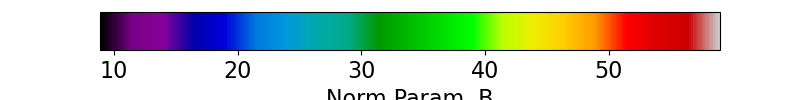

<IPython.core.display.Javascript object>


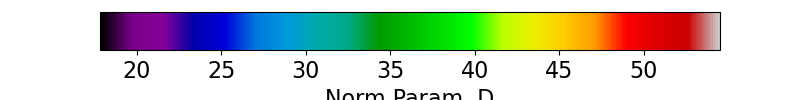

<IPython.core.display.Javascript object>


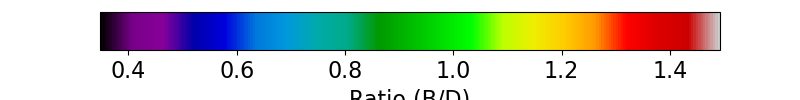

Started server on port 64074
-----


In [55]:
%matplotlib notebook
#visualize subject-specific ROIs and timeseries stats
#output FS-format polar angle and eccentricity maps for freeview ROI plotting
vis_res.output_freesurfer_maps = False
#compare t1w and surface fitting rsq and polar angle maps
vis_res.compare_volume_surface = False

vis_res.plot_rois_cortex = False
vis_res.plot_stats_cortex = False
vis_res.plot_rsq_cortex = False
vis_res.plot_ecc_cortex = False
vis_res.plot_polar_cortex = False
vis_res.plot_size_cortex = False
vis_res.plot_amp_cortex = False
vis_res.plot_css_exp_cortex = False
vis_res.plot_surround_size_cortex = False
vis_res.plot_suppression_index_cortex = False
vis_res.plot_norm_baselines_cortex = True
vis_res.plot_size_ratio_cortex = False
vis_res.plot_receptors_cortex = False
#set these to None if not wanted. 
vis_res.plot_correlations_per_roi = None#{'x_params_topl':['Norm Param. B'], 'y_params_topl':['Receptor Maps'],
                                    # 'x_params_lowl':['Norm_abcd'], 'y_params_lowl':['GABA'],
                                    # 'atlas':'glasser'} #glasser, HCPQ1Q6, custom
#note there is no quantile exclusion here, so the means may suffer from extreme values. just a visualization tool; use the quant_plots if want to be sure
vis_res.plot_means_per_roi = None# {'y_params_topl':['Norm Param. B','Norm Param. D','Size ratio (sigma_2/sigma_1)'], 
                                 #   'y_params_lowl':['Norm_abcd'], 
                                 #    'atlas':'glasser'} #glasser, HCPQ1Q6, custom

rsq_thresh = 0.0
rsq_max_opacity = 0.15#rsq_thresh+1e-6
#change to 'all' to plot whole brain. string single ROI for single ROI
rois = 'Brain'#['custom.hV4']#'all'#['custom.hV4']#'['custom.hV4']#'all'#['custom.hV4']#'all'#['custom.V1', 'custom.V2', 'custom.V3']
space_names ='fsaverage'# 'fsnative'#'fsaverage'#'HCP'#
analysis_names = 'fit-task-BAR_fit-runs-all'#'fit-task-BAR_fit-runs-CVmedian'#'fit-task-2R_fit-runs-all'#'fit-task-4R_fit-runs-all'# #'Mean analysis'#
subject_ids = ['fsaverage']#['fsaverage_cvrsq']#['fsaverage_hcp1sthalf','fsaverage_hcp2ndhalf']#['sub-006']##'all'#['sub-001']

threshold_li = 0#filters.threshold_li(vis_res.main_dict[space_names][analysis_names][subject_ids[0]]['Processed Results']['#Subjects with CVRSq>0']['Norm_abcd'])

vis_res.set_alpha(only_models=['Norm_abcd'], ecc_min=0.0, ecc_max=8.0, min_number_sjs=threshold_li)

vis_res.pycortex_plots(rois, rsq_thresh, space_names, analysis_names, subject_ids, rsq_max_opacity = rsq_max_opacity, pycortex_cmap = 'nipy_spectral',#'Jet_2D_alpha', #'nipy_spectral_2D_alpha' #Jet_2D_alpha                    
                       #specify this path to save colormap pDFs
                       pycortex_image_path = '/Volumes/Crucial X8/PRFMapping/Figures/pyc_surface_maps',
                       timecourse_folder = '/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/timecourses',#'/Volumes/Crucial X8/PRFMapping/PRFMapping-Deriv-hires/prfpy/FS7_results/timecourses',#'/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/timecourses',##'
                       screenshot_paths = ['/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/HCP_data/7T_RETBAR_small.hdf5'])#,
                                         #  '/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/HCP_data/7T_RETBAR2_small.hdf5',
                                         #  '/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/HCP_data/7T_RETCW_small.hdf5',
                                         #  '/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/HCP_data/7T_RETCCW_small.hdf5',
                                         #  '/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/HCP_data/7T_RETEXP_small.hdf5',
                                         #  '/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/HCP_data/7T_RETCON_small.hdf5'])
                                            #'/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/HCP_data/7T_RETBAR_small.hdf5'
                                            #'/Volumes/Crucial X8/PRFMapping/PRFMapping-Deriv-hires/prfpy/FS7_results/timecourses/task-2R_screenshots'

In [54]:
vis_res.js_handle_dict[space_names][analysis_names][subject_ids[0]].keys()

dict_keys(['rsq', 'ecc', 'polar', 'norm_baselines', 'size_ratio', 'size', 'surround_size', 'amp', 'receptors'])

In [65]:
save_views=True
subj = subject_ids[0]
if save_views:
    #capture pycortex views
    #sub-006 camera coords 179 109 259 /// sub-007 183 126 250

    param_to_save = 'receptors'
    rec = '5-HT1B'#'5-HT1B'
    js_handle_to_save = vis_res.js_handle_dict[space_names][analysis_names][subj][param_to_save]
    #js_handle_to_save._capture_view()
        
    base_str = f"{subj}_{param_to_save}_{rec}"#'_Norm-Neural baseline (B)'
    
    # views = dict(dorsal=dict(radius=191, altitude=73, azimuth=178, pivot=0),
    #              medial=dict(radius=10, altitude=101, azimuth=359, pivot=167),
    #              lateral=dict(radius=277, altitude=90, azimuth=177, pivot=123),
    #              ventral=dict(radius=221, altitude=131, azimuth=175, pivot=0)
    #                     )
    
    if subj == 'sub-007':
        views = dict(occipital=dict(azimuth=183, altitude=126, radius=250, pivot=0))
    elif subj == 'sub-006':
        views = dict(occipital=dict(azimuth=179, altitude=109, radius=259, pivot=0))
        
    views = dict(flat=dict(pivot=180, radius=150, azimuth=180, altitude=0.1, target=[0,-100,0], 
                                  specularity=0))

    vis_res.save_pycortex_views(js_handle_to_save, base_str, views, image_path = vis_res.pycortex_image_path)
        

{'surface.{subject}.pivot': [180], 'camera.radius': [150], 'camera.azimuth': [180], 'camera.altitude': [0.1], 'camera.target': [0, -100, 0], 'surface.{subject}.specularity': [0], 'surface.{subject}.unfold': [1]}


<IPython.core.display.Javascript object>


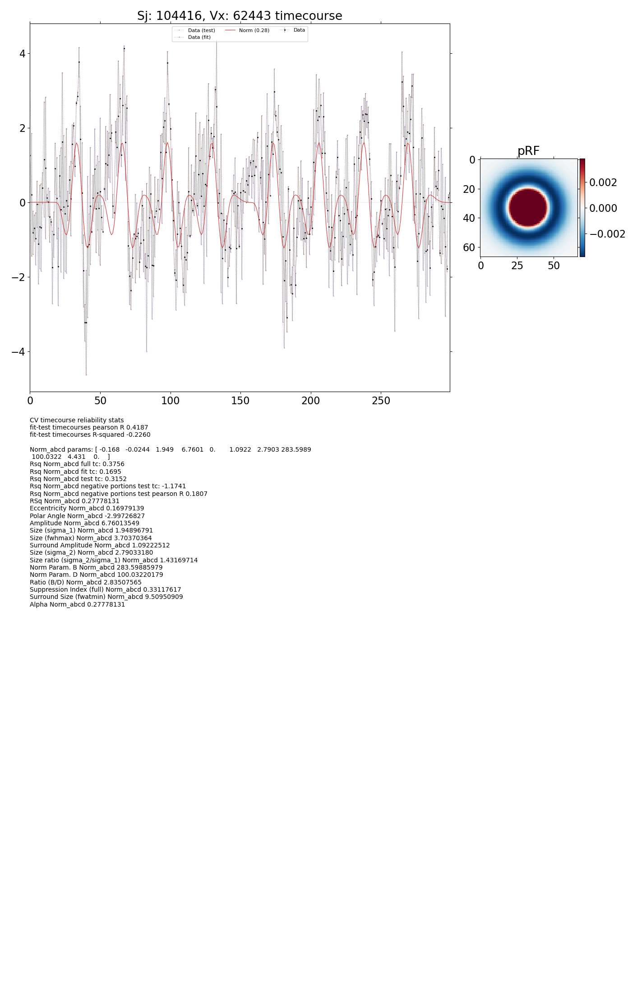

In [8]:
 vis_res.f #45227

In [41]:
vis_res.prf_models['Norm_abcd'].filter_params['first_modes_to_remove']


3

<IPython.core.display.Javascript object>


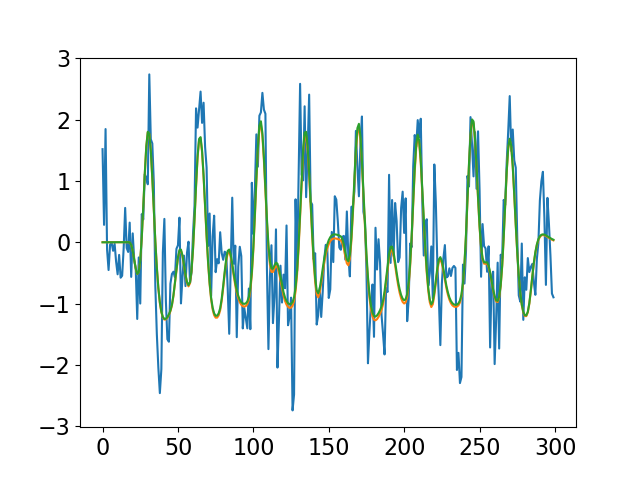

0.5640375531870051
0.5724136586779466


NameError: name 'gf_norm' is not defined

In [42]:
vertex_plot_index = 104381
pl.figure()
idx = np.sum(vis_res.main_dict['HCP']['fit-task-BAR_fit-runs-all']['104416']['mask'][:vertex_plot_index])
tc_bar_0 = np.load('/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/timecourses/104416_timecourse_space-HCP_task-BAR_run-0.npy')[idx]
tc_bar_1 = np.load('/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/timecourses/104416_timecourse_space-HCP_task-BAR_run-1.npy')[idx]
tc_conc = (tc_bar_0+tc_bar_1)/2
pl.plot(tc_conc)
par_1 = vis_res.main_dict['HCP']['fit-task-BAR_fit-runs-all']['104416']['Results']['Norm_abcd'][vertex_plot_index,:-1]
vis_res.prf_models['Norm_abcd'].filter_predictions = False
pr = vis_res.prf_models['Norm_abcd'].return_prediction(*list(par_1))[0]
rsq = 1- ((tc_conc-pr)**2).sum()/(np.var(tc_conc)*tc_conc.shape[-1])
pl.plot(pr, label=f'orig_nofilter {rsq:.2f}')
print(rsq)
vis_res.prf_models['Norm_abcd'].filter_predictions = True
pr = vis_res.prf_models['Norm_abcd'].return_prediction(*list(par_1))[0]
rsq = 1- ((tc_conc-pr)**2).sum()/(np.var(tc_conc)*tc_conc.shape[-1])
print(rsq)
pl.plot(pr, label=f'filter {rsq:.2f}')
vis_res.prf_models['Norm_abcd'].filter_predictions = True
pr = vis_res.prf_models['Norm_abcd'].return_prediction(*list(gf_norm.iterative_search_params[0,:-1]))[0]
rsq = 1- ((tc_conc-pr)**2).sum()/(np.var(tc_conc)*tc_conc.shape[-1])
pl.plot(pr, label=f'refit (filter+hrf) {rsq:.2f}')

print(rsq)
pl.legend()

In [13]:
gf_norm = Norm_Iso2DGaussianFitter(data=np.reshape(tc_conc,(1,-1)), model=vis_res.prf_models['Norm_abcd'], n_jobs=1, fit_hrf=True)
max_ecc_size=8
ss=16
eps=0.1
norm_bounds = [(-1.5*max_ecc_size, 1.5*max_ecc_size),  # x
                    (-1.5*max_ecc_size, 1.5*max_ecc_size),  # y
                    (eps, 1.5*ss),  # prf size
                    (0, 1000),  # prf amplitude
                    (0, 0),  # bold baseline
                    (0, 1000),  # surround amplitude
                    (eps, 3*ss),  # surround size
                    (0, 1000),  # neural baseline
                    (1e-6, 1000),# surround baseline
                    (0,10),
                    (0,0)]  

print(vis_res.main_dict['HCP']['fit-task-BAR_fit-runs-all']['104416']['Results']['Norm_abcd'][vertex_plot_index])
st_par=np.insert(vis_res.main_dict['HCP']['fit-task-BAR_fit-runs-all']['104416']['Results']['Norm_abcd'][vertex_plot_index], -1, 4.6)
st_par=np.insert(st_par,-1,0)
print(st_par)
gf_norm.iterative_fit(
                      rsq_threshold=0,
                      verbose=True,
                      starting_params=np.reshape(st_par,(1,-1)),
                      bounds=norm_bounds,
                      args={},
                      constraints=[],
                      xtol=1e-5,
                      ftol=1e-5)
print(gf_norm.iterative_search_params)

[ 0.5433 -2.1451  2.9271  0.025   0.      0.009  12.      0.0197  0.102
  0.1641]
[ 0.5433 -2.1451  2.9271  0.025   0.      0.009  12.      0.0197  0.102
  4.6     0.      0.1641]
Performing bounded, constrained minimization (trust-constr).


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


The maximum number of function evaluations is exceeded.
Number of iterations: 1000, function evaluations: 12420, CG iterations: 4330, optimality: 2.76e-01, constraint violation: 0.00e+00, execution time: 3.2e+02 s.
[[ 1.5752 -2.2006  2.0045  3.1069  0.      0.0384  2.0289 27.1917  0.354
   0.0004  0.      0.6149]]


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:  5.4min finished


<IPython.core.display.Javascript object>


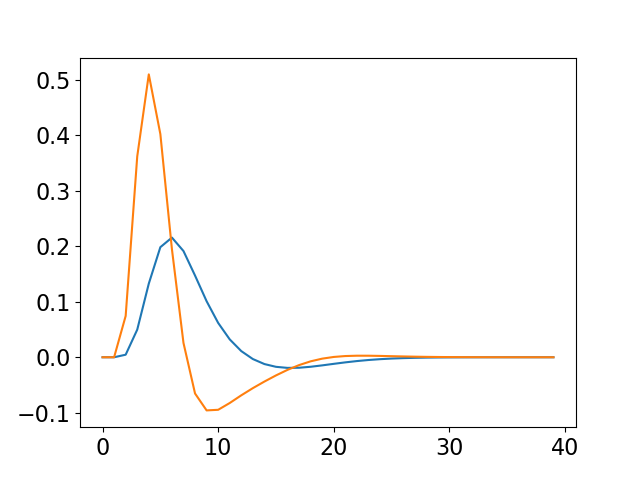

In [15]:
from nilearn.glm.first_level.hemodynamic_models import spm_hrf, spm_time_derivative, spm_dispersion_derivative
hrf_params = [1,0.0004,0]
hrf = np.array(
    [
        np.ones_like(hrf_params[1])*hrf_params[0] *
        spm_hrf(
            tr=vis_res.prf_stim.TR,
            oversampling=1,
            time_length=40)[...,np.newaxis],
        hrf_params[1] *
        spm_time_derivative(
            tr=vis_res.prf_stim.TR,
            oversampling=1,
            time_length=40)[...,np.newaxis],
        hrf_params[2] *
        spm_dispersion_derivative(
            tr=vis_res.prf_stim.TR,
            oversampling=1,
            time_length=40)[...,np.newaxis]]).sum(
    axis=0)  
hrf_params_old = [1,4.6,0]
hrf_old = np.array(
    [
        np.ones_like(hrf_params_old[1])*hrf_params_old[0] *
        spm_hrf(
            tr=vis_res.prf_stim.TR,
            oversampling=1,
            time_length=40)[...,np.newaxis],
        hrf_params_old[1] *
        spm_time_derivative(
            tr=vis_res.prf_stim.TR,
            oversampling=1,
            time_length=40)[...,np.newaxis],
        hrf_params_old[2] *
        spm_dispersion_derivative(
            tr=vis_res.prf_stim.TR,
            oversampling=1,
            time_length=40)[...,np.newaxis]]).sum(
    axis=0)  
pl.figure()
pl.plot(hrf)
pl.plot(hrf_old)

In [57]:
gf_norm.iterative_search_params #to

array([[1.9297, 0.2662, 2.9777, 4.4217, 0.    , 1.6479, 4.4276, 0.4611,
        0.6566, 4.6912, 0.    , 0.3675]])

In [90]:
gf_norm.iterative_search_params #v1

array([[ 10.5857, -11.4087,   0.2624, 999.9371,   0.    , 712.4815,
         42.3688,   0.    ,  24.5096,   8.4674,   0.    ,  -0.315 ]])

In [63]:
gf_norm.iterative_search_params #v2/3

array([[-1.8694, -1.0597,  1.4944,  0.0119,  0.    ,  0.    , 21.6597,
        11.3761,  0.2807,  0.0039,  0.    ,  0.6494]])

<IPython.core.display.Javascript object>


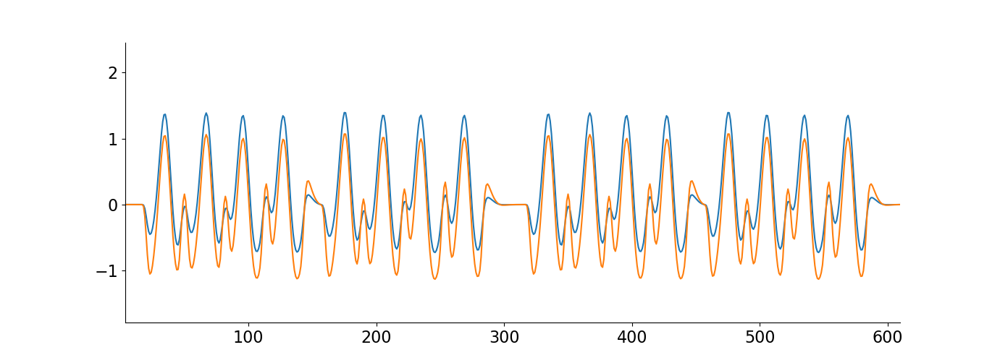

In [28]:
pl.figure()
par_1 = vis_res.main_dict['HCP']['fit-task-all_fit-runs-all']['104416']['Results']['Norm_abcd'][vertex_plot_index,:-1]
pr = vis_res.prf_models['Norm_abcd'].return_prediction(*list(par_1))[0]
pl.plot(pr)
par_2 = np.copy(par_1)
par_2[-1] *= 0.5
pr_2 = vis_res.prf_models['Norm_abcd'].return_prediction(*list(par_2))[0]
pl.plot(pr_2)

[  0.8868   1.0725   2.6284   8.2553   0.       2.3658  47.9346  39.772
 100.5811   0.3058]


<IPython.core.display.Javascript object>


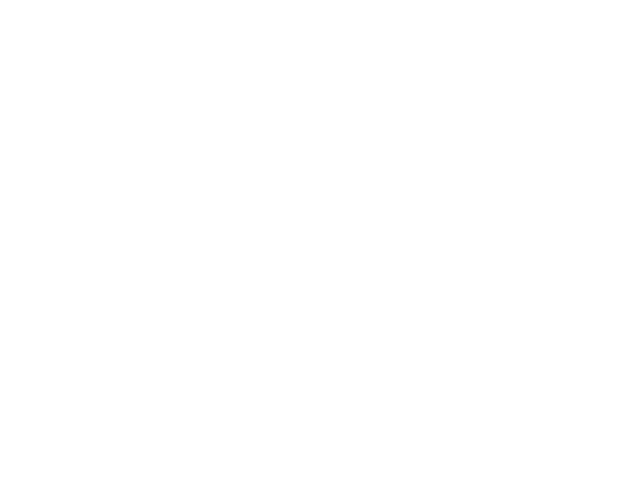

ValueError: operands could not be broadcast together with shapes (1200,) (1800,) 

In [22]:
vertex_plot_index = 42518
print(vis_res.main_dict['HCP']['fit-task-all_fit-runs-all']['104416']['Results']['Norm_abcd'][vertex_plot_index])
pl.figure()
pr = vis_res.prf_models['Norm_abcd'].return_prediction(*list(vis_res.main_dict['HCP']['fit-task-all_fit-runs-all']['104416']['Results']['Norm_abcd'][vertex_plot_index][:-1]))[0]
idx = np.sum(vis_res.main_dict['HCP']['fit-task-all_fit-runs-all']['104416']['mask'][:vertex_plot_index])
tc_cw = np.load('/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/timecourses/allconds/104416_timecourse_space-HCP_task-CW_run-0.npy')[idx]
tc_ccw = np.load('/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/timecourses/allconds/104416_timecourse_space-HCP_task-CCW_run-0.npy')[idx]
tc_exp = np.load('/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/timecourses/allconds/104416_timecourse_space-HCP_task-EXP_run-0.npy')[idx]
tc_con = np.load('/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/timecourses/allconds/104416_timecourse_space-HCP_task-CON_run-0.npy')[idx]
tc_conc = np.concatenate((tc_cw,tc_ccw,tc_exp,tc_con),axis=-1)
rsq = 1- ((tc_conc-pr)**2).sum()/(np.var(tc_conc)*tc_conc.shape[-1])

pl.plot(tc_conc)
print(rsq)

tc_cw = np.load('/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/timecourses/allconds/unfiltered/104416_timecourse_space-HCP_task-CW_run-0.npy')[idx]
tc_ccw = np.load('/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/timecourses/allconds/unfiltered/104416_timecourse_space-HCP_task-CCW_run-0.npy')[idx]
tc_exp = np.load('/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/timecourses/allconds/unfiltered/104416_timecourse_space-HCP_task-EXP_run-0.npy')[idx]
tc_con = np.load('/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/timecourses/allconds/unfiltered/104416_timecourse_space-HCP_task-CON_run-0.npy')[idx]
tc_conc = np.concatenate((tc_cw,tc_ccw,tc_exp,tc_con),axis=-1)
rsq = 1- ((tc_conc-pr)**2).sum()/(np.var(tc_conc)*tc_conc.shape[-1])

pl.plot(tc_conc)
print(rsq)


pl.plot(pr)


# 1D quantitative plots

In [34]:
vis_res.main_dict['fsaverage']['fit-task-all_fit-runs-all']['fsaverage_cvrsq']['Processed Results']['DrescbarA']['Norm_abcd'] = vis_res.main_dict['fsaverage']['fit-task-all_fit-runs-all']['fsaverage_cvrsq']['Processed Results']['Norm Param. D']['Norm_abcd']*vis_res.main_dict['fsaverage']['fit-task-BAR_fit-runs-all']['fsaverage_cvrsq']['Processed Results']['Amplitude']['Norm_abcd']/vis_res.main_dict['fsaverage']['fit-task-all_fit-runs-all']['fsaverage_cvrsq']['Processed Results']['Amplitude']['Norm_abcd']


/var/folders/vb/gdqfj5px0gb7r_bgl5hpf8n00000gn/T/ipykernel_3388/282836529.py:1: RuntimeWarning: invalid value encountered in true_divide
  vis_res.main_dict['fsaverage']['fit-task-all_fit-runs-all']['fsaverage_cvrsq']['Processed Results']['DrescbarA']['Norm_abcd'] = vis_res.main_dict['fsaverage']['fit-task-all_fit-runs-all']['fsaverage_cvrsq']['Processed Results']['Norm Param. D']['Norm_abcd']*vis_res.main_dict['fsaverage']['fit-task-BAR_fit-runs-all']['fsaverage_cvrsq']['Processed Results']['Amplitude']['Norm_abcd']/vis_res.main_dict['fsaverage']['fit-task-all_fit-runs-all']['fsaverage_cvrsq']['Processed Results']['Amplitude']['Norm_abcd']


In [35]:
ds_pyc = Vertex2D_fix(vis_res.main_dict['fsaverage']['fit-task-all_fit-runs-all']['fsaverage_cvrsq']['Processed Results']['DrescbarA']['Norm_abcd'], 
                      vis_res.main_dict['fsaverage']['fit-task-all_fit-runs-all']['fsaverage_cvrsq']['Processed Results']['#Subjects with CVRSq>0']['Norm_abcd'],
                      subject='fsaverage', 
                                                        vmin=1, 
                                                        vmax=250, 
                                                        vmin2=9, vmax2=15, cmap='nipy_spectral')

# select path for static viewer on disk
viewer_path = '/Users/marcoaqil/Downloads'

# create viewer
#cortex.webgl.make_static(outpath=viewer_path, data=ds_pyc, recache=True)
cortex.webgl.show(ds_pyc)

Started server on port 61154


<JS: window.viewer>

In [66]:
%%capture capt
pl.close('all')
display(HTML("<style>div.output_scroll { height: 150em; }</style>"))
#generalized quantitative parameter plots
#'Eccentricity'#'Suppression Index (full)'#'Suppression Index#'Size (fwhmax)'#'Surround Size (fwatmin)'
#'Norm Param. B'#''Ratio (B/D)'#'Norm Param. D'#'RSq'#'CCrsq_task-1R'#'CSS Exponent'#'Amplitude'
#'Surround Amplitude'#'Size (sigma_1)'##'Size (sigma_2)'
#'Size ratio (sigma_2/sigma_1)'#C/A#'B/A'#'D/C'#'D/A'#'B/C'#'Surround volume (full)'#'Centre volume (full)'
#'(A+B)/(C+D)'#'(A*B)/(C*D)'#'(A*D)/(C*B)'#'(A+D)/(C+B)'#'Point-stim derivative'#'(C(A+B))/(A(C+D))'
#'Min/Max Response Ratio'#'Max/Min Response Ratio'#'A(C+D)/C(A+B)'##Min/Max Response Ratio (with BD)'#'A/C'
#D/B#D*sigma_2/sigma_1#(D*sigma_2)/(B*sigma_1)#'(AD-BC)/D**2 (deriv at 0)'#(Cs_2**2+D)/(As_1**2+B)
#(B*sigma_1)/(D*sigma_2)##B/D**2#'B/sqrt(D)'#'B(1/(Cpis_2**2+D)-1/D)'
####DoG
#'Surround volume (full)'#'Surround/Centre Amplitude' #'Surround-Centre Amplitude'#'Surround-Centre Volume'
#'Timecourse Neg/Pos Area Ratio'
#['GABA_A','5-HTT', '5-HT2A', '5-HT1A', '5-HT1B', '5-HT4']


#'custom.V1', 'custom.V2', 'custom.V3','custom.V3AB','custom.hV4','custom.LO','custom.TO','custom.VO','custom.IPS'
#combined all_custom Brain
#rois = ['custom.V1', 'custom.V2', 'custom.V3','custom.V3AB','custom.hV4','custom.LO','custom.TO','custom.IPS','all_custom']
rois = [roi for roi in vis_res.idx_rois['fsaverage'] if 'glasser' in roi]#[-20:]#['V1','V2', 'V3','V3AB','hV4','LO','TO','VO','IPS'] #fsaverage
#rois = [ 'V1', 'V2', 'V3', 'hV4', 'VO1', 'VO2', 'PHC1', 'PHC2', 'LO1', 'LO2', 'TO1', 'TO2', 'V3A', 'V3B', 'IPS0', 'IPS1', 'IPS2', 'IPS3', 'IPS4', 'IPS5', 'SPL1', 'FEF']
# rois = ['glasser_V1','glasser_V2','glasser_V3','glasser_V4','glasser_V3A','glasser_V7','glasser_V3B','glasser_V3CD',
# 'glasser_LO1','glasser_LO2','glasser_PIT','glasser_V8','glasser_VMV3',
# 'glasser_IPS1','glasser_IP0','glasser_PGp','glasser_LO3','glasser_MT','glasser_V4t','glasser_FFC','combined']
#rois = ['V1','V2', 'V3','V3AB','hV4','LO','TO','VO','IPS','combined']
#rois = ['all_custom']
#rois = ['HCPQ1Q6.V1', 'HCPQ1Q6.V2', 'HCPQ1Q6.V3', 'HCPQ1Q6.V3AB',
#        'HCPQ1Q6.LO', 'HCPQ1Q6.V7','HCPQ1Q6.TO',
#        'HCPQ1Q6.IPS1']
#rois.append('combined')

rsq_thresh = 0.0 #0.3
save_figures = True
figure_path = f"/Volumes/Crucial X8/PRFMapping/Figures/hrf_fit_res"

#set to 'all' to plot all analyses
space_names = 'fsaverage'
analysis_names = 'fit-task-BAR_fit-runs-all'#'all'#, -CVmedian
subject_ids = ['fsaverage_cvrsq']#['fsaverage']#['sub-001','sub-002','sub-006']#

threshold_li = filters.threshold_li(vis_res.main_dict[space_names][analysis_names][subject_ids[0]]['Processed Results']['#Subjects with CVRSq>0']['Norm_abcd'])

vis_res.set_alpha(only_models=['Norm_abcd'], ecc_min=0.0, ecc_max=8.0, min_number_sjs=threshold_li)

ylim={}
xlim={}

#set model/roi specific x-y limitd

#ylim = {'Mean':(1.5,14), 'Norm_abcd':(1.5,14), 'Gauss':(1.5,14), 'CSS':(1.5,14), 'DoG':(1.5,14)}
#xlim = {'Gauss':(0,4.5), 'DoG':(0,4.5), 'CSS':(0,4.5), 'Norm_abcd':(0,4.5)}
#dog rsq
#ylim = {'Norm_abcd':(-5,310)}
#xlim = {'Norm_abcd':(-0.005,0.155)}
#dog tcsi
#xlim = {'Norm_abcd':(-0.02,1.33)}
#for r in rois:
    #xlim[r] = xlim['Norm_abcd']
    #ylim[r] = ylim['Norm_abcd']
    #size ratio
#xlim = {'Norm_abcd':(-0.02,0.8)}
#ylim = {'Norm_abcd':(2,11)}

#         if r in ['custom.V1', 'custom.V2', 'custom.V3']:
#             ylim[r] = (1.5,14)
#         elif r in ['custom.V3AB', 'custom.hV4', 'custom.LO']:
#             ylim[r] = (1.5,14)
#         else:
#             ylim[r] = (1.5,14)

for x_parameter in ['5-HT1A', 'GABA_A']: #'5-HT1B', '5-HT2A']:#
    for y_parameter in ['Norm Param. B']:#'Norm Param. D']:#@
        
#         ylim = {'Norm_abcd':(-2,92)}
#         if x_parameter == 'GABA_A':
#             xlim = {'Norm_abcd':(760,1080)}
#         else:
#             xlim = {'Norm_abcd':(9,43)}
               
        #bin_by: 'size' (x-param bins have the same number of vertices) or 'space' (x-param bins are approx equally spaced) space is useful for clustered parameters)
        vis_res.quant_plots(x_parameter, y_parameter, rois, rsq_thresh, save_figures, figure_path,
                                        space_names, analysis_names, subject_ids,
                                        x_parameter_toplevel='Receptor Maps',  #y_parameter_toplevel='Receptor Maps',                                      
                                        diff_gauss=False, diff_gauss_x=False, 
                                        log_yaxis=False, log_xaxis = False, nr_bins = 1, bin_by='size', rsq_weights=True,
                                        scatter=False, violin=False, stats_on_plot=False, zconfint_err_alpha=None,
                                        xlim=xlim, ylim=ylim, zscore_xdata=False, zscore_ydata=False, 
                                         means_only=False, 
                                        rois_on_plot = True, rsq_alpha_plot = True,
                                        fit = False, exp_fit = False, show_legend = False, 
                                        each_subj_on_group=True, bold_voxel_volume=4.096,
                                        quantile_exclusion=0.999)#, x_param_model='DoG')

for x_parameter in ['5-HT2A', '5-HT1B']:#
    for y_parameter in ['Norm Param. D']:#
        
#         ylim = {'Norm_abcd':(5,44)}
#         if x_parameter == '5-HT1B':
#             xlim = {'Norm_abcd':(12,31)}
#         else:
#             xlim = {'Norm_abcd':(40,64)}    
            
        #bin_by: 'size' (x-param bins have the same number of vertices) or 'space' (x-param bins are approx equally spaced) space is useful for clustered parameters)
        vis_res.quant_plots(x_parameter, y_parameter, rois, rsq_thresh, save_figures, figure_path,
                                        space_names, analysis_names, subject_ids,
                                        x_parameter_toplevel='Receptor Maps',  #y_parameter_toplevel='Receptor Maps',                                      
                                        diff_gauss=False, diff_gauss_x=False, 
                                        log_yaxis=False, log_xaxis = False, nr_bins = 1, bin_by='size', rsq_weights=True,
                                        scatter=False, violin=False, stats_on_plot=False, zconfint_err_alpha=None,
                                        xlim=xlim, ylim=ylim, zscore_xdata=False, zscore_ydata=False, 
                                         means_only=False, 
                                        rois_on_plot = True, rsq_alpha_plot = True,
                                        fit = False, exp_fit = False, show_legend = False, 
                                        each_subj_on_group=True, bold_voxel_volume=4.096,
                                        quantile_exclusion=0.999)#, x_param_model='DoG')

os.system(f"open {sound_file}")


# Multidimensional analyses

## OLS

HCP fit-task-BAR_fit-runs-all 100610
HCP fit-task-BAR_fit-runs-all 102311
HCP fit-task-BAR_fit-runs-all 102816
HCP fit-task-BAR_fit-runs-all 104416
HCP fit-task-BAR_fit-runs-all 105923
HCP fit-task-BAR_fit-runs-all 108323
HCP fit-task-BAR_fit-runs-all 109123
HCP fit-task-BAR_fit-runs-all 111312
HCP fit-task-BAR_fit-runs-all 111514
HCP fit-task-BAR_fit-runs-all 114823
HCP fit-task-BAR_fit-runs-all 115017
HCP fit-task-BAR_fit-runs-all 115825
HCP fit-task-BAR_fit-runs-all 116726
HCP fit-task-BAR_fit-runs-all 118225
HCP fit-task-BAR_fit-runs-all 125525
HCP fit-task-BAR_fit-runs-all 126426
HCP fit-task-BAR_fit-runs-all 128935
HCP fit-task-BAR_fit-runs-all 130114
HCP fit-task-BAR_fit-runs-all 130518
HCP fit-task-BAR_fit-runs-all 131217
HCP fit-task-BAR_fit-runs-all 131722
HCP fit-task-BAR_fit-runs-all 132118
HCP fit-task-BAR_fit-runs-all 134627
HCP fit-task-BAR_fit-runs-all 134829
HCP fit-task-BAR_fit-runs-all 135124
HCP fit-task-BAR_fit-runs-all 137128
HCP fit-task-BAR_fit-runs-all 140117
H

fsaverage fit-task-BAR_fit-runs-all 157336
fsaverage fit-task-BAR_fit-runs-all 158035
fsaverage fit-task-BAR_fit-runs-all 158136
fsaverage fit-task-BAR_fit-runs-all 159239
fsaverage fit-task-BAR_fit-runs-all 162935
fsaverage fit-task-BAR_fit-runs-all 164131
fsaverage fit-task-BAR_fit-runs-all 164636
fsaverage fit-task-BAR_fit-runs-all 165436
fsaverage fit-task-BAR_fit-runs-all 167036
fsaverage fit-task-BAR_fit-runs-all 167440
fsaverage fit-task-BAR_fit-runs-all 169040
fsaverage fit-task-BAR_fit-runs-all 169343
fsaverage fit-task-BAR_fit-runs-all 169444
fsaverage fit-task-BAR_fit-runs-all 169747
fsaverage fit-task-BAR_fit-runs-all 171633
fsaverage fit-task-BAR_fit-runs-all 172130
fsaverage fit-task-BAR_fit-runs-all 173334
fsaverage fit-task-BAR_fit-runs-all 175237
fsaverage fit-task-BAR_fit-runs-all 176542
fsaverage fit-task-BAR_fit-runs-all 177140
fsaverage fit-task-BAR_fit-runs-all 177645
fsaverage fit-task-BAR_fit-runs-all 177746
fsaverage fit-task-BAR_fit-runs-all 178142
fsaverage f

Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimen

<IPython.core.display.Javascript object>


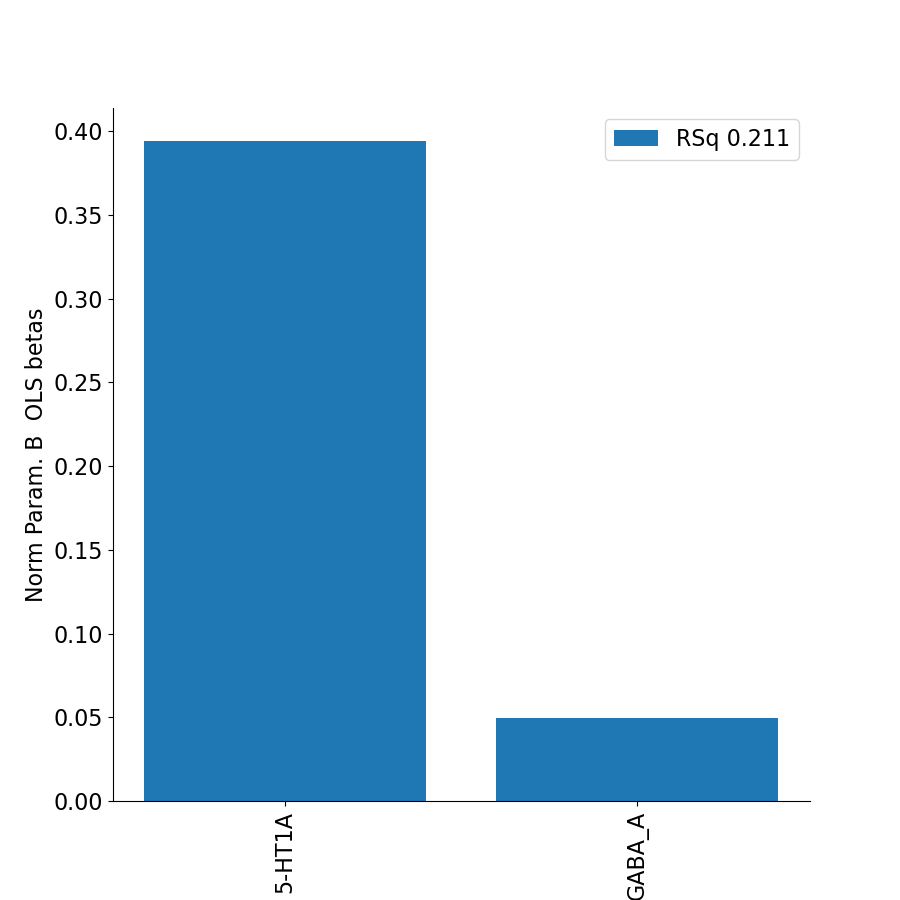

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_23c
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 264
performing OLS (1D y)
Estimated OLS betas Norm Param. B Norm_abcd [ 0.0424 -0.0004]
wRSq 0.0006174740436521997
wCC prediction 0.024849025004061037


<IPython.core.display.Javascript object>


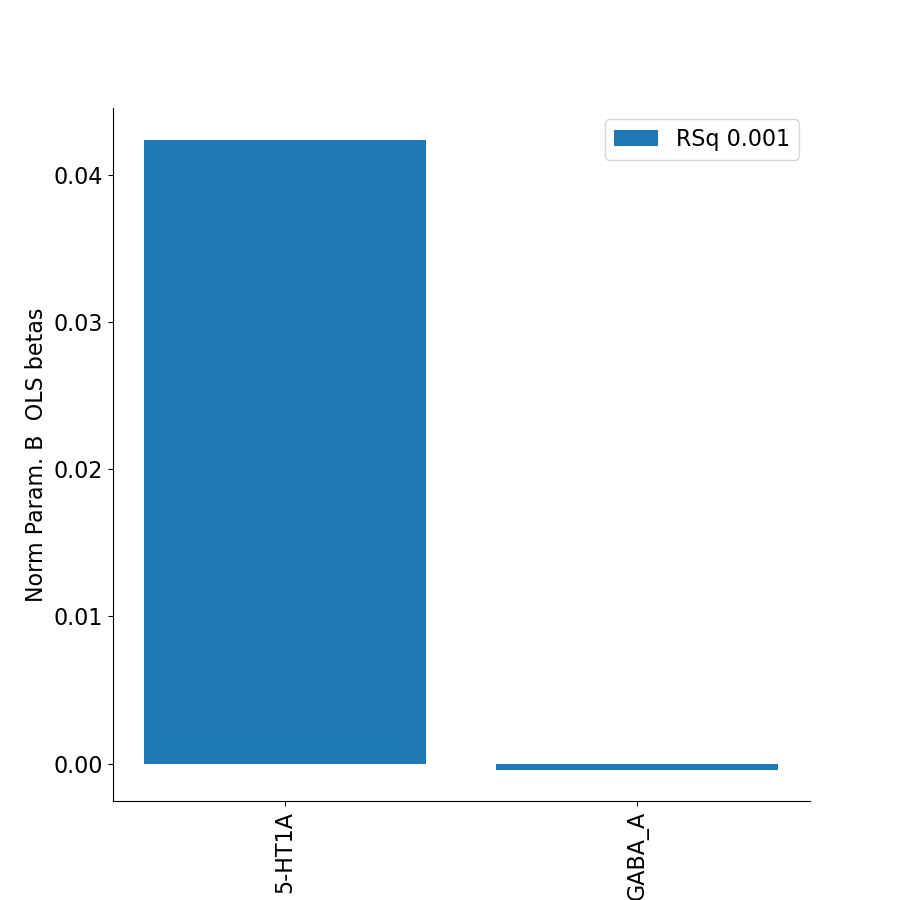

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_23d
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_24dd
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_24dv
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cv

<IPython.core.display.Javascript object>


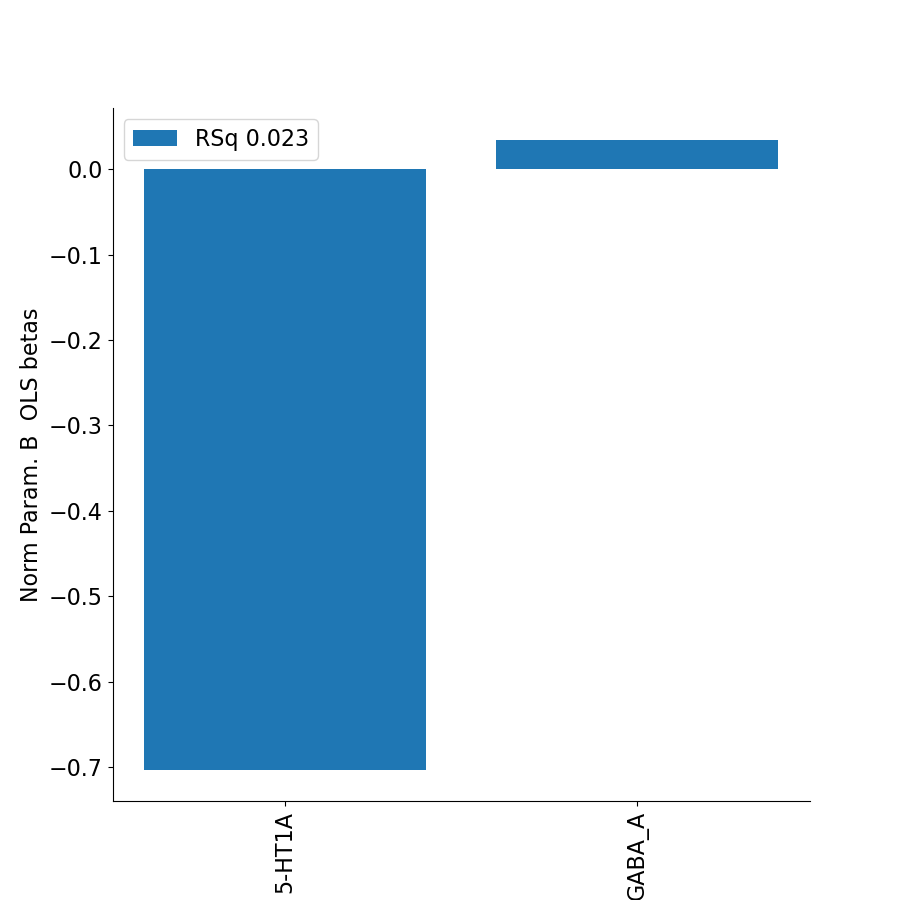

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_47l
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_47m
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_47s
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrs

<IPython.core.display.Javascript object>


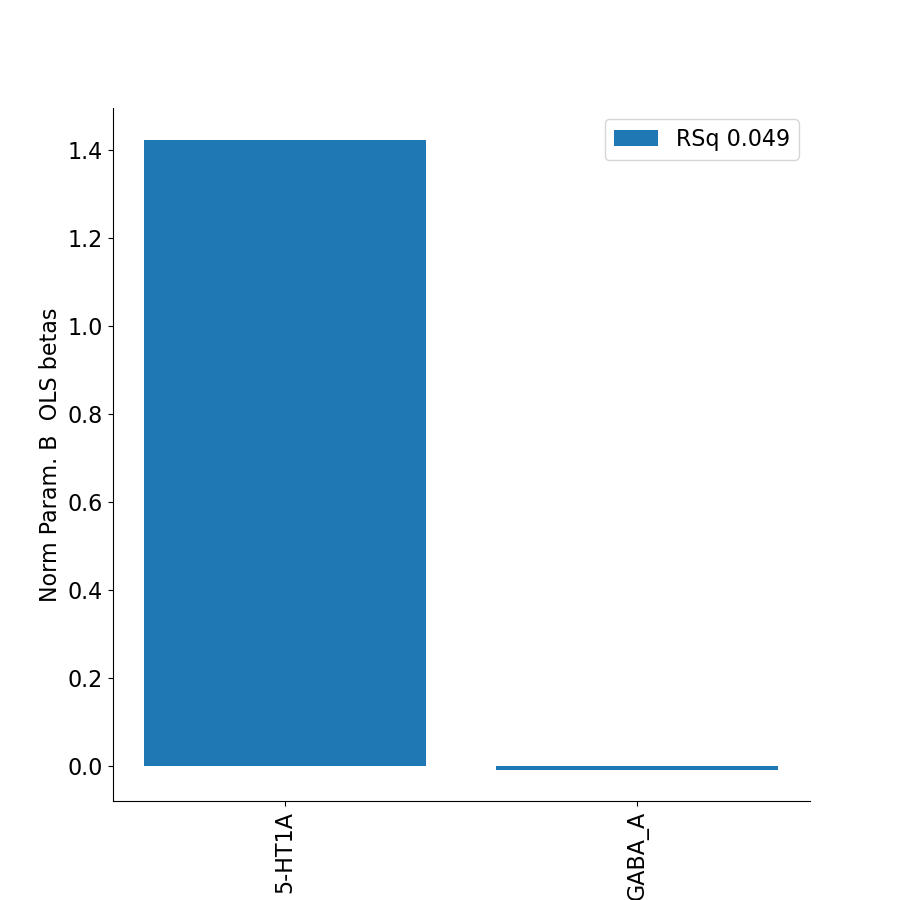

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_5m
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_5mv
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 370
performing OLS (1D y)
Estimated OLS betas Norm Param. B Norm_abcd [ 0.1393 -0.0053]
wRSq 0.008117084293930543
wCC prediction 0.09009486274993991


<IPython.core.display.Javascript object>


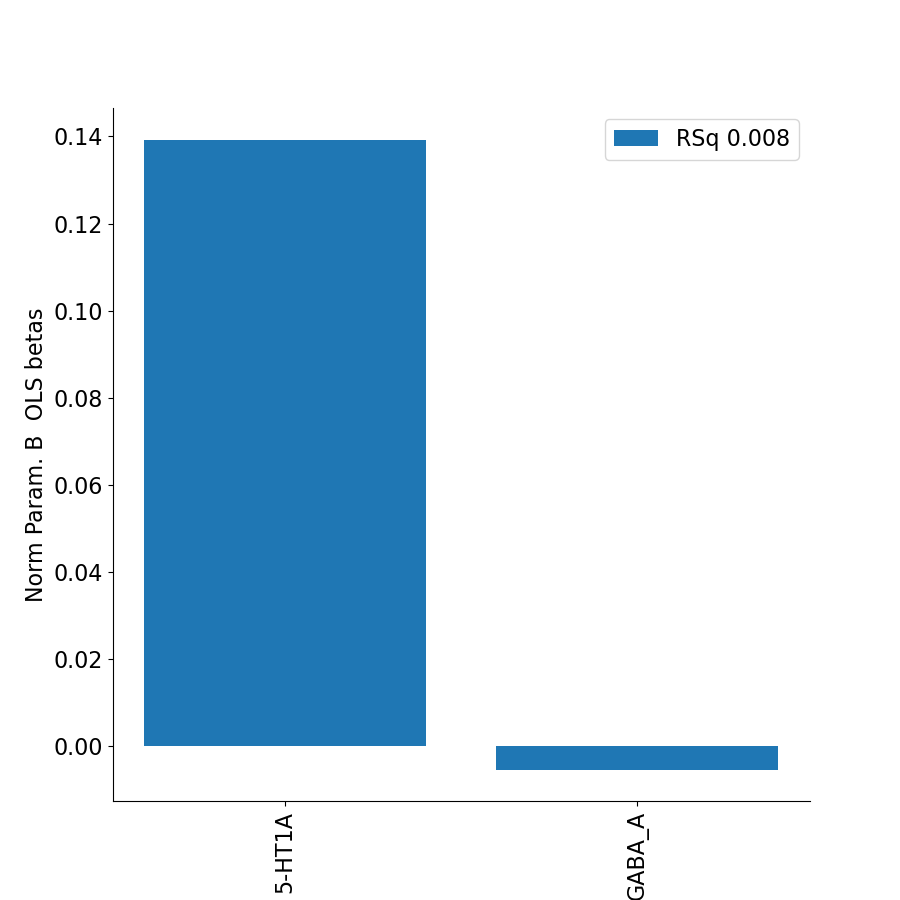

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_6a
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 2974
performing OLS (1D y)
Estimated OLS betas Norm Param. B Norm_abcd [-0.0308  0.0206]
wRSq 0.039984886480099235
wCC prediction 0.19996221263053512


<IPython.core.display.Javascript object>


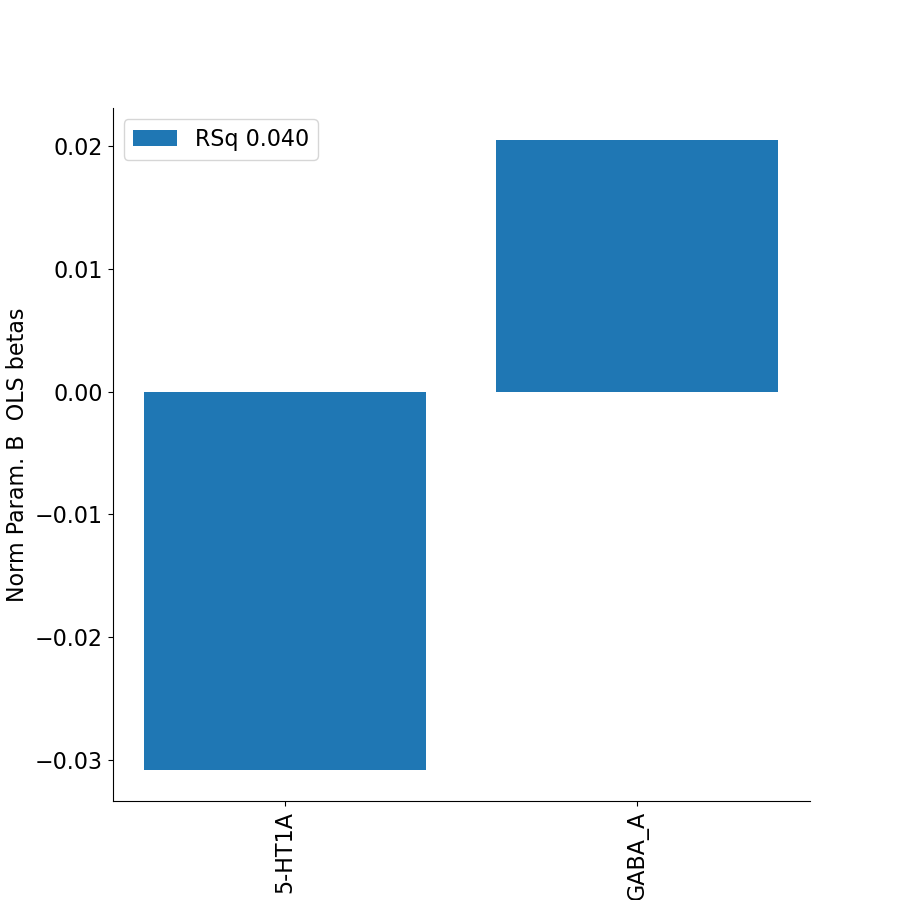

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_6d
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 153
performing OLS (1D y)
Estimated OLS betas Norm Param. B Norm_abcd [ 0.5069 -0.0568]
wRSq 0.03947653265621753
wCC prediction 0.19868702186156326


<IPython.core.display.Javascript object>


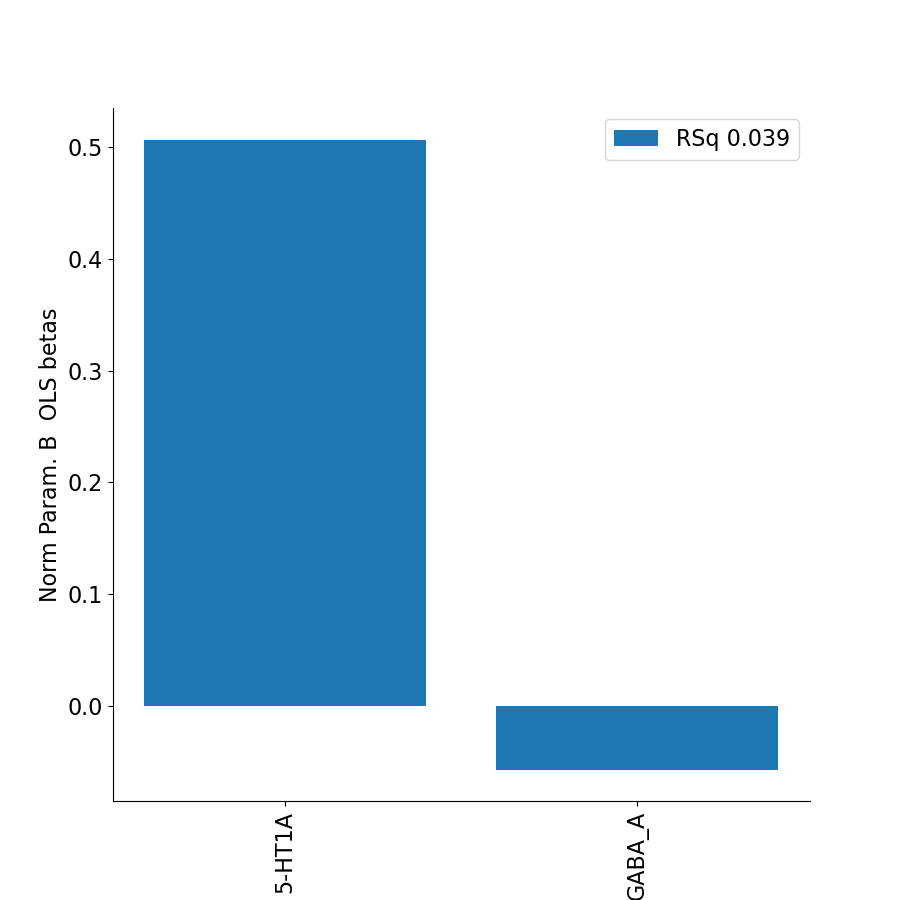

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_6ma
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 490
performing OLS (1D y)
Estimated OLS betas Norm Param. B Norm_abcd [1.8222 0.0369]
wRSq 0.33389690531163896
wCC prediction 0.5778381307179714


<IPython.core.display.Javascript object>


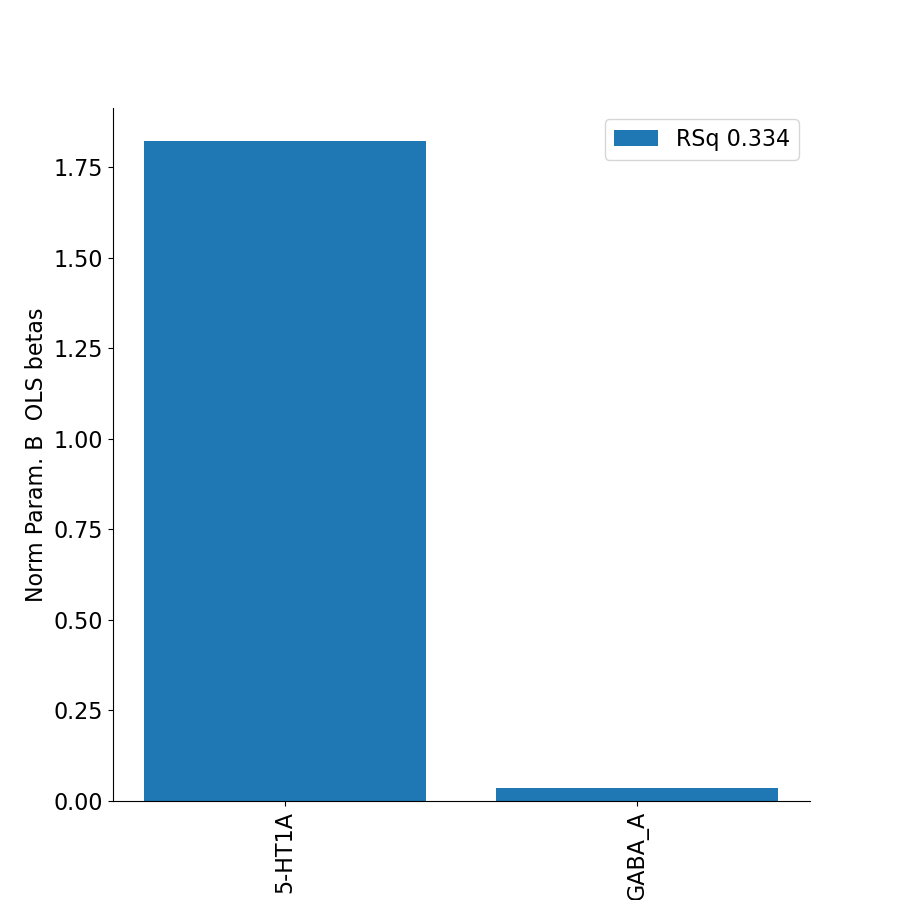

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_6mp
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 96
performing OLS (1D y)
Estimated OLS betas Norm Param. B Norm_abcd [0.2292 0.0265]
wRSq 0.019625323666717986
wCC prediction 0.14009041247251003


<IPython.core.display.Javascript object>


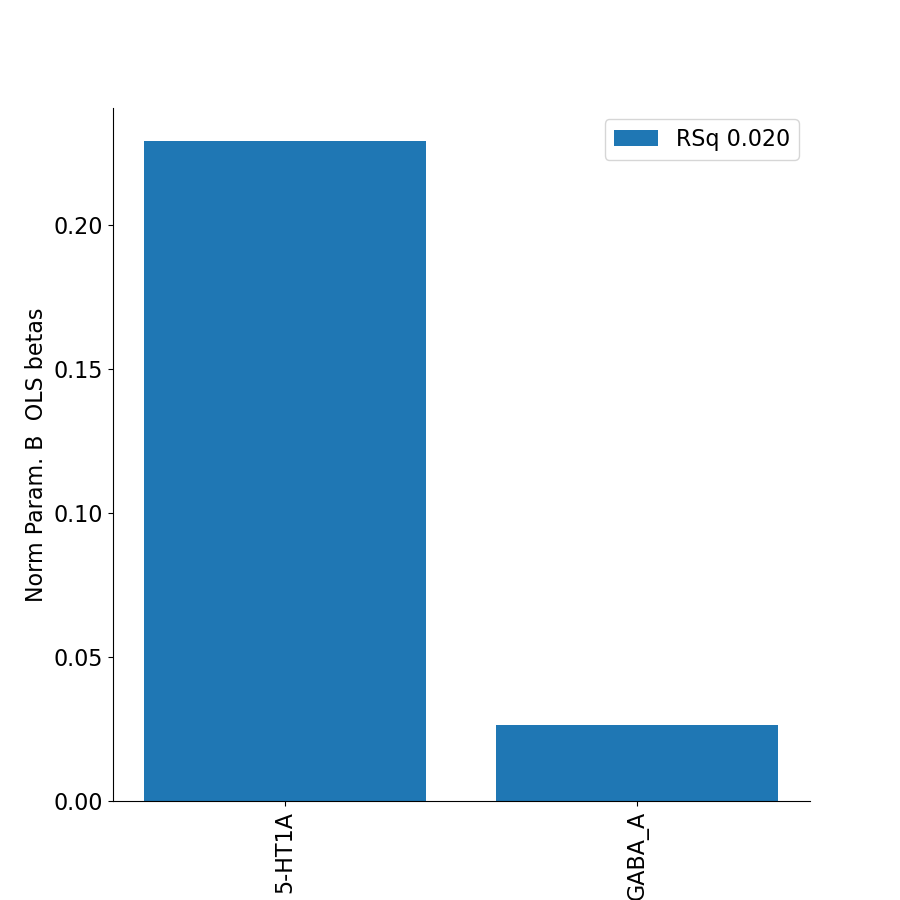

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_6r
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 612
performing OLS (1D y)
Estimated OLS betas Norm Param. B Norm_abcd [-1.3153 -0.2226]
wRSq 0.26372992207757406
wCC prediction 0.5135464166728984


<IPython.core.display.Javascript object>


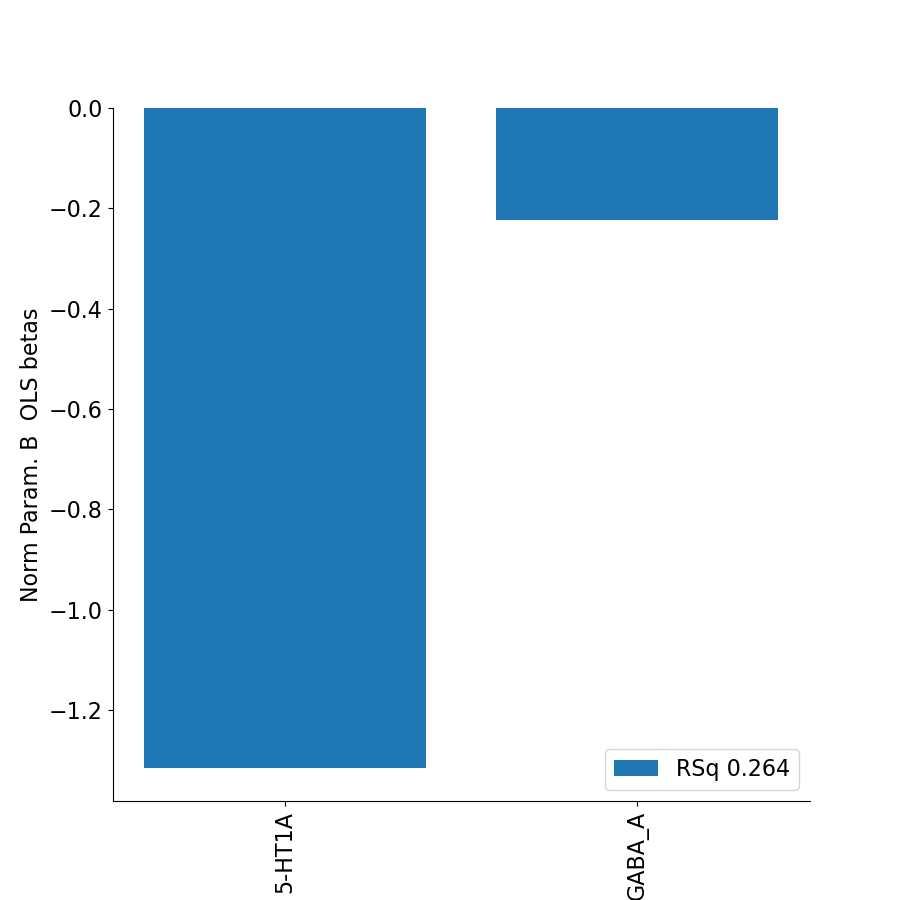

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_6v
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 459
performing OLS (1D y)
Estimated OLS betas Norm Param. B Norm_abcd [-0.3989 -0.0551]
wRSq 0.06308045013761265
wCC prediction 0.25115821734041016


<IPython.core.display.Javascript object>


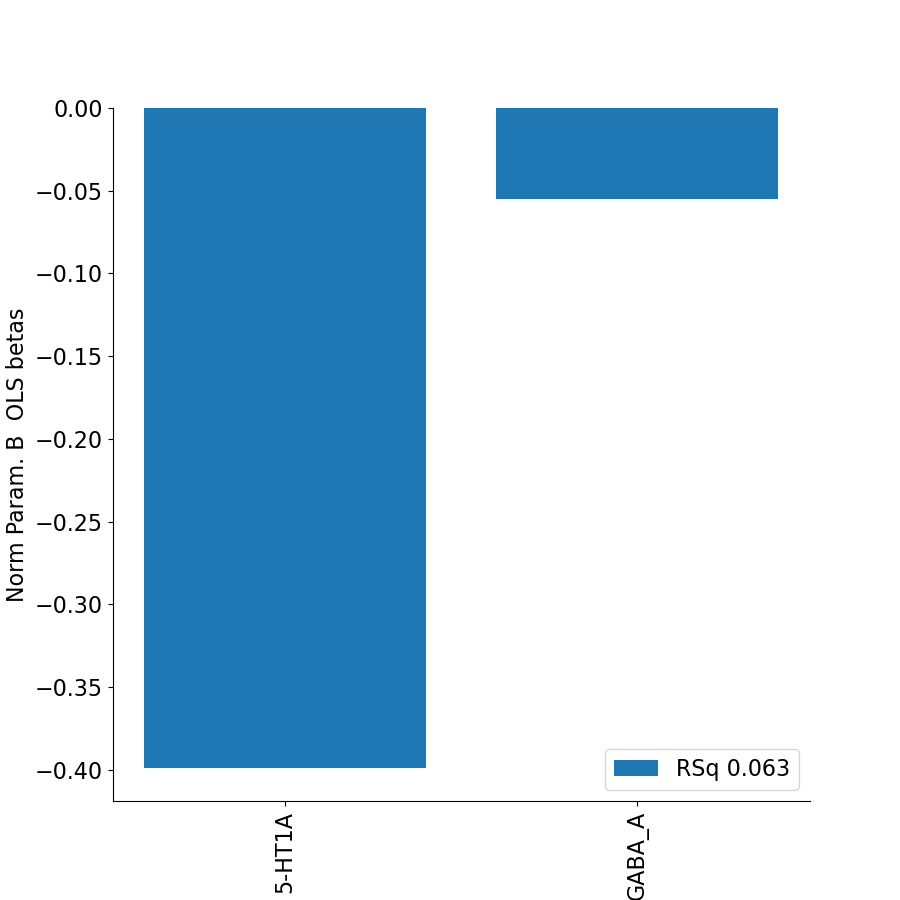

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_7AL
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 1214
performing OLS (1D y)
Estimated OLS betas Norm Param. B Norm_abcd [ 0.1532 -0.0169]
wRSq 0.03930781241490078
wCC prediction 0.19826197924690617


<IPython.core.display.Javascript object>


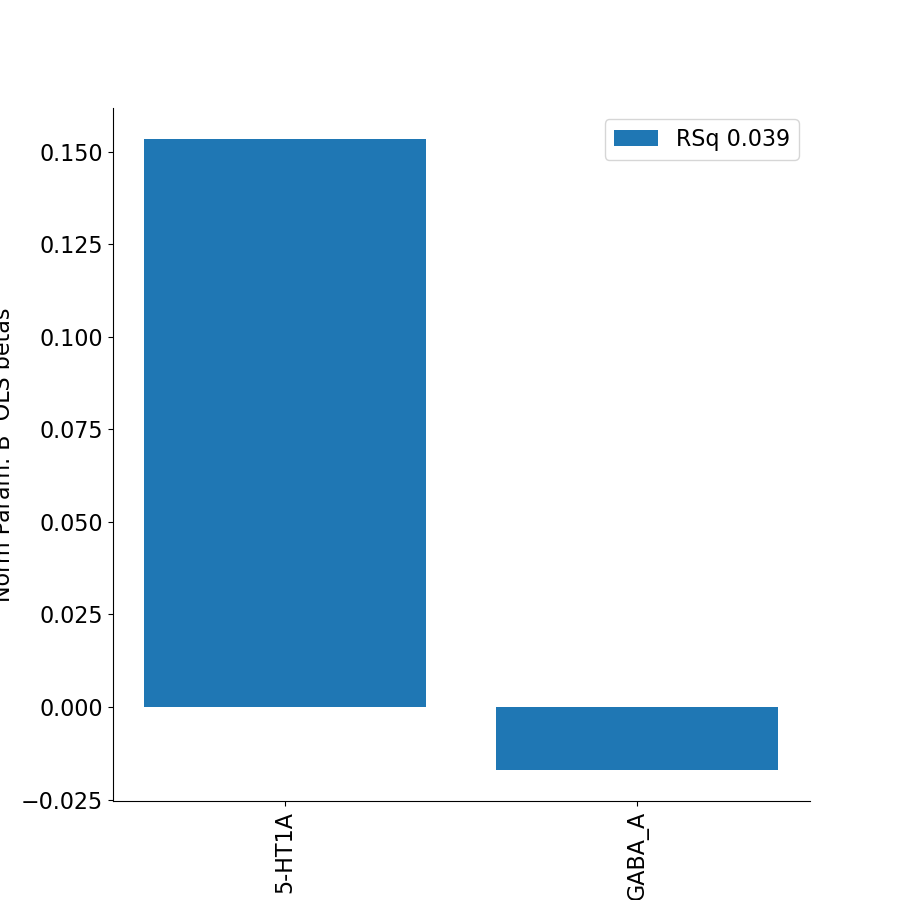

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_7Am
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 1679
performing OLS (1D y)
Estimated OLS betas Norm Param. B Norm_abcd [0.2344 0.005 ]
wRSq 0.042126433324478185
wCC prediction 0.20524724924947982


<IPython.core.display.Javascript object>


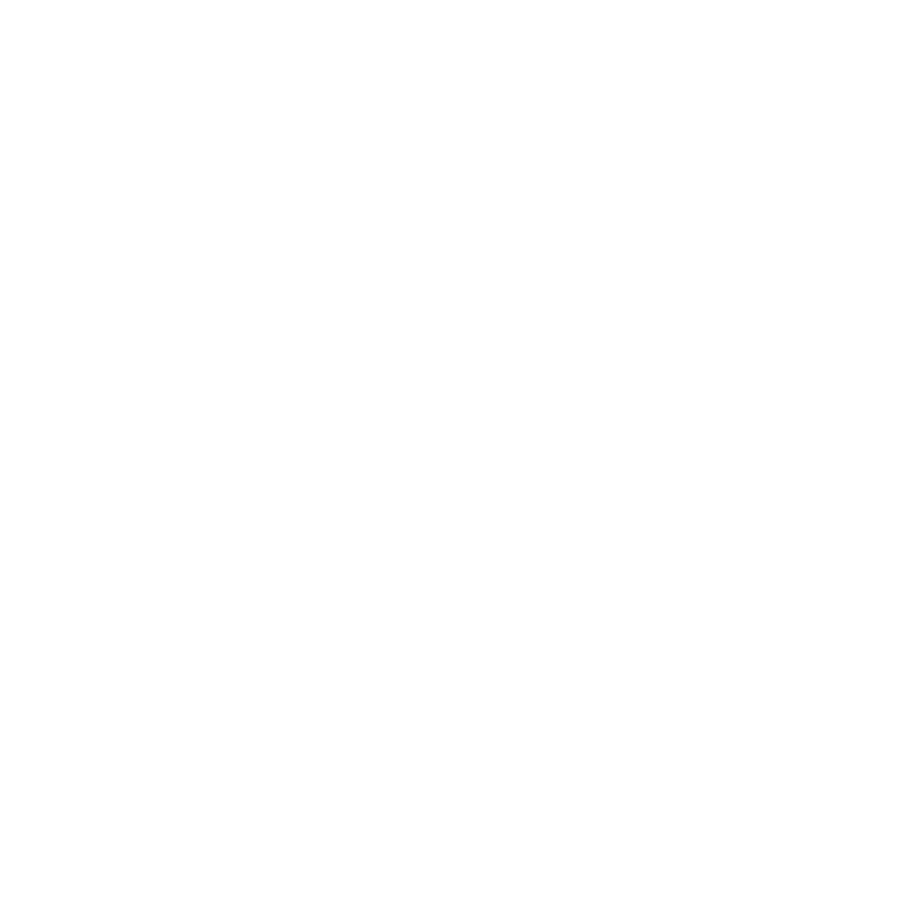

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_7m
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_7PC
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 1502
performing OLS (1D y)
Estimated OLS betas Norm Param. B Norm_abcd [0.0889 0.0023]
wRSq 0.019213373933431588
wCC prediction 0.13861231523003886


<IPython.core.display.Javascript object>


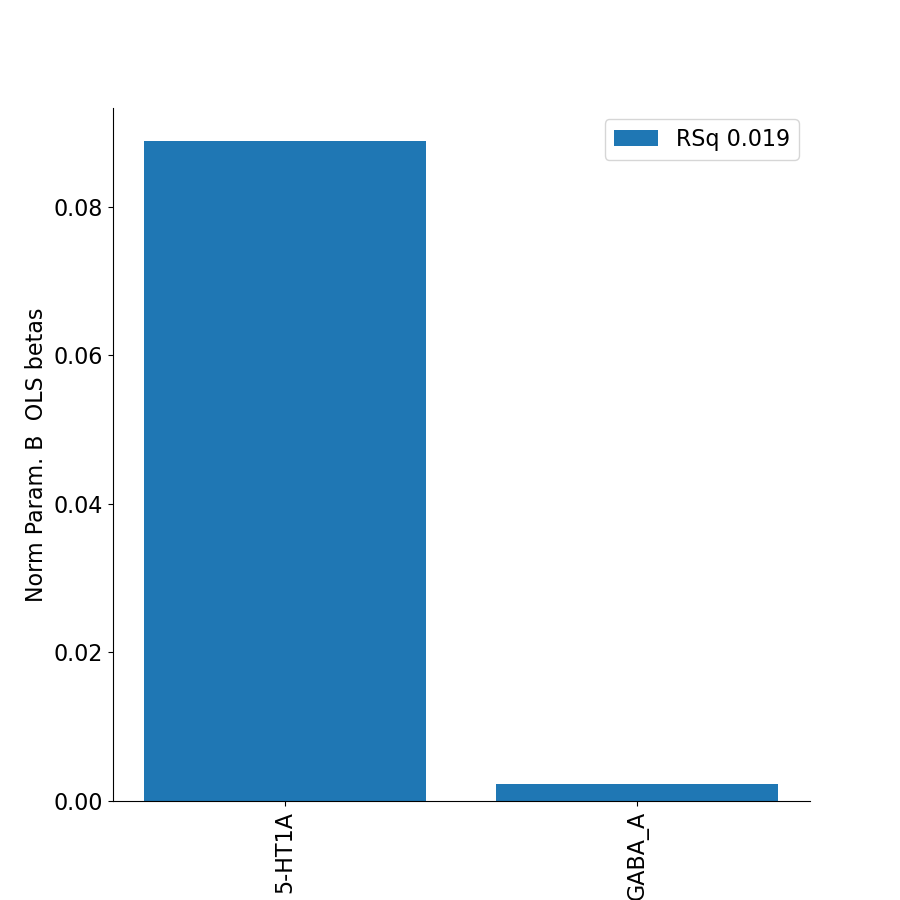

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_7PL
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 905
performing OLS (1D y)
Estimated OLS betas Norm Param. B Norm_abcd [-0.7553  0.0114]
wRSq 0.06896876553390785
wCC prediction 0.26261905021134246


<IPython.core.display.Javascript object>


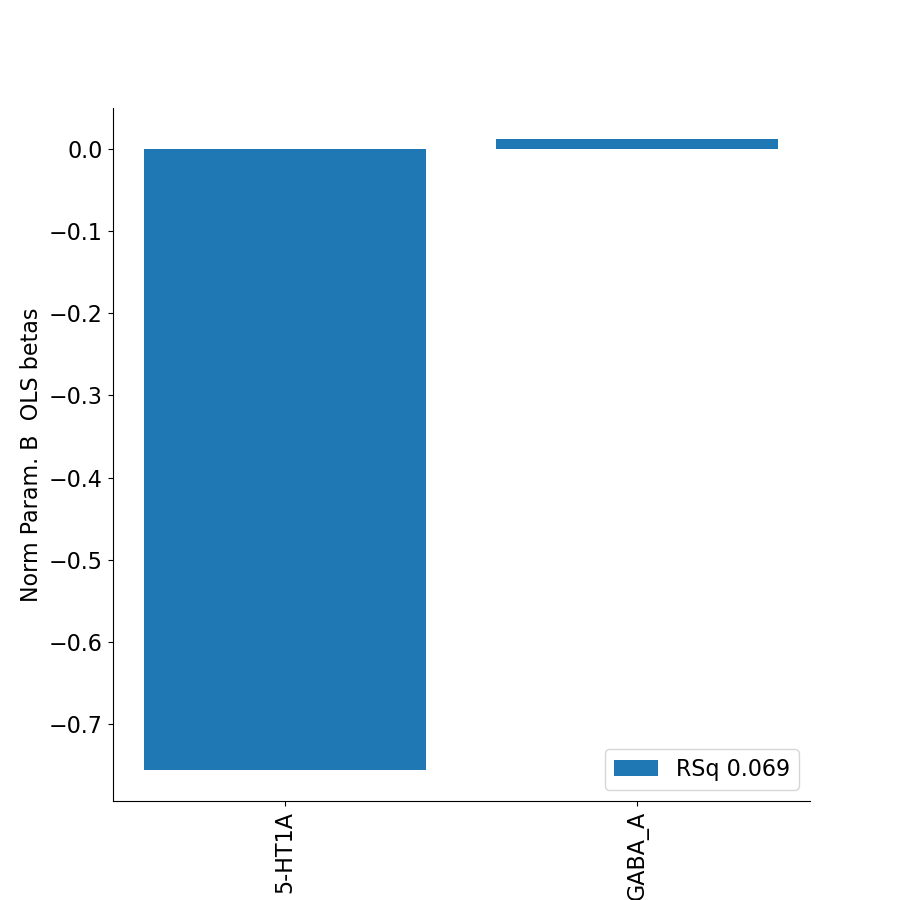

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_7Pm
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 200
performing OLS (1D y)
Estimated OLS betas Norm Param. B Norm_abcd [0.0675 0.0298]
wRSq 0.02197409047061316
wCC prediction 0.1482366030055097


<IPython.core.display.Javascript object>


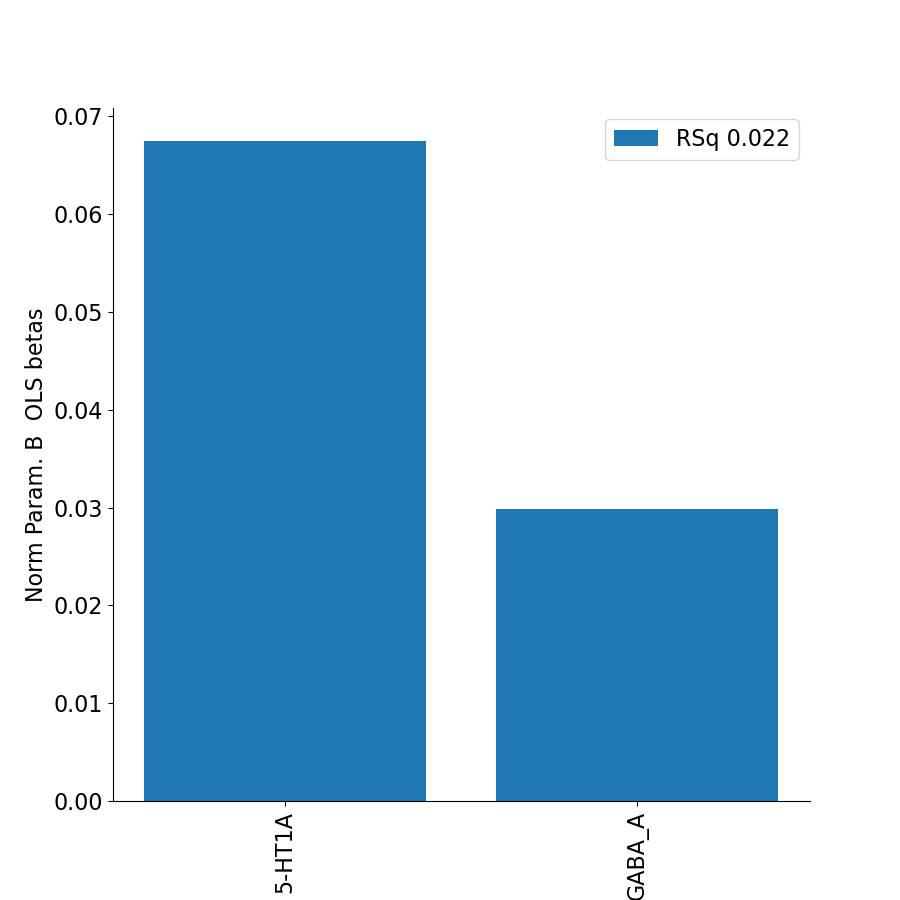

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_8Ad
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_8Av
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_8BL
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrs

<IPython.core.display.Javascript object>


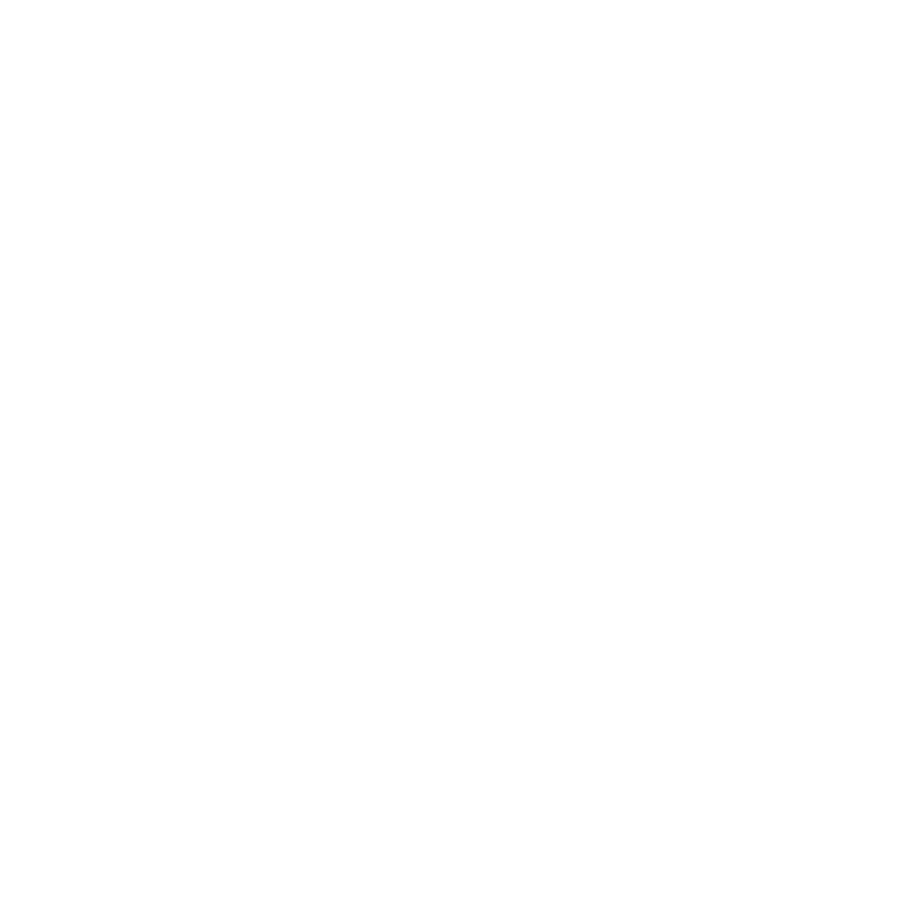

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_8C
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 8
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_9-46d
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 32
performing OLS (1D y)
Estimated OLS betas Norm Param. B Norm_abcd [-5.2265  0.0104]
wRSq 0.04394290574815307
wCC prediction 0.20962563237388898


<IPython.core.display.Javascript object>


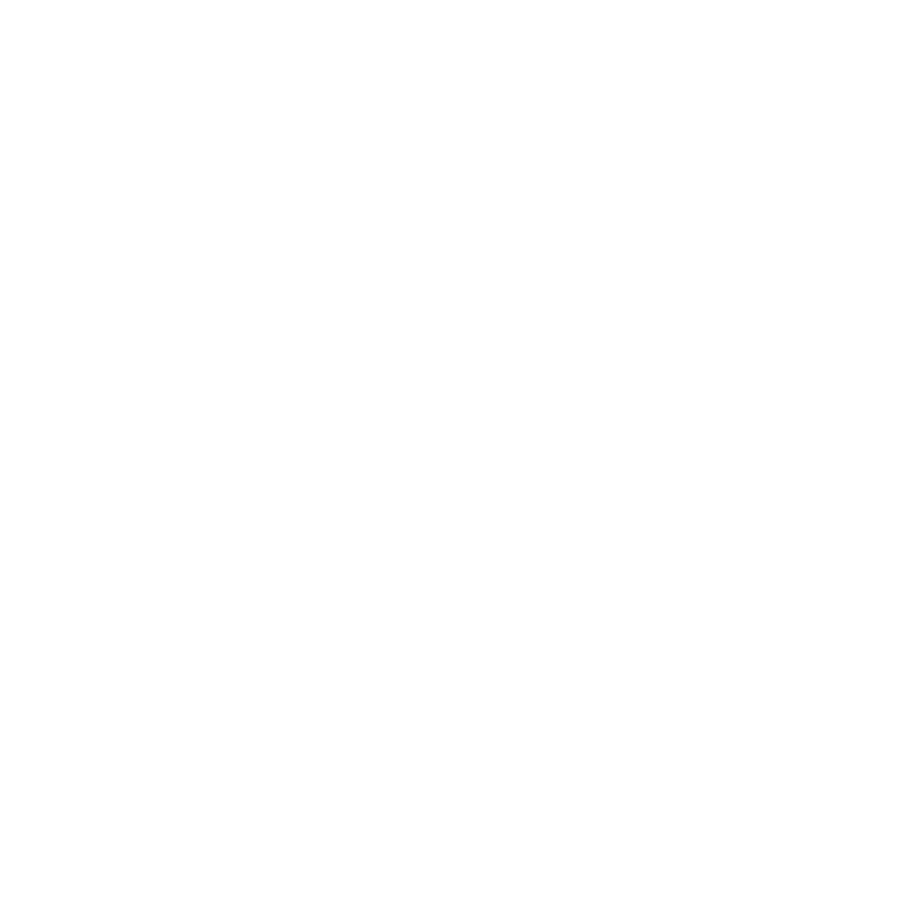

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_9a
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_9m
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_9p
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq g

<IPython.core.display.Javascript object>


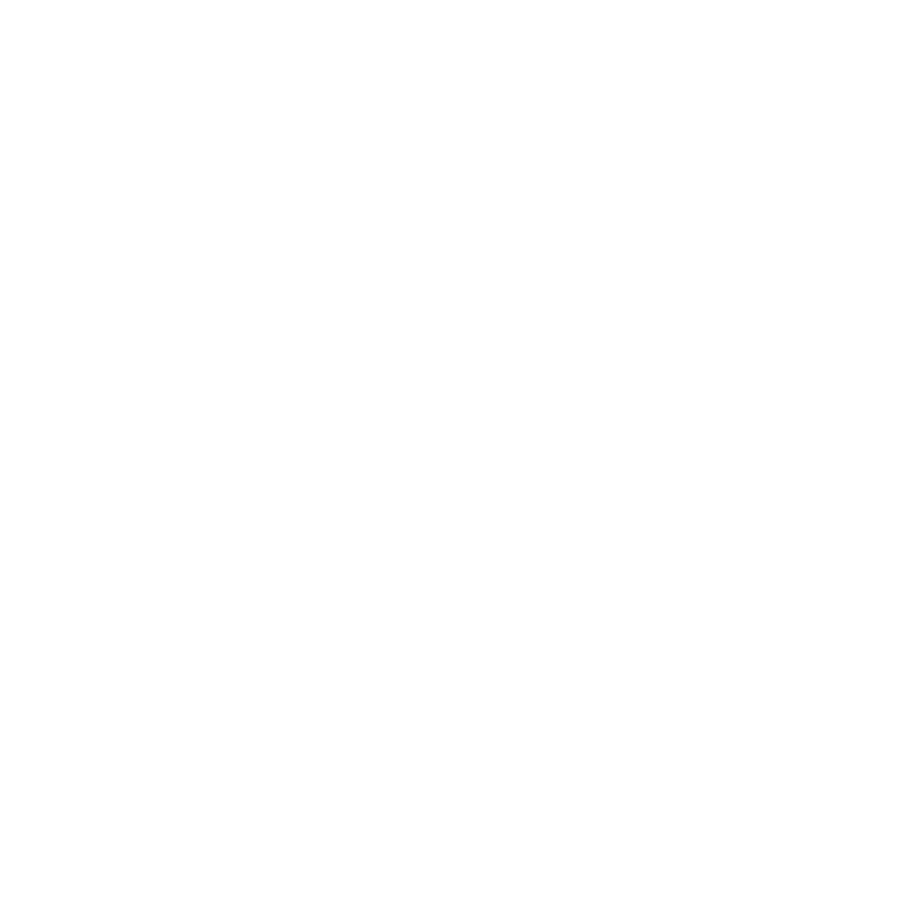

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_AVI
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 58
performing OLS (1D y)
Estimated OLS betas Norm Param. B Norm_abcd [11.4047 -1.3142]
wRSq 0.11687036941797091
wCC prediction 0.34186308577846086


<IPython.core.display.Javascript object>


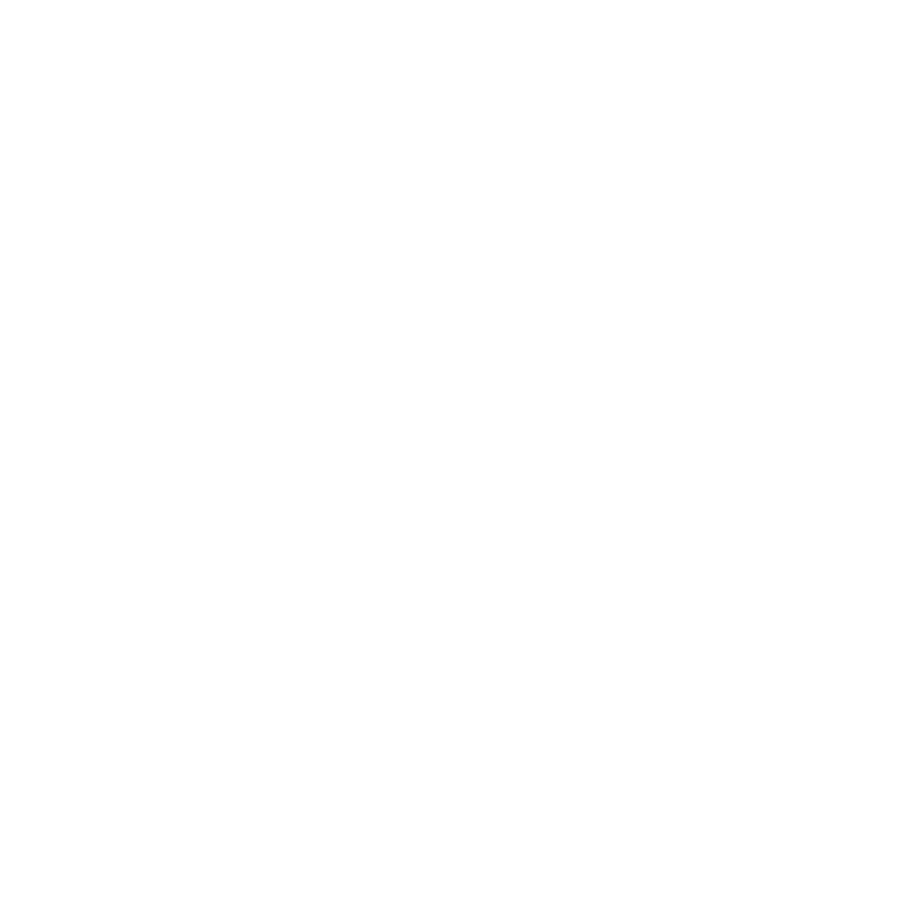

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_d23ab
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_d32
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_DVT
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 728
performing OLS (1D y)
Estimated OLS 

<IPython.core.display.Javascript object>


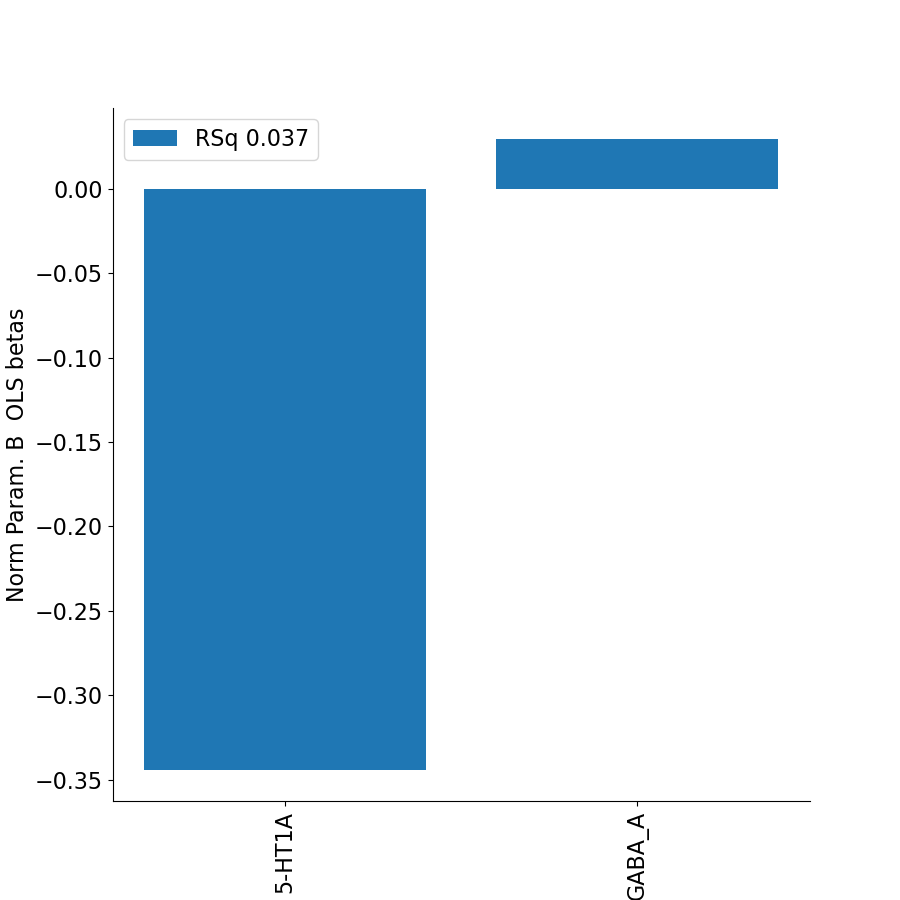

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_EC
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_FEF
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 1242
performing OLS (1D y)
Estimated OLS betas Norm Param. B Norm_abcd [-0.066  -0.0078]
wRSq 0.0029131852185455553
wCC prediction 0.05397393091618811


<IPython.core.display.Javascript object>


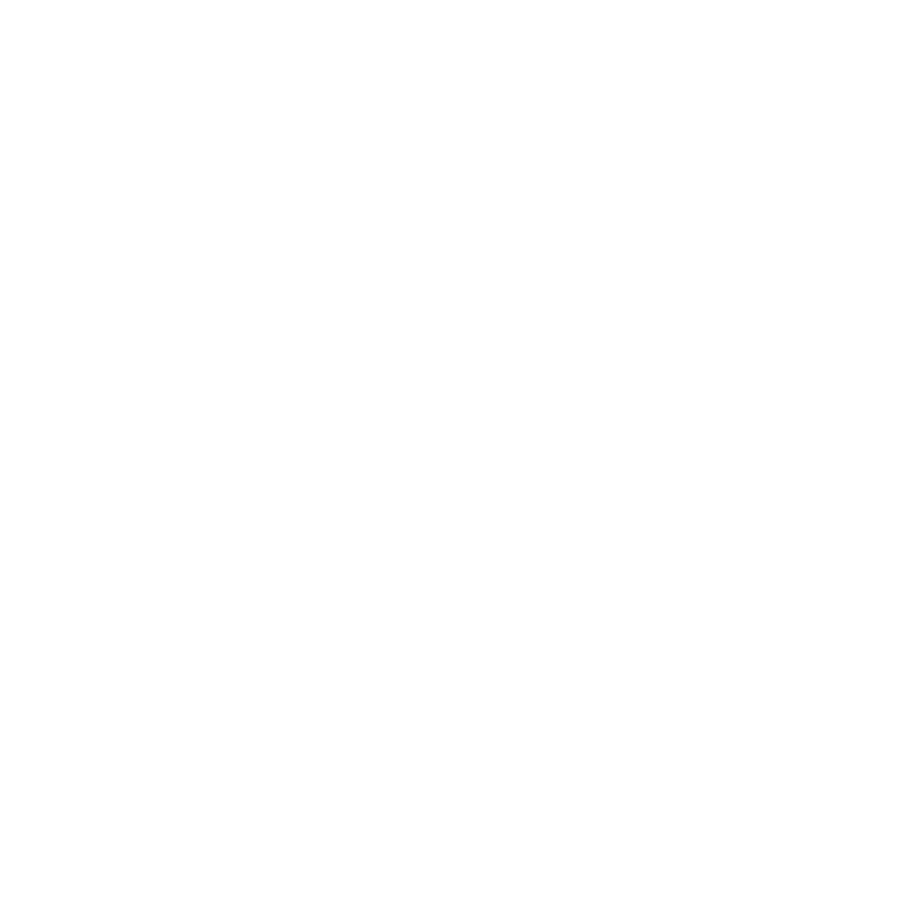

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_FFC
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 1265
performing OLS (1D y)
Estimated OLS betas Norm Param. B Norm_abcd [-0.1078 -0.0219]
wRSq 0.01881118157824546
wCC prediction 0.13715386096732857


<IPython.core.display.Javascript object>


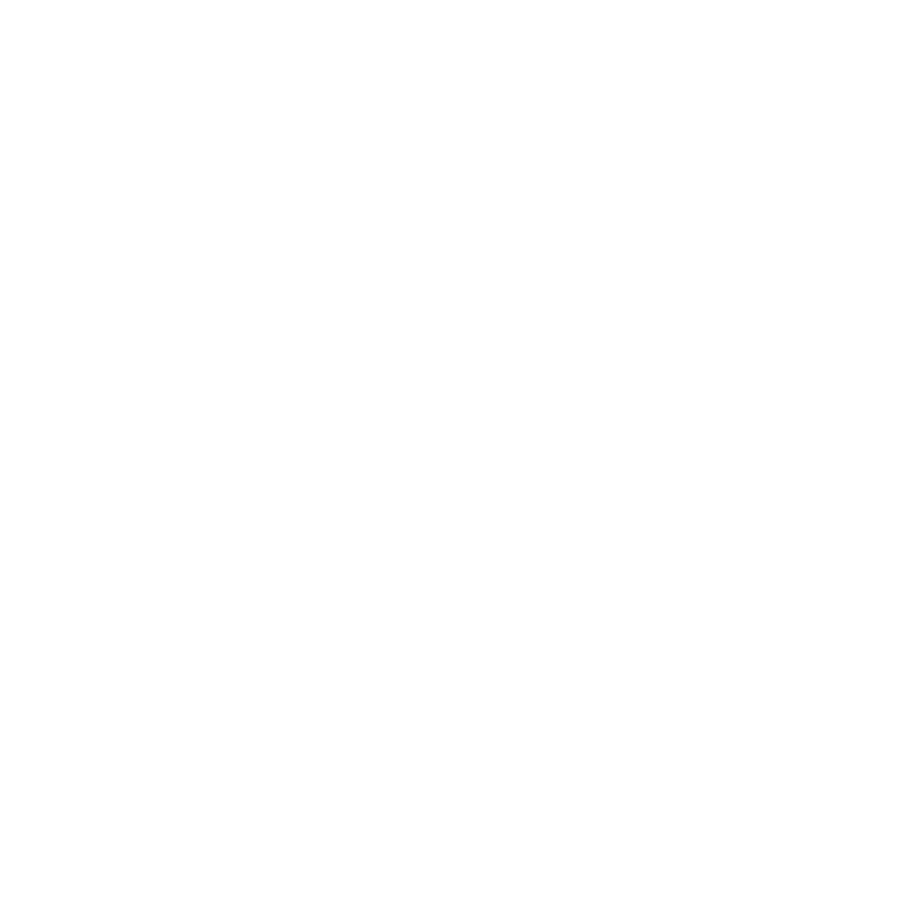

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_FOP1
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_FOP2
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_FOP3
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_c

<IPython.core.display.Javascript object>


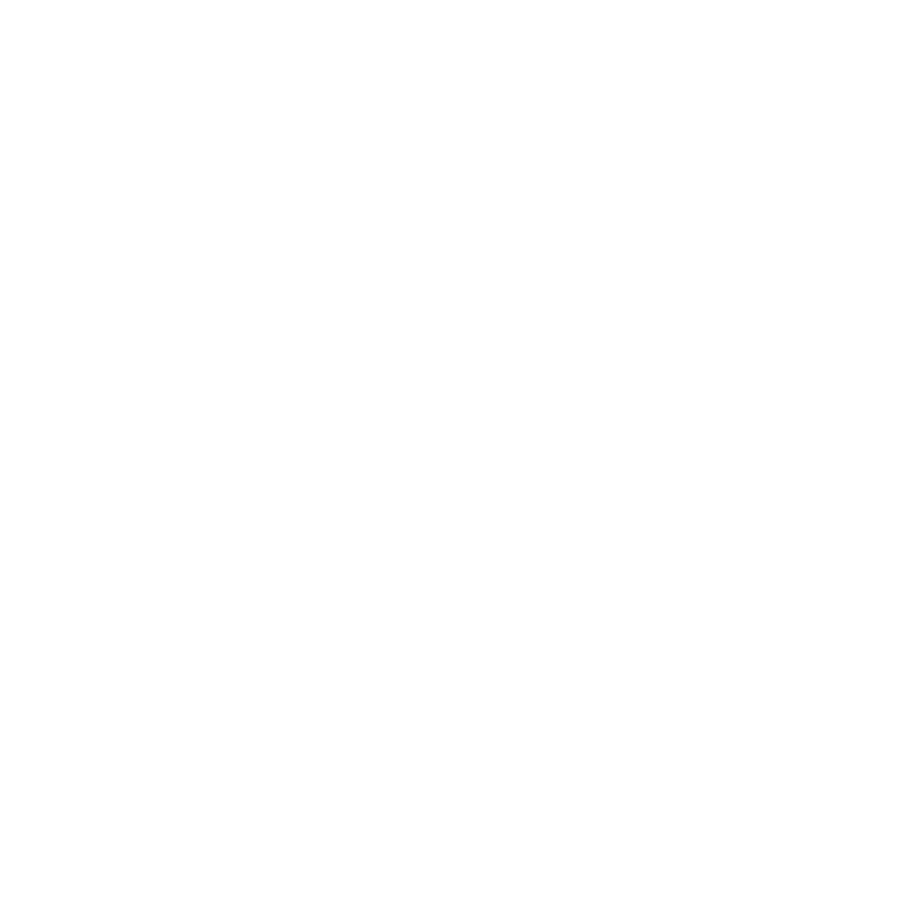

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_FOP5
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 101
performing OLS (1D y)
Estimated OLS betas Norm Param. B Norm_abcd [-3.3737  0.1253]
wRSq 0.05431716126532282
wCC prediction 0.23306042406492553


<IPython.core.display.Javascript object>


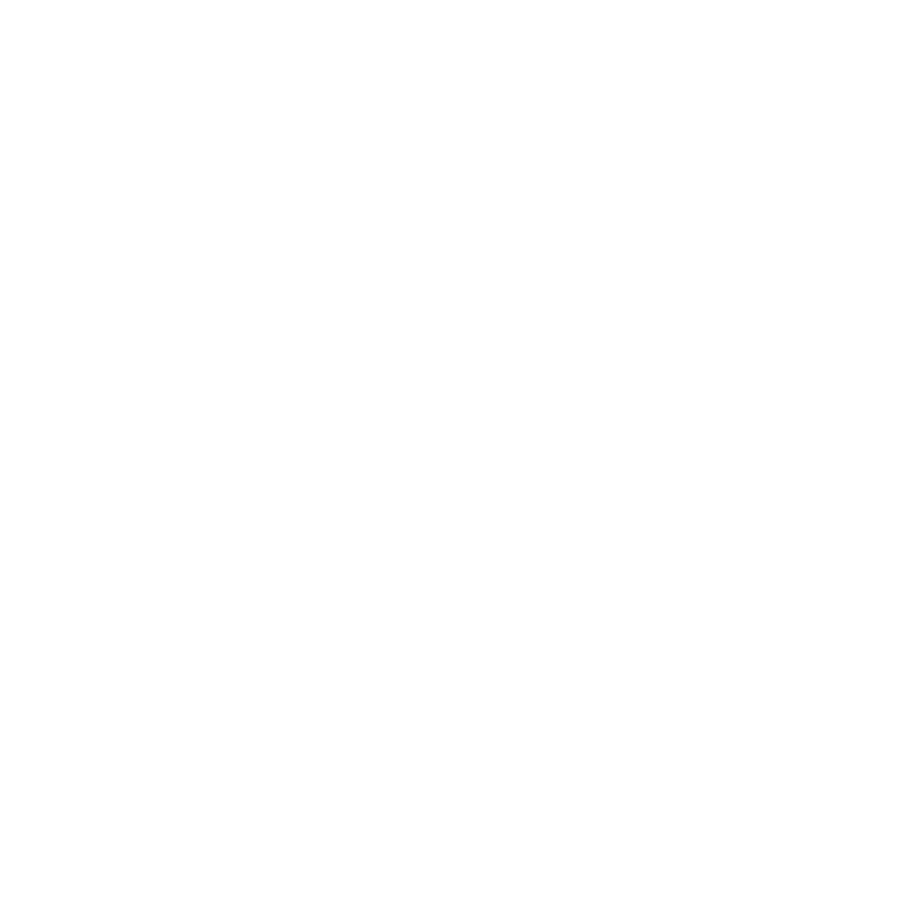

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_FST
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 781
performing OLS (1D y)
Estimated OLS betas Norm Param. B Norm_abcd [ 0.1    -0.0021]
wRSq 0.02122224446941312
wCC prediction 0.1456785655798861


<IPython.core.display.Javascript object>


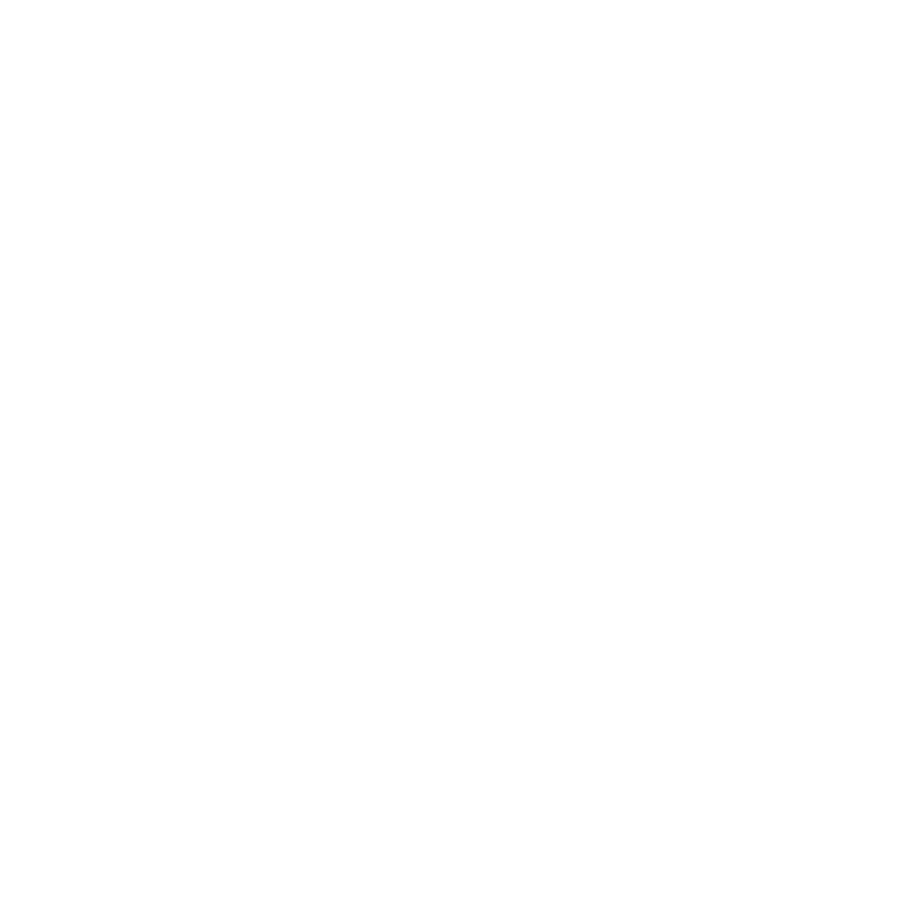

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_H
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_i6-8
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 29
performing OLS (1D y)
Estimated OLS betas Norm Param. B Norm_abcd [1.2854 0.1951]
wRSq 0.296663350469477
wCC prediction 0.5446681103841835


<IPython.core.display.Javascript object>


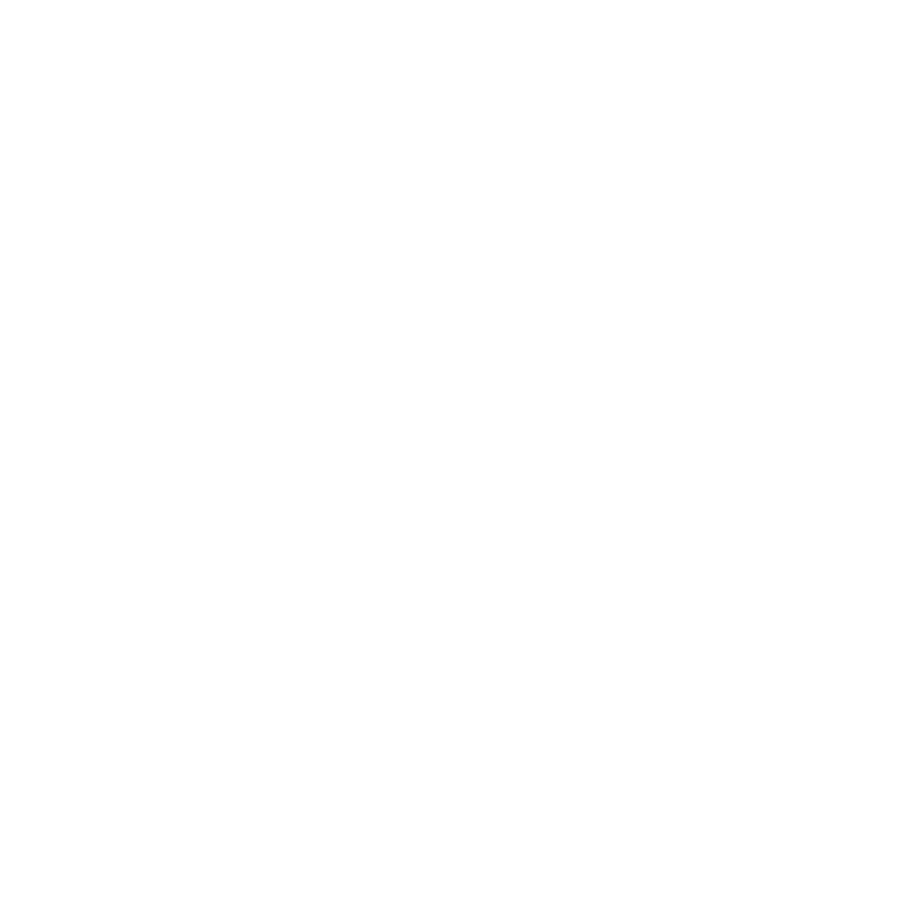

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_IFJa
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 37
performing OLS (1D y)
Estimated OLS betas Norm Param. B Norm_abcd [ 7.3328 -0.3563]
wRSq 0.17761125532075162
wCC prediction 0.42143950374965033


<IPython.core.display.Javascript object>


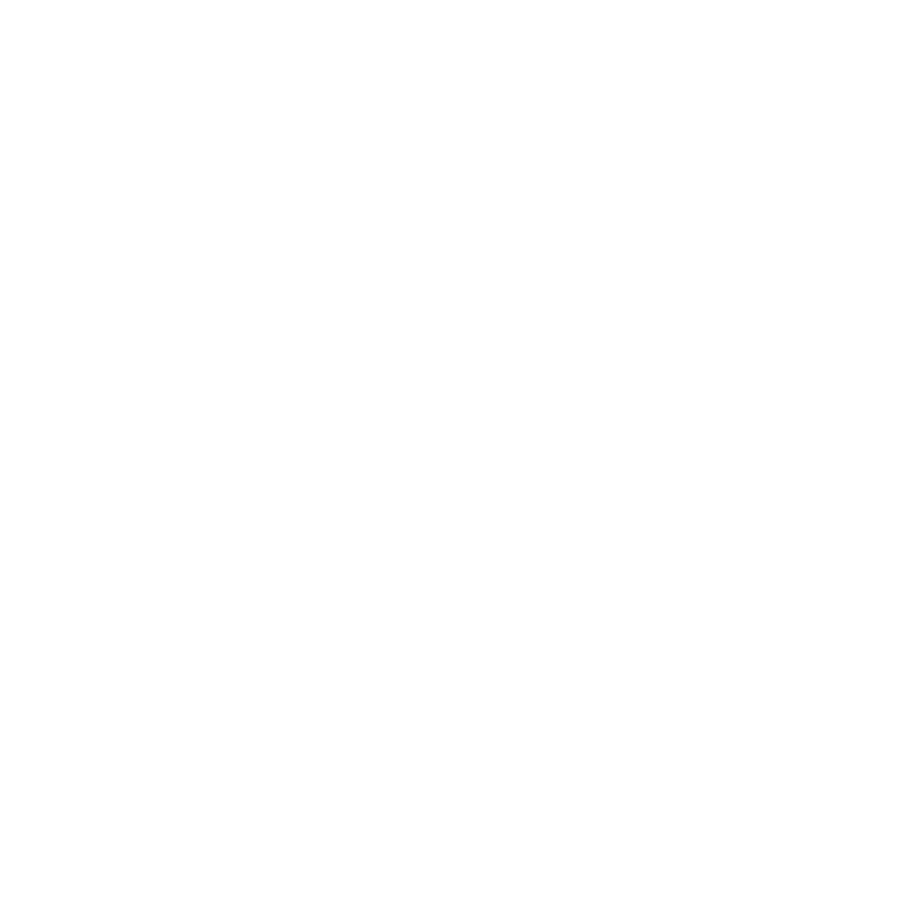

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_IFJp
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 499
performing OLS (1D y)
Estimated OLS betas Norm Param. B Norm_abcd [-0.5285 -0.0833]
wRSq 0.11101336740096279
wCC prediction 0.3331866855097345


<IPython.core.display.Javascript object>


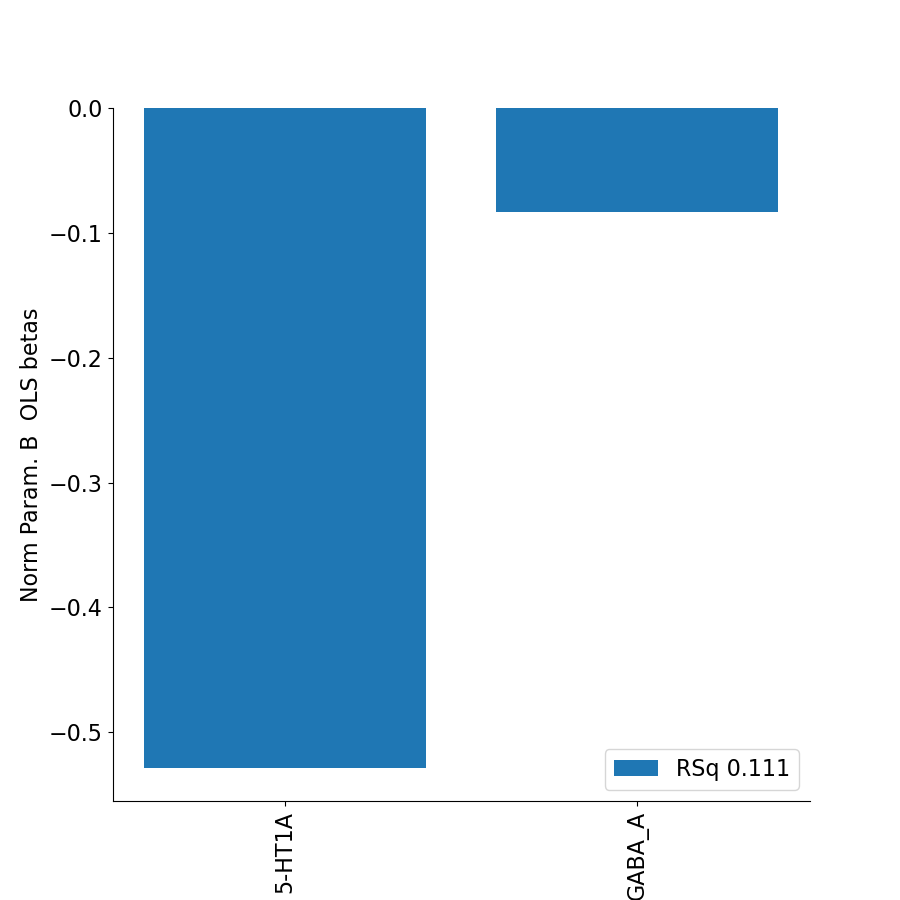

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_IFSa
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 2
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_IFSp
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 129
performing OLS (1D y)
Estimated OLS betas Norm Param. B Norm_abcd [ 2.693  -0.2408]
wRSq 0.05517587651534983
wCC prediction 0.2348954586946066


<IPython.core.display.Javascript object>


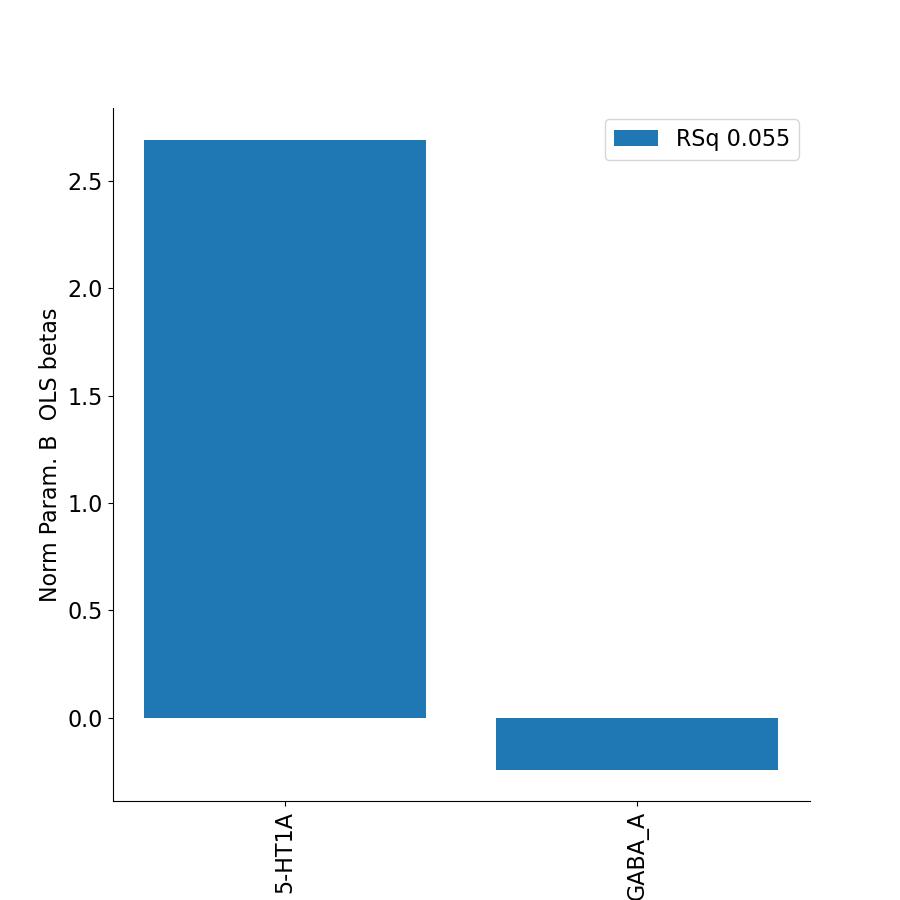

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_Ig
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_IP0
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 989
performing OLS (1D y)
Estimated OLS betas Norm Param. B Norm_abcd [ 0.1571 -0.0076]
wRSq 0.009005177539376796
wCC prediction 0.09489561391011066


<IPython.core.display.Javascript object>


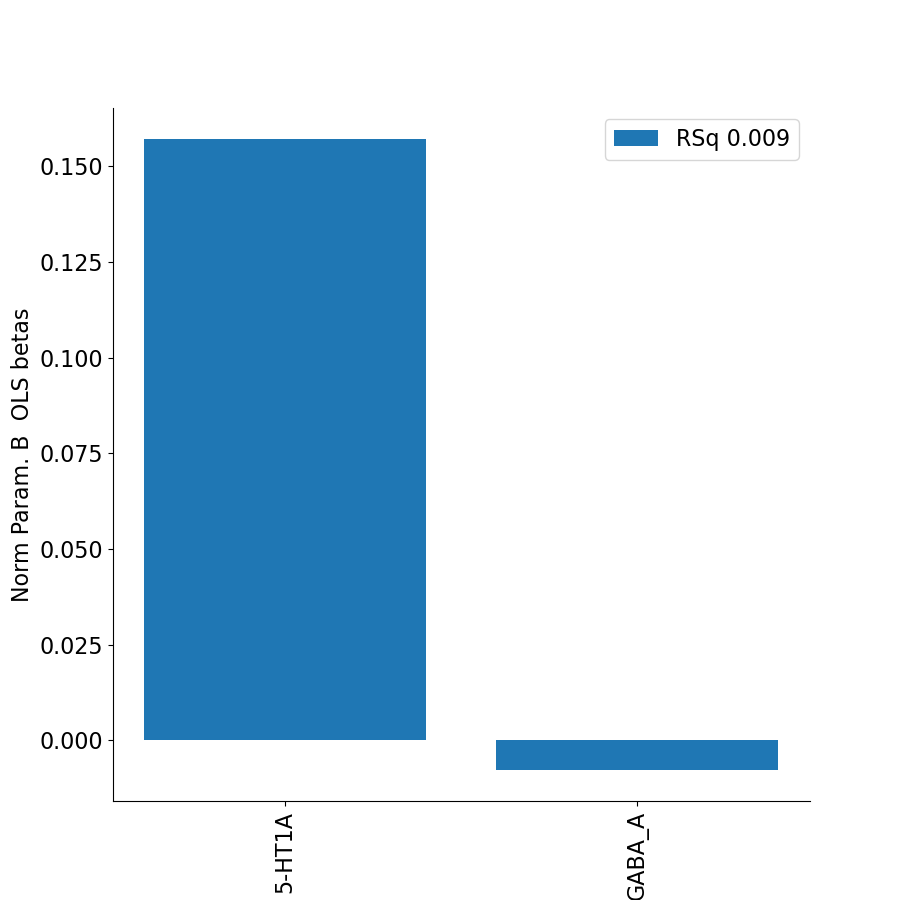

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_IP1
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 23
performing OLS (1D y)
Estimated OLS betas Norm Param. B Norm_abcd [-0.5695  0.01  ]
wRSq 0.044572331359536754
wCC prediction 0.21112160325162538


<IPython.core.display.Javascript object>


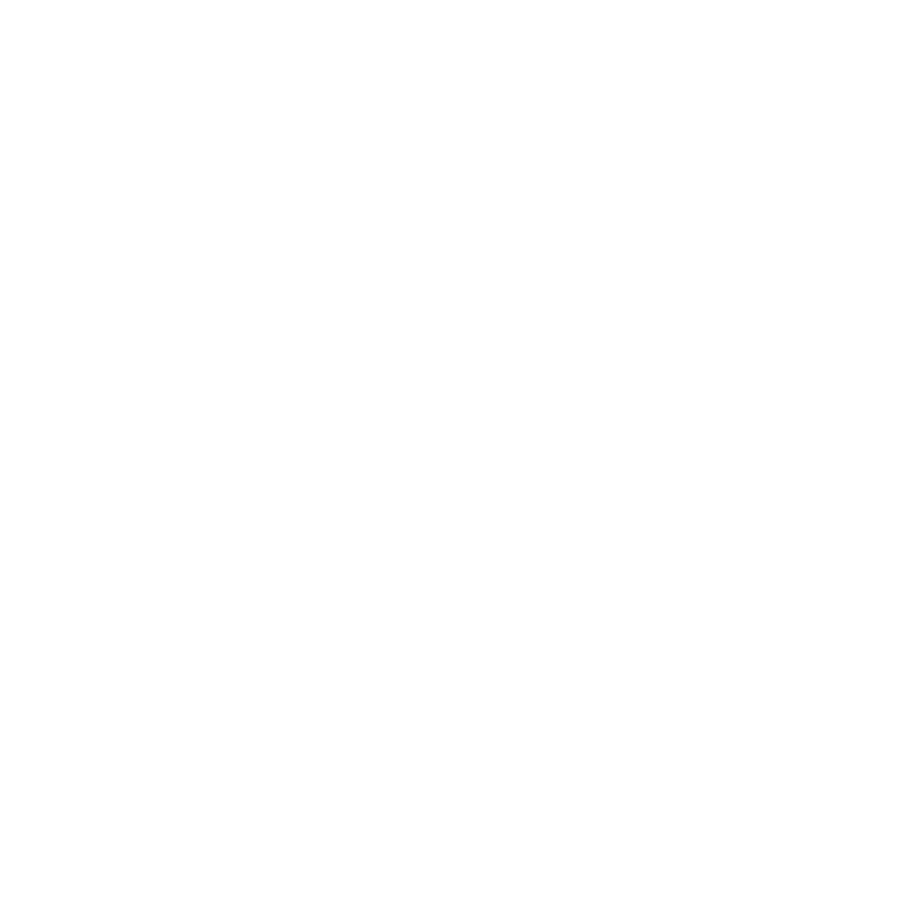

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_IP2
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 100
performing OLS (1D y)
Estimated OLS betas Norm Param. B Norm_abcd [ 0.9776 -0.1058]
wRSq 0.04493738332883557
wCC prediction 0.2119843940690818


<IPython.core.display.Javascript object>


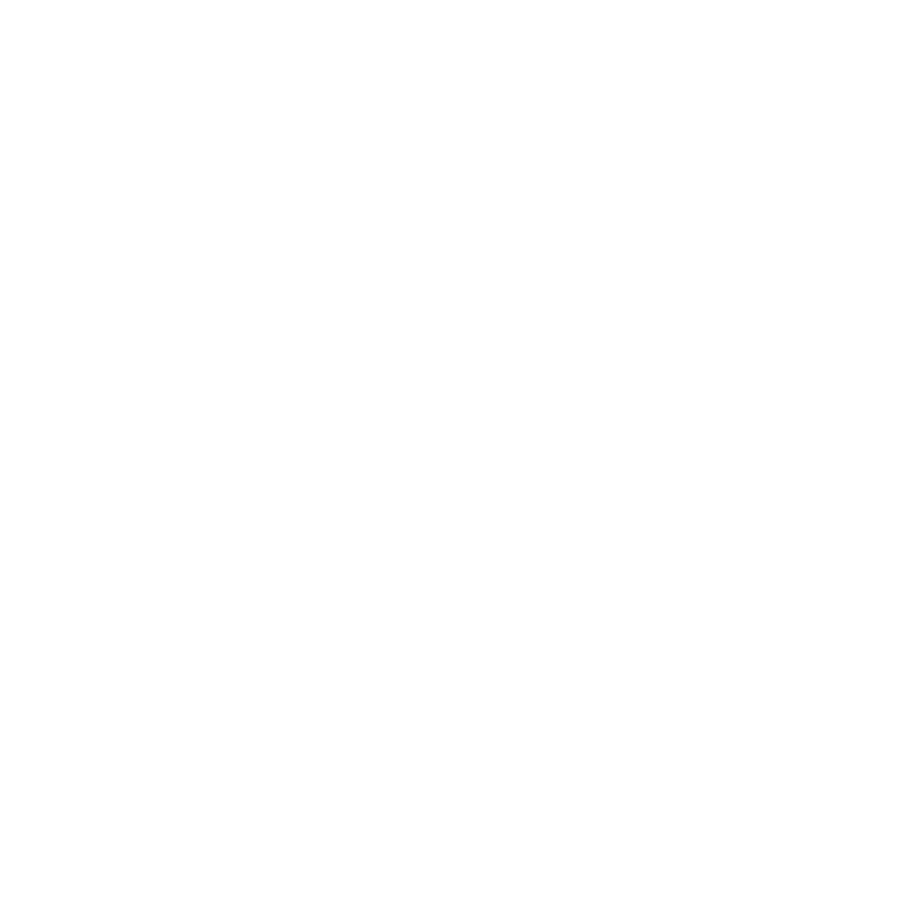

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_IPS1
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 1187
performing OLS (1D y)
Estimated OLS betas Norm Param. B Norm_abcd [-0.1484 -0.007 ]
wRSq 0.05886719710078492
wCC prediction 0.24262563158245454


<IPython.core.display.Javascript object>


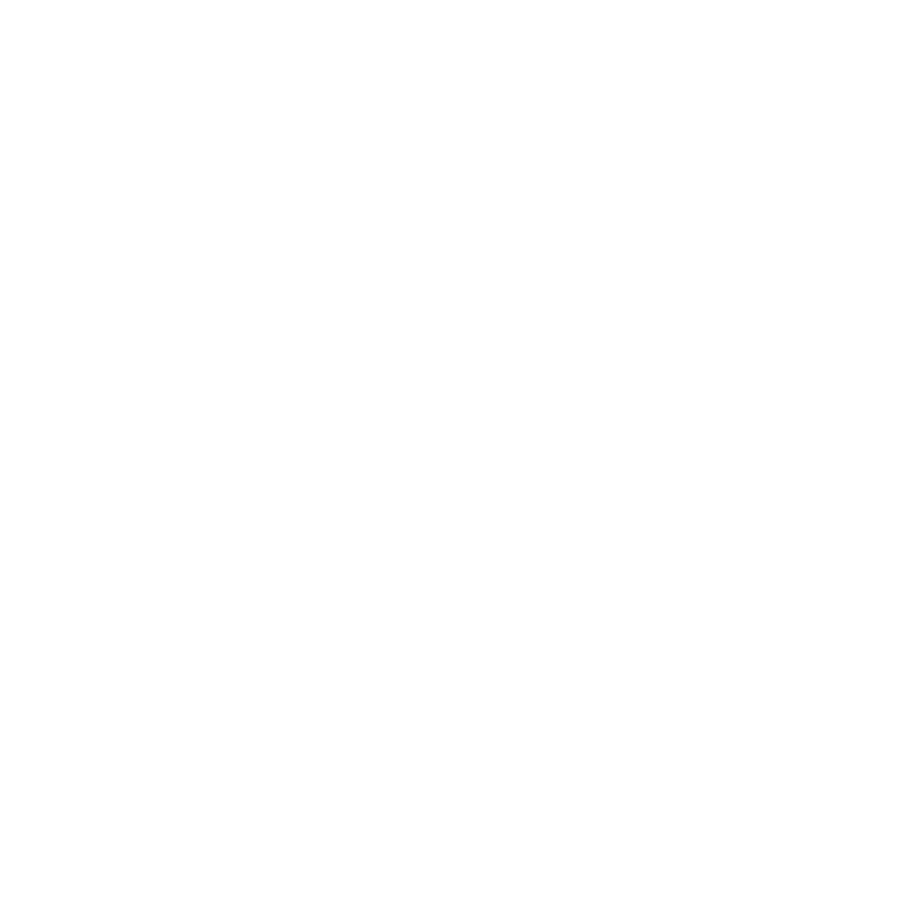

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_LBelt
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_LIPd
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 660
performing OLS (1D y)
Estimated OLS betas Norm Param. B Norm_abcd [-0.1912  0.0007]
wRSq 0.014407868931861634
wCC prediction 0.12003278273814051


<IPython.core.display.Javascript object>


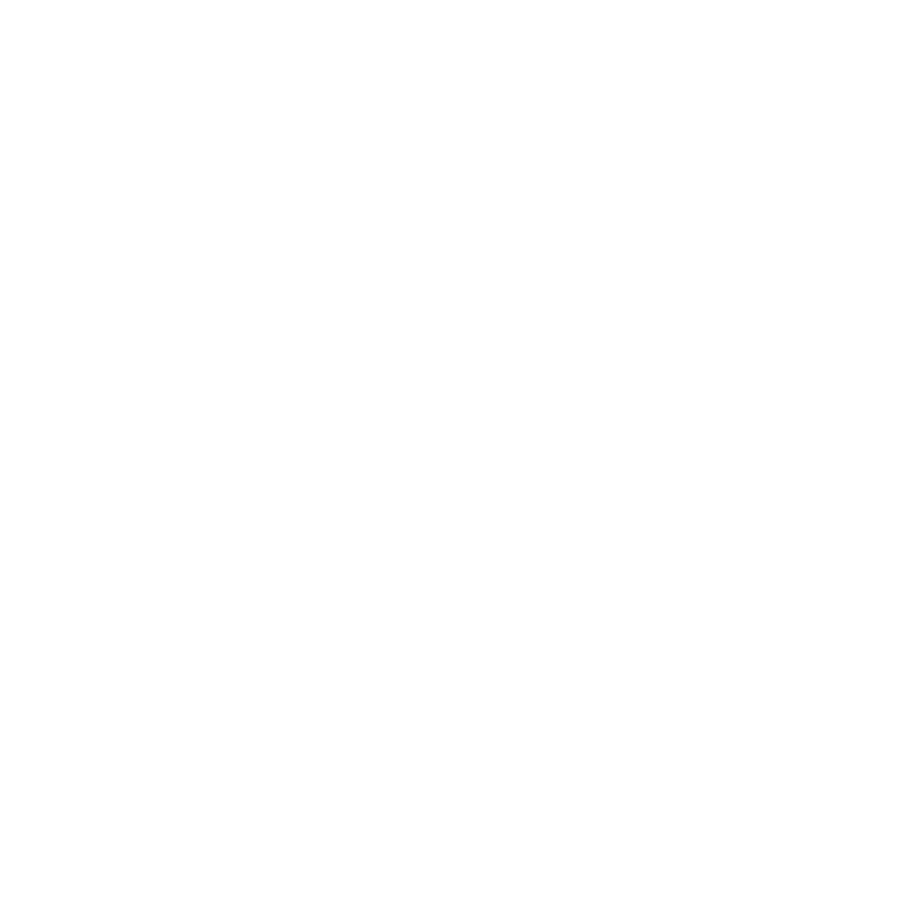

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_LIPv
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 1426
performing OLS (1D y)
Estimated OLS betas Norm Param. B Norm_abcd [-0.0634  0.0027]
wRSq 0.012674698575952936
wCC prediction 0.11258196381282838


<IPython.core.display.Javascript object>


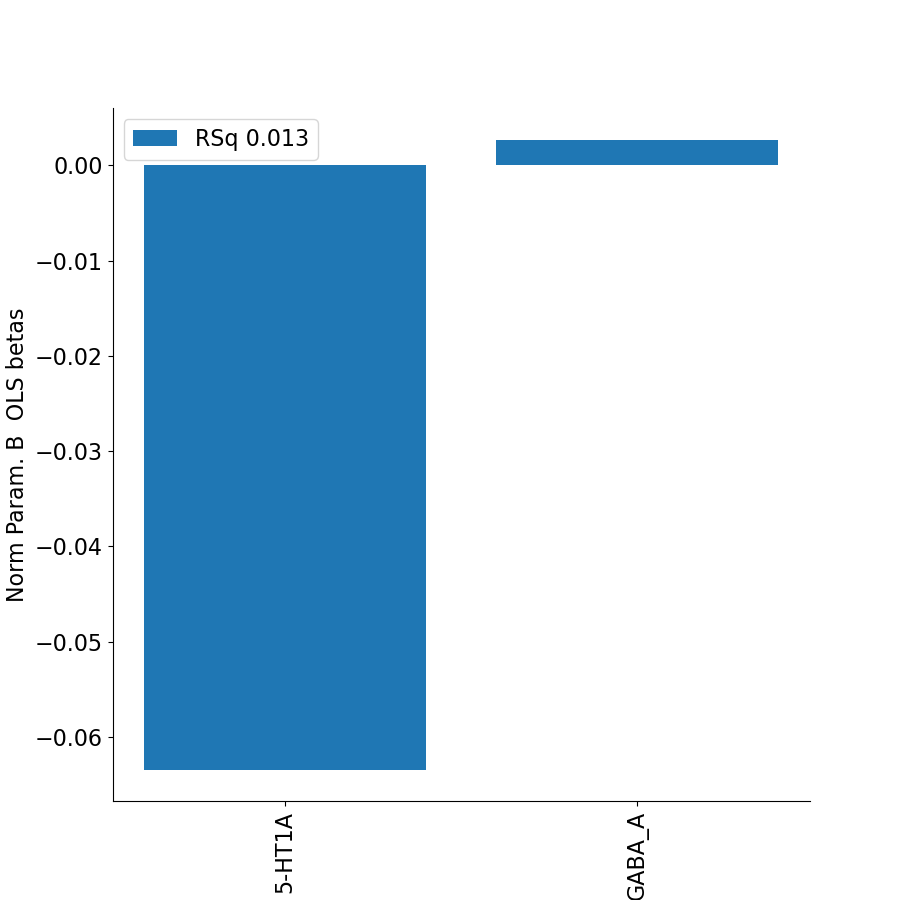

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_LO1
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 586
performing OLS (1D y)
Estimated OLS betas Norm Param. B Norm_abcd [ 0.0612 -0.0024]
wRSq 0.0017272829598240502
wCC prediction 0.041560593833871846


<IPython.core.display.Javascript object>


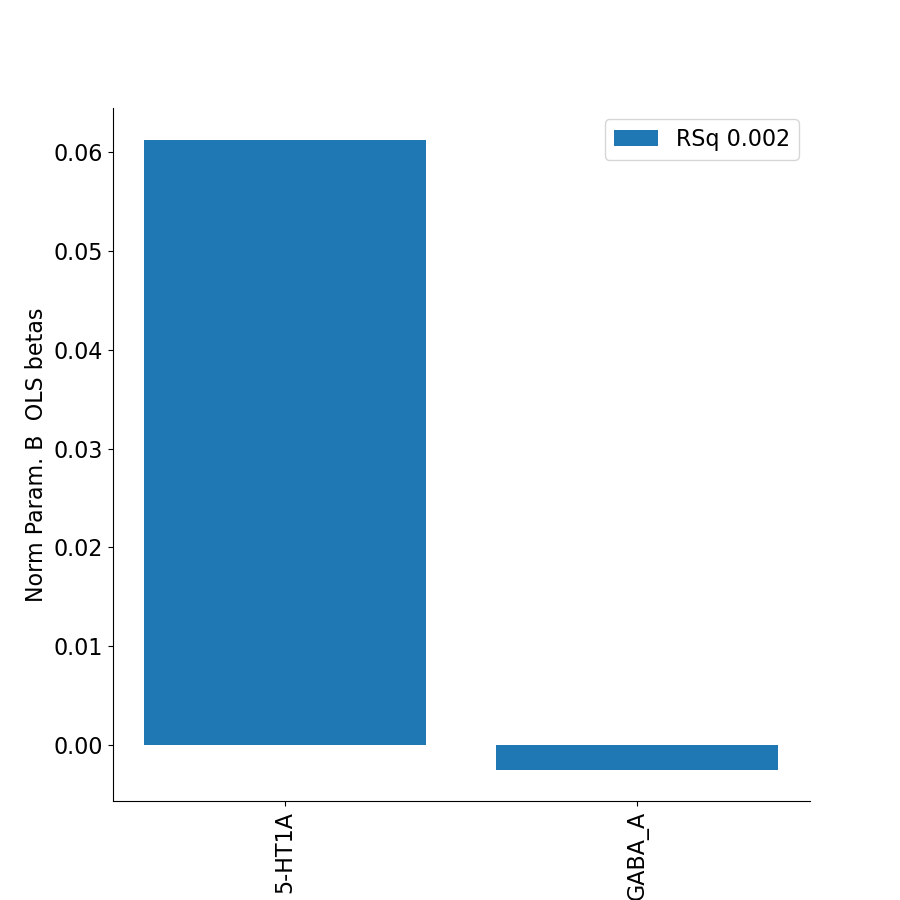

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_LO2
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 543
performing OLS (1D y)
Estimated OLS betas Norm Param. B Norm_abcd [-0.2031 -0.0403]
wRSq 0.04623583277198762
wCC prediction 0.21502519101721004


<IPython.core.display.Javascript object>


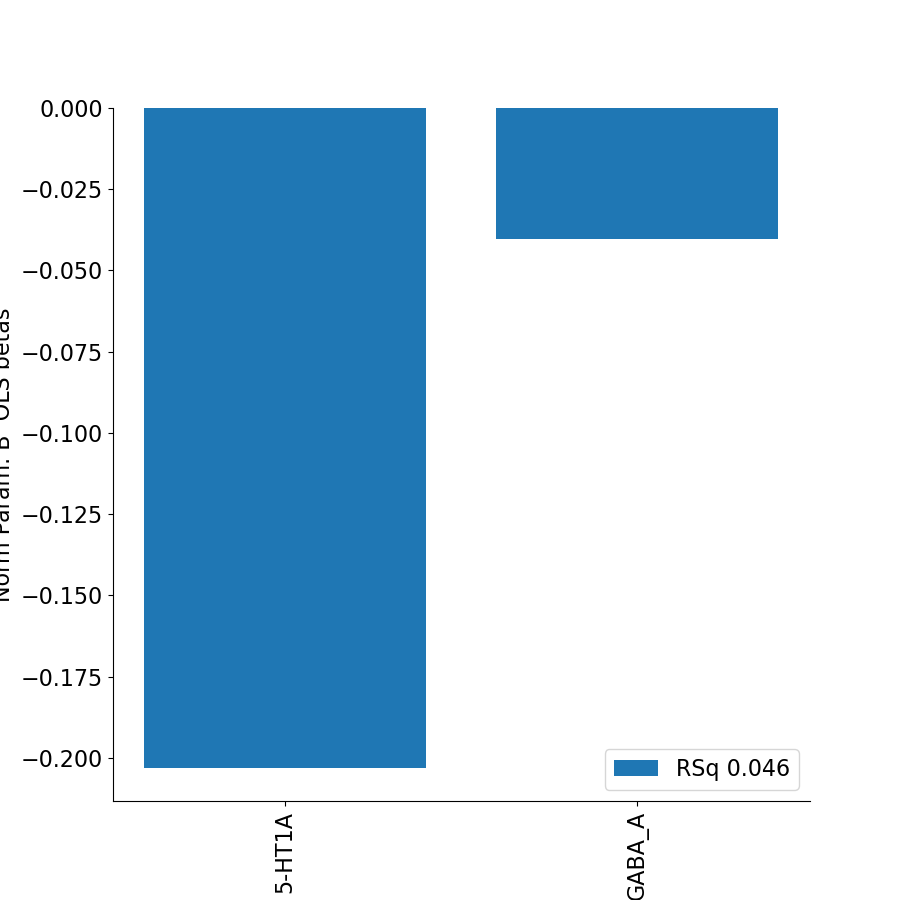

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_LO3
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 672
performing OLS (1D y)
Estimated OLS betas Norm Param. B Norm_abcd [-0.1589  0.0127]
wRSq 0.029946217062844727
wCC prediction 0.17304975314297547


<IPython.core.display.Javascript object>


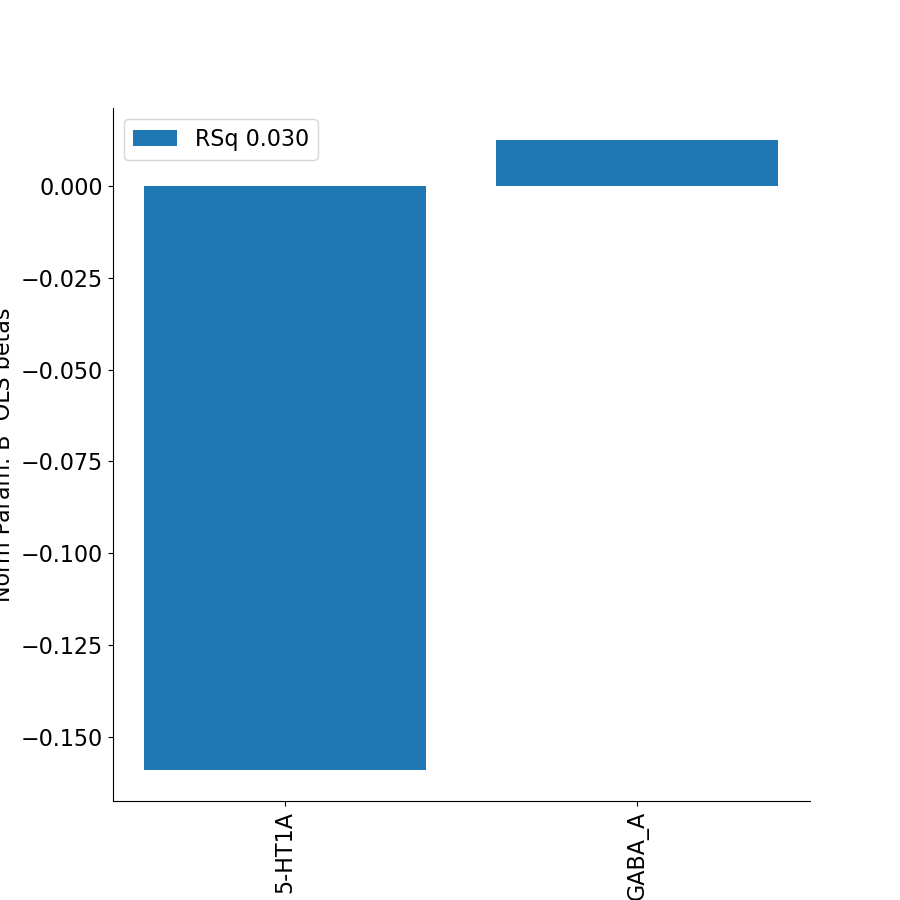

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_MBelt
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_MI
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_MIP
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 1433
performing OLS (1D y)
Estimated OLS 

<IPython.core.display.Javascript object>


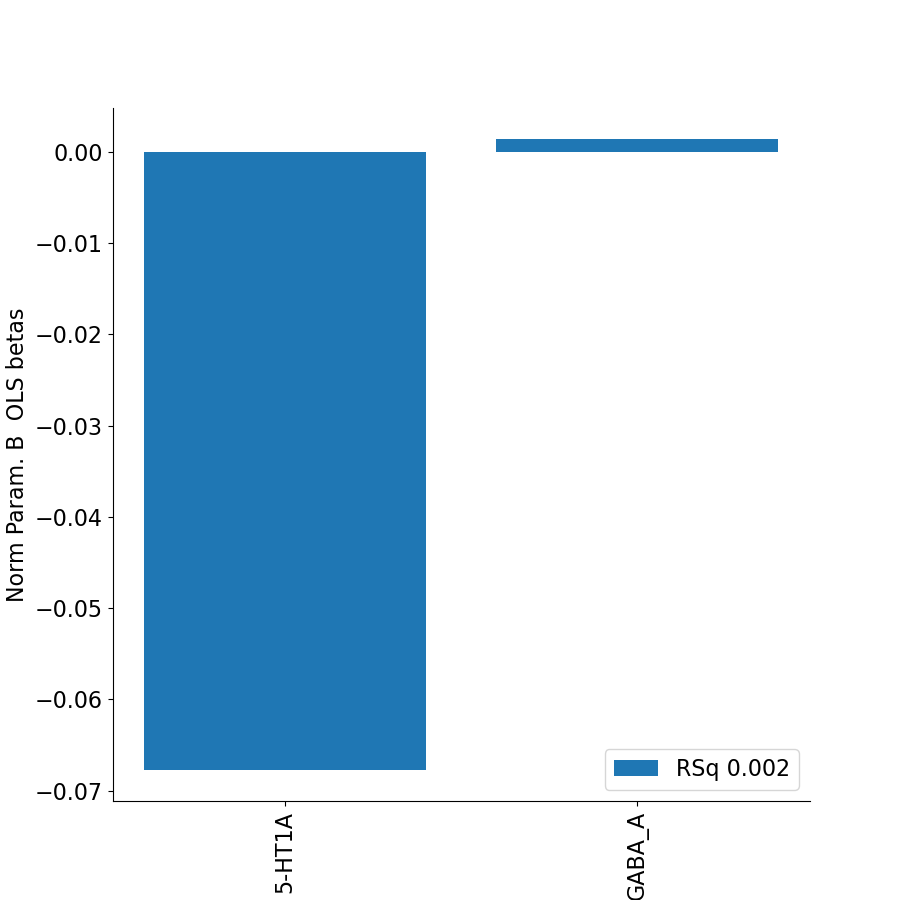

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_MST
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 745
performing OLS (1D y)
Estimated OLS betas Norm Param. B Norm_abcd [-0.2965 -0.0065]
wRSq 0.19493012904943996
wCC prediction 0.44150892295562993


<IPython.core.display.Javascript object>


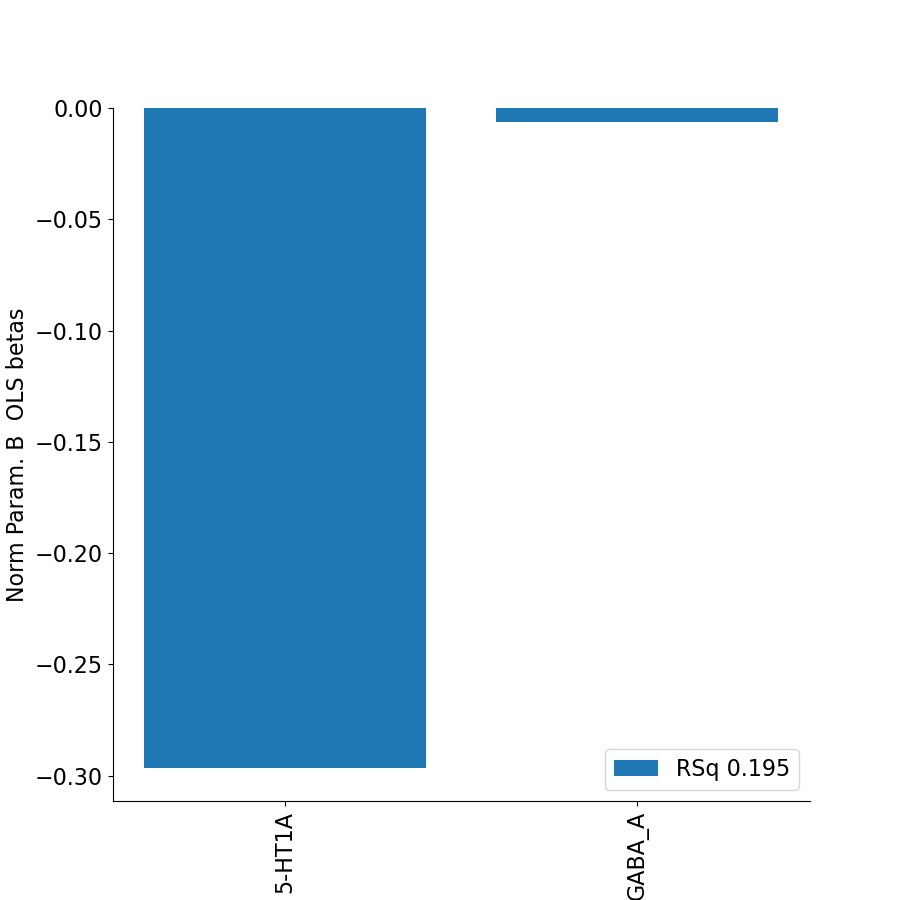

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_MT
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 586
performing OLS (1D y)
Estimated OLS betas Norm Param. B Norm_abcd [-0.2632 -0.0047]
wRSq 0.12160251301320002
wCC prediction 0.34871551874443457


<IPython.core.display.Javascript object>


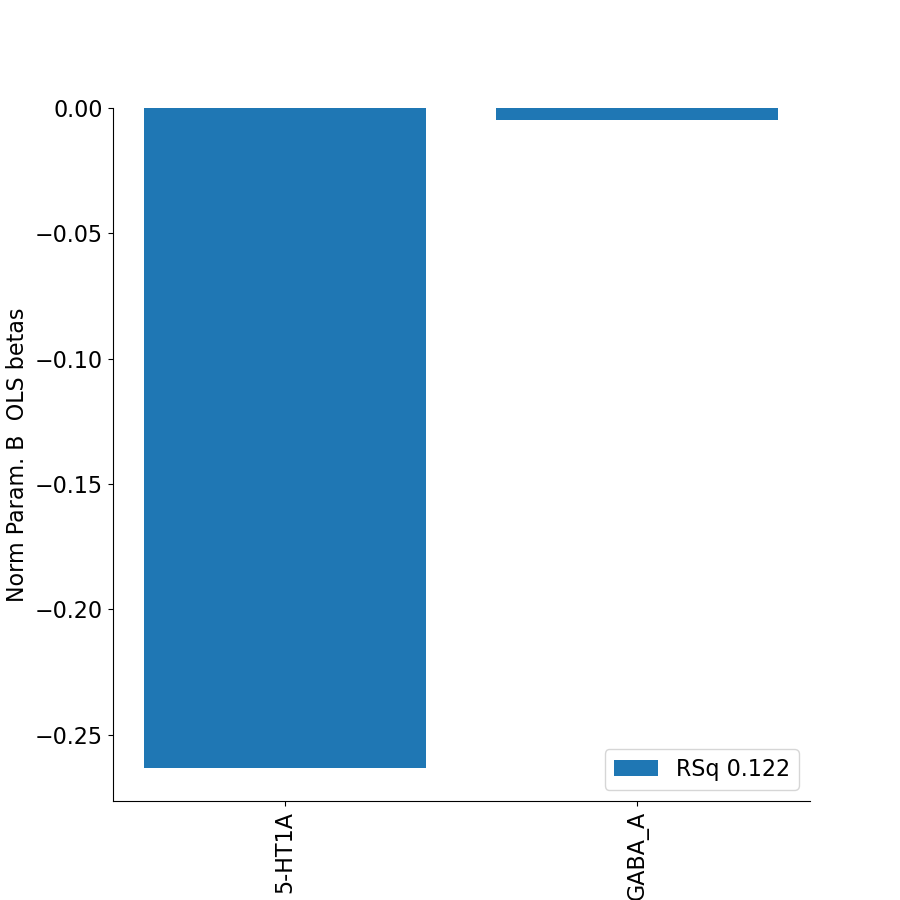

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_OFC
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_OP1
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_OP2-3
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cv

<IPython.core.display.Javascript object>


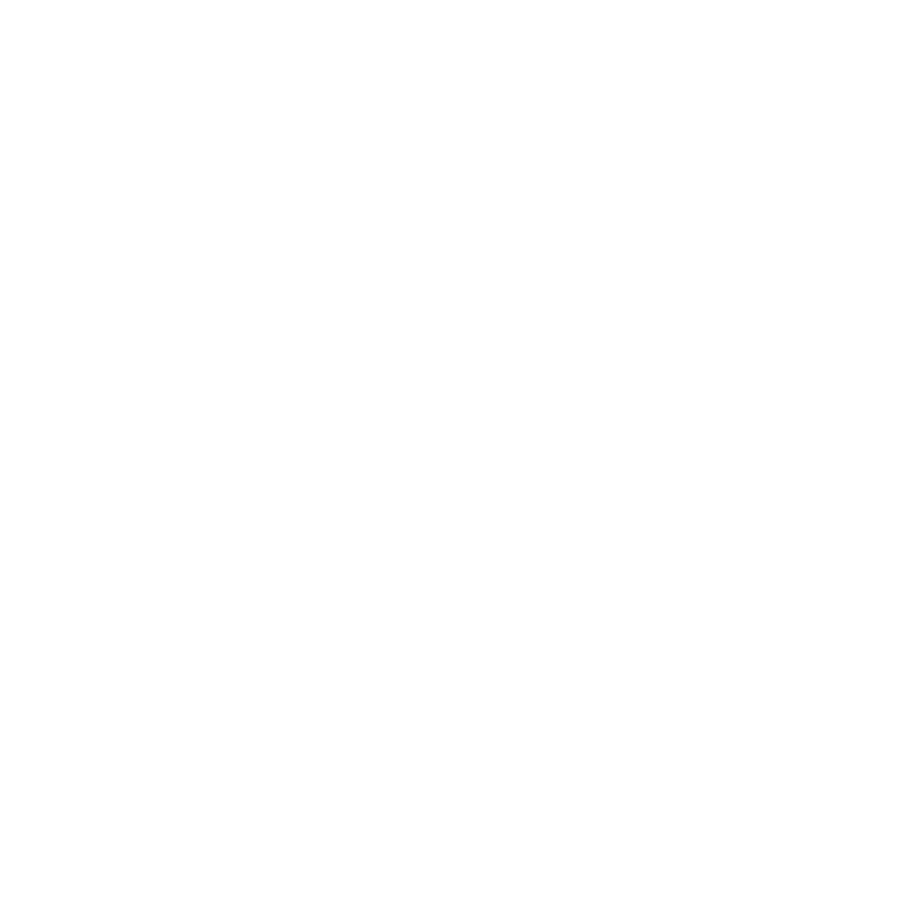

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_p47r
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_p9-46v
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 93
performing OLS (1D y)
Estimated OLS betas Norm Param. B Norm_abcd [-2.158  -0.0254]
wRSq 0.401212094625343
wCC prediction 0.6334130521431836


<IPython.core.display.Javascript object>


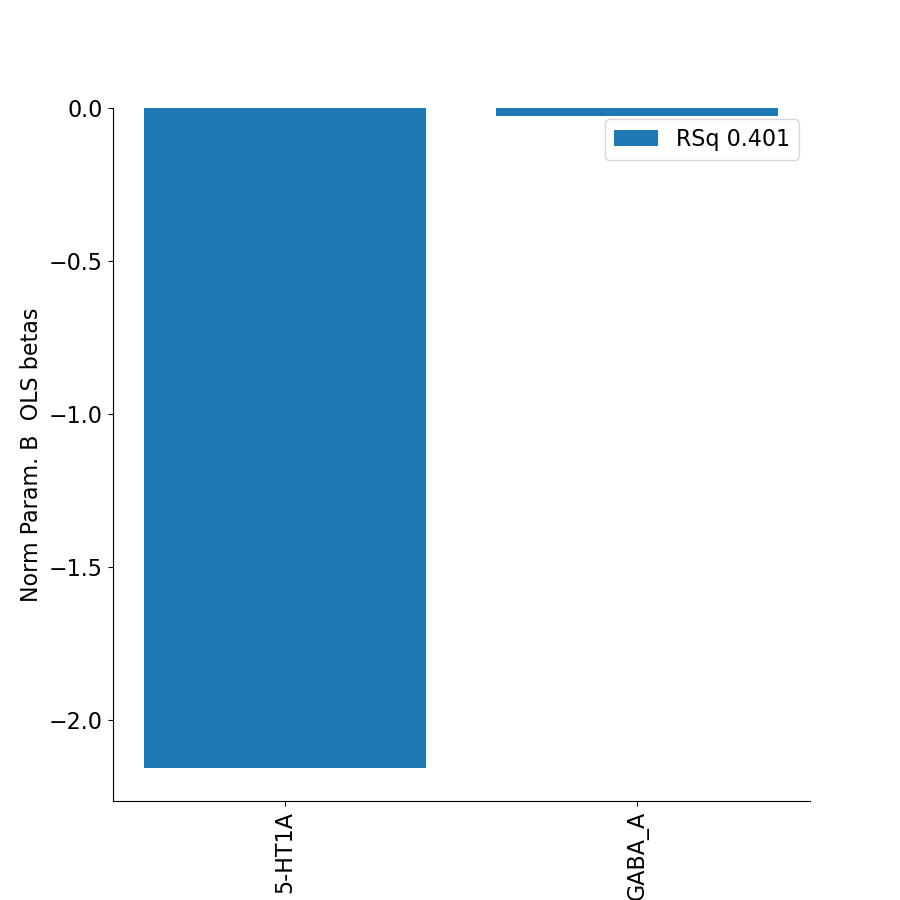

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PBelt
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PCV
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 237
performing OLS (1D y)
Estimated OLS betas Norm Param. B Norm_abcd [ 2.0879 -0.0423]
wRSq 0.13527278989739921
wCC prediction 0.3677944941096852


<IPython.core.display.Javascript object>


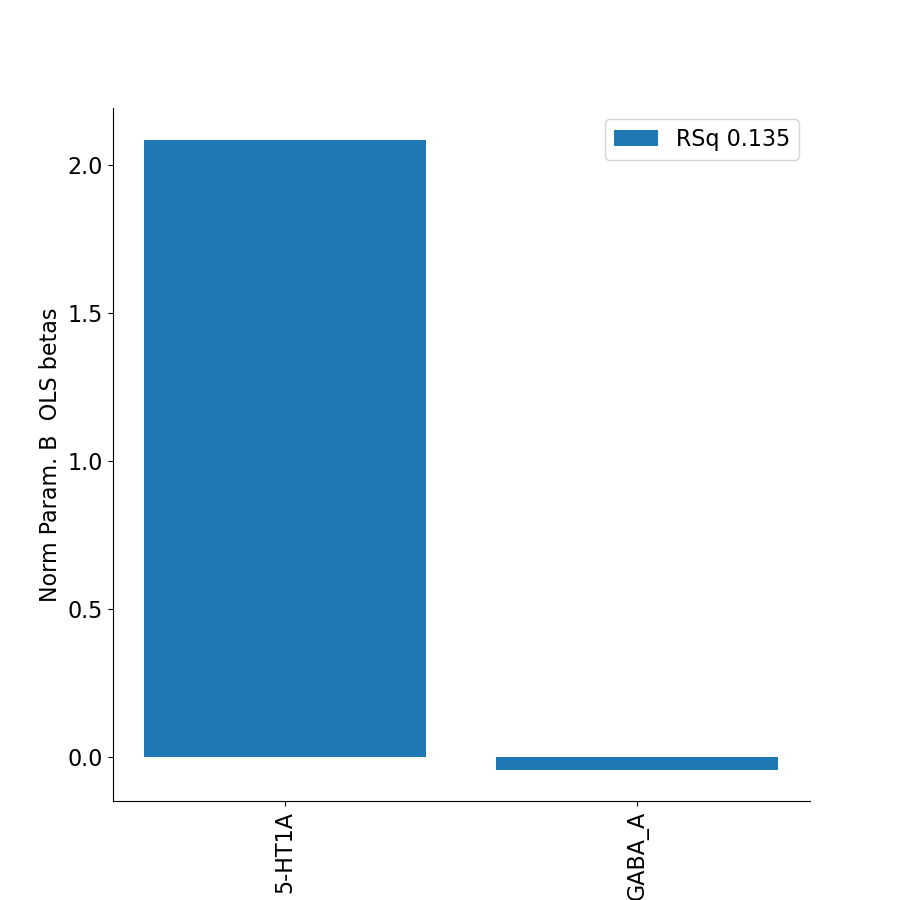

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PeEc
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PEF
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 705
performing OLS (1D y)
Estimated OLS betas Norm Param. B Norm_abcd [-1.8121 -0.1406]
wRSq 0.39278030563668653
wCC prediction 0.6267218726330577


<IPython.core.display.Javascript object>


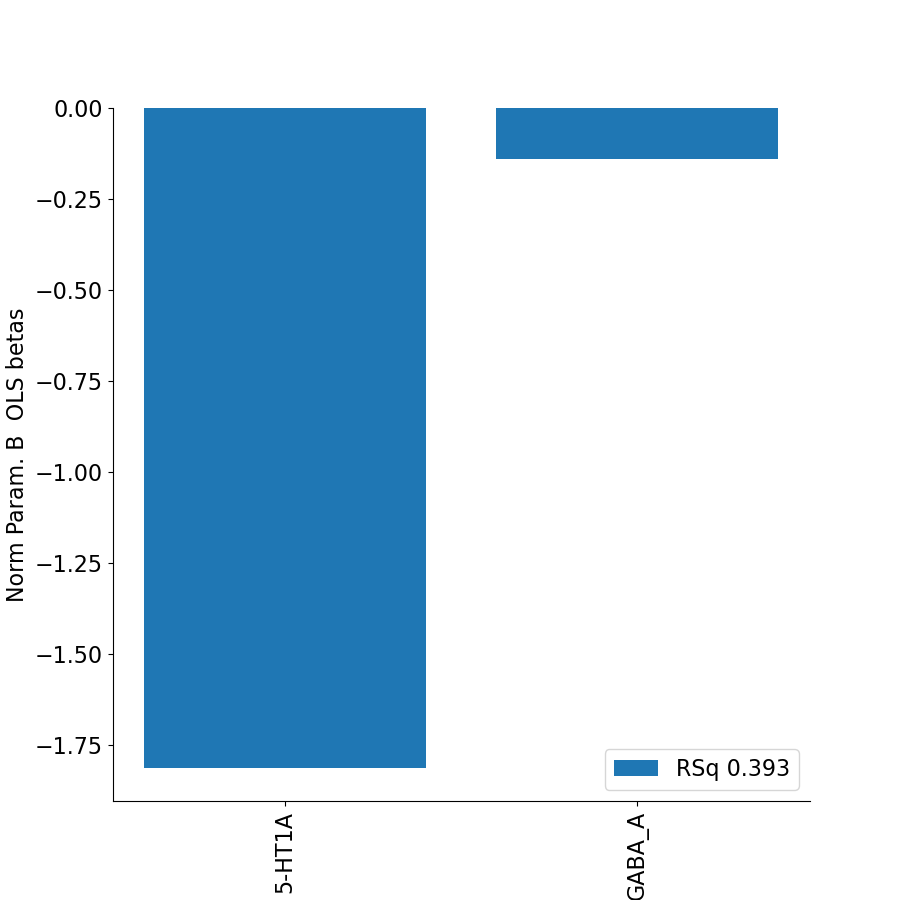

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PF
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 404
performing OLS (1D y)
Estimated OLS betas Norm Param. B Norm_abcd [0.1211 0.0061]
wRSq 0.001563587537373845
wCC prediction 0.039542224739813205


<IPython.core.display.Javascript object>


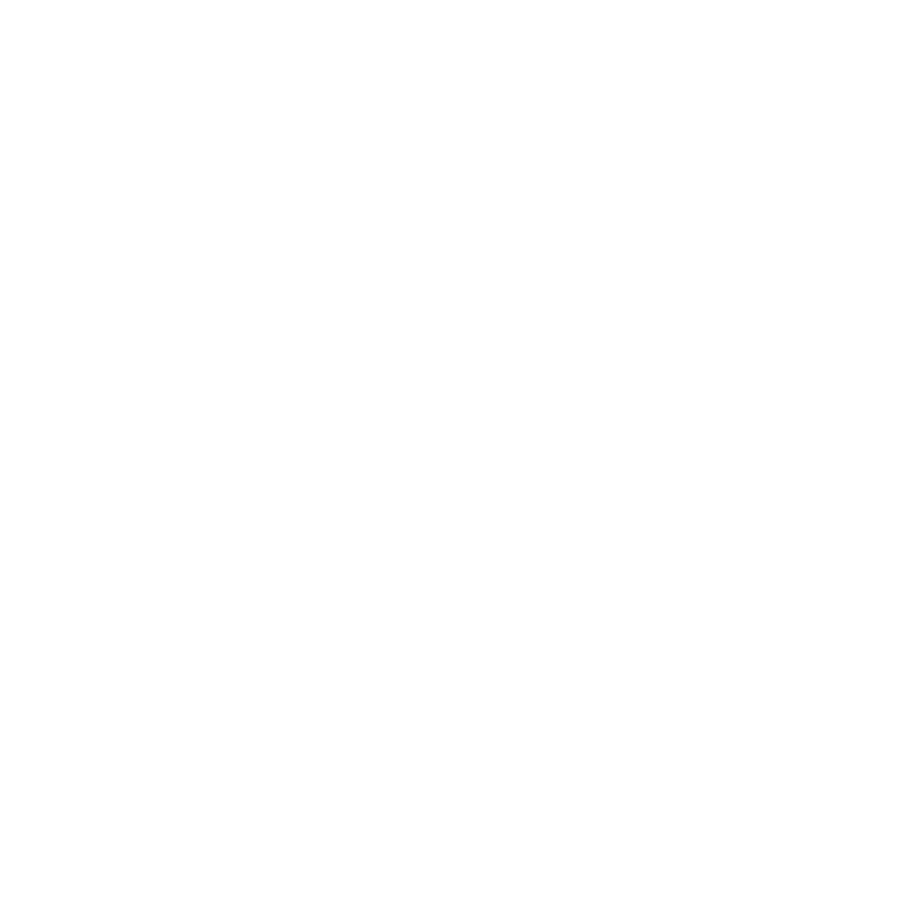

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PFcm
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PFm
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PFop
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 412
performing OLS (1D y)
Estimated OLS 

<IPython.core.display.Javascript object>


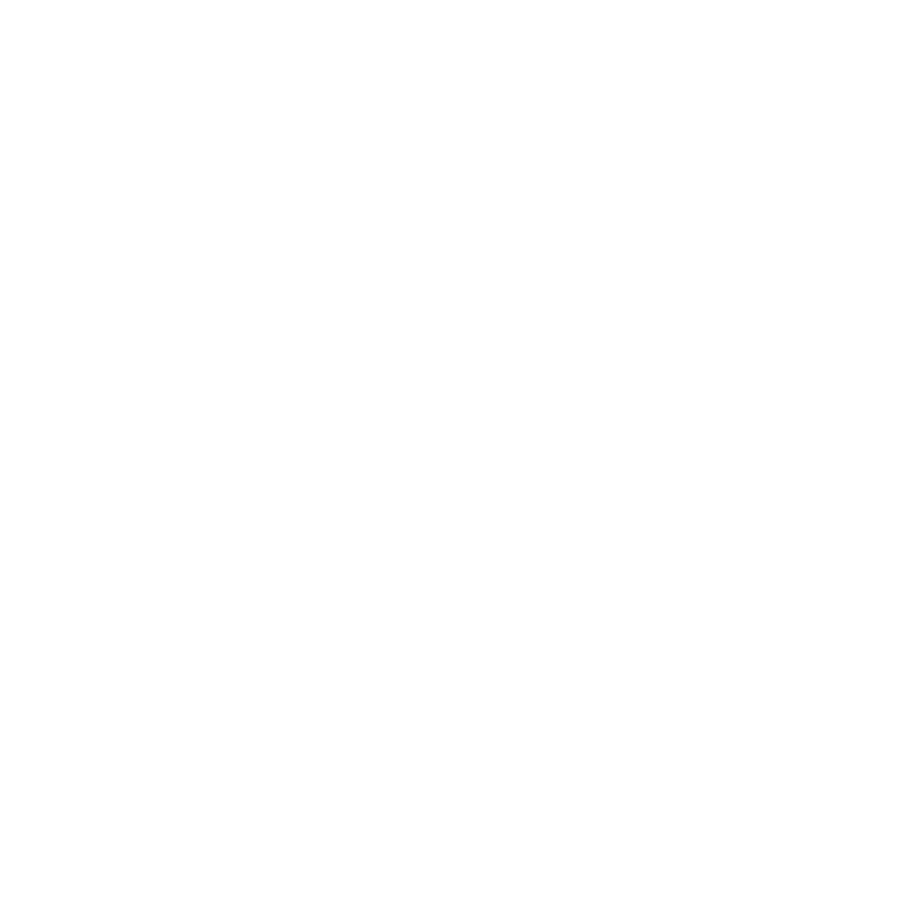

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PFt
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 1721
performing OLS (1D y)
Estimated OLS betas Norm Param. B Norm_abcd [ 0.1825 -0.054 ]
wRSq 0.04964187621294236
wCC prediction 0.2228045695513052


<IPython.core.display.Javascript object>


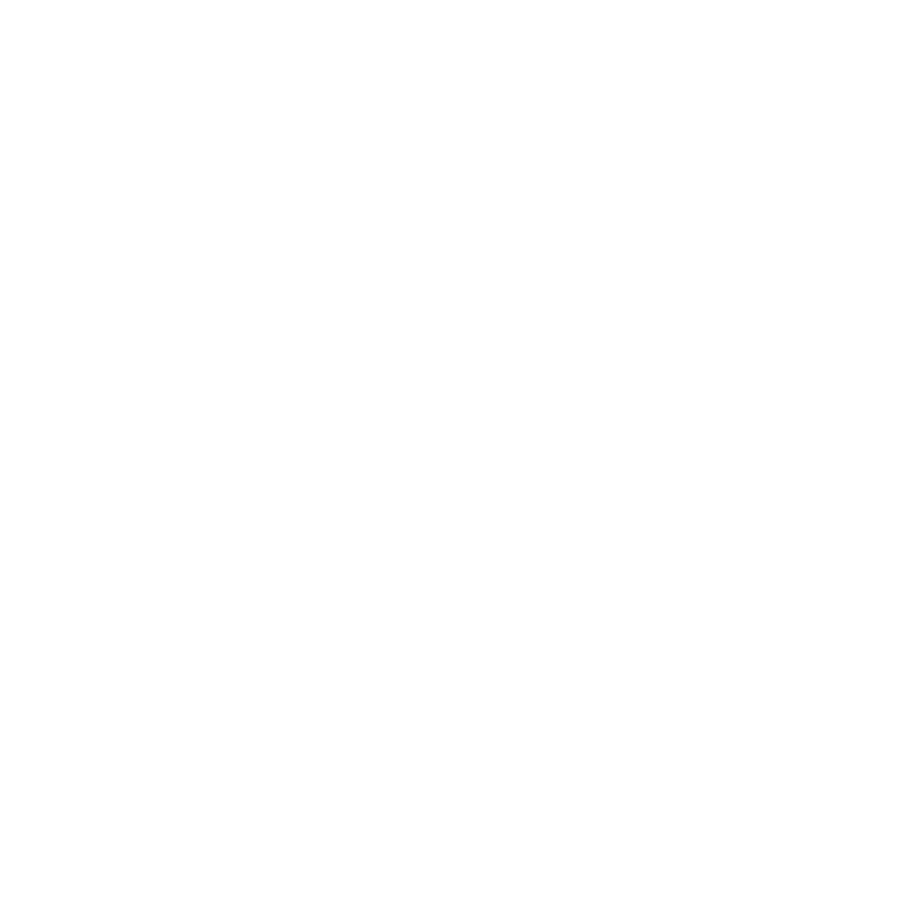

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PGi
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PGp
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 1116
performing OLS (1D y)
Estimated OLS betas Norm Param. B Norm_abcd [ 0.2444 -0.0213]
wRSq 0.08182545856965229
wCC prediction 0.2860514963597501


<IPython.core.display.Javascript object>


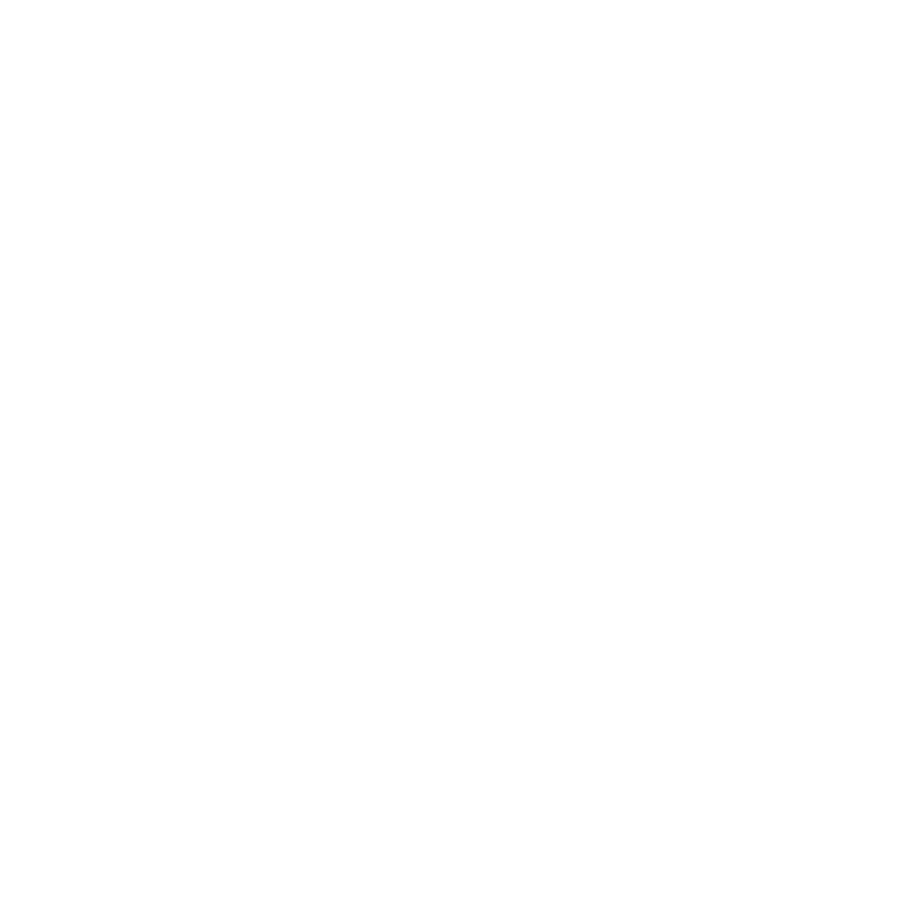

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PGs
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PH
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 1312
performing OLS (1D y)
Estimated OLS betas Norm Param. B Norm_abcd [-0.0742 -0.0185]
wRSq 0.018027212131845105
wCC prediction 0.1342654539777268


<IPython.core.display.Javascript object>


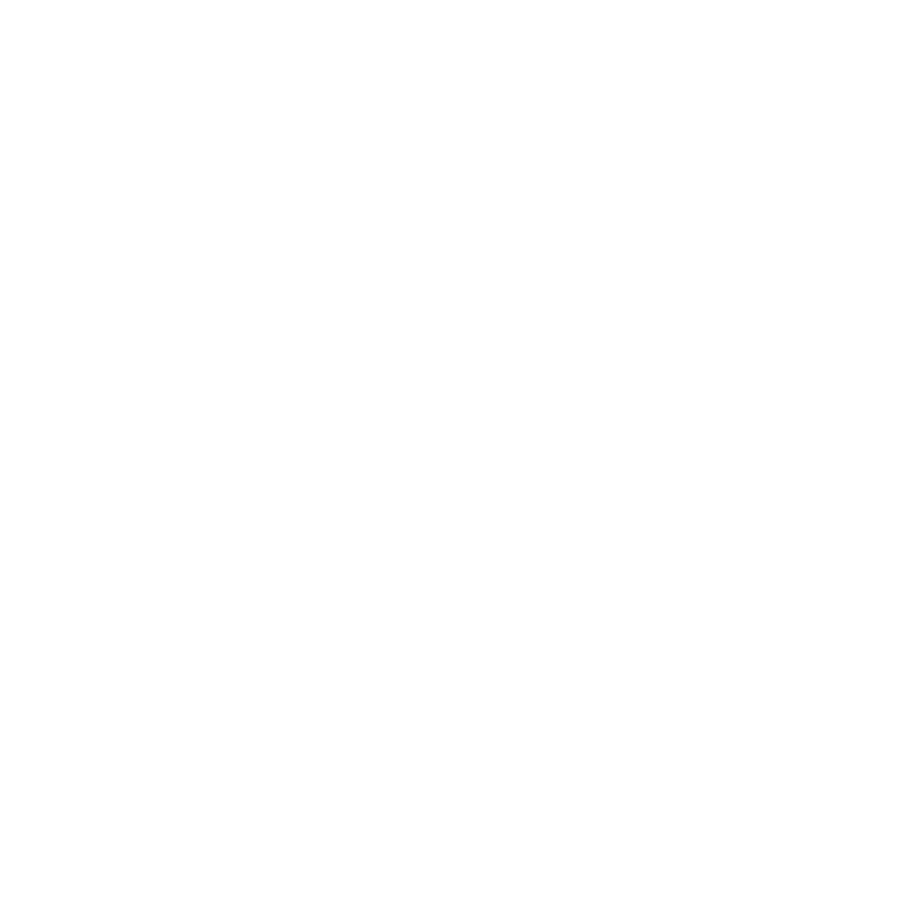

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PHA1
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PHA2
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PHA3
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 216
performing OLS (1D y)
Estimated OLS

<IPython.core.display.Javascript object>


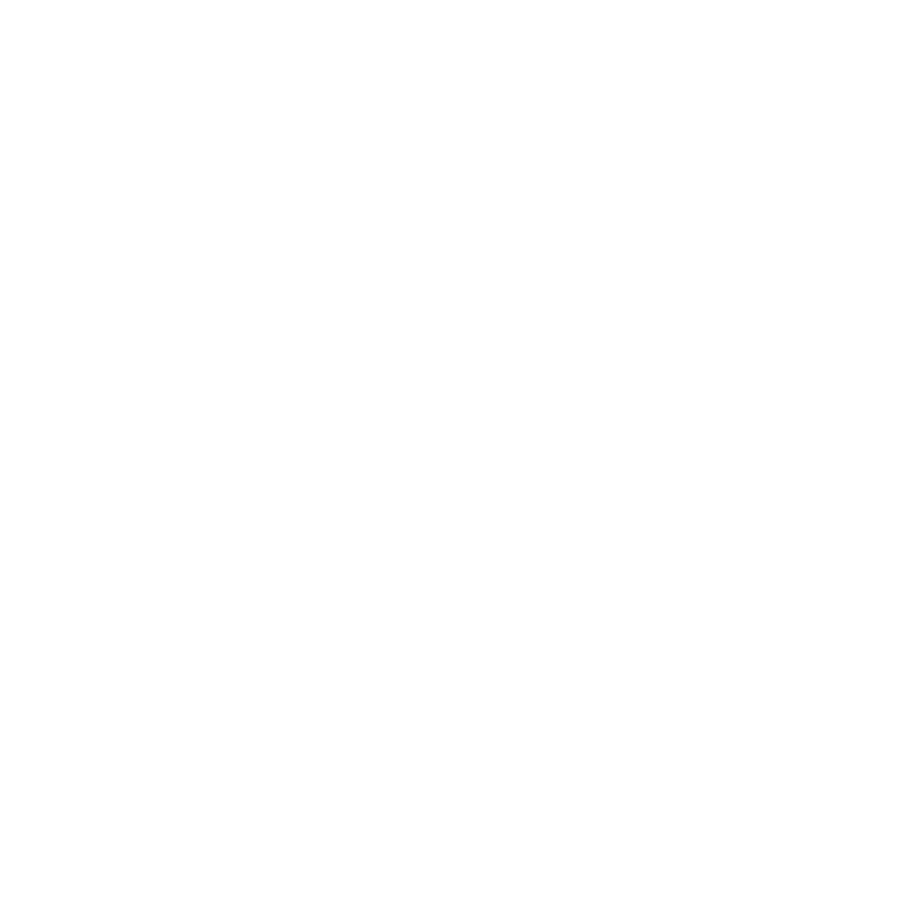

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PHT
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 81
performing OLS (1D y)
Estimated OLS betas Norm Param. B Norm_abcd [0.6201 0.07  ]
wRSq 0.07113021059768876
wCC prediction 0.26670247579969775


<IPython.core.display.Javascript object>


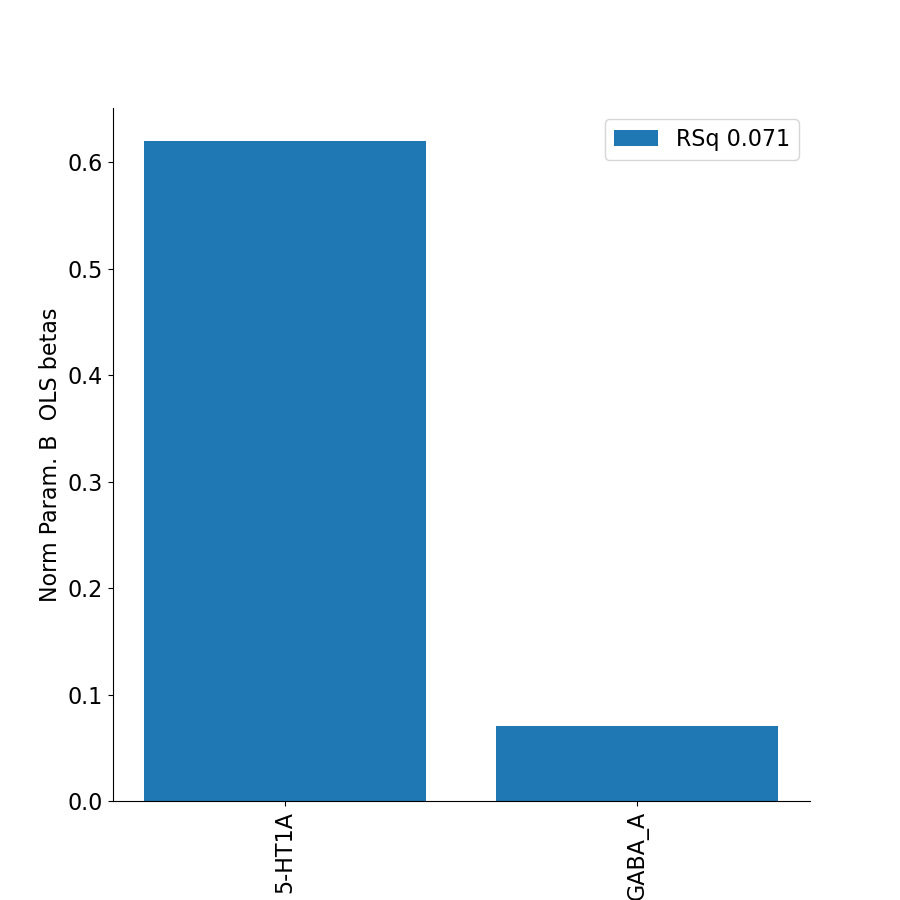

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PI
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_Pir
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PIT
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 678
performing OLS (1D y)
Estimated OLS bet

<IPython.core.display.Javascript object>


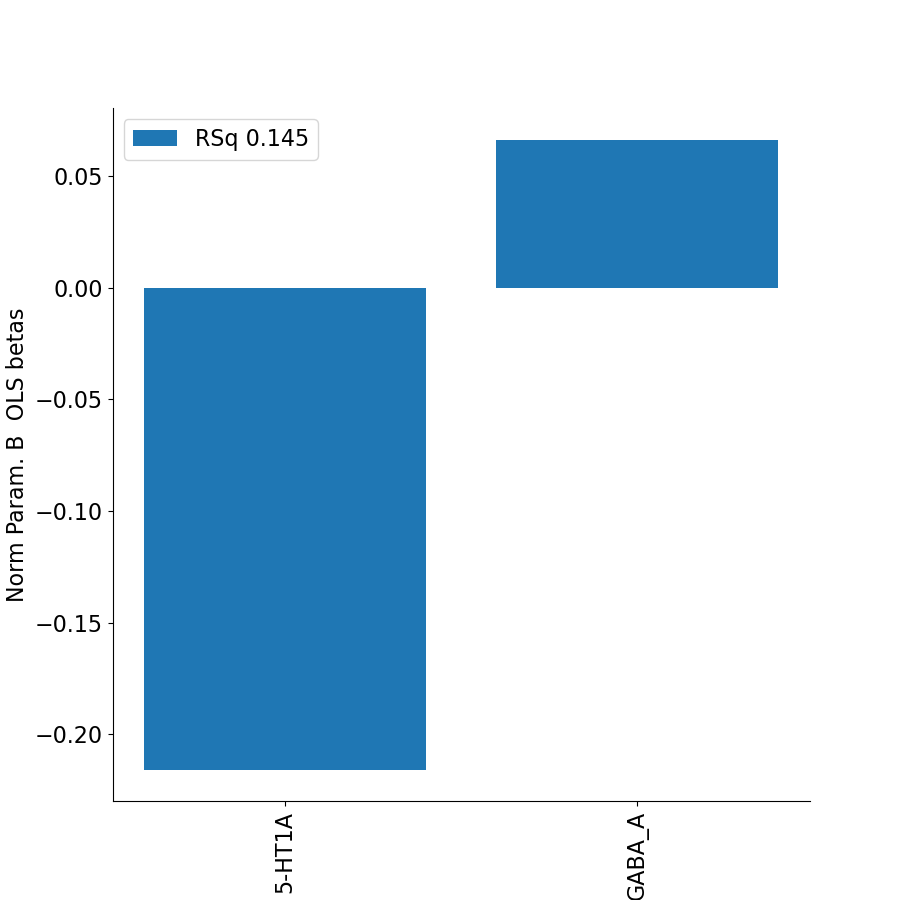

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_pOFC
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PoI1
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PoI2
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_c

<IPython.core.display.Javascript object>


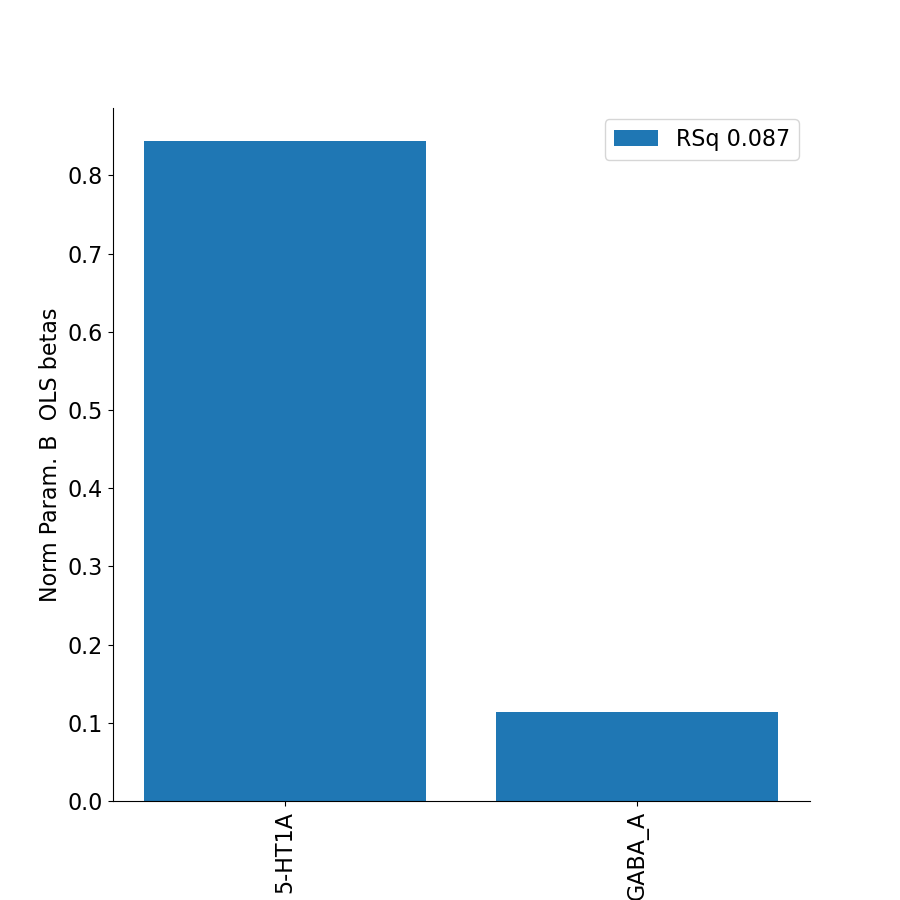

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PreS
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_ProS
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PSL
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 1
fit-task-BAR_fit-runs-all fsaverage_cv

<IPython.core.display.Javascript object>


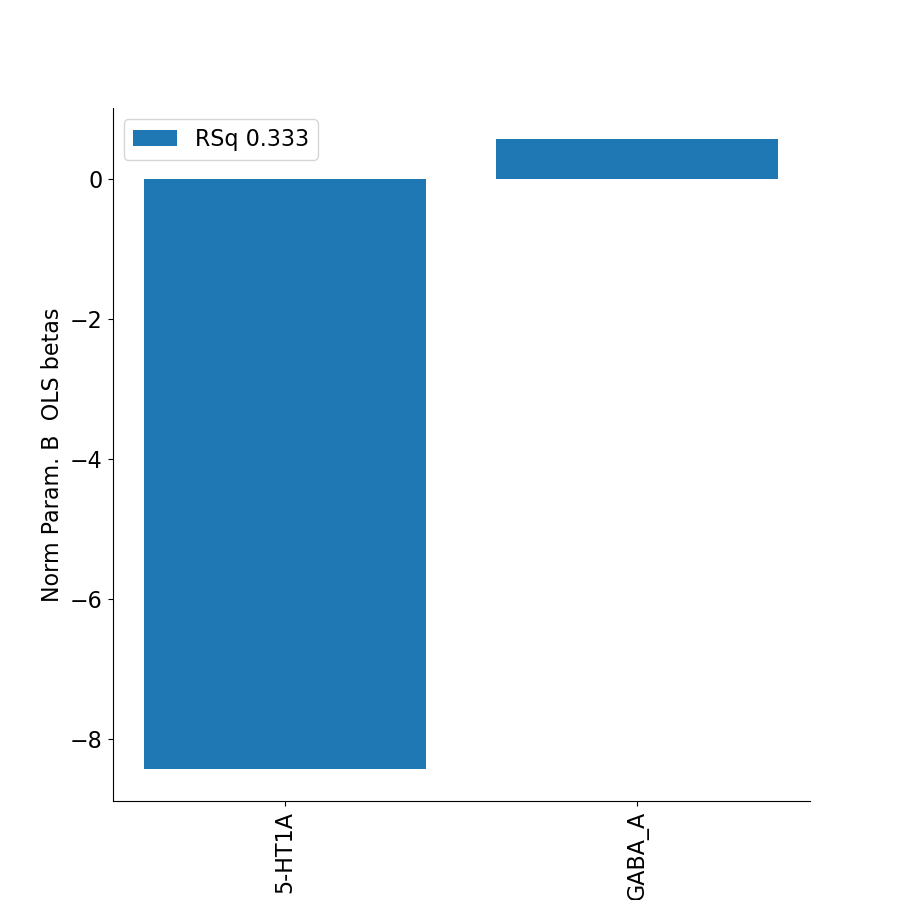

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_SFL
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_STGa
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_STSda
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_c

<IPython.core.display.Javascript object>


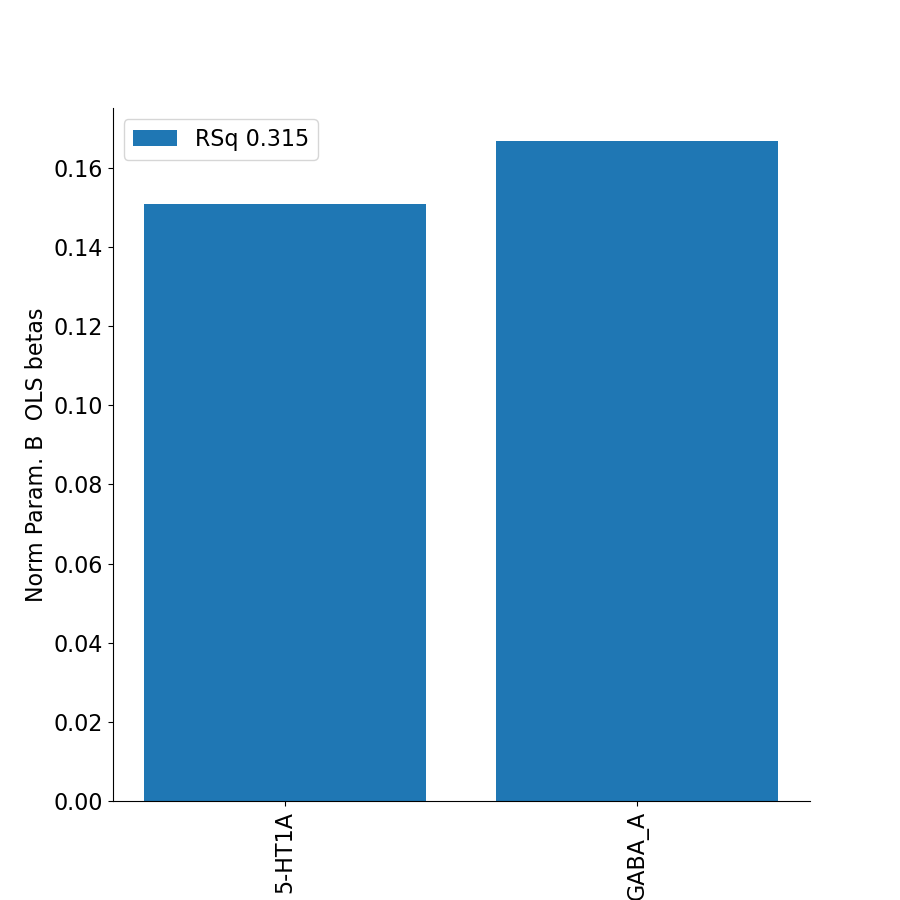

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_TF
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 30
performing OLS (1D y)
Estimated OLS betas Norm Param. B Norm_abcd [-2.2036 -0.1399]
wRSq 0.3007735302523825
wCC prediction 0.5484282361917397


<IPython.core.display.Javascript object>


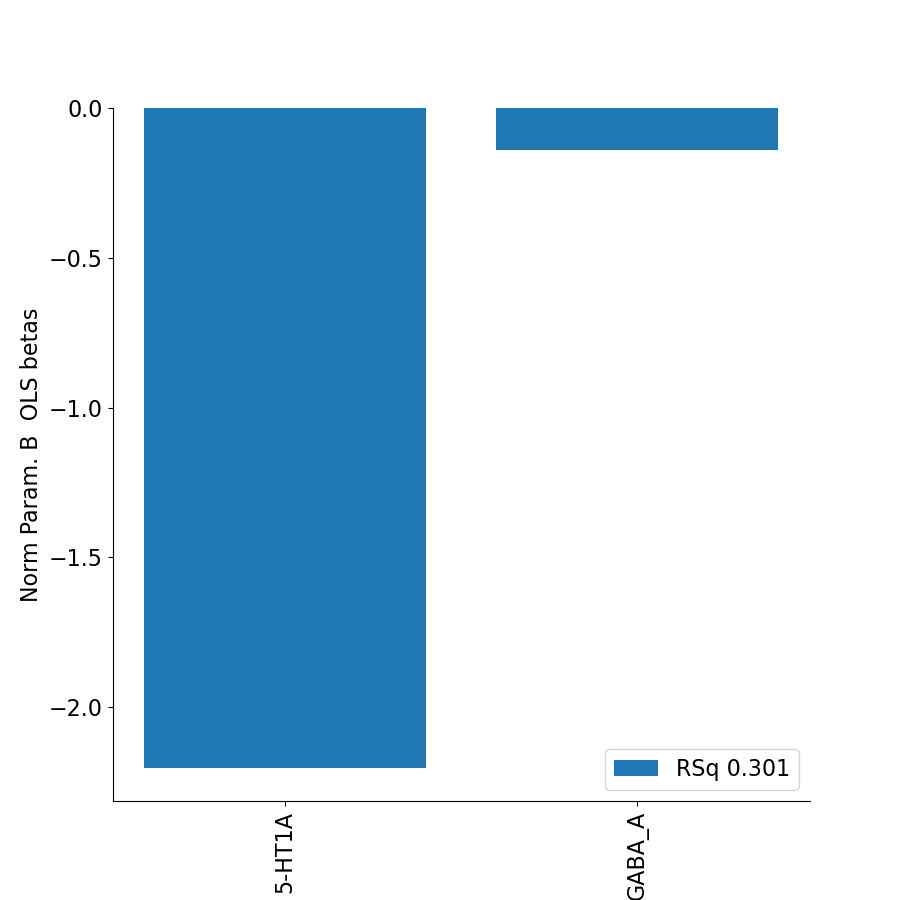

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_TGd
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_TGv
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_TPOJ1
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cv

<IPython.core.display.Javascript object>


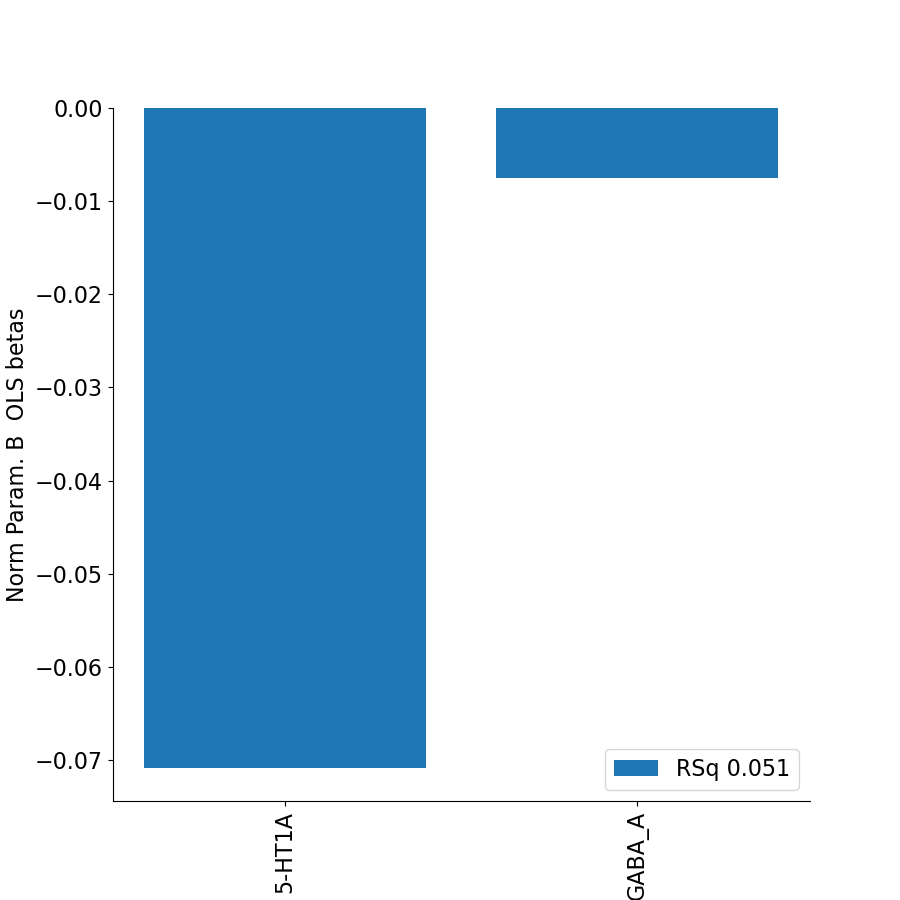

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_TPOJ3
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 580
performing OLS (1D y)
Estimated OLS betas Norm Param. B Norm_abcd [-0.0486  0.0012]
wRSq 0.0008689232310568062
wCC prediction 0.02947750381319484


<IPython.core.display.Javascript object>


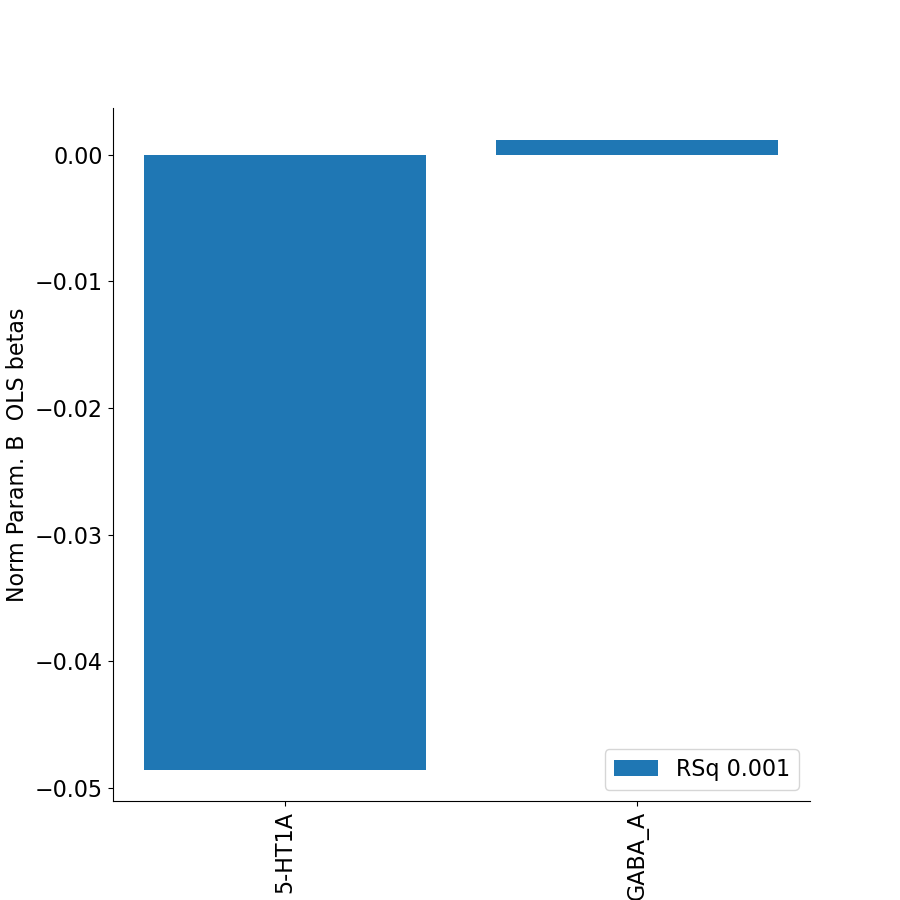

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_V1
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 4593
performing OLS (1D y)
Estimated OLS betas Norm Param. B Norm_abcd [0.8931 0.8637]
wRSq 0.37168349937869005
wCC prediction 0.6096585104619556


<IPython.core.display.Javascript object>


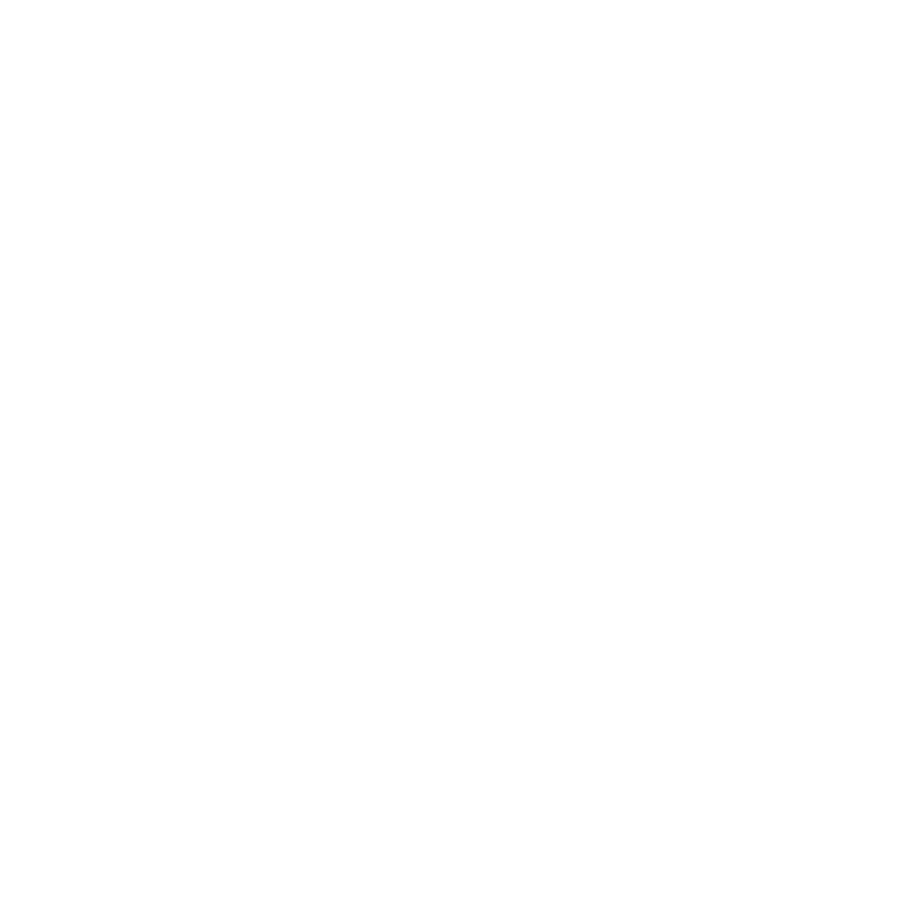

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_V2
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 3472
performing OLS (1D y)
Estimated OLS betas Norm Param. B Norm_abcd [2.4852 0.2552]
wRSq 0.043792287048197154
wCC prediction 0.20926606759863642


<IPython.core.display.Javascript object>


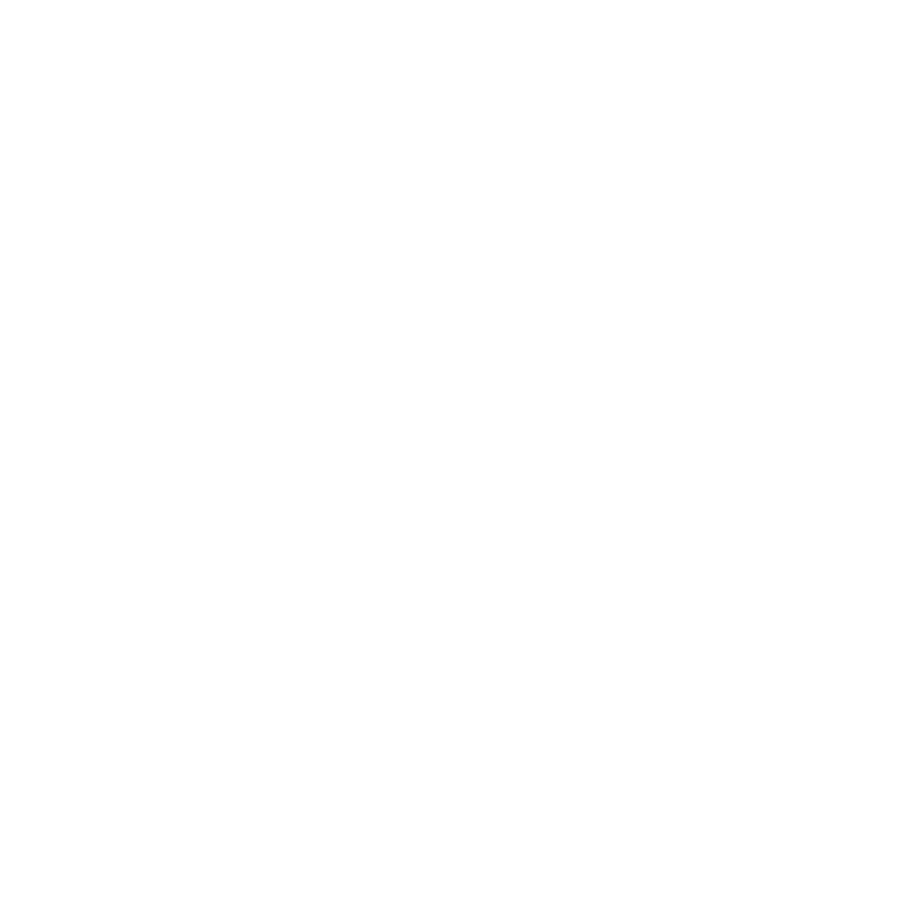

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_v23ab
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_V3
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 2929
performing OLS (1D y)
Estimated OLS betas Norm Param. B Norm_abcd [-4.3022 -0.1074]
wRSq 0.12876411510243746
wCC prediction 0.3588371707368644


<IPython.core.display.Javascript object>


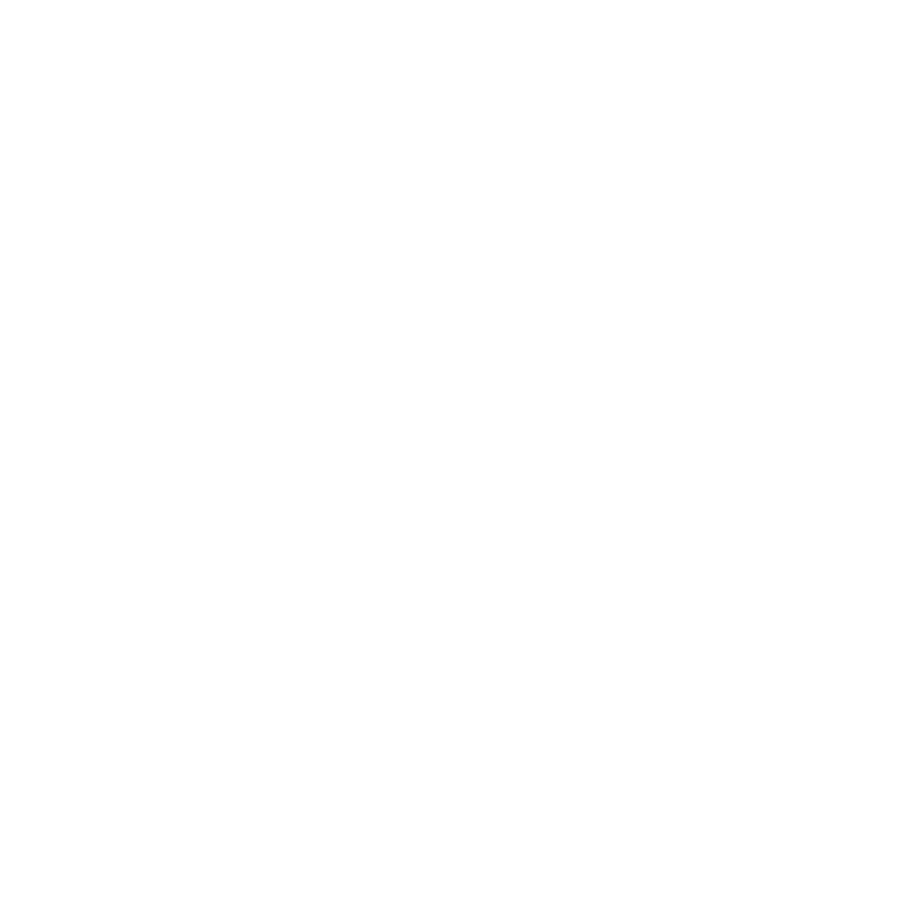

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_V3A
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 1205
performing OLS (1D y)
Estimated OLS betas Norm Param. B Norm_abcd [-6.1768  0.5833]
wRSq 0.4196295510755045
wCC prediction 0.6477881992406964


<IPython.core.display.Javascript object>


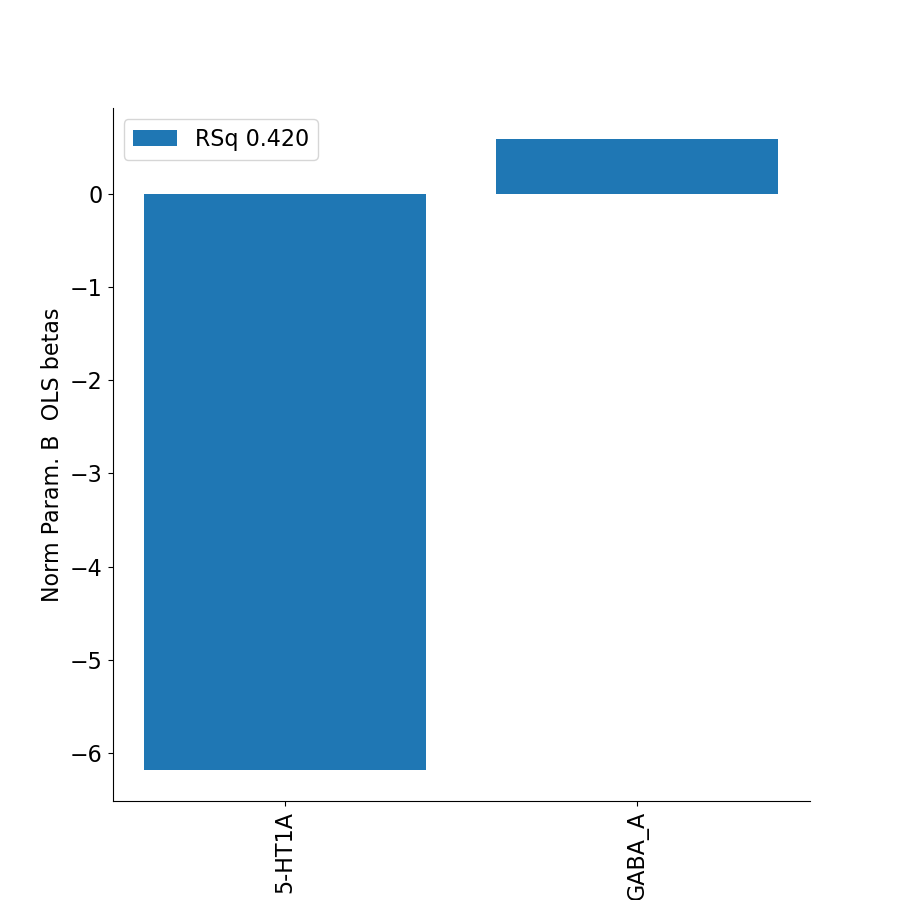

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_V3B
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 734
performing OLS (1D y)
Estimated OLS betas Norm Param. B Norm_abcd [-0.7904  0.0247]
wRSq 0.25063789757909893
wCC prediction 0.5006374911840893


<IPython.core.display.Javascript object>


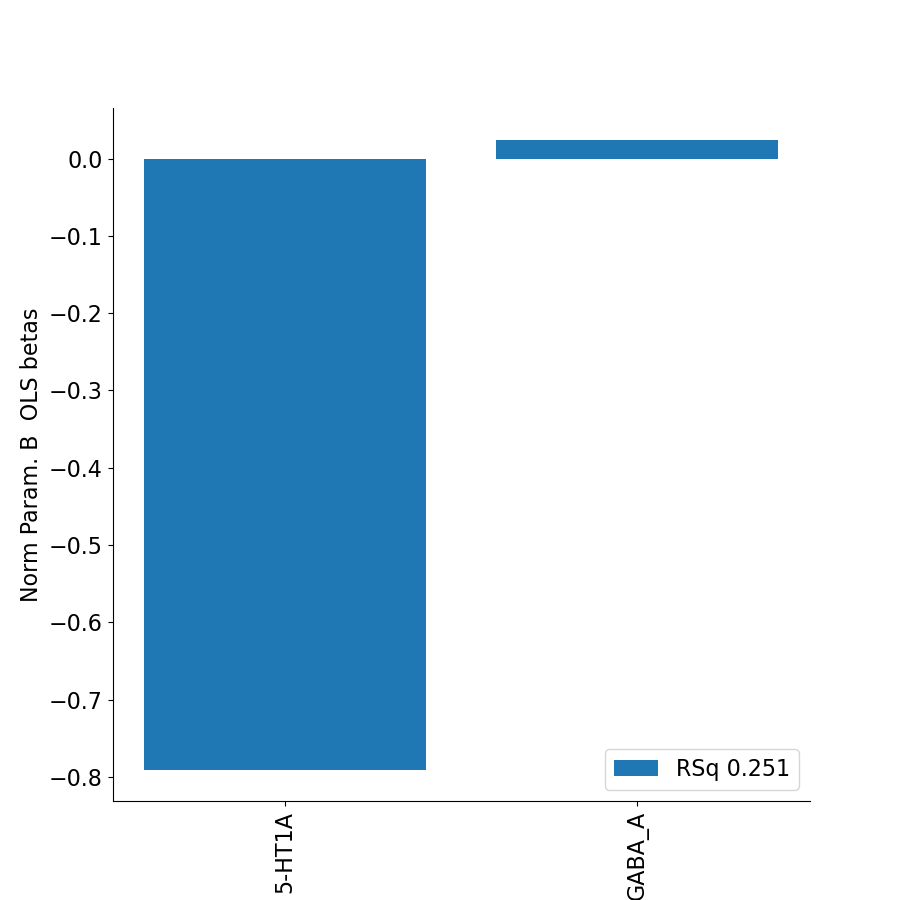

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_V3CD
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 768
performing OLS (1D y)
Estimated OLS betas Norm Param. B Norm_abcd [-0.2632 -0.0205]
wRSq 0.24241796925413328
wCC prediction 0.4923595934417582


<IPython.core.display.Javascript object>


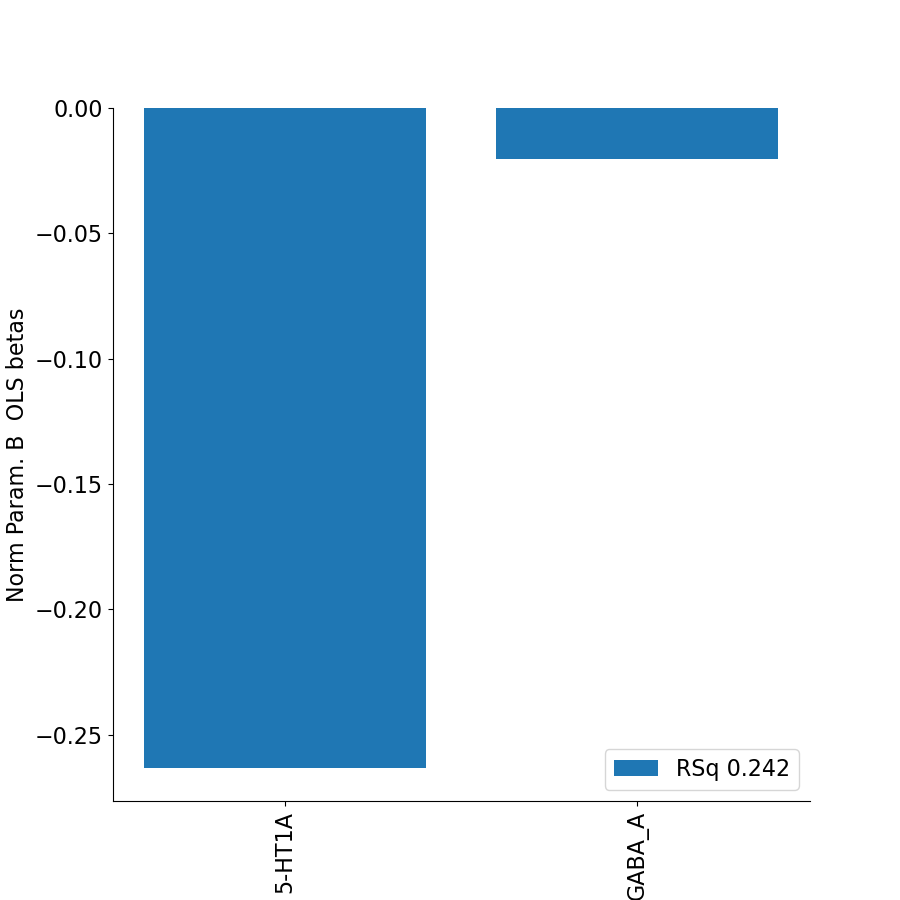

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_V4
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 2858
performing OLS (1D y)
Estimated OLS betas Norm Param. B Norm_abcd [-1.4289 -0.0322]
wRSq 0.396243883504112
wCC prediction 0.6294790572402801


<IPython.core.display.Javascript object>


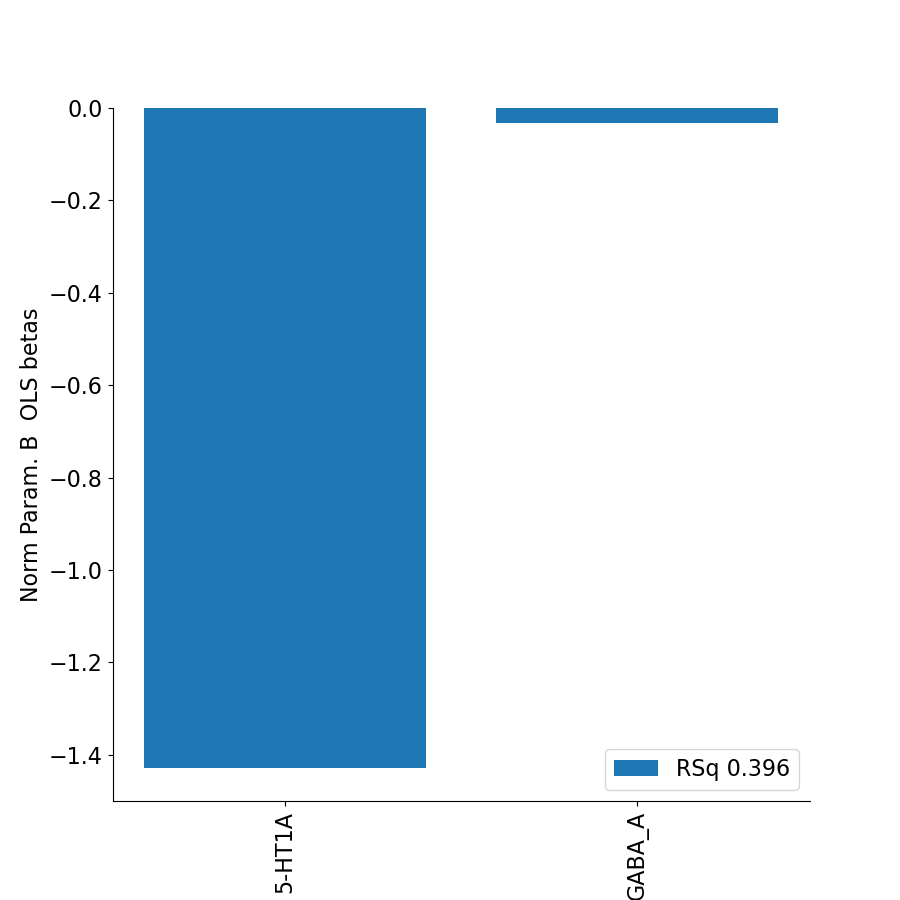

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_V4t
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 455
performing OLS (1D y)
Estimated OLS betas Norm Param. B Norm_abcd [-0.5384 -0.0805]
wRSq 0.09964169789499633
wCC prediction 0.3156607322664579


<IPython.core.display.Javascript object>


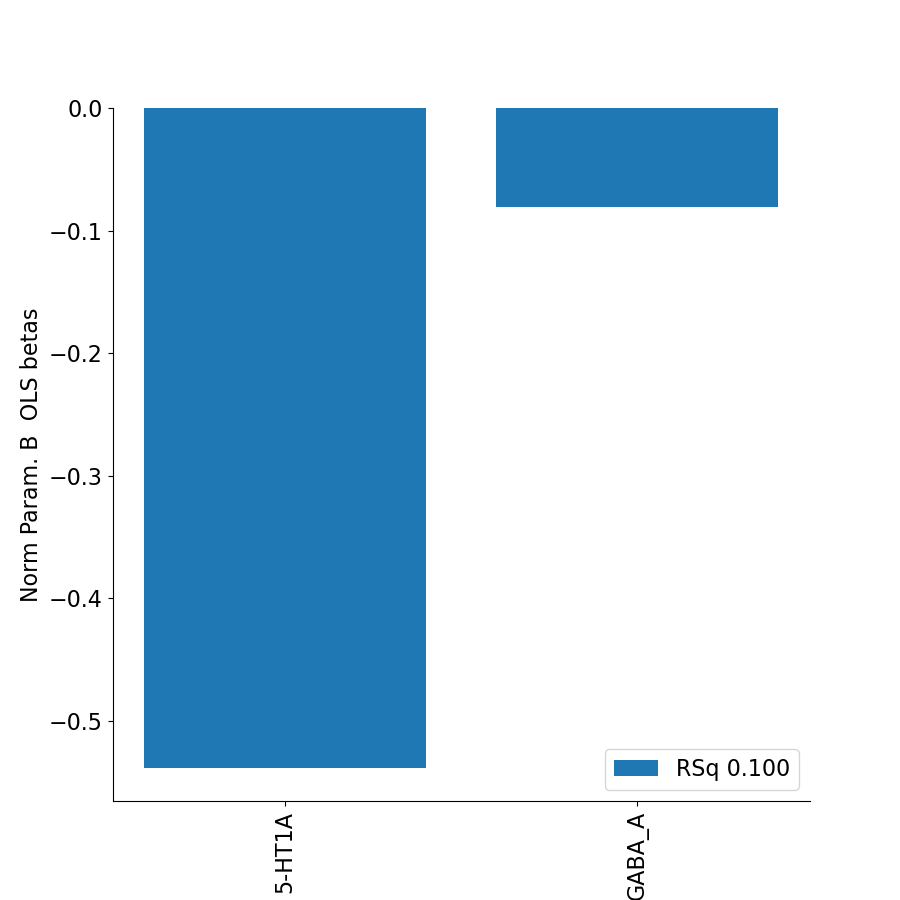

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_V6
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 246
performing OLS (1D y)
Estimated OLS betas Norm Param. B Norm_abcd [0.5194 0.0719]
wRSq 0.023605965115921057
wCC prediction 0.15364232852935097


<IPython.core.display.Javascript object>


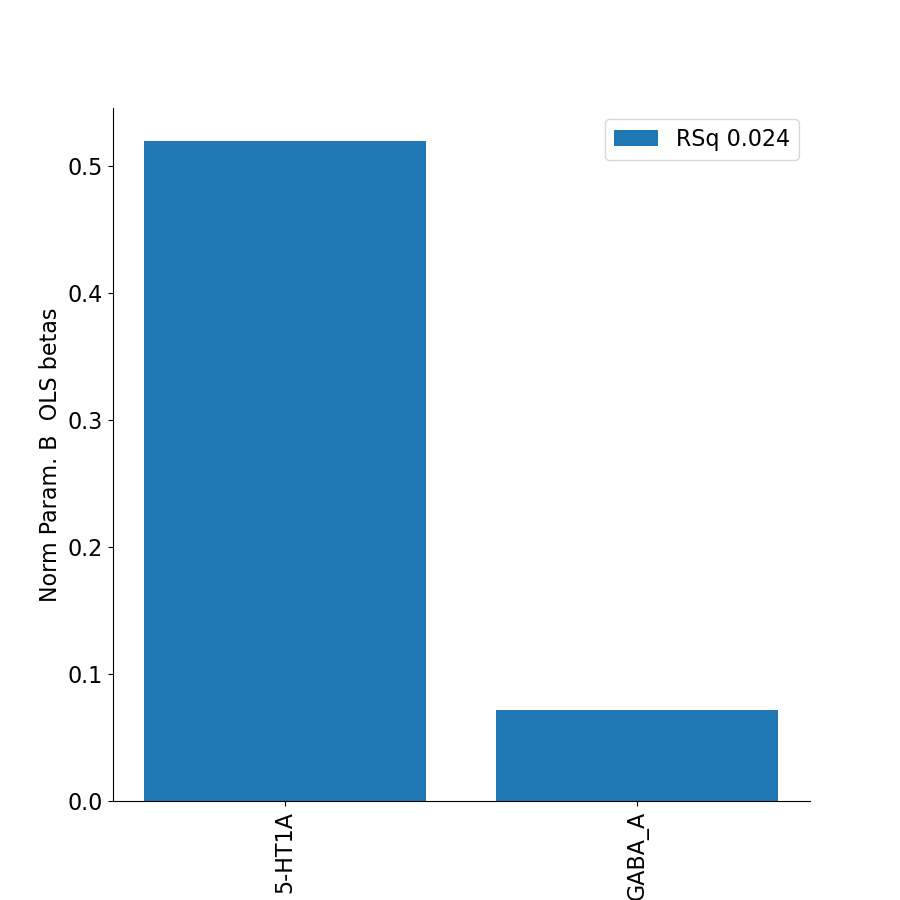

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_V6A
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 493
performing OLS (1D y)
Estimated OLS betas Norm Param. B Norm_abcd [-0.0209 -0.0171]
wRSq 0.007651490184374499
wCC prediction 0.08747279682492347


<IPython.core.display.Javascript object>


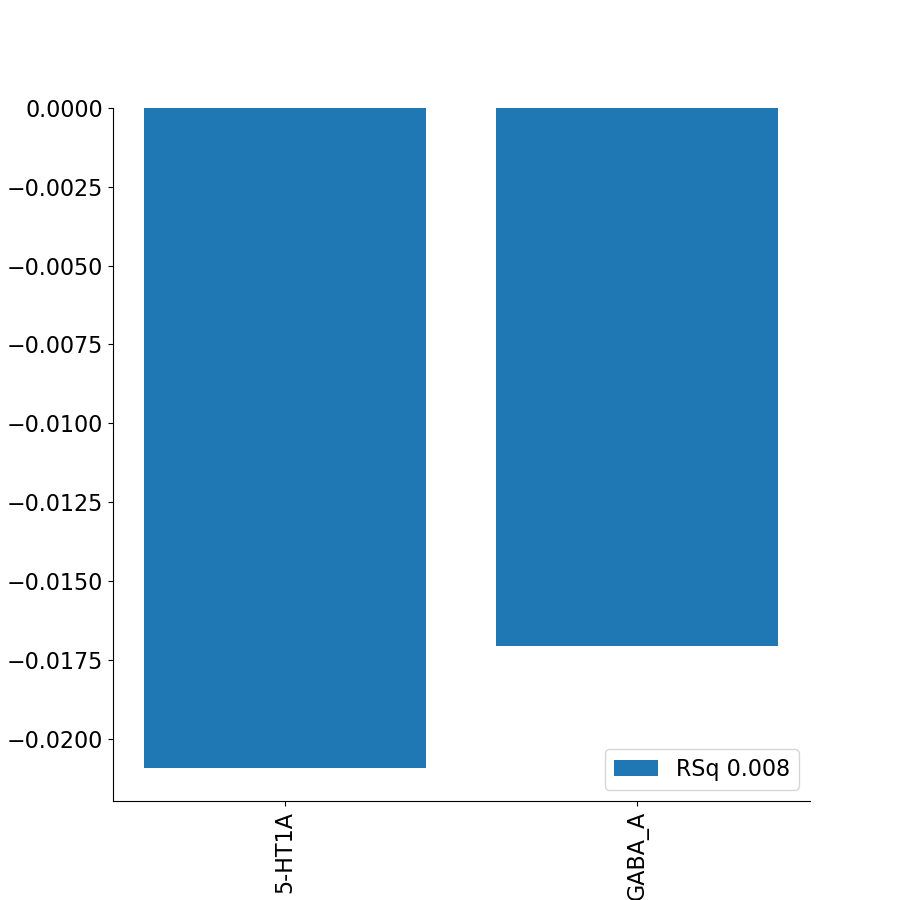

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_V7
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 560
performing OLS (1D y)
Estimated OLS betas Norm Param. B Norm_abcd [-0.3976  0.0502]
wRSq 0.0636073239300009
wCC prediction 0.25220492447611104


<IPython.core.display.Javascript object>


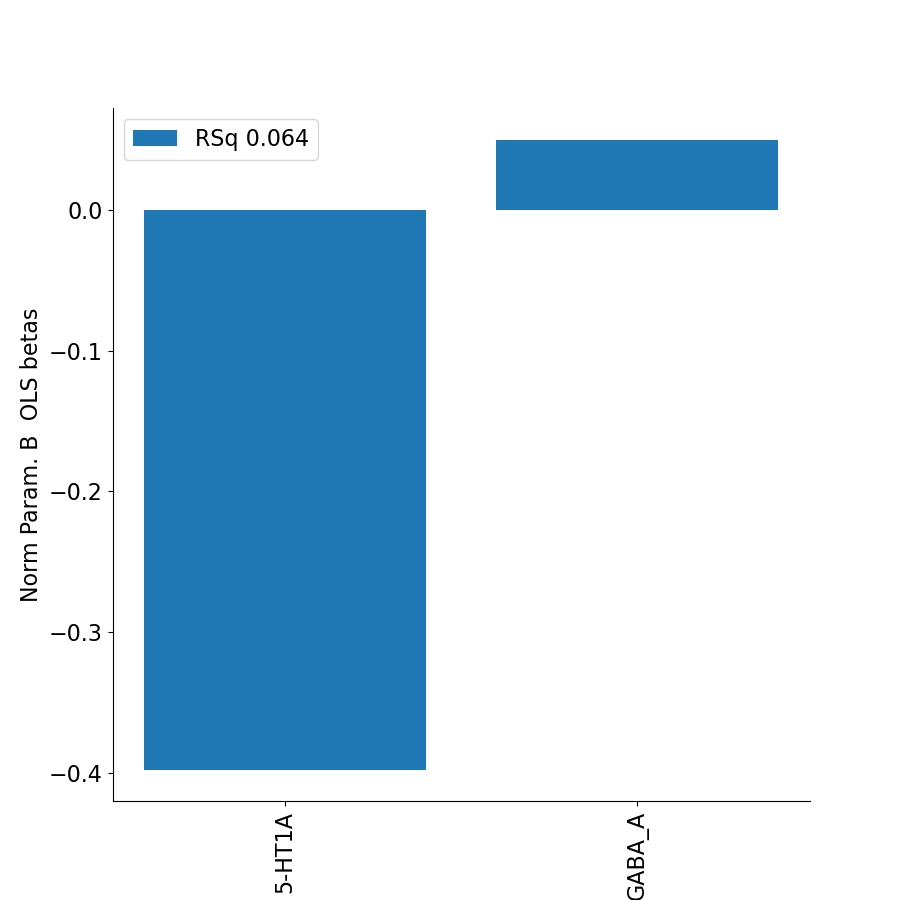

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_V8
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 653
performing OLS (1D y)
Estimated OLS betas Norm Param. B Norm_abcd [-0.8809  0.1368]
wRSq 0.43519440908444473
wCC prediction 0.6596926625970951


<IPython.core.display.Javascript object>


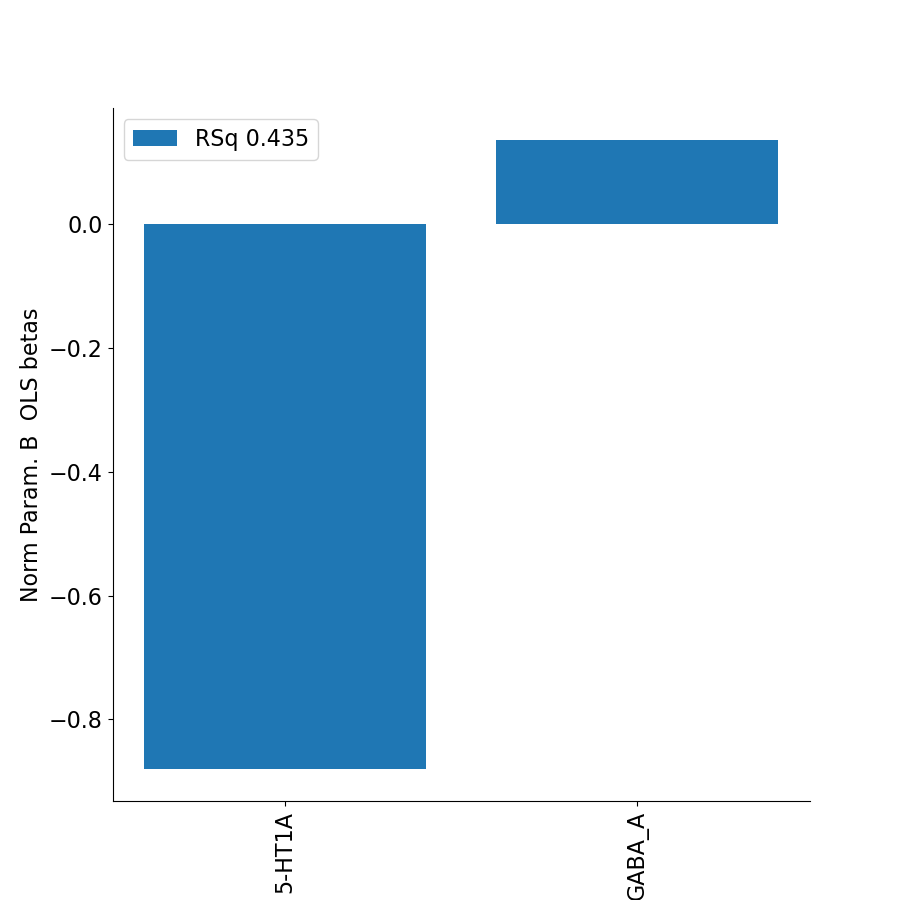

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_VIP
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 1224
performing OLS (1D y)
Estimated OLS betas Norm Param. B Norm_abcd [ 0.1026 -0.0086]
wRSq 0.05702907217664721
wCC prediction 0.23880760493888606


<IPython.core.display.Javascript object>


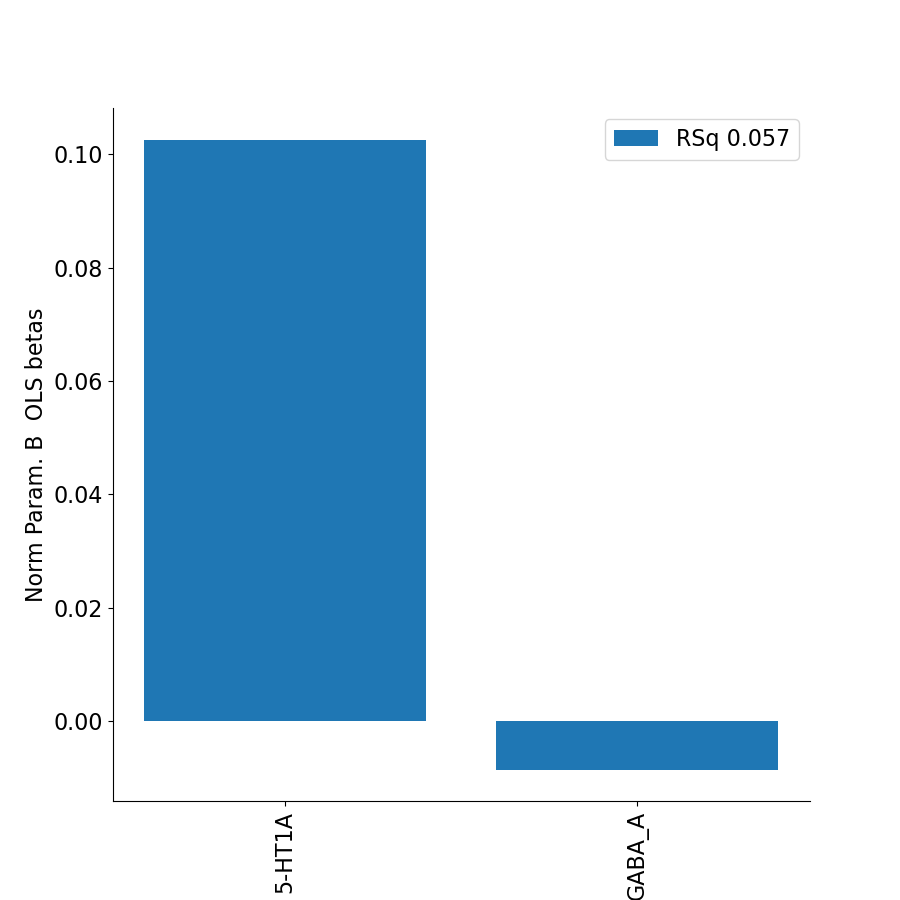

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_VMV1
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 44
performing OLS (1D y)
Estimated OLS betas Norm Param. B Norm_abcd [0.2436 0.0014]
wRSq 0.08769458097311322
wCC prediction 0.2961327083810791


<IPython.core.display.Javascript object>


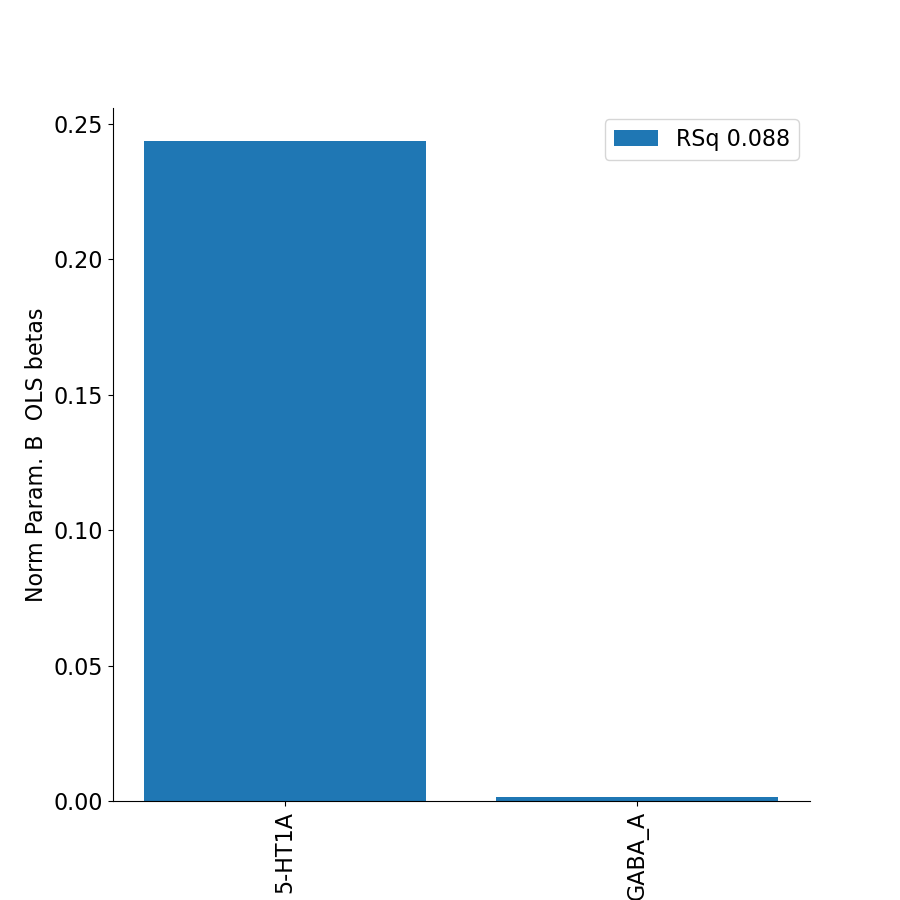

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_VMV2
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 541
performing OLS (1D y)
Estimated OLS betas Norm Param. B Norm_abcd [-0.2744 -0.0211]
wRSq 0.09556435032360644
wCC prediction 0.3091348416526458


<IPython.core.display.Javascript object>


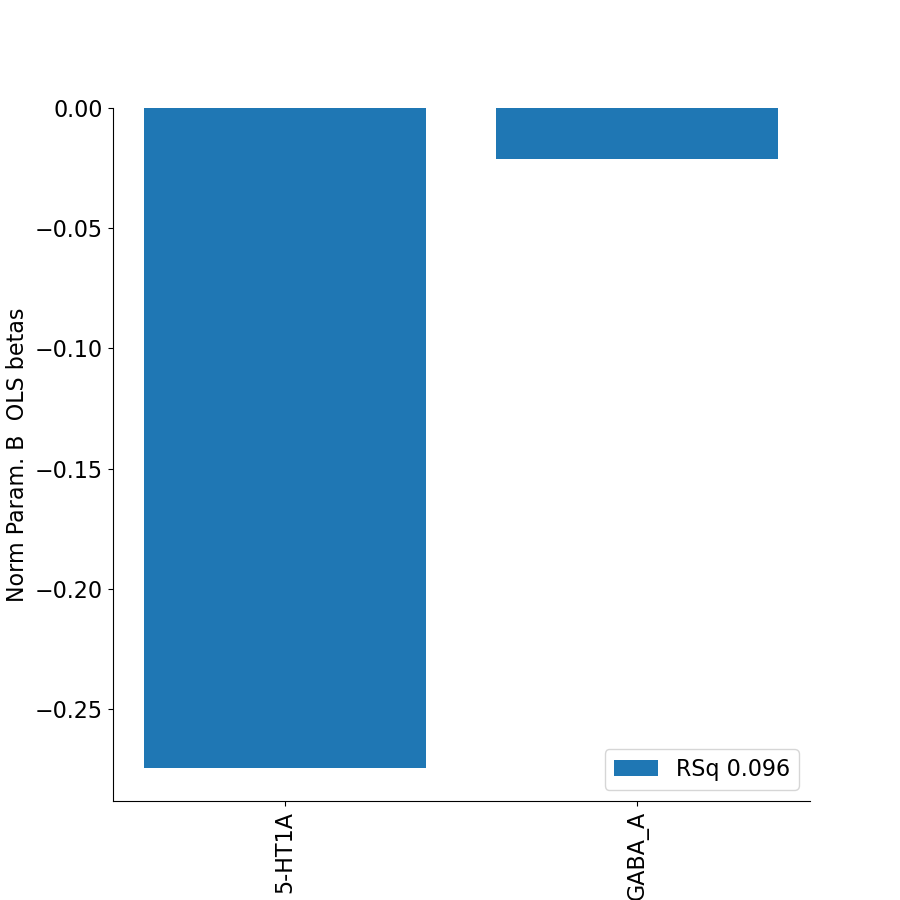

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_VMV3
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 662
performing OLS (1D y)
Estimated OLS betas Norm Param. B Norm_abcd [0.0277 0.0286]
wRSq 0.07085072250925017
wCC prediction 0.26617799027953104


<IPython.core.display.Javascript object>


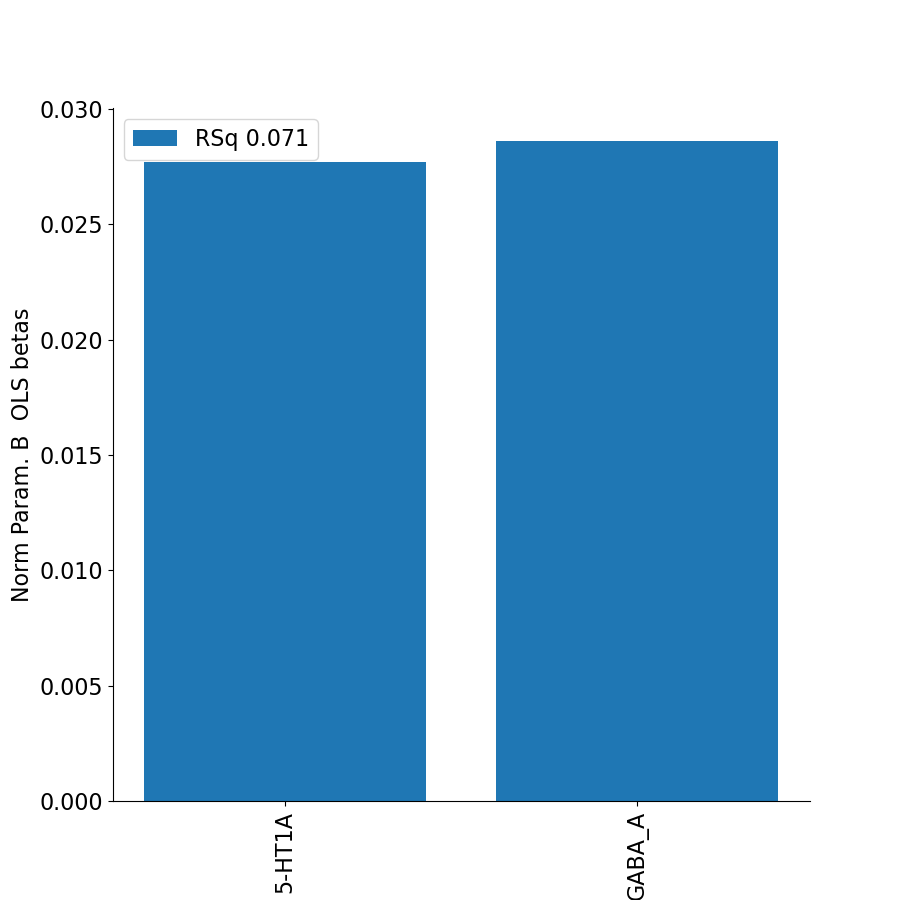

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_VVC
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 1002
performing OLS (1D y)
Estimated OLS betas Norm Param. B Norm_abcd [0.0101 0.005 ]
wRSq 0.0010690540576080432
wCC prediction 0.03269639211913318


<IPython.core.display.Javascript object>


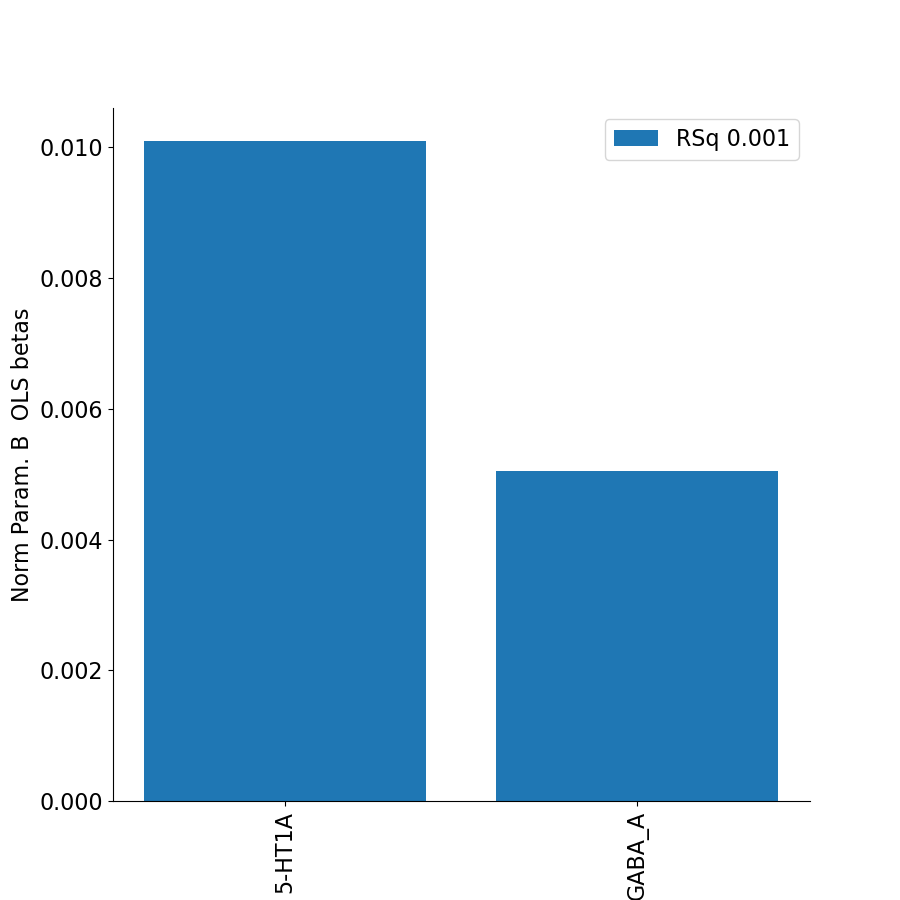

fit-task-BAR_fit-runs-all fsaverage_cvrsq combined
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. B Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 59942
performing OLS (1D y)
Estimated OLS betas Norm Param. B Norm_abcd [-2.1285  0.229 ]
wRSq 0.4378266339788739
wCC prediction 0.6616846937770843


<IPython.core.display.Javascript object>


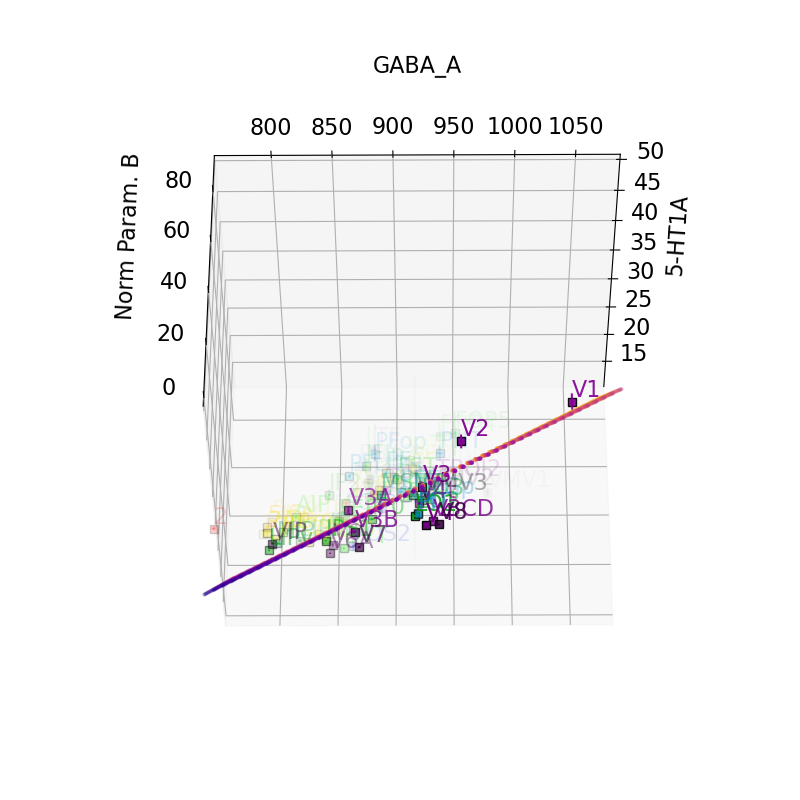

wR2 (fit on full data, eval on roi means), by sklearn: 0.675
wCC prediction (fit on full data, eval on roi means) 0.8487

wR2 (fit on roi means, eval on roi means), by sklearn: 0.7224
wCC prediction (fit on roi means, eval on roi means) 0.8499
Estimated OLS betas (fit on roi means) Norm Param. B Norm_abcd [-1.8156  0.1732]

wR2 (fit on full data, eval on full data), by sklearn: 0.4378
wCC prediction (fit on full data, eval on full data) 0.6617
Estimated OLS betas (fit on full data) Norm Param. B Norm_abcd [-2.1285  0.229 ]


<IPython.core.display.Javascript object>


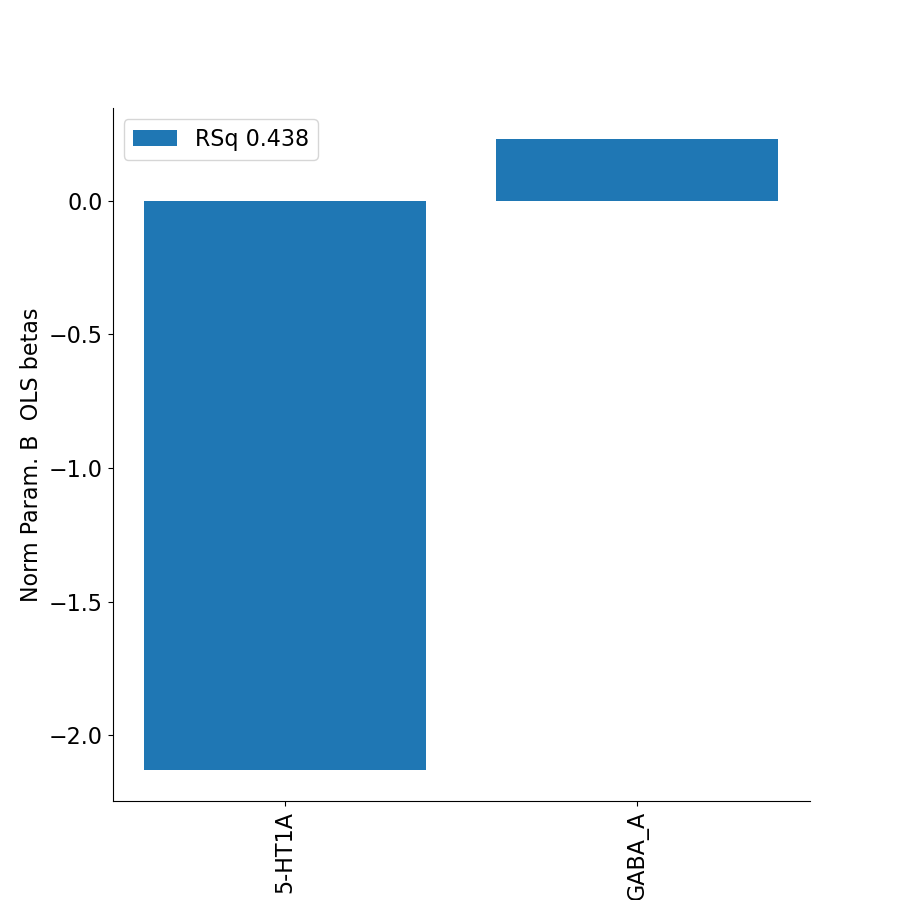

0

In [8]:
#%%capture
display(HTML("<style>div.output_scroll { height: 150em; }</style>"))
pl.close('all')
#fsnative vox vol for correction: 4.8270
#generalized quantitative parameter plots
#'Eccentricity'#'Suppression Index (full)'#'Suppression Index#'Size (fwhmax)'#'Surround Size (fwatmin)'
#'Norm Param. B'#''Ratio (B/D)'#'Norm Param. D'#'RSq'#'CCrsq_task-1R'#'CSS Exponent'#'Amplitude'
#'Surround Amplitude'#'Size (sigma_1)'##'Size (sigma_2)'
#'Size ratio (sigma_2/sigma_1)'#C/A#'B/A'#'D/C'#'D/A'#'B/C'#'Surround volume (full)'#'Centre volume (full)'
#'(A+B)/(C+D)'#'(A*B)/(C*D)'#'(A*D)/(C*B)'#'(A+D)/(C+B)'#'Point-stim derivative'#'(C(A+B))/(A(C+D))'
#'Min/Max Response Ratio'#'Max/Min Response Ratio'#'A(C+D)/C(A+B)'##Min/Max Response Ratio (with BD)'
#'A/C'
####DoG
#'Surround volume (full)'
#'Surround/Centre Amplitude' 
#'Surround-Centre Amplitude'
#'Surround-Centre Volume'

#parameters = ['Eccentricity', 'Norm Param. B', 'Norm Param. D', 'Size (sigma_1)','Size (sigma_2)', 'Amplitude','Surround Amplitude', 'Polar Angle',
#              '5-HT1A', '5-HT1B', '5-HT2A', '5-HT4', '5-HTT', 'GABA_A','Amplitude','Surround Amplitude', 'RSq']#,]#'Size ratio (sigma_2/sigma_1)']# 'Size (sigma_1)', 'Size (sigma_2)', 'Amplitude','Surround Amplitude']

parameters = ['5-HT1A', '5-HT1B', '5-HT2A', 'GABA_A', '5-HTT','Norm Param. B', 'Norm Param. D','RSq']#, 'Eccentricity','Size (sigma_1)','Size (sigma_2)']#

x_dims_idx = [0,3]
y_dims_idx = [5]

#rois = ['custom.V1', 'custom.V2', 'custom.V3','custom.V3AB','custom.hV4','custom.LO','custom.TO','custom.IPS','all_custom']
#rois = ['V1', 'V2', 'V3','V3AB','hV4','LO','TO','VO','IPS']#, 'combined']#['Brain'] #'V1', 'V2', 'V3','V3AB','hV4','LO','TO','IPS','combined', 
#rois = [ 'V1', 'V2', 'V3', 'hV4', 'VO1', 'VO2', 'PHC1', 'PHC2', 'LO1', 'LO2', 'TO1', 'TO2', 'V3A', 'V3B', 'IPS0', 'IPS1', 'IPS2', 'IPS3', 'IPS4', 'IPS5', 'SPL1', 'FEF']
#rois = ['all_custom']
rois = [roi for roi in vis_res.idx_rois['fsaverage'] if 'glasser' in roi]
# rois = ['glasser_V1','glasser_V2','glasser_V3','glasser_V4','glasser_V3A','glasser_V7','glasser_V3B','glasser_V3CD',
# 'glasser_LO1','glasser_LO2','glasser_PIT','glasser_V8','glasser_VMV3',
# 'glasser_IPS1','glasser_IP0','glasser_PGp','glasser_LO3','glasser_MT','glasser_V4t','glasser_FFC']
rois.append('combined')
        
rsq_thresh = 0.0
save_figures= False
figure_path = '/Volumes/Crucial X8/PRFMapping/Figures/attemptwnames_wang_ecc65rsq015/ols'

space_names = 'fsaverage'
#set to 'all' to plot all analyses
analysis_names = 'fit-task-BAR_fit-runs-all'#-CVmedian

subject_ids = ['fsaverage_cvrsq']#'fsaverage_hcp1sthalf', 'fsaverage_hcp2ndhalf']

threshold_li = filters.threshold_li(vis_res.main_dict[space_names][analysis_names][subject_ids[0]]['Processed Results']['#Subjects with CVRSq>0']['Norm_abcd'])

vis_res.set_alpha(only_models=['Norm_abcd'], ecc_min=0.0, ecc_max=8.0, min_number_sjs=threshold_li)

#for y_dims_idx in [[5],[6]]:
#    for x_dims_idx in [[3, 4], [2, 4], [2, 3], [1, 4], [1, 3], [1, 2], [0, 4], [0, 3], [0, 2], [0, 1]]:
#for x_dims_idx in [[3, 4], [2, 4], [2, 3], [1, 4], [1, 3], [1, 2], [0, 4], [0, 3], [0, 2], [0, 1]]:    

vis_res.multidim_analysis(parameters, rois, rsq_thresh, save_figures, figure_path, space_names = space_names, parameter_toplevel='Receptor Maps', rsq_weights= True,
                    analysis_names = analysis_names, subject_ids = subject_ids, x_dims_idx=x_dims_idx, y_dims_idx=y_dims_idx,
                          zscore_data= False, zscore_data_across_rois = False, 
                          size_response_curves = False, plot_corr_matrix = False, perform_ols = True, polar_plots = False,
                             cv_regression = False, bold_voxel_volume=4.096, zconfint_err_alpha=None, quantile_exclusion=0.999,
                          #vis_pca_comps_rois: fr which rois to make pca comp beta plots; 
                          #vis_pca_comps_axes: which comps to use in 2d plot of mean pca comp per roi
                        perform_pca = False, vis_pca_pycortex = True, vis_pca_comps_rois = ['combined'], vis_pca_comps_axes = [0,1], rsq_alpha_pca_plot = True,
                          perform_pls = False, vis_pls_pycortex = False)

os.system(f"open {sound_file}")


## PCA

HCP fit-task-BAR_fit-runs-all 100610
HCP fit-task-BAR_fit-runs-all 102311
HCP fit-task-BAR_fit-runs-all 102816
HCP fit-task-BAR_fit-runs-all 104416
HCP fit-task-BAR_fit-runs-all 105923
HCP fit-task-BAR_fit-runs-all 108323
HCP fit-task-BAR_fit-runs-all 109123
HCP fit-task-BAR_fit-runs-all 111312
HCP fit-task-BAR_fit-runs-all 111514
HCP fit-task-BAR_fit-runs-all 114823
HCP fit-task-BAR_fit-runs-all 115017
HCP fit-task-BAR_fit-runs-all 115825
HCP fit-task-BAR_fit-runs-all 116726
HCP fit-task-BAR_fit-runs-all 118225
HCP fit-task-BAR_fit-runs-all 125525
HCP fit-task-BAR_fit-runs-all 126426
HCP fit-task-BAR_fit-runs-all 128935
HCP fit-task-BAR_fit-runs-all 130114
HCP fit-task-BAR_fit-runs-all 130518
HCP fit-task-BAR_fit-runs-all 131217
HCP fit-task-BAR_fit-runs-all 131722
HCP fit-task-BAR_fit-runs-all 132118
HCP fit-task-BAR_fit-runs-all 134627
HCP fit-task-BAR_fit-runs-all 134829
HCP fit-task-BAR_fit-runs-all 135124
HCP fit-task-BAR_fit-runs-all 137128
HCP fit-task-BAR_fit-runs-all 140117
H

fsaverage fit-task-BAR_fit-runs-all 171633
fsaverage fit-task-BAR_fit-runs-all 172130
fsaverage fit-task-BAR_fit-runs-all 173334
fsaverage fit-task-BAR_fit-runs-all 175237
fsaverage fit-task-BAR_fit-runs-all 176542
fsaverage fit-task-BAR_fit-runs-all 177140
fsaverage fit-task-BAR_fit-runs-all 177645
fsaverage fit-task-BAR_fit-runs-all 177746
fsaverage fit-task-BAR_fit-runs-all 178142
fsaverage fit-task-BAR_fit-runs-all 178243
fsaverage fit-task-BAR_fit-runs-all 178647
fsaverage fit-task-BAR_fit-runs-all 180533
fsaverage fit-task-BAR_fit-runs-all 181232
fsaverage fit-task-BAR_fit-runs-all 181636
fsaverage fit-task-BAR_fit-runs-all 182436
fsaverage fit-task-BAR_fit-runs-all 182739
fsaverage fit-task-BAR_fit-runs-all 185442
fsaverage fit-task-BAR_fit-runs-all 186949
fsaverage fit-task-BAR_fit-runs-all 187345
fsaverage fit-task-BAR_fit-runs-all 191033
fsaverage fit-task-BAR_fit-runs-all 191336
fsaverage fit-task-BAR_fit-runs-all 191841
fsaverage fit-task-BAR_fit-runs-all 192439
fsaverage f

Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Amplitude Norm_abcd', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd', 'Size ratio (sigma_2/sigma_1) Norm_abcd', 'Surround Amplitude Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Amplitude Norm_abcd', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd', 'Size ratio (sigma_2/sigma_1) Norm_abcd', 'Surround Amplitude Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Amplitude Norm_abcd', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd', 'Size ratio (sigma_2/sigma_1) Norm_abcd', 'Surround Amplitude Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Amplitude Norm_abcd', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd', 'Size ratio (sigma

Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Amplitude Norm_abcd', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd', 'Size ratio (sigma_2/sigma_1) Norm_abcd', 'Surround Amplitude Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Amplitude Norm_abcd', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd', 'Size ratio (sigma_2/sigma_1) Norm_abcd', 'Surround Amplitude Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Amplitude Norm_abcd', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd', 'Size ratio (sigma_2/sigma_1) Norm_abcd', 'Surround Amplitude Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Amplitude Norm_abcd', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd', 'Size ratio (sigma

Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Amplitude Norm_abcd', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd', 'Size ratio (sigma_2/sigma_1) Norm_abcd', 'Surround Amplitude Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Amplitude Norm_abcd', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd', 'Size ratio (sigma_2/sigma_1) Norm_abcd', 'Surround Amplitude Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Amplitude Norm_abcd', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd', 'Size ratio (sigma_2/sigma_1) Norm_abcd', 'Surround Amplitude Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Amplitude Norm_abcd', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd', 'Size ratio (sigma

Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Amplitude Norm_abcd', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd', 'Size ratio (sigma_2/sigma_1) Norm_abcd', 'Surround Amplitude Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Amplitude Norm_abcd', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd', 'Size ratio (sigma_2/sigma_1) Norm_abcd', 'Surround Amplitude Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Amplitude Norm_abcd', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd', 'Size ratio (sigma_2/sigma_1) Norm_abcd', 'Surround Amplitude Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Amplitude Norm_abcd', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd', 'Size ratio (sigma

Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Amplitude Norm_abcd', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd', 'Size ratio (sigma_2/sigma_1) Norm_abcd', 'Surround Amplitude Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Amplitude Norm_abcd', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd', 'Size ratio (sigma_2/sigma_1) Norm_abcd', 'Surround Amplitude Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Amplitude Norm_abcd', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd', 'Size ratio (sigma_2/sigma_1) Norm_abcd', 'Surround Amplitude Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Amplitude Norm_abcd', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd', 'Size ratio (sigma

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_V3CD
X-dims: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd', 'Size ratio (sigma_2/sigma_1) Norm_abcd', 'Eccentricity Norm_abcd', 'Norm Param. B Norm_abcd']
alldims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd', 'Size ratio (sigma_2/sigma_1) Norm_abcd', 'Eccentricity Norm_abcd', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Amplitude Norm_abcd', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd', 'Size ratio (sigma_2/sigma_1) Norm_abcd', 'Surround Amplitude Norm_abcd']
Sample size: 768
performing PCA
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_V4
X-dims: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd', 'Size ratio (sigma_2/sigma_1) Norm_abcd', 'Eccentricity Norm_abcd', 'Norm Param. B Norm_abcd']
alldims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', '

<IPython.core.display.Javascript object>


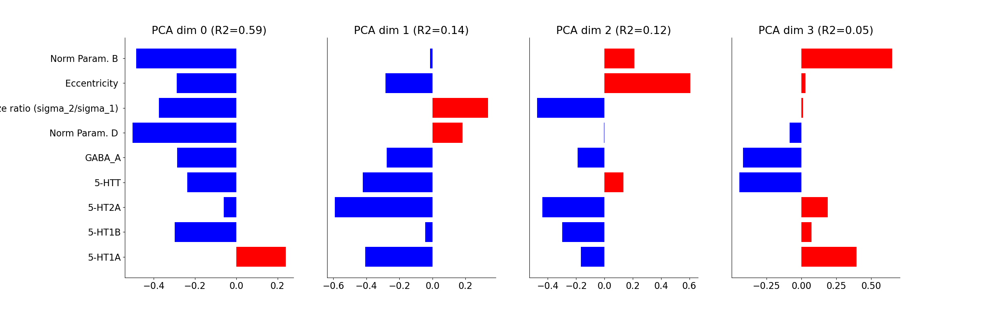

rsq thresh<0.15. setting pca pycortex vmax2=0.15
rsq thresh<0.15. setting pca pycortex vmax2=0.15
rsq thresh<0.15. setting pca pycortex vmax2=0.15
rsq thresh<0.15. setting pca pycortex vmax2=0.15
rsq thresh<0.15. setting pca pycortex vmax2=0.15
rsq thresh<0.15. setting pca pycortex vmax2=0.15
rsq thresh<0.15. setting pca pycortex vmax2=0.15
rsq thresh<0.15. setting pca pycortex vmax2=0.15
rsq thresh<0.15. setting pca pycortex vmax2=0.15


<IPython.core.display.Javascript object>


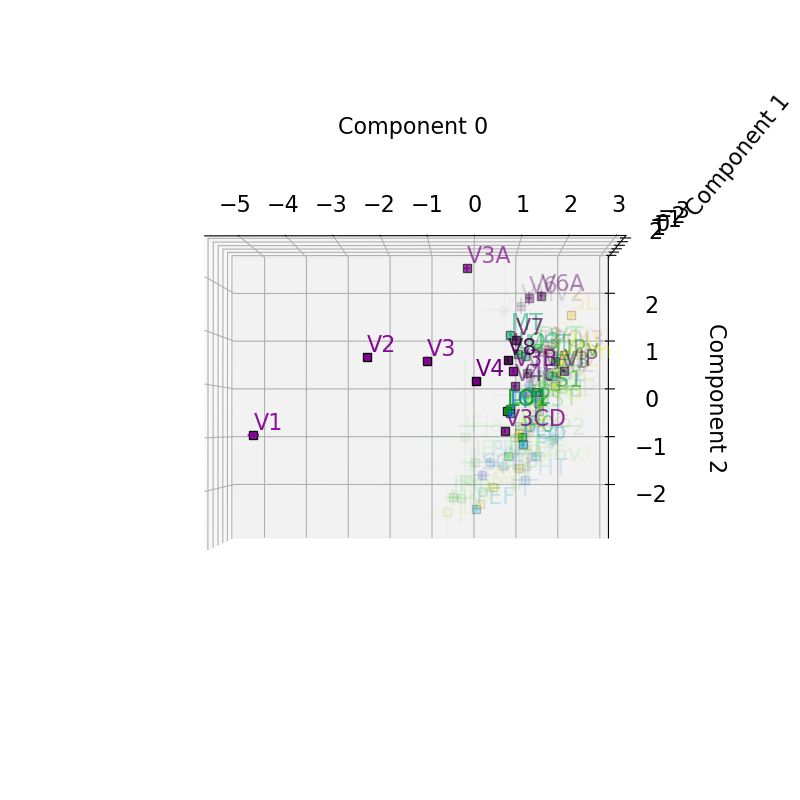

Started server on port 27002


0

In [10]:
#%%capture
display(HTML("<style>div.output_scroll { height: 150em; }</style>"))
pl.close('all')
#generalized quantitative parameter plots
#'Eccentricity'#'Suppression Index (full)'#'Suppression Index#'Size (fwhmax)'#'Surround Size (fwatmin)'
#'Norm Param. B'#''Ratio (B/D)'#'Norm Param. D'#'RSq'#'CCrsq_task-1R'#'CSS Exponent'#'Amplitude'
#'Surround Amplitude'#'Size (sigma_1)'##'Size (sigma_2)'
#'Size ratio (sigma_2/sigma_1)'#C/A#'B/A'#'D/C'#'D/A'#'B/C'#'Surround volume (full)'#'Centre volume (full)'
#'(A+B)/(C+D)'#'(A*B)/(C*D)'#'(A*D)/(C*B)'#'(A+D)/(C+B)'#'Point-stim derivative'#'(C(A+B))/(A(C+D))'
#'Min/Max Response Ratio'#'Max/Min Response Ratio'#'A(C+D)/C(A+B)'##Min/Max Response Ratio (with BD)'
#'A/C'
####DoG
#'Surround volume (full)'
#'Surround/Centre Amplitude' 
#'Surround-Centre Amplitude'
#'Surround-Centre Volume'

#parameters = ['Eccentricity', 'Norm Param. B', 'Norm Param. D', 'Size (sigma_1)','Size (sigma_2)', 'Amplitude','Surround Amplitude', 'Polar Angle',
#              '5-HT1A', '5-HT1B', '5-HT2A', '5-HT4', '5-HTT', 'GABA_A','Amplitude','Surround Amplitude', 'RSq']#,]#'Size ratio (sigma_2/sigma_1)']# 'Size (sigma_1)', 'Size (sigma_2)', 'Amplitude','Surround Amplitude']

parameters = ['5-HT1A', '5-HT1B', '5-HT2A', 'GABA_A', '5-HTT','Amplitude','Surround Amplitude', 'Eccentricity','Norm Param. B', 'Norm Param. D', 'Size ratio (sigma_2/sigma_1)','RSq']#

x_dims_idx = [0,1,2,3,4]
y_dims_idx = [7,8,9,10]

#rois = ['custom.V1', 'custom.V2', 'custom.V3','custom.V3AB','custom.hV4','custom.LO','custom.TO','custom.IPS','all_custom']
#rois = ['V1', 'V2', 'V3','V3AB','hV4','LO','TO','IPS', 'combined']#['Brain'] #'V1', 'V2', 'V3','V3AB','hV4','LO','TO','IPS','combined', 
#rois = [ 'V1', 'V2', 'V3', 'hV4', 'VO1', 'VO2', 'PHC1', 'PHC2', 'TO2', 'TO1', 'LO2', 'LO1', 'V3B', 'V3A', 'IPS0', 'IPS1', 'IPS2', 'IPS3', 'IPS4', 'IPS5', 'SPL1']#, 'combined']
#rois = ['all_custom']
rois = [roi for roi in vis_res.idx_rois['fsaverage'] if 'glasser' in roi]
#rois = ['glasser_V1','glasser_V2','glasser_V3','glasser_V4','glasser_V3A','glasser_V7','glasser_V3B','glasser_V3CD',
#'glasser_LO1','glasser_LO2','glasser_PIT','glasser_V8','glasser_VMV3',
#'glasser_IPS1','glasser_IP0','glasser_PGp','glasser_LO3','glasser_MT','glasser_V4t','glasser_FFC']
rois.append('combined')
        
rsq_thresh = 0.0
save_figures= False
figure_path = '/Volumes/Crucial X8/PRFMapping/Figures/attemptwnames_glasser_ecc65rsq030/pca'

space_names = 'fsaverage'
#set to 'all' to plot all analyses
analysis_names = 'fit-task-BAR_fit-runs-all'#''fit-task-BAR_fit-runs-CVmedian'# 'fit-task-BAR_fit-runs-all'#'fit-task-BAR_fit-runs-CVmedian'

subject_ids = ['fsaverage_cvrsq']#'fsaverage_hcp1sthalf', 'fsaverage_hcp2ndhalf']

threshold_li = filters.threshold_li(vis_res.main_dict[space_names][analysis_names][subject_ids[0]]['Processed Results']['#Subjects with CVRSq>0']['Norm_abcd'])

vis_res.set_alpha(only_models=['Norm_abcd'], ecc_min=0.0, ecc_max=8.0, min_number_sjs=threshold_li)

vis_res.multidim_analysis(parameters, rois, rsq_thresh, save_figures, figure_path, space_names = space_names, parameter_toplevel='Receptor Maps', rsq_weights= True,
                    analysis_names = analysis_names, subject_ids = subject_ids, x_dims_idx=x_dims_idx, y_dims_idx=y_dims_idx,
                          zscore_data= False, zscore_data_across_rois = True, 
                          size_response_curves = False, plot_corr_matrix = False, perform_ols = False, polar_plots = False,
                             cv_regression = False, bold_voxel_volume=4.096, zconfint_err_alpha=None, quantile_exclusion=0.999,
                          #vis_pca_comps_rois: fr which rois to make pca comp beta plots; 
                          #vis_pca_comps_axes: which comps to use in 2d plot of mean pca comp per roi
                        perform_pca = True, vis_pca_pycortex = True, vis_pca_comps_rois = ['combined'], vis_pca_comps_axes = [0,1,2], rsq_alpha_pca_plot = True,
                          perform_pls = False, vis_pls_pycortex = False)

os.system(f"open {sound_file}")


## PLS

In [ ]:
#%%capture
#display(HTML("<style>div.output_scroll { height: 150em; }</style>"))
pl.close('all')
#generalized quantitative parameter plots
#'Eccentricity'#'Suppression Index (full)'#'Suppression Index#'Size (fwhmax)'#'Surround Size (fwatmin)'
#'Norm Param. B'#''Ratio (B/D)'#'Norm Param. D'#'RSq'#'CCrsq_task-1R'#'CSS Exponent'#'Amplitude'
#'Surround Amplitude'#'Size (sigma_1)'##'Size (sigma_2)'
#'Size ratio (sigma_2/sigma_1)'#C/A#'B/A'#'D/C'#'D/A'#'B/C'#'Surround volume (full)'#'Centre volume (full)'
#'(A+B)/(C+D)'#'(A*B)/(C*D)'#'(A*D)/(C*B)'#'(A+D)/(C+B)'#'Point-stim derivative'#'(C(A+B))/(A(C+D))'
#'Min/Max Response Ratio'#'Max/Min Response Ratio'#'A(C+D)/C(A+B)'##Min/Max Response Ratio (with BD)'
#'A/C'
####DoG
#'Surround volume (full)'
#'Surround/Centre Amplitude' 
#'Surround-Centre Amplitude'
#'Surround-Centre Volume'

#parameters = ['Eccentricity', 'Norm Param. B', 'Norm Param. D', 'Size (sigma_1)','Size (sigma_2)', 'Amplitude','Surround Amplitude', 'Polar Angle',
#              '5-HT1A', '5-HT1B', '5-HT2A', '5-HT4', '5-HTT', 'GABA_A','Amplitude','Surround Amplitude', 'RSq']#,]#'Size ratio (sigma_2/sigma_1)']# 'Size (sigma_1)', 'Size (sigma_2)', 'Amplitude','Surround Amplitude']

parameters = ['5-HT1A', '5-HT1B', '5-HT2A', 'GABA_A', '5-HTT', 'Eccentricity','Norm Param. B', 'Norm Param. D', 'Size (sigma_1)','Size (sigma_2)','RSq']#

x_dims_idx = [0,1,2,3,4]
y_dims_idx = [5,6,7,8,9]

#rois = ['custom.V1', 'custom.V2', 'custom.V3','custom.V3AB','custom.hV4','custom.LO','custom.TO','custom.IPS','all_custom']
#rois = ['V1', 'V2', 'V3','V3AB','hV4','LO','TO','IPS', 'combined']#['Brain'] #'V1', 'V2', 'V3','V3AB','hV4','LO','TO','IPS','combined', 
#rois = [ 'V1', 'V2', 'V3', 'hV4', 'VO1', 'VO2', 'PHC1', 'PHC2', 'TO2', 'TO1', 'LO2', 'LO1', 'V3B', 'V3A', 'IPS0', 'IPS1', 'IPS2', 'IPS3', 'IPS4', 'IPS5', 'SPL1']#, 'combined']
#rois = ['all_custom']
rois = [roi for roi in vis_res.idx_rois['fsaverage'] if 'glasser' in roi]
#rois = ['glasser_V1','glasser_V2','glasser_V3','glasser_V4','glasser_V3A','glasser_V7','glasser_V3B','glasser_V3CD',
#'glasser_LO1','glasser_LO2','glasser_PIT','glasser_V8','glasser_VMV3',
#'glasser_IPS1','glasser_IP0','glasser_PGp','glasser_LO3','glasser_MT','glasser_V4t','glasser_FFC']
rois.append('combined')
        
rsq_thresh = 0.0
save_figures= False
figure_path = '/Volumes/Crucial X8/PRFMapping/Figures/attemptwnames_glasser_ecc65rsq030/pls'

space_names = 'fsaverage'
#set to 'all' to plot all analyses
analysis_names = 'fit-task-BAR_fit-runs-all'#'fit-task-BAR_fit-runs-CVmedian'

subject_ids = ['fsaverage_cvrsq']#['fsaverage_hcp1sthalf', 'fsaverage_hcp2ndhalf']

threshold_li = filters.threshold_li(vis_res.main_dict[space_names][analysis_names][subject_ids[0]]['Processed Results']['#Subjects with CVRSq>0']['Norm_abcd'])

vis_res.set_alpha(only_models=['Norm_abcd'], ecc_min=0.0, ecc_max=6.5, min_number_sjs=threshold_li)

vis_res.multidim_analysis(parameters, rois, rsq_thresh, save_figures, figure_path, space_names = space_names, parameter_toplevel='Receptor Maps', rsq_weights= True,
                    analysis_names = analysis_names, subject_ids = subject_ids, x_dims_idx=x_dims_idx, y_dims_idx=y_dims_idx,
                          zscore_data= False, zscore_data_across_rois = True, 
                          size_response_curves = False, plot_corr_matrix = False, perform_ols = False, polar_plots = False,
                             cv_regression = False, bold_voxel_volume=4.096, zconfint_err_alpha=None, quantile_exclusion=0.999,
                          #vis_pca_comps_rois: fr which rois to make pca comp beta plots; 
                          #vis_pca_comps_axes: which comps to use in 2d plot of mean pca comp per roi
                        perform_pca = False, vis_pca_pycortex = False, vis_pca_comps_rois = ['combined'], vis_pca_comps_axes = [0,1], rsq_alpha_pca_plot = True,
                          perform_pls = True, vis_pls_pycortex = False)

os.system(f"open {sound_file}")


## Size-response curves

In [ ]:
vis_res.main_dict['fsaverage']['fit-task-BAR_fit-runs-all']['fsaverage_cvrsq']['analysis_info'] = vis_res.main_dict['HCP']['fit-task-BAR_fit-runs-all']['100610']['analysis_info']

HCP fit-task-BAR_fit-runs-all 100610
HCP fit-task-BAR_fit-runs-all 102311
HCP fit-task-BAR_fit-runs-all 102816
HCP fit-task-BAR_fit-runs-all 104416
HCP fit-task-BAR_fit-runs-all 105923
HCP fit-task-BAR_fit-runs-all 108323
HCP fit-task-BAR_fit-runs-all 109123
HCP fit-task-BAR_fit-runs-all 111312
HCP fit-task-BAR_fit-runs-all 111514
HCP fit-task-BAR_fit-runs-all 114823
HCP fit-task-BAR_fit-runs-all 115017
HCP fit-task-BAR_fit-runs-all 115825
HCP fit-task-BAR_fit-runs-all 116726
HCP fit-task-BAR_fit-runs-all 118225
HCP fit-task-BAR_fit-runs-all 125525
HCP fit-task-BAR_fit-runs-all 126426
HCP fit-task-BAR_fit-runs-all 128935
HCP fit-task-BAR_fit-runs-all 130114
HCP fit-task-BAR_fit-runs-all 130518
HCP fit-task-BAR_fit-runs-all 131217
HCP fit-task-BAR_fit-runs-all 131722
HCP fit-task-BAR_fit-runs-all 132118
HCP fit-task-BAR_fit-runs-all 134627
HCP fit-task-BAR_fit-runs-all 134829
HCP fit-task-BAR_fit-runs-all 135124
HCP fit-task-BAR_fit-runs-all 137128
HCP fit-task-BAR_fit-runs-all 140117
H

fsaverage fit-task-BAR_fit-runs-all 169343
fsaverage fit-task-BAR_fit-runs-all 169444
fsaverage fit-task-BAR_fit-runs-all 169747
fsaverage fit-task-BAR_fit-runs-all 171633
fsaverage fit-task-BAR_fit-runs-all 172130
fsaverage fit-task-BAR_fit-runs-all 173334
fsaverage fit-task-BAR_fit-runs-all 175237
fsaverage fit-task-BAR_fit-runs-all 176542
fsaverage fit-task-BAR_fit-runs-all 177140
fsaverage fit-task-BAR_fit-runs-all 177645
fsaverage fit-task-BAR_fit-runs-all 177746
fsaverage fit-task-BAR_fit-runs-all 178142
fsaverage fit-task-BAR_fit-runs-all 178243
fsaverage fit-task-BAR_fit-runs-all 178647
fsaverage fit-task-BAR_fit-runs-all 180533
fsaverage fit-task-BAR_fit-runs-all 181232
fsaverage fit-task-BAR_fit-runs-all 181636
fsaverage fit-task-BAR_fit-runs-all 182436
fsaverage fit-task-BAR_fit-runs-all 182739
fsaverage fit-task-BAR_fit-runs-all 185442
fsaverage fit-task-BAR_fit-runs-all 186949
fsaverage fit-task-BAR_fit-runs-all 187345
fsaverage fit-task-BAR_fit-runs-all 191033
fsaverage f

<IPython.core.display.Javascript object>


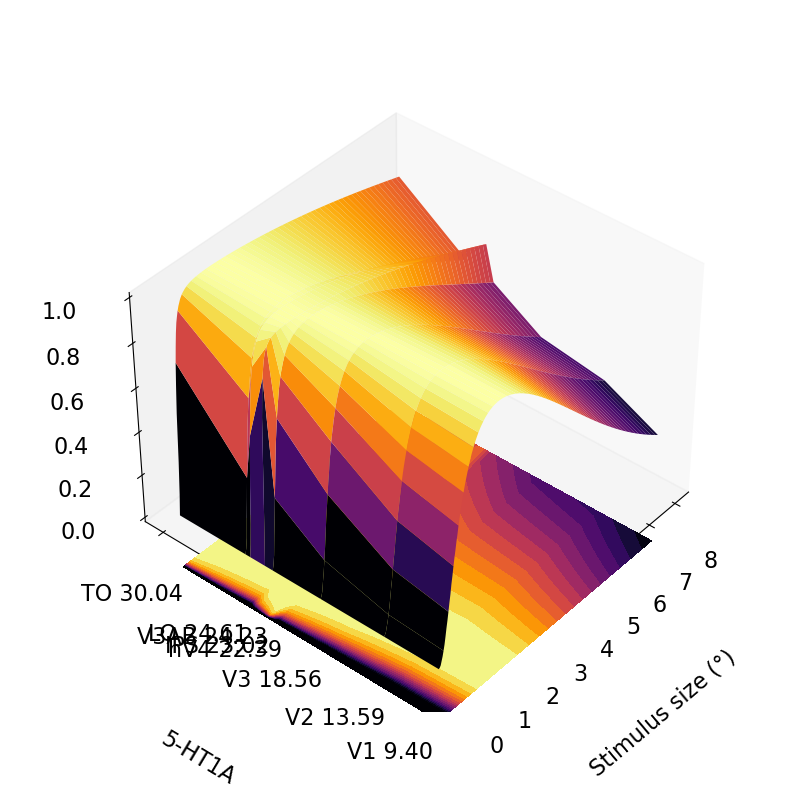

fit-task-BAR_fit-runs-all fsaverage_cvrsq custom.V1


<IPython.core.display.Javascript object>


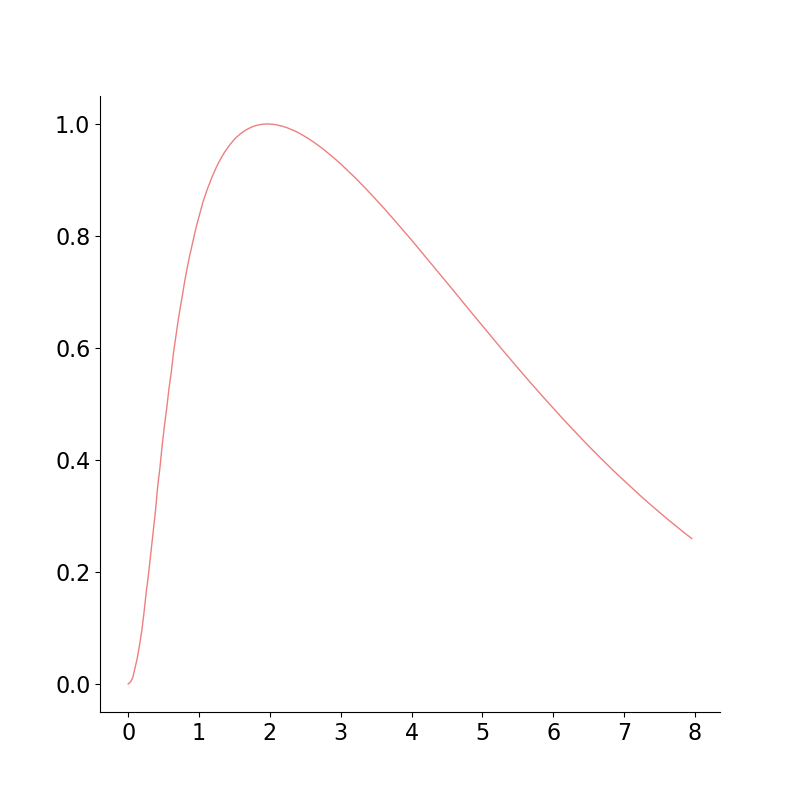

fit-task-BAR_fit-runs-all fsaverage_cvrsq custom.V2


<IPython.core.display.Javascript object>


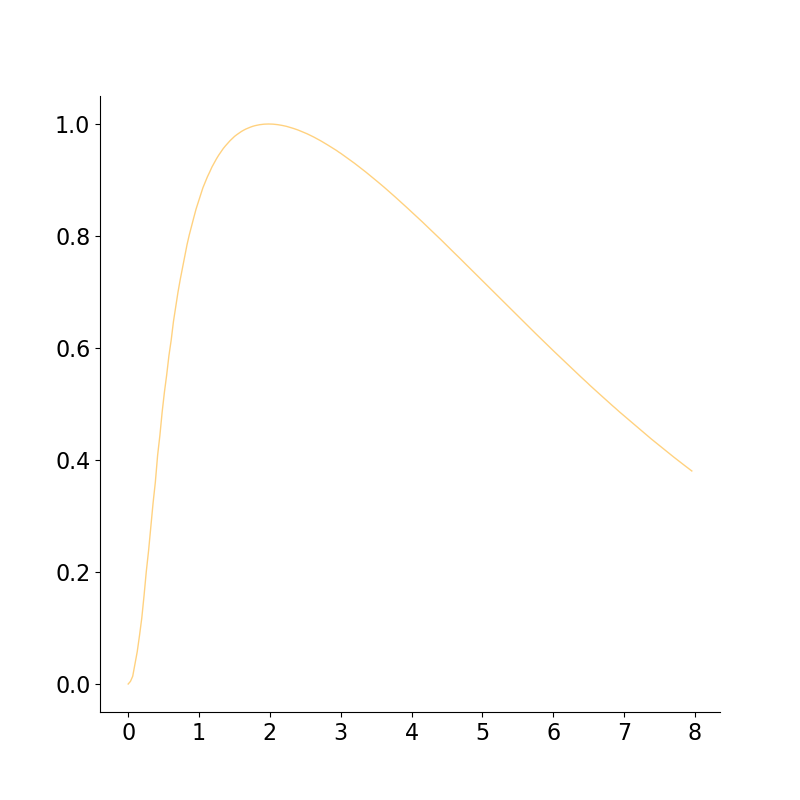

fit-task-BAR_fit-runs-all fsaverage_cvrsq custom.V3


<IPython.core.display.Javascript object>


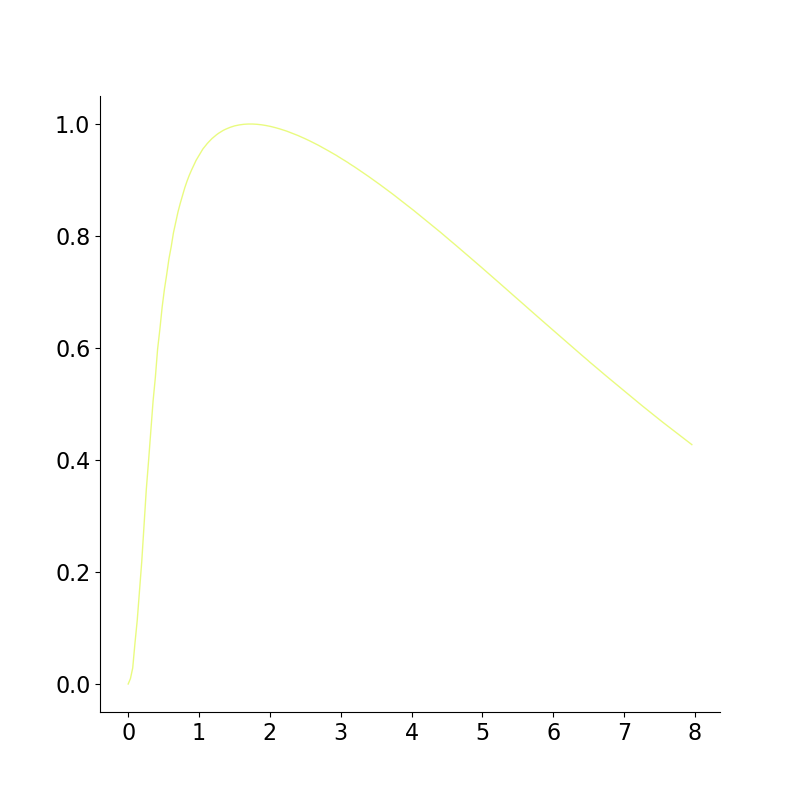

fit-task-BAR_fit-runs-all fsaverage_cvrsq custom.V3AB


<IPython.core.display.Javascript object>


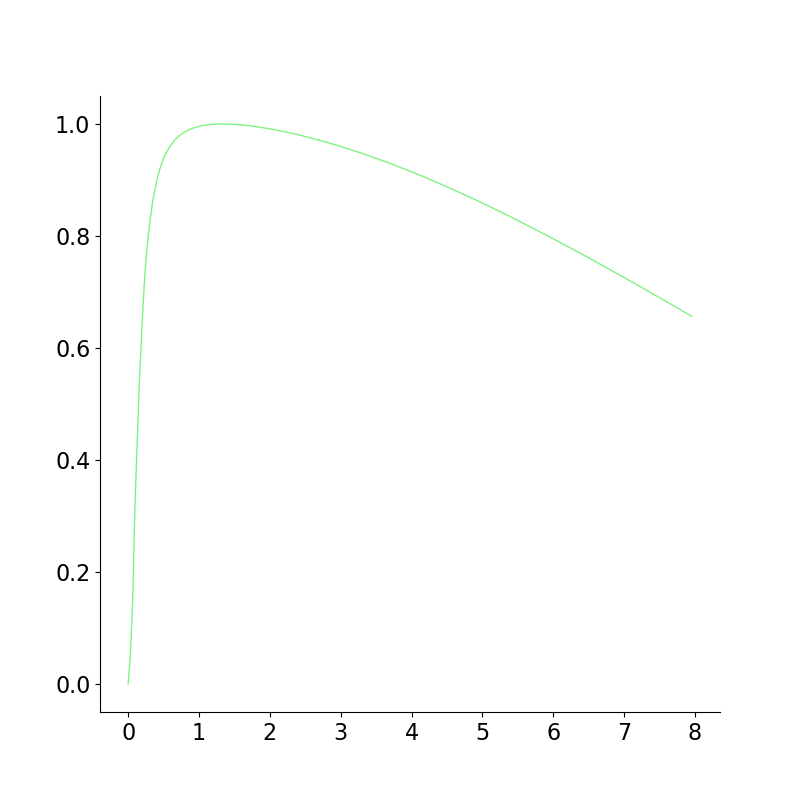

fit-task-BAR_fit-runs-all fsaverage_cvrsq custom.hV4


<IPython.core.display.Javascript object>


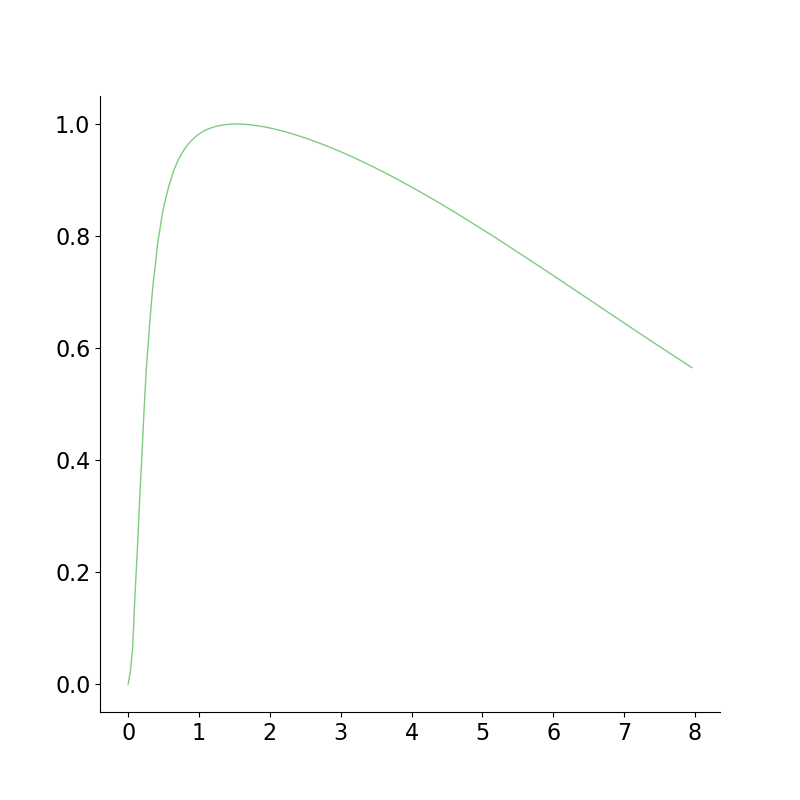

fit-task-BAR_fit-runs-all fsaverage_cvrsq custom.LO


<IPython.core.display.Javascript object>


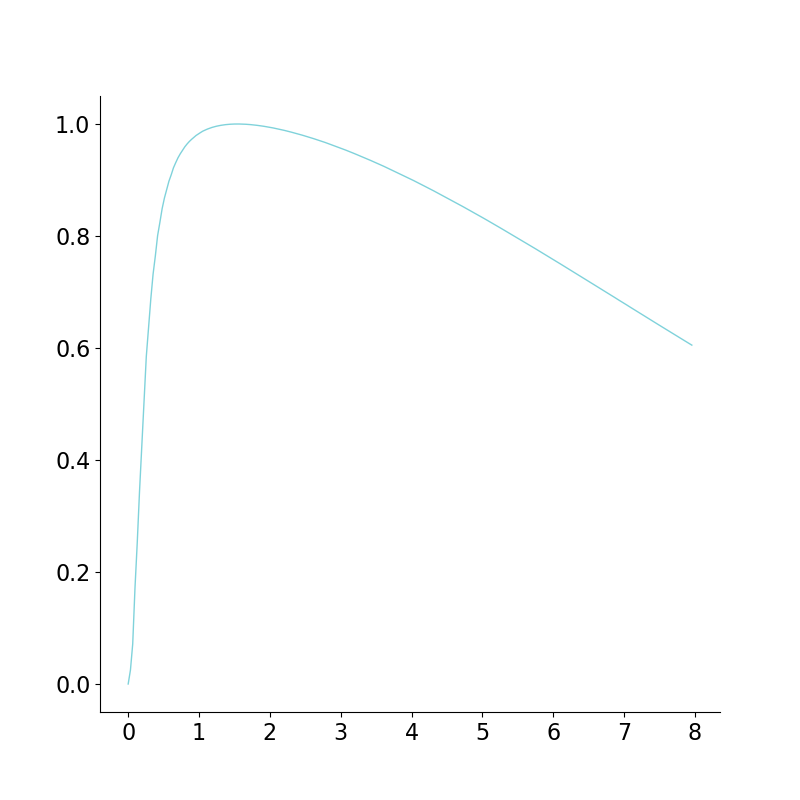

fit-task-BAR_fit-runs-all fsaverage_cvrsq custom.TO


<IPython.core.display.Javascript object>


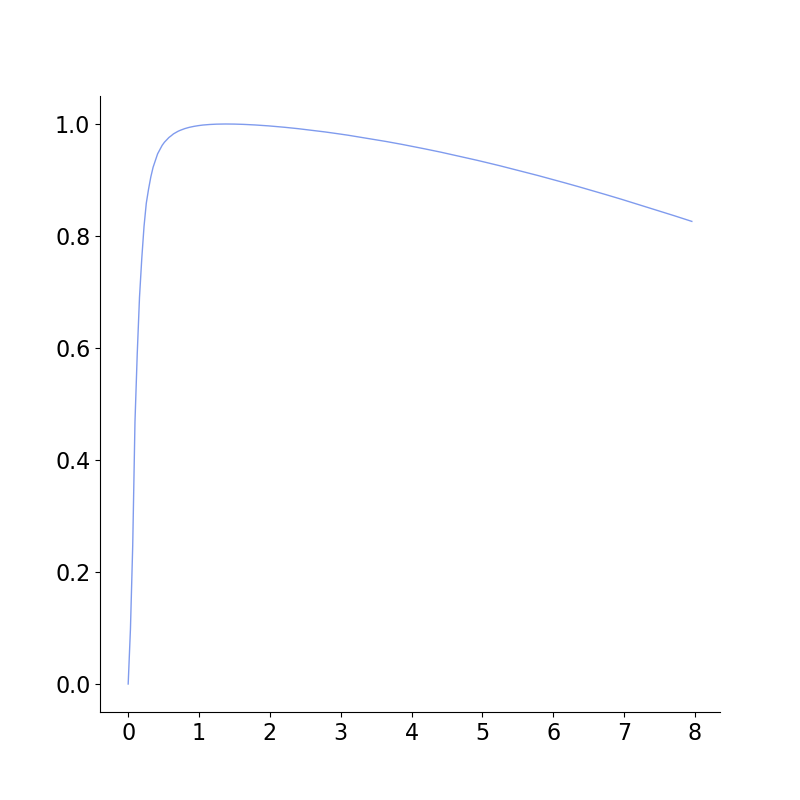

fit-task-BAR_fit-runs-all fsaverage_cvrsq custom.VO
fit-task-BAR_fit-runs-all fsaverage_cvrsq custom.IPS


<IPython.core.display.Javascript object>


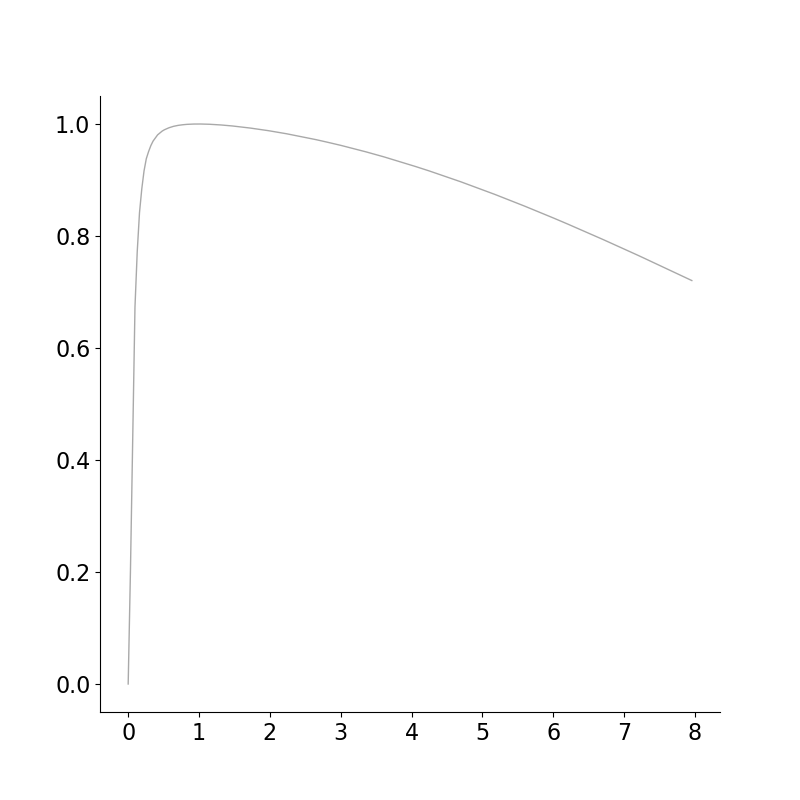

0

In [12]:
#%%capture
#display(HTML("<style>div.output_scroll { height: 150em; }</style>"))
pl.close('all')
#generalized quantitative parameter plots
#'Eccentricity'#'Suppression Index (full)'#'Suppression Index#'Size (fwhmax)'#'Surround Size (fwatmin)'
#'Norm Param. B'#''Ratio (B/D)'#'Norm Param. D'#'RSq'#'CCrsq_task-1R'#'CSS Exponent'#'Amplitude'
#'Surround Amplitude'#'Size (sigma_1)'##'Size (sigma_2)'
#'Size ratio (sigma_2/sigma_1)'#C/A#'B/A'#'D/C'#'D/A'#'B/C'#'Surround volume (full)'#'Centre volume (full)'
#'(A+B)/(C+D)'#'(A*B)/(C*D)'#'(A*D)/(C*B)'#'(A+D)/(C+B)'#'Point-stim derivative'#'(C(A+B))/(A(C+D))'
#'Min/Max Response Ratio'#'Max/Min Response Ratio'#'A(C+D)/C(A+B)'##Min/Max Response Ratio (with BD)'
#'A/C'
####DoG
#'Surround volume (full)'
#'Surround/Centre Amplitude' 
#'Surround-Centre Amplitude'
#'Surround-Centre Volume'

parameters = ['Eccentricity', 'Norm Param. B', 'Norm Param. D', 'Size (sigma_1)','Size (sigma_2)', 'Polar Angle',
              '5-HT1A', '5-HT1B', '5-HT2A', '5-HT4', '5-HTT', 'GABA_A','Amplitude','Surround Amplitude', 'RSq']#,'Amplitude','Surround Amplitude']#'Size ratio (sigma_2/sigma_1)']# 'Size (sigma_1)', 'Size (sigma_2)', 'Amplitude','Surround Amplitude']

x_dims_idx = [0,1,2,3,4,5]
y_dims_idx = [12,13]

third_dim_sr_curves = '5-HT1A'#'Norm Param. D Norm_abcd'

rois = ['custom.V1', 'custom.V2', 'custom.V3','custom.V3AB','custom.hV4','custom.LO','custom.TO','custom.VO','custom.IPS']
#rois = ['V1', 'V2', 'V3','V3AB','hV4','LO','TO','VO','IPS']#,'combined']#[roi for roi in vis_res.idx_rois['fsaverage'] if 'glasser' in roi] #'V1', 'V2', 'V3','V3AB','hV4','LO','TO','IPS','combined', 
#rois = [roi for roi in vis_res.idx_rois['fsaverage'] if 'glasser' in roi]
#rois = ['glasser_V1','glasser_V2','glasser_V3','glasser_V4','glasser_V3A','glasser_V7','glasser_V3B','glasser_V3CD',
#'glasser_LO1','glasser_LO2','glasser_PIT','glasser_V8','glasser_VMV3',
#'glasser_IPS1','glasser_IP0','glasser_PGp','glasser_LO3','glasser_MT','glasser_V4t','glasser_FFC']
#rois = [ 'V1', 'V2', 'V3', 'hV4', 'VO1', 'VO2', 'PHC1', 'PHC2', 'TO2', 'TO1', 'LO2', 'LO1', 'V3B', 'V3A', 'IPS0', 'IPS1', 'IPS2', 'IPS3', 'IPS4', 'IPS5', 'SPL1', 'combined']
#rois = ['all_custom']
        
rsq_thresh = 0.15
save_figures = False
figure_path = '/Volumes/Crucial X8/PRFMapping/Figures/newfsarsqwmlowthr/size_response_glasser'

space_names = 'fsaverage'
#set to 'all' to plot all analyses
analysis_names = 'fit-task-BAR_fit-runs-all'

subject_ids = ['fsaverage_cvrsq']#'fsaverage_hcp1sthalf', 'fsaverage_hcp2ndhalf']

threshold_li = filters.threshold_li(vis_res.main_dict[space_names][analysis_names][subject_ids[0]]['Processed Results']['#Subjects with CVRSq>0']['Norm_abcd'])

vis_res.set_alpha(only_models=['Norm_abcd'], ecc_min=0.0, ecc_max=8.0, min_number_sjs=threshold_li)

vis_res.multidim_analysis(parameters, rois, rsq_thresh, save_figures, figure_path, space_names = space_names, parameter_toplevel='Receptor Maps', rsq_weights= True,
                    analysis_names = analysis_names, subject_ids = subject_ids, x_dims_idx=x_dims_idx, y_dims_idx=y_dims_idx,
                          zscore_data = False, zscore_data_across_rois = False, 
                          size_response_curves = True, third_dim_sr_curves = third_dim_sr_curves,
                          plot_corr_matrix = False, perform_ols = False, polar_plots = False,
                             cv_regression = False, bold_voxel_volume=4.096, zconfint_err_alpha=None, quantile_exclusion=0.999,
                            #vis_pca_comps_rois: fr which rois to make pca comp beta plots; 
                          #vis_pca_comps_axes: which comps to use in 2d plot of mean pca comp per roi
                        perform_pca = False, vis_pca_pycortex = False, vis_pca_comps_rois = ['combined'], vis_pca_comps_axes = [0,1], rsq_alpha_pca_plot = True,
                          perform_pls = False, vis_pls_pycortex = False)

os.system(f"open {sound_file}")

In [ ]:
[[3, 4], [2, 4], [2, 3], [1, 4], [1, 3], [1, 2], [0, 4], [0, 3], [0, 2], [0, 1]]

In [ ]:
import itertools

N = 4
numbers = list(range(N+1))

combinations = []
for i in range(1, N+2):
    combinations.extend(itertools.combinations(numbers, i))

print(combinations[::-1])

# HCP Crossvalidation

## Simple viz

In [ ]:
full_rsq = np.concatenate(tuple([vis_res.main_dict['HCP']['fit-task-BAR_fit-runs-CVmedian'][sj]['Processed Results']['RSq']['Norm_abcd'] for sj in vis_res.main_dict['HCP']['fit-task-BAR_fit-runs-CVmedian'].keys()]))
full_rsq_gauss = np.concatenate(tuple([vis_res.main_dict['HCP']['fit-task-BAR_fit-runs-CVmedian'][sj]['Processed Results']['RSq']['Gauss'] for sj in vis_res.main_dict['HCP']['fit-task-BAR_fit-runs-CVmedian'].keys()]))

In [ ]:
nc = np.concatenate(tuple([vis_res.main_dict['HCP']['fit-task-BAR_fit-runs-CVmedian'][sj]['Processed Results']['Noise Ceiling']['Noise Ceiling (RSq)'] for sj in vis_res.main_dict['HCP']['fit-task-BAR_fit-runs-CVmedian'].keys()]))


In [ ]:
thresh = -10
#mask_rsq = ((nc>thresh) + (full_rsq>thresh) + (full_rsq_gauss>thresh)) * (full_rsq_gauss!=0) * (full_rsq!=0) * ((nc>-5) * (full_rsq>-5) * (full_rsq_gauss>-5))
mask_rsq = (nc>thresh) * (full_rsq>thresh) * (full_rsq_gauss>thresh) #* (full_rsq_gauss!=0) * (full_rsq!=0) 

In [ ]:
np.nanquantile(nc[mask_rsq],0.1)

In [ ]:
pl.figure(figsize=(16,8))
pl.hist(full_rsq_gauss[mask_rsq],bins=np.linspace(thresh,1,1000), label='gauss cvr2', alpha=0.8)
pl.hist(full_rsq[mask_rsq],bins=np.linspace(thresh,1,1000), label='DN cvr2', alpha=0.8)
pl.hist(nc[mask_rsq],bins=np.linspace(thresh,1,1000), label='noise ceiling', alpha=0.8)
pl.axvline(np.mean(full_rsq[mask_rsq]), color='r', linestyle='dashed', linewidth=1, label=f'DN cvr2 mean ({np.mean(full_rsq[mask_rsq]):.2f})')
pl.axvline(np.mean(full_rsq_gauss[mask_rsq]), color='k', linestyle='dashed', linewidth=1, label=f'gauss cvr2 mean ({np.mean(full_rsq_gauss[mask_rsq]):.2f})')
pl.axvline(np.mean(nc[mask_rsq]), color='b', linestyle='dashed', linewidth=1, label=f'noise ceiling mean ({np.mean(nc[mask_rsq]):.2f})')
pl.axvline(np.median(full_rsq[mask_rsq]), color='r', linewidth=1, label=f'DN cvr2 median ({np.median(full_rsq[mask_rsq]):.2f}) ')
pl.axvline(np.median(full_rsq_gauss[mask_rsq]), color='k', linewidth=1, label=f'gauss cvr2 median ({np.median(full_rsq_gauss[mask_rsq]):.2f})')
pl.axvline(np.median(nc[mask_rsq]), color='b', linewidth=1, label=f'noise ceiling median ({np.median(nc[mask_rsq]):.2f})')
pl.legend()

pl.title(f'crossvalidated r2 distribution and noise ceiling (threshold: {thresh:.2f}. vertices: {np.sum(mask_rsq)})')

In [ ]:
pl.figure(figsize=(16,8))
diff = full_rsq[mask_rsq]-full_rsq_gauss[mask_rsq]
pl.hist(diff,bins=1000, label='diff', alpha=0.8)
pl.axvline(np.mean(diff), color='k', linestyle='dashed', linewidth=1, label='diff cvr2 mean')
pl.axvline(np.median(diff), color='k', linewidth=1, label='diff cvr2 median')
pl.legend()
pl.xlim((-1,1))

## Combining no-cv results with CV-rsq and # of subjects map

In [67]:
#rsqwm have rsq-weighted means over subjects on fsaverage
#maindict_ #allall, allruns_sepcond_rsqwm, 5050CV, allruns_sepcond_zsc, HCP_181subjects_rsqwm, HCP_999999, 99mean181, 99split20, HCP_cv (tcfit), HCP_tc_nocv
with open('/Volumes/Crucial X8/maindict_HCP_cv.pickle', 'rb') as handle:
    dict_cv=dill.load(handle)

In [56]:
dict_cv = vis_res.main_dict

In [57]:
m = [sj for sj in dict_cv['HCP']['fit-task-BAR_fit-runs-CVmedian'].keys()]
m.sort()
m

['100610',
 '102311',
 '102816',
 '104416',
 '105923',
 '108323',
 '109123',
 '111514',
 '114823',
 '115017',
 '115825',
 '116726',
 '118225',
 '125525',
 '126426',
 '128935',
 '130114',
 '130518',
 '131217',
 '131722',
 '132118',
 '134627',
 '134829',
 '135124',
 '137128',
 '140117',
 '144226',
 '145834',
 '146129',
 '146735',
 '146937',
 '148133',
 '150423',
 '155938',
 '156334',
 '157336',
 '158035',
 '158136',
 '159239',
 '162935',
 '164131',
 '164636',
 '165436',
 '167036',
 '167440',
 '169040',
 '169343',
 '169444',
 '169747']

In [ ]:
l = [sj for sj in vis_res.main_dict['HCP']['fit-task-BAR_fit-runs-all'].keys()]
l.sort()

In [68]:
hcp_group_average = dict()
ds_pyc = dict()

#only works on fsaverage because 'HCP' is not treated as a common space so it has one fewer layer in depth
#create the HCP_cvrsq subject manually if you want to do it in HCP space
space = 'fsaverage'  
if space == 'fsaverage':
    pyc_sj = 'fsaverage'
else:
    pyc_sj = '999999'

weights = np.nan_to_num(np.array([dict_cv[space]['fit-task-BAR_fit-runs-CVmedian'][sj]['Processed Results']['RSq']['Norm_abcd'] for sj in m]))
weights[weights<=0] = 0

sj_number_map = np.sum(weights>0, axis=0)
threshold_li = filters.threshold_li(sj_number_map)
print(threshold_li)

for param in ['RSq', 'x_pos', 'y_pos','Norm Param. B','Norm Param. D','Amplitude', 'Surround Amplitude','Size (fwhmax)','Surround Size (fwatmin)','Size (sigma_1)','Size (sigma_2)', 'hrf_1', 'hrf_2']:
    if param == 'x_pos':
        data = np.nan_to_num(np.array([vis_res.main_dict[space]['fit-task-BAR_fit-runs-all'][sj]['Processed Results']['Eccentricity']['Norm_abcd'] for sj in m])*np.cos(np.array([vis_res.main_dict[space]['fit-task-BAR_fit-runs-all'][sj]['Processed Results']['Polar Angle']['Norm_abcd'] for sj in m])))
    elif param == 'y_pos':
        data = np.nan_to_num(np.array([vis_res.main_dict[space]['fit-task-BAR_fit-runs-all'][sj]['Processed Results']['Eccentricity']['Norm_abcd'] for sj in m])*np.sin(np.array([vis_res.main_dict[space]['fit-task-BAR_fit-runs-all'][sj]['Processed Results']['Polar Angle']['Norm_abcd'] for sj in m])))
    
    elif param == 'RSq':
        data = np.copy(weights)
    else:
        data = np.nan_to_num(np.array([vis_res.main_dict[space]['fit-task-BAR_fit-runs-all'][sj]['Processed Results'][param]['Norm_abcd'] for sj in m]))

    if param == 'RSq':
        hcp_group_average[param] = (data*(weights>0)).sum(0)/(weights>0).sum(0)
    else:
        hcp_group_average[param] = (data*weights).sum(0)/weights.sum(0)


hcp_group_average['Rsqdiff_hrf_fit'] = np.nanmean(np.nan_to_num(np.array([vis_res.main_dict[space]['fit-task-BAR_fit-runs-CVmedian'][sj]['Processed Results']['RSq']['Norm_abcd']-dict_cv[space]['fit-task-BAR_fit-runs-CVmedian'][sj]['Processed Results']['RSq']['Norm_abcd'] for sj in m])), axis=0)

    
hcp_group_average['Polar Angle'] = np.arctan2(hcp_group_average['y_pos'], hcp_group_average['x_pos'])
hcp_group_average['Eccentricity'] = np.sqrt(hcp_group_average['y_pos']**2 + hcp_group_average['x_pos']**2) 
hcp_group_average['#Subjects with CVRSq>0'] = np.copy(sj_number_map)



5.9101402980404


/var/folders/vb/gdqfj5px0gb7r_bgl5hpf8n00000gn/T/ipykernel_37963/4208783917.py:31: RuntimeWarning: invalid value encountered in true_divide
  hcp_group_average[param] = (data*(weights>0)).sum(0)/(weights>0).sum(0)
/var/folders/vb/gdqfj5px0gb7r_bgl5hpf8n00000gn/T/ipykernel_37963/4208783917.py:33: RuntimeWarning: invalid value encountered in true_divide
  hcp_group_average[param] = (data*weights).sum(0)/weights.sum(0)


In [59]:
for param in hcp_group_average:
    vis_res.main_dict[space]['fit-task-BAR_fit-runs-all'][f'{space}_cvrsq']['Processed Results'][param]['Norm_abcd'] = np.copy(hcp_group_average[param])


vis_res.main_dict[space]['fit-task-BAR_fit-runs-all'][f'{space}_cvrsq']['Processed Results']['RSq']['Norm_abcd']=np.nan_to_num(vis_res.main_dict[space]['fit-task-BAR_fit-runs-all'][f'{space}_cvrsq']['Processed Results']['RSq']['Norm_abcd'])
vis_res.main_dict[space]['fit-task-BAR_fit-runs-all'][f'{space}_cvrsq']['Processed Results']['Size ratio (sigma_2/sigma_1)']['Norm_abcd']=vis_res.main_dict[space]['fit-task-BAR_fit-runs-all'][f'{space}_cvrsq']['Processed Results']['Size (sigma_2)']['Norm_abcd']/vis_res.main_dict[space]['fit-task-BAR_fit-runs-all'][f'{space}_cvrsq']['Processed Results']['Size (sigma_1)']['Norm_abcd']
vis_res.main_dict[space]['fit-task-BAR_fit-runs-all'][f'{space}_cvrsq']['Processed Results']['Ratio (B/D)']['Norm_abcd']=vis_res.main_dict[space]['fit-task-BAR_fit-runs-all'][f'{space}_cvrsq']['Processed Results']['Norm Param. B']['Norm_abcd']/vis_res.main_dict[space]['fit-task-BAR_fit-runs-all'][f'{space}_cvrsq']['Processed Results']['Norm Param. D']['Norm_abcd']


/var/folders/vb/gdqfj5px0gb7r_bgl5hpf8n00000gn/T/ipykernel_37963/3676781436.py:6: RuntimeWarning: invalid value encountered in true_divide
  vis_res.main_dict[space]['fit-task-BAR_fit-runs-all'][f'{space}_cvrsq']['Processed Results']['Size ratio (sigma_2/sigma_1)']['Norm_abcd']=vis_res.main_dict[space]['fit-task-BAR_fit-runs-all'][f'{space}_cvrsq']['Processed Results']['Size (sigma_2)']['Norm_abcd']/vis_res.main_dict[space]['fit-task-BAR_fit-runs-all'][f'{space}_cvrsq']['Processed Results']['Size (sigma_1)']['Norm_abcd']
/var/folders/vb/gdqfj5px0gb7r_bgl5hpf8n00000gn/T/ipykernel_37963/3676781436.py:7: RuntimeWarning: invalid value encountered in true_divide
  vis_res.main_dict[space]['fit-task-BAR_fit-runs-all'][f'{space}_cvrsq']['Processed Results']['Ratio (B/D)']['Norm_abcd']=vis_res.main_dict[space]['fit-task-BAR_fit-runs-all'][f'{space}_cvrsq']['Processed Results']['Norm Param. B']['Norm_abcd']/vis_res.main_dict[space]['fit-task-BAR_fit-runs-all'][f'{space}_cvrsq']['Processed Resul

In [81]:
for param in hcp_group_average:
    if param == 'Polar Angle':
        pyc_cmap = 'hsvx2'
        vmin1 = -3.1415
        vmax1 = 3.1415
    elif param in ['x_pos', 'y_pos']:
        pyc_cmap = 'nipy_spectral'
        vmin1 = -4
        vmax1 = 4
    elif param == 'RSq':
        pyc_cmap = 'inferno'
        vmin1 = 0
        vmax1 = 0.3  
    elif param == 'Rsqdiff_hrf_fit':
        pyc_cmap = 'RdBu_r'
        vmin1 = -0.05
        vmax1 = 0.05
    elif param == 'Norm Param. B':
        pyc_cmap = 'viridis_r'
        vmin1 = 0#np.nanquantile(hcp_group_average[param][sj_number_map>threshold_li],0.1)
        vmax1 = 100#np.nanquantile(hcp_group_average[param][sj_number_map>threshold_li],0.9)      
    elif param == 'Norm Param. D':
        pyc_cmap = 'inferno_r'
        vmin1 = 1#np.nanquantile(hcp_group_average[param][sj_number_map>threshold_li],0.1)
        vmax1 = 100#np.nanquantile(hcp_group_average[param][sj_number_map>threshold_li],0.9)     
    else:
        pyc_cmap = 'nipy_spectral'
        vmin1 = np.nanquantile(hcp_group_average[param][sj_number_map>threshold_li],0.1)
        vmax1 = np.nanquantile(hcp_group_average[param][sj_number_map>threshold_li],0.9)
        
    ds_pyc[f"{param}"] = Vertex2D_fix(hcp_group_average[param], sj_number_map, subject=pyc_sj, 
                                                        vmin=vmin1, 
                                                        vmax=vmax1, 
                                                        vmin2=threshold_li, vmax2=threshold_li+1, cmap=pyc_cmap)

# select path for static viewer on disk
viewer_path = '/Users/marcoaqil/Downloads'

# create viewer
#cortex.webgl.make_static(outpath=viewer_path, data=ds_pyc, recache=True)
cortex.webgl.show(ds_pyc)

Started server on port 1417


<JS: window.viewer>

<IPython.core.display.Javascript object>


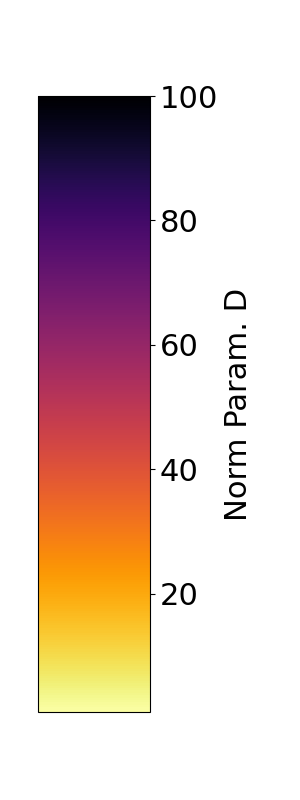

In [94]:
pl.close('all')
# for param in ['x_pos', 'y_pos']:
#     fig = simple_colorbar(vmin=-4,#np.nanquantile(hcp_group_average[param][sj_number_map>threshold_li],0.05),
#                 vmax=4,#np.nanquantile(hcp_group_average[param][sj_number_map>threshold_li],0.95),
#                 cmap_name=pyc_cmap, ori='horizontal', param_name=param)
for param in ['Norm Param. D']:
    fig = simple_colorbar(vmin=1,#np.nanquantile(hcp_group_average[param][sj_number_map>threshold_li],0.05),
                vmax=100,#np.nanquantile(hcp_group_average[param][sj_number_map>threshold_li],0.95),
                cmap_name='inferno_r', ori='vertical', param_name=param)


## CVR2 maps tests (neg values not set to zero, median)

In [ ]:
cvrsq_raw_mean = np.mean([vis_res.main_dict['HCP']['fit-task-BAR_fit-runs-CVmedian'][sj]['Processed Results']['RSq']['Norm_abcd'] for sj in vis_res.main_dict['HCP']['fit-task-BAR_fit-runs-CVmedian'].keys()], axis=0)
cvrsq_raw_median = np.median([vis_res.main_dict['HCP']['fit-task-BAR_fit-runs-CVmedian'][sj]['Processed Results']['RSq']['Norm_abcd'] for sj in vis_res.main_dict['HCP']['fit-task-BAR_fit-runs-CVmedian'].keys()], axis=0)

cvrsq_raw_number_sj = np.sum([vis_res.main_dict['HCP']['fit-task-BAR_fit-runs-CVmedian'][sj]['Processed Results']['RSq']['Norm_abcd']>0 for sj in vis_res.main_dict['HCP']['fit-task-BAR_fit-runs-CVmedian'].keys()], axis=0)


In [ ]:
(cvrsq_raw_mean>0).sum()/len(cvrsq_raw_mean)

In [ ]:
rsq_thresh = 0.0
rsq_max_opacity = 0.15
ds_rsq=dict()
ds_rsq[f"cvrsq_raw_mean"] = cortex.Vertex(cvrsq_raw_mean, subject='999999', 
                                vmin=np.nanquantile(cvrsq_raw_mean,0.1), 
                                vmax=np.nanquantile(cvrsq_raw_mean,0.9), cmap='nipy_spectral')
ds_rsq[f"cvrsq_raw_median"] = cortex.Vertex(cvrsq_raw_median, subject='999999', 
                                vmin=np.nanquantile(cvrsq_raw_median,0.1), 
                                vmax=np.nanquantile(cvrsq_raw_median,0.9), cmap='nipy_spectral')
ds_rsq[f"cvrsq_raw_number_sj"] = cortex.Vertex(cvrsq_raw_number_sj, subject='999999', 
                                vmin=8, 
                                vmax=150, cmap='nipy_spectral')
cortex.webgl.show(ds_rsq)

In [ ]:
from skimage import filters
threshold_yen = filters.threshold_yen(cvrsq_raw_number_sj) #yen=43, otsu=56, isodata=56, li=22, mean=16.54, minimum=89, triangle=8
threshold_otsu = filters.threshold_otsu(cvrsq_raw_number_sj)
threshold_isodata = filters.threshold_isodata(cvrsq_raw_number_sj)
threshold_li = filters.threshold_li(cvrsq_raw_number_sj)
threshold_mean = filters.threshold_mean(cvrsq_raw_number_sj)
threshold_minimum = filters.threshold_minimum(cvrsq_raw_number_sj)
threshold_triangle = filters.threshold_triangle(cvrsq_raw_number_sj)

In [ ]:
thresh

In [ ]:
np.sum(cvrsq_raw_number_sj>thresh)/len(cvrsq_raw_number_sj)

In [ ]:
pl.figure()
pl.hist(cvrsq_raw_number_sj,bins=175)
pl.axvline(threshold_yen, linestyle='--', color='k', label = f"Yen ({threshold_yen:.1f})")
pl.axvline(threshold_otsu, linestyle='--', color='r', label = f"Otsu ({threshold_otsu:.1f})")
pl.axvline(threshold_isodata, linestyle='--', color='g', label = f"Iso ({threshold_isodata:.1f})")
pl.axvline(threshold_li, linestyle='--', color='b', label = f"Li ({threshold_li:.1f})")
pl.axvline(threshold_mean, linestyle='--', color='orange', label = f"Mean ({threshold_mean:.1f})")
pl.axvline(threshold_minimum, linestyle='--', color='pink', label = f"Minimum ({threshold_minimum:.1f})")
pl.axvline(threshold_triangle, linestyle='--', color='yellow', label = f"Triangle ({threshold_triangle:.1f})")
pl.xlabel('# subjects with cvR2>0')
pl.ylabel('# vertices')
pl.yscale('log')
pl.legend()

# Something wrong with subj 115017. investigate

In [ ]:
vis_res.main_dict['HCP']['fit-task-all_fit-runs-all'][sj].keys()

In [ ]:
for sj in vis_res.main_dict['HCP']['fit-task-all_fit-runs-all']:
    print(sj)
    print(vis_res.main_dict['HCP']['fit-task-all_fit-runs-all'][sj]['mask'].sum())
    print(vis_res.main_dict['HCP']['fit-task-all_fit-runs-all'][sj]['Results']['Gauss'].shape)

In [ ]:
#rsqwm have rsq-weighted means over subjects on fsaverage
#maindict_ #allall, allruns_sepcond_rsqwm, 5050CV, allruns_sepcond_zsc, HCP_181subjects_rsqwm, HCP_999999, 99mean181, 99split20, HCP_cv (tcfit), HCP_tc_nocv
with open('/Volumes/Crucial X8/maindict_HCP_cv.pickle', 'rb') as handle:
    dict_cv=dill.load(handle)

In [ ]:
vis_res.main_dict[space][an_name].keys()

In [ ]:
hcp_group_average = dict()
ds_pyc = dict()
an_name = 'fit-task-all_fit-runs-all'
space = 'fsaverage'  #'HCP'#fsaverage

m = [sj for sj in vis_res.main_dict[space][an_name].keys()]
m.sort()

if space == 'fsaverage':
    pyc_sj = 'fsaverage'
else:
    pyc_sj = '999999'

#cvrsq
weights = np.nan_to_num(np.array([dict_cv[space]['fit-task-BAR_fit-runs-CVmedian'][sj]['Processed Results']['RSq']['Norm_abcd'] for sj in m]))
#noncvrsq
#weights = np.nan_to_num(np.array([vis_res.main_dict[space][an_name][sj]['Processed Results']['RSq']['Norm_abcd'] for sj in m]))

weights[weights<=0] = 0

sj_number_map = np.sum(weights>0, axis=0)
threshold_li = filters.threshold_li(sj_number_map)
print(threshold_li)

for param in ['RSq', 'x_pos', 'y_pos','Norm Param. B','Norm Param. D','Amplitude', 'Surround Amplitude','Size (fwhmax)','Surround Size (fwatmin)','Size (sigma_1)','Size (sigma_2)']:
    if param == 'x_pos':
        data = np.nan_to_num(np.array([vis_res.main_dict[space][an_name][sj]['Processed Results']['Eccentricity']['Norm_abcd'] for sj in m])*np.cos(np.array([vis_res.main_dict[space][an_name][sj]['Processed Results']['Polar Angle']['Norm_abcd'] for sj in m])))
    elif param == 'y_pos':
        data = np.nan_to_num(np.array([vis_res.main_dict[space][an_name][sj]['Processed Results']['Eccentricity']['Norm_abcd'] for sj in m])*np.sin(np.array([vis_res.main_dict[space][an_name][sj]['Processed Results']['Polar Angle']['Norm_abcd'] for sj in m])))
    elif param == 'RSq':
        data = np.copy(weights)
    else:
        data = np.nan_to_num(np.array([vis_res.main_dict[space][an_name][sj]['Processed Results'][param]['Norm_abcd'] for sj in m]))

    if param == 'RSq':
        hcp_group_average[param] = (data*(weights>0)).sum(0)/(weights>0).sum(0)
    else:
        hcp_group_average[param] = (data*weights).sum(0)/weights.sum(0)
    
hcp_group_average['Polar Angle'] = np.arctan2(hcp_group_average['y_pos'], hcp_group_average['x_pos'])
hcp_group_average['Eccentricity'] = np.sqrt(hcp_group_average['y_pos']**2 + hcp_group_average['x_pos']**2) 
hcp_group_average['#Subjects with CVRSq>0'] = np.copy(sj_number_map)


In [ ]:
if space == 'HCP':
    vis_res.main_dict[space][an_name][f'{space}_cvrsq'] = dd(lambda:dd(dict))

for param in hcp_group_average:
    
    vis_res.main_dict[space][an_name][f'{space}_cvrsq']['Processed Results'][param]['Norm_abcd'] = np.copy(hcp_group_average[param])
    

vis_res.main_dict[space][an_name][f'{space}_cvrsq']['Processed Results']['RSq']['Norm_abcd']=np.nan_to_num(vis_res.main_dict[space][an_name][f'{space}_cvrsq']['Processed Results']['RSq']['Norm_abcd'])
vis_res.main_dict[space][an_name][f'{space}_cvrsq']['Processed Results']['Size ratio (sigma_2/sigma_1)']['Norm_abcd']=vis_res.main_dict[space][an_name][f'{space}_cvrsq']['Processed Results']['Size (sigma_2)']['Norm_abcd']/vis_res.main_dict[space][an_name][f'{space}_cvrsq']['Processed Results']['Size (sigma_1)']['Norm_abcd']
vis_res.main_dict[space][an_name][f'{space}_cvrsq']['Processed Results']['Ratio (B/D)']['Norm_abcd']=vis_res.main_dict[space][an_name][f'{space}_cvrsq']['Processed Results']['Norm Param. B']['Norm_abcd']/vis_res.main_dict[space][an_name][f'{space}_cvrsq']['Processed Results']['Norm Param. D']['Norm_abcd']


In [64]:
for param in hcp_group_average:
    if param == 'Polar Angle':
        pyc_cmap = 'hsvx2'
        vmin1 = -3.1415
        vmax1 = 3.1415
    else:
        pyc_cmap = 'nipy_spectral'
        vmin1 = np.nanquantile(hcp_group_average[param][sj_number_map>threshold_li],0.1)
        vmax1 = np.nanquantile(hcp_group_average[param][sj_number_map>threshold_li],0.9)
        
    ds_pyc[f"{param}"] = Vertex2D_fix(hcp_group_average[param], sj_number_map, subject=pyc_sj, 
                                                        vmin=vmin1, 
                                                        vmax=vmax1, 
                                                        vmin2=threshold_li, vmax2=threshold_li+1, cmap=pyc_cmap)

# select path for static viewer on disk
viewer_path = '/Users/marcoaqil/Downloads'

# create viewer
#cortex.webgl.make_static(outpath=viewer_path, data=ds_pyc, recache=True)
cortex.webgl.show(ds_pyc)

/Users/marcoaqil/pycortex/cortex/dataset/views.py:207: UserWarning: Trying to register the cmap 'hsvx2' which already exists.
  cm.register_cmap(self.cmap,cmap)


Started server on port 49808


<JS: window.viewer>

In [11]:
for space, space_res in vis_res.main_dict.items(): 
    print(space)
    if space == 'fsnative' or space == 'HCP':
        for analysis, analysis_res in space_res.items():
            print(analysis)
            for subj, subj_res in analysis_res.items():
                print(subj)

marcus_dict = deepcopy(vis_res.main_dict['fsnative']['fit-task-2R_fit-runs-all']['sub-006'])
marcus_dict['idx_rois'] = deepcopy(vis_res.idx_rois['sub-006'])
with open('/Volumes/Crucial X8/marcus_dict.pickle', 'wb') as handle:
     dill.dump(marcus_dict, handle)

fsnative
fit-task-1R_fit-runs-all
sub-001
sub-002
sub-003
sub-004
sub-005
sub-006
sub-007
fit-task-1S_fit-runs-all
sub-001
sub-002
sub-003
sub-004
sub-005
sub-006
sub-007
fit-task-2R_fit-runs-all
sub-001
sub-002
sub-003
sub-004
sub-005
sub-006
sub-007
fit-task-4F_fit-runs-all
sub-001
sub-002
sub-003
sub-004
sub-005
sub-006
sub-007
fit-task-4R_fit-runs-all
sub-001
sub-002
sub-003
sub-004
sub-005
sub-006
sub-007
fsaverage
T1w


In [6]:
for space, space_res in vis_res.main_dict.items(): 
    print(space)
    if space == 'fsnative' or space == 'HCP':
        for analysis, analysis_res in space_res.items():
            print(analysis)
            for subj, subj_res in analysis_res.items():
                print(subj)
                for model in ['Gauss', 'Norm_abcd']:
                    subj_res['Processed Results']['hrf_1'][model] = subj_res['Results'][model][:,-3]
                    subj_res['Processed Results']['hrf_2'][model] = subj_res['Results'][model][:,-2]

HCP
fit-task-BAR_fit-runs-CVmedian
115017
109123
105923
111514
100610
115825
102816
116726
118225
126426
108323
104416
114823
125525
102311
128935
fit-task-BAR_fit-runs-all
100610
102311
102816
104416
105923
108323
109123
111514
114823
115017
115825
116726
118225
125525
126426
128935
130114
130518
131217
131722
132118
134627
134829
135124
137128
140117
144226
145834
146129
146735
146937
148133
fit-task-BAR_fit-runs-0
100610
102311
102816
104416
105923
108323
109123
111514
114823
115017
115825
116726
118225
125525
126426
128935
fit-task-BAR_fit-runs-1
100610
102311
102816
104416
105923
108323
109123
111514
114823
115017
115825
116726
118225
125525
126426
128935
fsaverage
